# Gabor stimuli

This notebook will show examples of the Gabor wavelet stimuli for use in Figure 5

In [1]:
from run_STRF_analysis import *
import numpy as np
import h5py
from matplotlib import pyplot as plt
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

%matplotlib inline
from scipy.io import loadmat

user = 'md42732'
path='/Users/%s/Box/generalizable_EEG_manuscript/data' %(user) #where the giant .h5 file lives (fullEEGmatrix.h5)

data_dir = os.path.dirname(path) + '/data/participants'
print(data_dir)
save_dir = os.path.dirname(path) + '/figures'
print(save_dir)
sfreq=128.

/anaconda3/envs/mne/lib/python3.6/site-packages/outdated/utils.py:18: OutdatedPackageWarning: The package pingouin is out of date. Your version is 0.3.3, the latest is 0.3.12.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  **kwargs
/anaconda3/envs/mne/lib/python3.6/site-packages/outdated/utils.py:18: OutdatedPackageWarning: The package outdated is out of date. Your version is 0.2.0, the latest is 0.2.1.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  **kwargs


/Users/md42732/Box/generalizable_EEG_manuscript/data/participants
/Users/md42732/Box/generalizable_EEG_manuscript/figures


## Load the stimulus data

In [2]:
gabor_stim = dict()
env_stim = dict()
pitch_stim=dict()
phnfeat_stim=dict()
with h5py.File('%s/fullEEGmatrix.hf5'%(data_dir)) as hf:
    gabor_stim['insideout'] =  hf['MovieTrailers/insideout-usca-tlr2_a720p.wav/stim/gabor_pc10'][:]
    gabor_stim['paddington'] =  hf['MovieTrailers/paddington-2-trailer-1_a720p.wav/stim/gabor_pc10'][:]
    print([k for k in hf['MovieTrailers/paddington-2-trailer-1_a720p.wav/stim/']])
    env_stim['insideout'] = hf['MovieTrailers/insideout-usca-tlr2_a720p.wav/stim/envelope'][:]
    env_stim['paddington'] = hf['MovieTrailers/paddington-2-trailer-1_a720p.wav/stim/envelope'][:]
    phnfeat_stim['insideout'] = hf['MovieTrailers/insideout-usca-tlr2_a720p.wav/stim/phn_feat_timings'][:]
    phnfeat_stim['paddington'] = hf['MovieTrailers/paddington-2-trailer-1_a720p.wav/stim/phn_feat_timings'][:]
    pitch_stim['insideout'] = hf['MovieTrailers/insideout-usca-tlr2_a720p.wav/stim/pitches'][:]
    pitch_stim['paddington'] = hf['MovieTrailers/paddington-2-trailer-1_a720p.wav/stim/pitches'][:]


['binned_pitches', 'envelope', 'freqs', 'gabor_mean', 'gabor_pc10', 'gabor_pc2', 'phn_feat_timings', 'phn_timings', 'pitches', 'scene_cut', 'spec']


## Show an example from Inside Out

This will plot the gabor features and the acoustic features for a segment of time (t=21 to t=36 seconds). This is a nice example because it includes some moving items as well as text, which shows up pretty differently in both the visual and auditory features (because during the text part, there is no dialog).

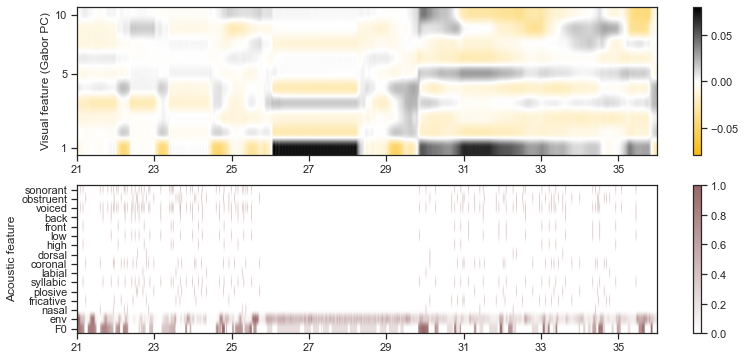

In [6]:
stim='insideout'
ntimes, npcs = gabor_stim[stim].shape

# Colormaps
cmap_audio = LinearSegmentedColormap.from_list('audio_cmap', ['white','#996666'])
cmap_visual = LinearSegmentedColormap.from_list('visual_cmap', ['#fcba03','white','black'])
# cmap_visual = cm.RdGy

# Feature labels for acoustic features
feat_labels = ['sonorant','obstruent','voiced','back','front',
               'low','high','dorsal','coronal','labial','syllabic',
               'plosive','fricative','nasal', 'env', 'F0']

# Start and end time in seconds
tstart = 21 
tend = 36
plt.figure(figsize=(13,6))
p=1
for stim in ['insideout']:#,'paddington']:
    plt.subplot(2,1,p)
    gabor = gabor_stim[stim][np.int(tstart*sfreq):np.int(tend*sfreq),:]
    #gabor = gabor/np.abs(gabor).max()
    plt.imshow(gabor.T, aspect='auto', cmap=cmap_visual, vmin=-0.08, vmax=0.08)
    xt=np.arange(0, gabor.shape[0]+sfreq*2, step=sfreq*2)
    xt=xt.astype(np.int)
    plt.gca().set_xticks(xt)
    plt.gca().set_xticklabels(np.arange(tstart, tend+2, 2))
    plt.gca().set_yticks([0,5,9])
    plt.gca().set_yticklabels([1,5,10])
    plt.gca().set_ylim([-0.5, 9.5])
    plt.gca().set_xlim([0, (tend-tstart)*sfreq])
    #plt.axvline((13.6-12)*128)
    plt.ylabel('Visual feature (Gabor PC)')
    plt.colorbar()
    p+=1

for stim in ['insideout']:#,'paddington']:
    times = np.linspace(0, ntimes/sfreq, ntimes)
    plt.subplot(2,1,p)
    phnfeat = phnfeat_stim[stim][:,np.int(tstart*sfreq):np.int(tend*sfreq)].T
    env = np.atleast_2d(env_stim[stim][np.int(tstart*sfreq):np.int(tend*sfreq)])
    env = env/env.max()
    pitch = np.atleast_2d(pitch_stim[stim][np.int(tstart*sfreq):np.int(tend*sfreq)]).T
    pitch = pitch/pitch.max()
    
    stim_stacked = np.hstack((phnfeat,env,pitch))
    
    plt.imshow(stim_stacked.T, aspect='auto', cmap=cmap_audio)
    xt=np.arange(0, gabor.shape[0]+sfreq*2, step=sfreq*2)
    xt=xt.astype(np.int)
    #print(xt)
    plt.gca().set_xticks(xt)
    plt.gca().set_xticklabels(np.arange(tstart, tend+2, 2))
    plt.gca().set_yticks(np.arange(16))
    plt.gca().set_yticklabels(feat_labels)
    plt.gca().set_ylim([-0.5, 15.5])
    plt.gca().set_xlim([0, (tend-tstart)*sfreq])
    plt.gca().invert_yaxis()
    plt.ylabel('Acoustic feature')
    plt.colorbar()
    p+=1 

# plt.savefig('%s/Fig5_audiovisual_features_insideout.pdf'%save_dir)

## Load the actual Gabor wavelets and plot some examples

This shows what the original Gabor wavelets look like before we do PCA on them to get the first 10 principal components. 
Essentially, each Gabor wavelet is a drifting grating with a certain spatial and temporal frequency. The spatial frequency is how many stripes there are in space, the temporal frequency is how much they change or move over time. We have some features that are static (the first few, for example, are just blobs that appear in an image at different scales, like a big circle or a little tiny thing on the screen). The others have motion, so they could represent a large object moving quickly or slowly.

In [ ]:
gabors = loadmat('/Users/liberty/Documents/Austin/code/MovieTrailerGabors/hamilton_insideout-usca_gabors_case1.mat')
nx,ny,nt,ng = gabors['gab'].shape
print("The shape of the gabors is %d pixels by %d pixels in space x %d time slices x %d gabor wavelets"%(nx,ny,nt,ng))

In [ ]:
gab_nums = [0, 2, 7, 11,1000,1302,1305,1308,2104,2138] #1308

p = 1
plt.figure(figsize=(5,10))
fps=24 # Frames per second for movies (visual sampling rate)
t = np.arange(0,1,1/fps)
for g in gab_nums:
    #plt.figure()
    for i in np.arange(10):
        plt.subplot(20,10,p)
        plt.imshow(gabors['gab'][:,:,i,g], vmin=-1, vmax=1,cmap=cm.Greys_r)
        plt.axis('off')
        p += 1
        if g==0:
            plt.title('t=%.2f'%(t[i]),fontsize=8)
    
# plt.savefig('%s/Fig5_example_gabors.pdf'%(save_dir))

## Plot the example original Gabor matrix and the PCA version

This shows a matrix of all possible Gabor wavelets over time and how they appear in the movie. There are 2139 total Gabors, only 20 are shown in the plot above. Then, we reduce the dimensionality of this matrix by doing PCA on it and selecting 10 components.

In [ ]:
tpts = np.arange(np.int(tstart*fps),np.int(tend*fps))

plt.figure(figsize=(4,2))
plt.subplot(1,2,1)
plt.imshow(gabors['S_fin'][np.int(tstart*fps):np.int(tend*fps),:].T, aspect='auto', vmin=-5, vmax=5, cmap=cmap_visual)
plt.gca().set_xticks([0, len(tpts)])
plt.gca().set_xticklabels([tstart, tend])
plt.gca().set_ylim([-0.5, gabors['S_fin'].shape[1]])
plt.ylabel('Gabor wavelet #')
plt.xlabel('Time (s)')
plt.colorbar()

tpts2 = np.arange(np.int(tstart*sfreq),np.int(tend*sfreq))
plt.subplot(1,2,2)
plt.imshow(gabor_stim['insideout'][np.int(tstart*sfreq):np.int(tend*sfreq),:].T, aspect='auto',vmin=-0.08, vmax=0.08,
           cmap=cmap_visual)
plt.gca().set_xticks([0, len(tpts2)])
plt.gca().set_xticklabels([tstart, tend])
plt.gca().set_yticks([0,5,9])
plt.gca().set_yticklabels([1,6,10])
plt.gca().set_ylim([-0.5, 9.5])
plt.xlabel('Time (s)')
plt.ylabel('Gabor PC')
plt.colorbar()

plt.tight_layout()
# plt.savefig('%s//Fig5_gabor_PCA.pdf'%(save_dir))

# Figure 5D

In [3]:
subject_list = create_subject_list(path+'/participants')
print(subject_list)
print(data_dir)

['MT0001', 'MT0002', 'MT0003', 'MT0004', 'MT0005', 'MT0006', 'MT0008', 'MT0009', 'MT0010', 'MT0011', 'MT0012', 'MT0013', 'MT0014', 'MT0015', 'MT0016', 'MT0017']
/Users/md42732/Box/generalizable_EEG_manuscript/data/participants


3
[812 190 842 744 712 700 711 340 847 812]
[839 190 762 812 847 936 324 680 711 700  26 626 839]


(-0.04277046582692101,
 1.0240399484541014,
 -0.12544571424982615,
 0.9413647000311962)

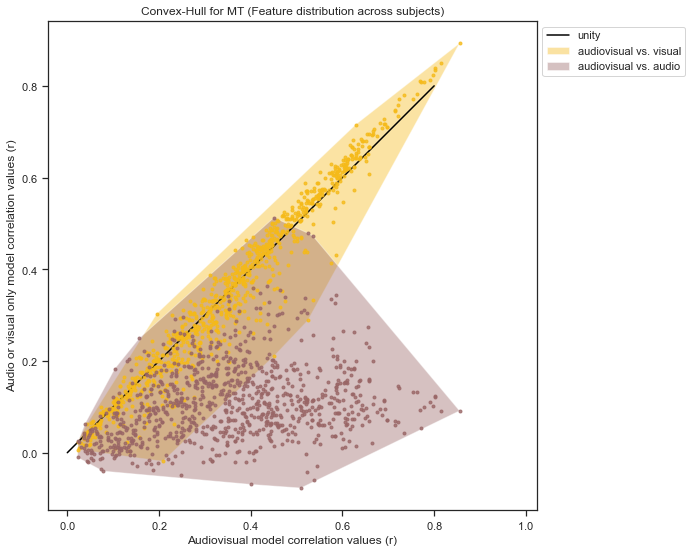

In [3]:
stimulus_class = 'MT'
fig = plt.figure(figsize=(15,9))
plt.plot([0.0, 0.8], [0.0, 0.8], 'black', label='unity') 
corrs = []
corrs_sig = []
#corrs_nonsig = []
#plot audio only vs audiovisual

for idx, s in enumerate(subject_list):
    f = h5py.File('%s/%s/%s_STRF_by_phnfeat_MT.hf5'%(data_dir, s, s), 'r')
    cc_max=f['/cc_max_mt'][:]
    with h5py.File('%s/%s/%s_STRF_by_pitchenvsphnfeatgabor10pc_sc_%s.hf5'%(data_dir, s, s, stimulus_class), 'r') as fh: #full audiovisual model: auditory + scene cut + gabpr
        corrs_audiovisual = fh['corrs_%s' %(stimulus_class.lower())][:]/cc_max
        p_vals_audiovisual =  fh['pvals_%s' %(stimulus_class.lower())][:]
        #audiovisual_nonsig = (corrs_audiovisual[np.where(p_vals_audiovisual[0] > 0.05)])
        audiovisual_sig = (corrs_audiovisual[np.where(p_vals_audiovisual[0] < 0.05)])
        
    with h5py.File('%s/%s/%s_STRF_by_scene_cut_gabor_%s.hf5'%(data_dir, s, s, stimulus_class), 'r') as fh: #full visual model
        corrs_visual = fh['corrs_%s' %(stimulus_class.lower())][:]/cc_max 
        p_vals_visual =  fh['pvals_%s' %(stimulus_class.lower())][:]
        #visual_nonsig = (corrs_visual[np.where(p_vals_audiovisual[0] > 0.05)])
        visual_sig = (corrs_visual[np.where(p_vals_audiovisual[0] < 0.05)])
    
    with h5py.File('%s/%s/%s_STRF_by_pitchenvsphnfeat_%s.hf5'%(data_dir, s, s, stimulus_class), 'r') as fh: #full auditory model
        corrs_audio = fh['corrs_%s' %(stimulus_class.lower())][:]/cc_max
        p_vals_audio =  fh['pvals_%s' %(stimulus_class.lower())][:]
        #audio_nonsig = (corrs_audio[np.where(p_vals_audiovisual[0] > 0.05)])
        audio_sig = (corrs_audio[np.where(p_vals_audiovisual[0] < 0.05)])

    corrs.append([corrs_audiovisual, corrs_visual, corrs_audio])
    #corrs_nonsig.append([audiovisual_nonsig, visual_nonsig, audio_nonsig])
    corrs_sig.append([audiovisual_sig,visual_sig, audio_sig])
    
points = np.hstack(corrs).T
points_sig = np.hstack(corrs_sig).T
#points_nonsig = np.hstack(corrs_nonsig).T

print(points.shape[1])

hull1=ConvexHull(np.vstack((points_sig[:,0] , points_sig[:,1])).T)
hullv1 = hull1.vertices.copy()
hullv1 = np.append(hullv1, hullv1[0])
print(hullv1)

hull2=ConvexHull(np.vstack((points_sig[:,0] , points_sig[:,2])).T)
hullv2 = hull2.vertices.copy()
hullv2 = np.append(hullv2, hullv2[0])
print(hullv2)

plt.fill(points_sig[hullv1,0], points_sig[hullv1,1], facecolor='#f5ba19', alpha=0.4, zorder=1, label='audiovisual vs. visual') #envs

plt.fill(points_sig[hullv2,0], points_sig[hullv2,2], facecolor='#996666', alpha=0.4, zorder=2, label='audiovisual vs. audio') #pitch


    
plt.plot(points_sig[:,0], points_sig[:,1], '.', color='#f5ba19', alpha=0.8) 
plt.plot(points_sig[:,0], points_sig[:,2], '.', color='#996666', alpha=0.8) 

# plt.plot(points_nonsig[:,0], points_nonsig[:,1], '.', color='#DCDBDB', alpha=0.8) 
# plt.plot(points_nonsig[:,0], points_nonsig[:,2], '.', color='#DCDBDB', alpha=0.8) 

plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.xlabel('Audiovisual model correlation values (r)')
plt.ylabel('Audio or visual only model correlation values (r)')
plt.title('Convex-Hull for %s (Feature distribution across subjects)' %(stimulus_class))
plt.axis('square') 


# plt.savefig('%s/audiovis_aud-vis_only_convexHull_w/SceneCuts.pdf' %(save_dir))

# Figure 5E (Bar plot + Venn Diagram)

In [5]:
stimulus_class = 'MT'

variance_partition = []

for idx, s in enumerate(subject_list):
    f = h5py.File('%s/%s/%s_STRF_by_phnfeat_MT.hf5'%(data_dir, s, s), 'r')
    cc_max=f['/cc_max_mt'][:]
    with h5py.File('%s/%s/%s_STRF_by_pitchenvsphnfeat_%s.hf5'%(data_dir, s, s, stimulus_class), 'r') as h: #full auditory model
        corr_full = h['corrs_%s' %(stimulus_class.lower())][:]/cc_max
        p_val_full = h['pvals_%s' %(stimulus_class.lower())][:]  
    with h5py.File('%s/%s/%s_STRF_by_pitchenvsphnfeatgabor10pc_sc_%s.hf5'%(data_dir, s, s, stimulus_class), 'r') as h: #full + gabor model
        corr_gabor = h['corrs_%s' %(stimulus_class.lower())][:]/cc_max
        p_val_gabor = h['pvals_%s' %(stimulus_class.lower())][:]  
    with h5py.File('%s/%s/%s_STRF_by_scene_cut_gabor_%s.hf5'%(data_dir, s, s, stimulus_class), 'r') as h: #gabor only model
        corr_gabor_only = h['corrs_%s' %(stimulus_class.lower())][:]/cc_max
        p_val_gabor_only = h['pvals_%s' %(stimulus_class.lower())][:]  
    sig_corrs_gabor = ([np.where (p_val_gabor[0] < 0.05)])
    gabor_model = corr_gabor[sig_corrs_gabor]
    full_model = corr_full[sig_corrs_gabor]
    dummy = np.zeros(full_model.shape)
#     print(dummy.shape)
#     print(full_model.shape)
    gabor_only = corr_gabor_only[sig_corrs_gabor]
    variance_partition.append(np.array([full_model, gabor_only, dummy, gabor_model, dummy, dummy, dummy]))

/anaconda3/envs/mne/lib/python3.6/site-packages/ipykernel_launcher.py:18: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
/anaconda3/envs/mne/lib/python3.6/site-packages/ipykernel_launcher.py:19: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
/anaconda3/envs/mne/lib/python3.6/site-packages/ipykernel_launcher.py:23: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result eith

In [6]:
rsq_corr = lambda c: (c ** 2) * np.sign(c)
venn_diagram = []
for idx, s in enumerate(subject_list):
    corr_est = np.squeeze(variance_partition[idx])
#     print(corr_est.shape)
    corr_biases, corr_orig_parts, corr_fixed_parts = correct_rsqs(rsq_corr(np.array(corr_est)), neg_only=False)
    venn_diagram.append(corr_fixed_parts.mean(1))



0 / 48
0 / 64
0 / 63
0 / 64
0 / 63
0 / 61
0 / 64
0 / 62
0 / 64
0 / 58
0 / 62
0 / 57
0 / 27
0 / 63
0 / 62
0 / 62


## Venn Diagram

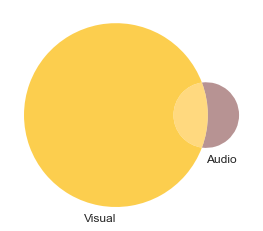

In [7]:
from matplotlib_venn import venn2
venn_avg = np.array(venn_diagram).mean(0)
v=venn2(subsets = (venn_avg[1], venn_avg[0], venn_avg[3]), set_labels = ('Visual', 'Audio', 'Audiovisual'), 
        set_colors=('#fcba03', '#996666'), alpha=0.7)
for idx, subset in enumerate(v.subset_labels):
    v.subset_labels[idx].set_visible(False)
    
# plt.savefig('%s/gabor_vennDiagram_w/SceneCut.pdf' %(save_dir))

## Barplot

<Figure size 1440x576 with 0 Axes>

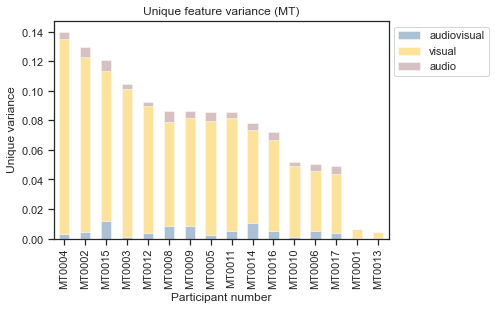

In [8]:
n_groups = len(subject_list)
opacity=0.4


plt.figure(figsize=(20,8))


index = np.arange(n_groups)

bar_width = 0.28


audio = []
visual = []
audioVisual = []

for idx, s in enumerate(subject_list):
    visual.append(venn_diagram[idx][1]) #visual only - [1]
    audio.append(venn_diagram[idx][0]) #audio only - [0]
    audioVisual.append(venn_diagram[idx][3]) #audio/visual - [3]

df = pd.DataFrame(list(zip(audio, visual, audioVisual, np.array(audio) + np.array(visual) + np.array(audioVisual))), 
columns=['audiovisual','visual', 'audio',  'sum']) #create dataframe from list
df.index = subject_list 

my_colors = ['#336699','#fcba03', '#996666']
df.sort_values(by='sum', ascending=False)[['audiovisual','visual', 'audio']].plot(kind='bar', stacked=True, color=my_colors, alpha=opacity, width=0.5)


plt.xlabel('Participant number')
plt.ylabel('Unique variance')
plt.title('Unique feature variance (%s)' %(stimulus_class))

#plt.xticks(np.arange(len(subject_list)), np.array(subject_list), rotation=90)

plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
# plt.savefig('%s/gabor_barplot.pdf' %(save_dir))

# Figure 5F

In [4]:
subject_list.remove('MT0017')
print(subject_list)

['MT0001', 'MT0002', 'MT0003', 'MT0004', 'MT0005', 'MT0006', 'MT0008', 'MT0009', 'MT0010', 'MT0011', 'MT0012', 'MT0013', 'MT0014', 'MT0015', 'MT0016']


*************************
Now processing MT0001
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fgrw0_si1990.wav', 'fhlm0_si1560.wav', 'fisb0_si2209.wav', 'fjas0_si2030.wav', 'fjhk0_si1652.wav', 'fjkl0_si1562.wav', 'fjk

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
pitch_mat shape is:
(1, 289)
taking the mean across repeats
(64, 289)
fdjh0_si1565.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
fdml0_si2075.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
fdms0_si1218.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
pitch_mat shape is:
(1, 331)
taking the mean across repeats
(64, 331)
fdrd1_si1544.wav
phnfeatmat shape is:
(14, 332)
envs shape is:
(332, 1)
pitch_mat shape is:
(1, 332)
taking the mean across repeats
(64, 332)
fdrw0_si1423.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
pitch_mat shape is:
(1, 308)
taking the mean across repeats
(64, 308)
fdxw0_si1511.wav
phnfeatmat shape is:
(14, 262)
envs shape is:
(262, 1)
pitch_mat shape is:
(1, 262)
taking the mean across repeats
(64, 2

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 317)
fgjd0_si1179.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
pitch_mat shape is:
(1, 263)
taking the mean across repeats
(64, 263)
fgmd0_si2107.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
pitch_mat shape is:
(1, 263)
taking the mean across repeats
(64, 263)
fgrw0_si1990.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
pitch_mat shape is:
(1, 295)
taking the mean across repeats
(64, 295)
fhlm0_si1560.wav
phnfeatmat shape is:
(14, 192)
envs shape is:
(192, 1)
pitch_mat shape is:
(1, 192)
taking the mean across repeats
(64, 192)
fisb0_si2209.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
pitch_mat shape is:
(1, 228)
taking the mean across repeats
(64, 228)
fjas0_si2030.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
pitch_mat shape is:
(1, 300)
taking the mean across repeats
(64, 300)
fjhk0_si1652.wav
phnfeatmat shape is:
(14, 204)
envs shape is:
(204, 1)
pitch_mat shape is:
(1, 204)
taking the mean across repeats
(64, 2

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 256)
fklc1_si1678.wav
phnfeatmat shape is:
(14, 240)
envs shape is:
(240, 1)
pitch_mat shape is:
(1, 240)
taking the mean across repeats
(64, 240)
fklc1_si2308.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
pitch_mat shape is:
(1, 233)
taking the mean across repeats
(64, 233)
flac0_si2161.wav
phnfeatmat shape is:
(14, 199)
envs shape is:
(199, 1)
pitch_mat shape is:
(1, 199)
taking the mean across repeats
(64, 199)
flas0_si1026.wav
phnfeatmat shape is:
(14, 243)
envs shape is:
(243, 1)
pitch_mat shape is:
(1, 243)
taking the mean across repeats
(64, 243)
flja0_si1708.wav
phnfeatmat shape is:
(14, 197)
envs shape is:
(197, 1)
pitch_mat shape is:
(1, 197)
taking the mean across repeats
(64, 197)
flja0_si2338.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
pitch_mat shape is:
(1, 220)
taking the mean across repeats
(64, 220)
fljd0_si2146.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 3

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 304)
fmjf0_si1884.wav
phnfeatmat shape is:
(14, 260)
envs shape is:
(260, 1)
pitch_mat shape is:
(1, 260)
taking the mean across repeats
(64, 260)
fmju0_si2019.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 254)
fmkc0_si1702.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
fmld0_si925.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
fnkl0_si2152.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
fnlp0_si678.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
pitch_mat shape is:
(1, 263)
taking the mean across repeats
(64, 263)
fntb0_si573.wav
phnfeatmat shape is:
(14, 333)
envs shape is:
(333, 1)
pitch_mat shape is:
(1, 333)
taking the mean across repeats
(64, 333)

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
pitch_mat shape is:
(1, 215)
taking the mean across repeats
(64, 215)
fsbk0_si1699.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
pitch_mat shape is:
(1, 213)
taking the mean across repeats
(64, 213)
fsdc0_si2234.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
pitch_mat shape is:
(1, 187)
taking the mean across repeats
(64, 187)
fsdj0_si485.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
pitch_mat shape is:
(1, 264)
taking the mean across repeats
(64, 264)
fsjk1_si2285.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
pitch_mat shape is:
(1, 256)
taking the mean across repeats
(64, 256)
fsjs0_si1171.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
pitch_mat shape is:
(1, 286)
taking the mean across repeats
(64, 286)
fskp0_si1728.wav
phnfeatmat shape is:
(14, 322)
envs shape is:
(322, 1)
pitch_mat shape is:
(1, 322)
taking the mean across repeats
(64, 322)
fslb1_si644.wav
phnfeatm

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

pitch_mat shape is:
(1, 143)
taking the mean across repeats
(64, 143)
majc0_si2095.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
pitch_mat shape is:
(1, 318)
taking the mean across repeats
(64, 318)
makr0_si1352.wav
phnfeatmat shape is:
(14, 278)
envs shape is:
(278, 1)
pitch_mat shape is:
(1, 278)
taking the mean across repeats
(64, 278)
makr0_si722.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
pitch_mat shape is:
(1, 264)
taking the mean across repeats
(64, 264)
marc0_si1188.wav
phnfeatmat shape is:
(14, 184)
envs shape is:
(184, 1)
pitch_mat shape is:
(1, 184)
taking the mean across repeats
(64, 184)
marc0_si1818.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
pitch_mat shape is:
(1, 281)
taking the mean across repeats
(64, 281)
marw0_si646.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
mbbr0_si1685.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
pitch_ma

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mcmb0_si1898.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mcrc0_si1092.wav
phnfeatmat shape is:
(14, 223)
envs shape is:
(223, 1)
pitch_mat shape is:
(1, 223)
taking the mean across repeats
(64, 223)
mcth0_si1839.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
pitch_mat shape is:
(1, 270)
taking the mean across repeats
(64, 270)
mctm0_si720.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mctt0_si1144.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
pitch_mat shape is:
(1, 228)
taking the mean across repeats
(64, 228)
mctw0_si2003.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mctw0_si743.wav
phnfeatmat shape is:
(14, 317)
envs sha

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 195)
mdlc2_si2244.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
pitch_mat shape is:
(1, 194)
taking the mean across repeats
(64, 194)
mdld0_si1543.wav
phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
pitch_mat shape is:
(1, 287)
taking the mean across repeats
(64, 287)
mdlf0_si2213.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
pitch_mat shape is:
(1, 252)
taking the mean across repeats
(64, 252)
mdls0_si2258.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
pitch_mat shape is:
(1, 196)
taking the mean across repeats
(64, 196)
mdls0_si998.wav
phnfeatmat shape is:
(14, 197)
envs shape is:
(197, 1)
pitch_mat shape is:
(1, 197)
taking the mean across repeats
(64, 197)
mdma0_si1238.wav
phnfeatmat shape is:
(14, 276)
envs shape is:
(276, 1)
pitch_mat shape is:
(1, 276)
taking the mean across repeats
(64, 276)
mdmt0_si2341.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
pitch_mat shape is:
(1, 196)
taking the mean across repeats
(64, 19

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 329)
mdss1_si1713.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
pitch_mat shape is:
(1, 194)
taking the mean across repeats
(64, 194)
mdtb0_si1200.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
pitch_mat shape is:
(1, 250)
taking the mean across repeats
(64, 250)
mdtb0_si1830.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
pitch_mat shape is:
(1, 269)
taking the mean across repeats
(64, 269)
mdvc0_si2174.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mdwa0_si1445.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mdwd0_si557.wav
phnfeatmat shape is:
(14, 191)
envs shape is:
(191, 1)
pitch_mat shape is:
(1, 191)
taking the mean across repeats
(64, 191)
mdwh0_si1925.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
pitch_mat shape is:
(1, 290)
taking the mean across repeats
(64, 29

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mjar0_si2247.wav
phnfeatmat shape is:
(14, 175)
envs shape is:
(175, 1)
pitch_mat shape is:
(1, 175)
taking the mean across repeats
(64, 175)
mjbg0_si1724.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mjda0_si1661.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
pitch_mat shape is:
(1, 302)
taking the mean across repeats
(64, 302)
mjdc0_si1161.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
pitch_mat shape is:
(1, 295)
taking the mean across repeats
(64, 295)
mjdc0_si2165.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mjdg0_si1705.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
pitch_mat shape is:
(1, 288)
taking the mean across repeats
(64, 288)
mjdh0_si1984.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
pitch_mat shape is:
(1, 269)
taking the mean across repeats
(64, 269)
mjmm0_si625.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
pitch_mat shape is:
(1, 303)
taking the mean across repeats
(64, 303)
mjmp0_si1535.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
pitch_mat shape is:
(1, 302)
taking the mean across repeats
(64, 302)
mjpg0_si1191.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
mjpm1_si1897.wav
phnfeatmat shape is:
(14, 183)
envs shape is:
(183, 1)
pitch_mat shape is:
(1, 183)
taking the mean across repeats
(64, 183)
mjpm1_si2280.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
pitch_mat shape is:
(1, 246)
taking the mean across repeats
(64, 246)
mjrf0_si1114.wav
phnfeatmat shape is:
(14, 164)
envs shape is:
(164, 1)
pitch_mat shape is:
(1, 164)
taking the mean across repeats
(64, 164)
mjrg0_si1996.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

envs shape is:
(213, 1)
pitch_mat shape is:
(1, 213)
taking the mean across repeats
(64, 213)
mkdb0_si588.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mkjl0_si470.wav
phnfeatmat shape is:
(14, 219)
envs shape is:
(219, 1)
pitch_mat shape is:
(1, 219)
taking the mean across repeats
(64, 219)
mklr0_si1689.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
mklr0_si2319.wav
phnfeatmat shape is:
(14, 221)
envs shape is:
(221, 1)
pitch_mat shape is:
(1, 221)
taking the mean across repeats
(64, 221)
mkls0_si1533.wav
phnfeatmat shape is:
(14, 248)
envs shape is:
(248, 1)
pitch_mat shape is:
(1, 248)
taking the mean across repeats
(64, 248)
mklt0_si1213.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
pitch_mat shape is:
(1, 318)
taking the mean across repeats
(64, 318)
mklt0_si583.wav
phnfeatmat shape is:
(14, 294)
envs shap

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mmds0_si1973.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
pitch_mat shape is:
(1, 176)
taking the mean across repeats
(64, 176)
mmea0_si2018.wav
phnfeatmat shape is:
(14, 130)
envs shape is:
(130, 1)
pitch_mat shape is:
(1, 130)
taking the mean across repeats
(64, 130)
mmeb0_si1987.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
mmeb0_si727.wav
phnfeatmat shape is:
(14, 277)
envs shape is:
(277, 1)
pitch_mat shape is:
(1, 277)
taking the mean across repeats
(64, 277)
mmgk0_si1952.wav
phnfeatmat shape is:
(14, 161)
envs shape is:
(161, 1)
pitch_mat shape is:
(1, 161)
taking the mean across repeats
(64, 161)
mmjb1_si778.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
pitch_mat shape is:
(1, 331)
taking the mean across repeats
(64, 331)
mmlm0_si1527.wav
phnfeatmat shape is:
(14, 158)
envs sha

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 299)
mprt0_si495.wav
phnfeatmat shape is:
(14, 224)
envs shape is:
(224, 1)
pitch_mat shape is:
(1, 224)
taking the mean across repeats
(64, 224)
mpsw0_si2327.wav
phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
pitch_mat shape is:
(1, 268)
taking the mean across repeats
(64, 268)
mrab0_si1224.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mram0_si1905.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
pitch_mat shape is:
(1, 315)
taking the mean across repeats
(64, 315)
mrbc0_si1665.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mrcs0_si1223.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
pitch_mat shape is:
(1, 258)
taking the mean across repeats
(64, 258)
mrdm0_si1595.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 32

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_


(14, 192)
envs shape is:
(192, 1)
pitch_mat shape is:
(1, 192)
taking the mean across repeats
(64, 192)
mrjh0_si914.wav
phnfeatmat shape is:
(14, 271)
envs shape is:
(271, 1)
pitch_mat shape is:
(1, 271)
taking the mean across repeats
(64, 271)
mrjm0_si1095.wav
phnfeatmat shape is:
(14, 278)
envs shape is:
(278, 1)
pitch_mat shape is:
(1, 278)
taking the mean across repeats
(64, 278)
mrjm4_si1489.wav
phnfeatmat shape is:
(14, 244)
envs shape is:
(244, 1)
pitch_mat shape is:
(1, 244)
taking the mean across repeats
(64, 244)
mrjm4_si2119.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
pitch_mat shape is:
(1, 286)
taking the mean across repeats
(64, 286)
mrjo0_si1624.wav
phnfeatmat shape is:
(14, 209)
envs shape is:
(209, 1)
pitch_mat shape is:
(1, 209)
taking the mean across repeats
(64, 209)
mrjs0_si1523.wav
phnfeatmat shape is:
(14, 146)
envs shape is:
(146, 1)
pitch_mat shape is:
(1, 146)
taking the mean across repeats
(64, 146)
mrjt0_si1805.wav
phnfeatmat shape is:
(14, 2

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
pitch_mat shape is:
(1, 289)
taking the mean across repeats
(64, 289)
msah1_si1049.wav
phnfeatmat shape is:
(14, 306)
envs shape is:
(306, 1)
pitch_mat shape is:
(1, 306)
taking the mean across repeats
(64, 306)
msah1_si1679.wav
phnfeatmat shape is:
(14, 189)
envs shape is:
(189, 1)
pitch_mat shape is:
(1, 189)
taking the mean across repeats
(64, 189)
msdb0_si2267.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 254)
msdh0_si2113.wav
phnfeatmat shape is:
(14, 164)
envs shape is:
(164, 1)
pitch_mat shape is:
(1, 164)
taking the mean across repeats
(64, 164)
msdh0_si2240.wav
phnfeatmat shape is:
(14, 184)
envs shape is:
(184, 1)
pitch_mat shape is:
(1, 184)
taking the mean across repeats
(64, 184)
msjs1_si1899.wav
phnfeatmat shape is:
(14, 185)
envs shape is:
(185, 1)
pitch_mat shape is:
(1, 185)
taking the mean across repeats
(64, 185)
mslb0_si1193.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 326)
mtpr0_si506.wav
phnfeatmat shape is:
(14, 235)
envs shape is:
(235, 1)
pitch_mat shape is:
(1, 235)
taking the mean across repeats
(64, 235)
mtqc0_si480.wav
phnfeatmat shape is:
(14, 311)
envs shape is:
(311, 1)
pitch_mat shape is:
(1, 311)
taking the mean across repeats
(64, 311)
mtrc0_si1623.wav
phnfeatmat shape is:
(14, 276)
envs shape is:
(276, 1)
pitch_mat shape is:
(1, 276)
taking the mean across repeats
(64, 276)
mtrc0_si993.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
mtwh0_si1629.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mtxs0_si1690.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
pitch_mat shape is:
(1, 222)
taking the mean across repeats
(64, 222)
mvrw0_si2115.wav
phnfeatmat shape is:
(14, 157)
envs shape is:
(157, 1)
pitch_mat shape is:
(1, 157)
taking the mean across repeats
(64, 157)

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 193)
fbjl0_si2182.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
pitch_mat shape is:
(1, 318)
taking the mean across repeats
(64, 318)
fbmh0_si1766.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
pitch_mat shape is:
(1, 300)
taking the mean across repeats
(64, 300)
fbmj0_si815.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
pitch_mat shape is:
(1, 273)
taking the mean across repeats
(64, 273)
fcag0_si1503.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
pitch_mat shape is:
(1, 294)
taking the mean across repeats
(64, 294)
fcag0_si1641.wav
phnfeatmat shape is:
(14, 192)
envs shape is:
(192, 1)
pitch_mat shape is:
(1, 192)
taking the mean across repeats
(64, 192)
fcaj0_si1479.wav
phnfeatmat shape is:
(14, 177)
envs shape is:
(177, 1)
pitch_mat shape is:
(1, 177)
taking the mean across repeats
(64, 177)
fcaj0_si1804.wav
phnfeatmat shape is:
(14, 232)
envs shape is:
(232, 1)
pitch_mat shape is:
(1, 232)
taking the mean across repeats
(64, 23

envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
flmk0_si2295.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
pitch_mat shape is:
(1, 325)
taking the mean across repeats
(64, 325)
flod0_si1917.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
pitch_mat shape is:
(1, 320)
taking the mean across repeats
(64, 320)
fltm0_si1070.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
pitch_mat shape is:
(1, 270)
taking the mean across repeats
(64, 270)
fltm0_si2330.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 254)
fmah0_si1289.wav
phnfeatmat shape is:
(14, 239)
envs shape is:
(239, 1)
pitch_mat shape is:
(1, 239)
taking the mean across repeats
(64, 239)
fmbg0_si1790.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
pitch_mat shape is:
(1, 300)
taking the mean across repeats
(64, 300)
fmbg0_si2264.wav
phnfeatmat shape is:
(14, 265)
envs s

(64, 329)
mbom0_si2274.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mbpm0_si1577.wav
phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
pitch_mat shape is:
(1, 253)
taking the mean across repeats
(64, 253)
mbth0_si757.wav
phnfeatmat shape is:
(14, 271)
envs shape is:
(271, 1)
pitch_mat shape is:
(1, 271)
taking the mean across repeats
(64, 271)
mbwm0_si1934.wav
phnfeatmat shape is:
(14, 141)
envs shape is:
(141, 1)
pitch_mat shape is:
(1, 141)
taking the mean across repeats
(64, 141)
mbwp0_si1531.wav
phnfeatmat shape is:
(14, 203)
envs shape is:
(203, 1)
pitch_mat shape is:
(1, 203)
taking the mean across repeats
(64, 203)
mcal0_si508.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
mccs0_si2099.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330

(64, 214)
mesg0_si1962.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
pitch_mat shape is:
(1, 250)
taking the mean across repeats
(64, 250)
mesj0_si2257.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
pitch_mat shape is:
(1, 291)
taking the mean across repeats
(64, 291)
mewm0_si1348.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
mfer0_si2122.wav
phnfeatmat shape is:
(14, 172)
envs shape is:
(172, 1)
pitch_mat shape is:
(1, 172)
taking the mean across repeats
(64, 172)
mfrm0_si1717.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
pitch_mat shape is:
(1, 331)
taking the mean across repeats
(64, 331)
mfwk0_si1249.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mfwk0_si1879.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
pitch_mat shape is:
(1, 316)
taking the mean across repeats
(64, 3

(64, 248)
mklt0_si1213.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
pitch_mat shape is:
(1, 318)
taking the mean across repeats
(64, 318)
mklt0_si583.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
pitch_mat shape is:
(1, 294)
taking the mean across repeats
(64, 294)
mklw0_si1844.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
pitch_mat shape is:
(1, 198)
taking the mean across repeats
(64, 198)
mkxl0_si1185.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
mljc0_si1855.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
mlll0_si1993.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
mlns0_si1407.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
pitch_mat shape is:
(1, 288)
taking the mean across repeats
(64, 28

taking the mean across repeats
(64, 326)
mrvg0_si1770.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
pitch_mat shape is:
(1, 297)
taking the mean across repeats
(64, 297)
mrvg0_si510.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mrwa0_si1603.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
pitch_mat shape is:
(1, 308)
taking the mean across repeats
(64, 308)
mrws0_si1732.wav
phnfeatmat shape is:
(14, 221)
envs shape is:
(221, 1)
pitch_mat shape is:
(1, 221)
taking the mean across repeats
(64, 221)
mrxb0_si1585.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
pitch_mat shape is:
(1, 289)
taking the mean across repeats
(64, 289)
msah1_si1049.wav
phnfeatmat shape is:
(14, 306)
envs shape is:
(306, 1)
pitch_mat shape is:
(1, 306)
taking the mean across repeats
(64, 306)
msah1_si1679.wav
phnfeatmat shape is:
(14, 189)
envs shape is:
(189, 1)
pitch_mat shape is:
(1, 189)
taking 

/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py:69: RuntimeWarning: This filename (/Users/md42732/Box/generalizable_EEG_manuscript/data/participants/MT0001/downsampled_128/MT0001_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz or raw_tsss.fif.gz
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 450328 =      0.000 ...  3518.188 secs
Ready.
Reading 0 ... 450328  =      0.000 ...  3518.188 secs...
*************************
Now processing MT0002
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

pitch_mat shape is:
(1, 196)
taking the mean across repeats
(64, 196)
fcmh1_si1493.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fcmr0_si1735.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
fcmr0_si475.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
pitch_mat shape is:
(1, 249)
taking the mean across repeats
(64, 249)
fcrh0_si1718.wav
phnfeatmat shape is:
(14, 218)
envs shape is:
(218, 1)
pitch_mat shape is:
(1, 218)
taking the mean across repeats
(64, 218)
fcrz0_si2053.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
pitch_mat shape is:
(1, 325)
taking the mean across repeats
(64, 325)
fdas1_si2091.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_m

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
pitch_mat shape is:
(1, 304)
taking the mean across repeats
(64, 304)
fear0_si1882.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
pitch_mat shape is:
(1, 261)
taking the mean across repeats
(64, 261)
fedw0_si1653.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
fetb0_si1148.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
fgcs0_si856.wav
phnfeatmat shape is:
(14, 317)
envs shape is:
(317, 1)
pitch_mat shape is:
(1, 317)
taking the mean across repeats
(64, 317)
fgjd0_si1179.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
pitch_mat shape is:
(1, 263)
taking the mean across repeats
(64, 263)
fgmd0_si2107.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
pitch_mat shape is:
(1, 263)
taking the mean across repeats
(64, 263)
fgrw0_si1990.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_


(14, 187)
envs shape is:
(187, 1)
pitch_mat shape is:
(1, 187)
taking the mean across repeats
(64, 187)
fjre0_si1746.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
fjrp1_si802.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
fjsj0_si2114.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
fjsj0_si854.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
fjsp0_si1763.wav
phnfeatmat shape is:
(14, 160)
envs shape is:
(160, 1)
pitch_mat shape is:
(1, 160)
taking the mean across repeats
(64, 160)
fjwb1_si2055.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
fkfb0_si2238.wav
phnfeatmat shape is:
(14, 28

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 237)
flmk0_si2295.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
pitch_mat shape is:
(1, 325)
taking the mean across repeats
(64, 325)
flod0_si1917.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
pitch_mat shape is:
(1, 320)
taking the mean across repeats
(64, 320)
fltm0_si1070.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
pitch_mat shape is:
(1, 270)
taking the mean across repeats
(64, 270)
fltm0_si2330.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 254)
fmah0_si1289.wav
phnfeatmat shape is:
(14, 239)
envs shape is:
(239, 1)
pitch_mat shape is:
(1, 239)
taking the mean across repeats
(64, 239)
fmbg0_si1790.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
pitch_mat shape is:
(1, 300)
taking the mean across repeats
(64, 300)
fmbg0_si2264.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
pitch_mat shape is:
(1, 265)
taking the mean across repeats
(64, 2

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_


(64, 274)
fpad0_si1976.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fpaz0_si1593.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
fpkt0_si2168.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
fpls0_si1590.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
fpmy0_si1783.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
freh0_si685.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
frew0_si1030.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
pitch_mat shape is:
(1, 194)
taking the mean across repeats
(64, 1

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fspm0_si611.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
pitch_mat shape is:
(1, 304)
taking the mean across repeats
(64, 304)
fsrh0_si1719.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
pitch_mat shape is:
(1, 187)
taking the mean across repeats
(64, 187)
fsrh0_si1931.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
fssb0_si2342.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
pitch_mat shape is:
(1, 195)
taking the mean across repeats
(64, 195)
ftaj0_si1329.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
pitch_mat shape is:
(1, 261)
taking the mean across repeats
(64, 261)
ftbw0_si1345.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
pitch_mat shape is:
(1, 291)
taking the mean across repeats
(64, 291)
ftmg0_si1532.wav
phnfeatmat shape is:
(14, 217)
envs sh

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_


(14, 264)
envs shape is:
(264, 1)
pitch_mat shape is:
(1, 264)
taking the mean across repeats
(64, 264)
marc0_si1188.wav
phnfeatmat shape is:
(14, 184)
envs shape is:
(184, 1)
pitch_mat shape is:
(1, 184)
taking the mean across repeats
(64, 184)
marc0_si1818.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
pitch_mat shape is:
(1, 281)
taking the mean across repeats
(64, 281)
marw0_si646.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
mbbr0_si1685.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
pitch_mat shape is:
(1, 325)
taking the mean across repeats
(64, 325)
mbbr0_si2315.wav
phnfeatmat shape is:
(14, 248)
envs shape is:
(248, 1)
pitch_mat shape is:
(1, 248)
taking the mean across repeats
(64, 248)
mbjk0_si545.wav
phnfeatmat shape is:
(14, 259)
envs shape is:
(259, 1)
pitch_mat shape is:
(1, 259)
taking the mean across repeats
(64, 259)
mbjv0_si1877.wav
phnfeatmat shape is:
(14, 29

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
mcdc0_si1922.wav
phnfeatmat shape is:
(14, 307)
envs shape is:
(307, 1)
pitch_mat shape is:
(1, 307)
taking the mean across repeats
(64, 307)
mchh0_si1634.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mclk0_si1660.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mcmb0_si1898.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mcrc0_si1092.wav
phnfeatmat shape is:
(14, 223)
envs shape is:
(223, 1)
pitch_mat shape is:
(1, 223)
taking the mean across repeats
(64, 223)
mcth0_si1839.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
pitch_mat shape is:
(1, 270)
taking the mean across repeats
(64, 270)
mctm0_si720.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mdas0_si1266.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
mdbb1_si1636.wav
phnfeatmat shape is:
(14, 234)
envs shape is:
(234, 1)
pitch_mat shape is:
(1, 234)
taking the mean across repeats
(64, 234)
mdcd0_si2045.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
mddc0_si2049.wav
phnfeatmat shape is:
(14, 182)
envs shape is:
(182, 1)
pitch_mat shape is:
(1, 182)
taking the mean across repeats
(64, 182)
mdef0_si2193.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
pitch_mat shape is:
(1, 308)
taking the mean across repeats
(64, 308)
mdhs0_si1530.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
mdhs0_si2160.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

taking the mean across repeats
(64, 252)
mdls0_si2258.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
pitch_mat shape is:
(1, 196)
taking the mean across repeats
(64, 196)
mdls0_si998.wav
phnfeatmat shape is:
(14, 197)
envs shape is:
(197, 1)
pitch_mat shape is:
(1, 197)
taking the mean across repeats
(64, 197)
mdma0_si1238.wav
phnfeatmat shape is:
(14, 276)
envs shape is:
(276, 1)
pitch_mat shape is:
(1, 276)
taking the mean across repeats
(64, 276)
mdmt0_si2341.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
pitch_mat shape is:
(1, 196)
taking the mean across repeats
(64, 196)
mdpk0_si1683.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
pitch_mat shape is:
(1, 249)
taking the mean across repeats
(64, 249)
mdpk0_si552.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
pitch_mat shape is:
(1, 213)
taking the mean across repeats
(64, 213)
mdrb0_si1174.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
pitch_mat shape is:
(1, 315)
taking t

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 291)
megj0_si1967.wav
phnfeatmat shape is:
(14, 174)
envs shape is:
(174, 1)
pitch_mat shape is:
(1, 174)
taking the mean across repeats
(64, 174)
mejl0_si1592.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
pitch_mat shape is:
(1, 321)
taking the mean across repeats
(64, 321)
mers0_si1649.wav
phnfeatmat shape is:
(14, 214)
envs shape is:
(214, 1)
pitch_mat shape is:
(1, 214)
taking the mean across repeats
(64, 214)
mesg0_si1962.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
pitch_mat shape is:
(1, 250)
taking the mean across repeats
(64, 250)
mesj0_si2257.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
pitch_mat shape is:
(1, 291)
taking the mean across repeats
(64, 291)
mewm0_si1348.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
mfer0_si2122.wav
phnfeatmat shape is:
(14, 172)
envs shape is:
(172, 1)
pitch_mat shape is:
(1, 172)
taking the mean across repeats
(64, 1

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

envs shape is:
(171, 1)
pitch_mat shape is:
(1, 171)
taking the mean across repeats
(64, 171)
mgrp0_si1947.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
pitch_mat shape is:
(1, 321)
taking the mean across repeats
(64, 321)
mgrt0_si2080.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
pitch_mat shape is:
(1, 297)
taking the mean across repeats
(64, 297)
mgsl0_si534.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
mhit0_si2243.wav
phnfeatmat shape is:
(14, 266)
envs shape is:
(266, 1)
pitch_mat shape is:
(1, 266)
taking the mean across repeats
(64, 266)
mhmr0_si1119.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mhpg0_si1720.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
pitch_mat shape is:
(1, 299)
taking the mean across repeats
(64, 299)
mhrm0_si1475.wav
phnfeatmat shape is:
(14, 222)
envs sh

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mjfc0_si1663.wav
phnfeatmat shape is:
(14, 307)
envs shape is:
(307, 1)
pitch_mat shape is:
(1, 307)
taking the mean across repeats
(64, 307)
mjfr0_si2235.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
mjhi0_si555.wav
phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
pitch_mat shape is:
(1, 268)
taking the mean across repeats
(64, 268)
mjjb0_si1277.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mjjb0_si1769.wav
phnfeatmat shape is:
(14, 328)
envs shape is:
(328, 1)
pitch_mat shape is:
(1, 328)
taking the mean across repeats
(64, 328)
mjjg0_si2263.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
pitch_mat shape is:
(1, 281)
taking the mean across repeats
(64, 281)
mjlb0_si2246.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_


(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mjrk0_si1662.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
pitch_mat shape is:
(1, 215)
taking the mean across repeats
(64, 215)
mjrk0_si2103.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mjrp0_si1835.wav
phnfeatmat shape is:
(14, 168)
envs shape is:
(168, 1)
pitch_mat shape is:
(1, 168)
taking the mean across repeats
(64, 168)
mjsw0_si1640.wav
phnfeatmat shape is:
(14, 210)
envs shape is:
(210, 1)
pitch_mat shape is:
(1, 210)
taking the mean across repeats
(64, 210)
mjth0_si1926.wav
phnfeatmat shape is:
(14, 284)
envs shape is:
(284, 1)
pitch_mat shape is:
(1, 284)
taking the mean across repeats
(64, 284)
mjvw0_si1758.wav
phnfeatmat shape is:
(14, 266)
envs shape is:
(266, 1)
pitch_mat shape is:
(1, 266)
taking the mean across repeats
(64, 266)
mjwg0_si2155.wav
phnfeatmat shape is:
(14, 

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 294)
mklw0_si1844.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
pitch_mat shape is:
(1, 198)
taking the mean across repeats
(64, 198)
mkxl0_si1185.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
mljc0_si1855.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
mlll0_si1993.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
mlns0_si1407.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
pitch_mat shape is:
(1, 288)
taking the mean across repeats
(64, 288)
mmab1_si1494.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
pitch_mat shape is:
(1, 198)
taking the mean across repeats
(64, 198)
mmab1_si2124.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 3

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 235)
mmdm2_si1555.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mmds0_si1973.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
pitch_mat shape is:
(1, 176)
taking the mean across repeats
(64, 176)
mmea0_si2018.wav
phnfeatmat shape is:
(14, 130)
envs shape is:
(130, 1)
pitch_mat shape is:
(1, 130)
taking the mean across repeats
(64, 130)
mmeb0_si1987.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
mmeb0_si727.wav
phnfeatmat shape is:
(14, 277)
envs shape is:
(277, 1)
pitch_mat shape is:
(1, 277)
taking the mean across repeats
(64, 277)
mmgk0_si1952.wav
phnfeatmat shape is:
(14, 161)
envs shape is:
(161, 1)
pitch_mat shape is:
(1, 161)
taking the mean across repeats
(64, 161)
mmjb1_si778.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
pitch_mat shape is:
(1, 331)
taking the mean across repeats
(64, 331

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mntw0_si2328.wav
phnfeatmat shape is:
(14, 225)
envs shape is:
(225, 1)
pitch_mat shape is:
(1, 225)
taking the mean across repeats
(64, 225)
mpam1_si1029.wav
phnfeatmat shape is:
(14, 241)
envs shape is:
(241, 1)
pitch_mat shape is:
(1, 241)
taking the mean across repeats
(64, 241)
mpar0_si946.wav
phnfeatmat shape is:
(14, 301)
envs shape is:
(301, 1)
pitch_mat shape is:
(1, 301)
taking the mean across repeats
(64, 301)
mpeb0_si1034.wav
phnfeatmat shape is:
(14, 188)
envs shape is:
(188, 1)
pitch_mat shape is:
(1, 188)
taking the mean across repeats
(64, 188)
mpfu0_si1888.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
pitch_mat shape is:
(1, 198)
taking the mean across repeats
(64, 198)
mpfu0_si628.wav
phnfeatmat shape is:
(14, 311)
envs shape is:
(311, 1)
pitch_mat shape is:
(1, 311)
taking the mean across repeats
(64, 311)
mpgh0_si924.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 258)
mrdm0_si1595.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mrds0_si1167.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mrem0_si961.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
pitch_mat shape is:
(1, 312)
taking the mean across repeats
(64, 312)
mres0_si1847.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mrew1_si1500.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
mrew1_si2130.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
pitch_mat shape is:
(1, 171)
taking the mean across repeats
(64, 171)
mrfk0_si1706.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
pitch_mat shape is:
(1, 194)
taking the mean across repeats
(64, 19

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

taking the mean across repeats
(64, 306)
msah1_si1679.wav
phnfeatmat shape is:
(14, 189)
envs shape is:
(189, 1)
pitch_mat shape is:
(1, 189)
taking the mean across repeats
(64, 189)
msdb0_si2267.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 254)
msdh0_si2113.wav
phnfeatmat shape is:
(14, 164)
envs shape is:
(164, 1)
pitch_mat shape is:
(1, 164)
taking the mean across repeats
(64, 164)
msdh0_si2240.wav
phnfeatmat shape is:
(14, 184)
envs shape is:
(184, 1)
pitch_mat shape is:
(1, 184)
taking the mean across repeats
(64, 184)
msjs1_si1899.wav
phnfeatmat shape is:
(14, 185)
envs shape is:
(185, 1)
pitch_mat shape is:
(1, 185)
taking the mean across repeats
(64, 185)
mslb0_si1193.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
pitch_mat shape is:
(1, 289)
taking the mean across repeats
(64, 289)
msmc0_si1907.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 233)
mtdp0_si1274.wav
phnfeatmat shape is:
(14, 226)
envs shape is:
(226, 1)
pitch_mat shape is:
(1, 226)
taking the mean across repeats
(64, 226)
mtdt0_si2254.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
pitch_mat shape is:
(1, 279)
taking the mean across repeats
(64, 279)
mtjg0_si2157.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
pitch_mat shape is:
(1, 176)
taking the mean across repeats
(64, 176)
mtjs0_si1192.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
pitch_mat shape is:
(1, 304)
taking the mean across repeats
(64, 304)
mtju0_si2269.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
pitch_mat shape is:
(1, 195)
taking the mean across repeats
(64, 195)
mtls0_si740.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
pitch_mat shape is:
(1, 281)
taking the mean across repeats
(64, 281)
mtpg0_si2013.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
pitch_mat shape is:
(1, 256)
taking the mean across repeats
(64, 25

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 313)
mwew0_si1361.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mwew0_si731.wav
phnfeatmat shape is:
(14, 257)
envs shape is:
(257, 1)
pitch_mat shape is:
(1, 257)
taking the mean across repeats
(64, 257)
mwjg0_si494.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
pitch_mat shape is:
(1, 290)
taking the mean across repeats
(64, 290)
mwre0_si2317.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
pitch_mat shape is:
(1, 303)
taking the mean across repeats
(64, 303)
mwrp0_si1525.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
mzmb0_si1796.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
pitch_mat shape is:
(1, 246)
taking the mean across repeats
(64, 246)
For the cross-prediction from MT to TIMIT for gabors, we remove the visual weights because TIMIT has no visual info
(1232, 64)
(2079, 64)
16

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 193)
fbjl0_si2182.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
pitch_mat shape is:
(1, 318)
taking the mean across repeats
(64, 318)
fbmh0_si1766.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
pitch_mat shape is:
(1, 300)
taking the mean across repeats
(64, 300)
fbmj0_si815.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
pitch_mat shape is:
(1, 273)
taking the mean across repeats
(64, 273)
fcag0_si1503.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
pitch_mat shape is:
(1, 294)
taking the mean across repeats
(64, 294)
fcag0_si1641.wav
phnfeatmat shape is:
(14, 192)
envs shape is:
(192, 1)
pitch_mat shape is:
(1, 192)
taking the mean across repeats
(64, 192)
fcaj0_si1479.wav
phnfeatmat shape is:
(14, 177)
envs shape is:
(177, 1)
pitch_mat shape is:
(1, 177)
taking the mean across repeats
(64, 177)
fcaj0_si1804.wav
phnfeatmat shape is:
(14, 232)
envs shape is:
(232, 1)
pitch_mat shape is:
(1, 232)
taking the mean across repeats
(64, 23

phnfeatmat shape is:
(14, 243)
envs shape is:
(243, 1)
pitch_mat shape is:
(1, 243)
taking the mean across repeats
(64, 243)
flja0_si1708.wav
phnfeatmat shape is:
(14, 197)
envs shape is:
(197, 1)
pitch_mat shape is:
(1, 197)
taking the mean across repeats
(64, 197)
flja0_si2338.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
pitch_mat shape is:
(1, 220)
taking the mean across repeats
(64, 220)
fljd0_si2146.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
fljd0_si886.wav
phnfeatmat shape is:
(14, 244)
envs shape is:
(244, 1)
pitch_mat shape is:
(1, 244)
taking the mean across repeats
(64, 244)
flmc0_si2002.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
flmk0_si2295.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
pitch_mat shape is:
(1, 325)
taking the mean across repeats
(64, 325)
flod0_si1917.wav
phnfeat

phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
mbbr0_si1685.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
pitch_mat shape is:
(1, 325)
taking the mean across repeats
(64, 325)
mbbr0_si2315.wav
phnfeatmat shape is:
(14, 248)
envs shape is:
(248, 1)
pitch_mat shape is:
(1, 248)
taking the mean across repeats
(64, 248)
mbjk0_si545.wav
phnfeatmat shape is:
(14, 259)
envs shape is:
(259, 1)
pitch_mat shape is:
(1, 259)
taking the mean across repeats
(64, 259)
mbjv0_si1877.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
pitch_mat shape is:
(1, 291)
taking the mean across repeats
(64, 291)
mbma0_si1852.wav
phnfeatmat shape is:
(14, 217)
envs shape is:
(217, 1)
pitch_mat shape is:
(1, 217)
taking the mean across repeats
(64, 217)
mbma0_si592.wav
phnfeatmat shape is:
(14, 191)
envs shape is:
(191, 1)
pitch_mat shape is:
(1, 191)
taking the mean across repeats
(64, 191)
mbml0_si1169.wav
phnfeatm

phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mfwk0_si1879.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
pitch_mat shape is:
(1, 316)
taking the mean across repeats
(64, 316)
mfxs0_si2225.wav
phnfeatmat shape is:
(14, 209)
envs shape is:
(209, 1)
pitch_mat shape is:
(1, 209)
taking the mean across repeats
(64, 209)
mfxs0_si2304.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mgag0_si645.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
pitch_mat shape is:
(1, 246)
taking the mean across repeats
(64, 246)
mgar0_si1842.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mgaw0_si535.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
mges0_si1481.wav
phnfeatm

envs shape is:
(318, 1)
pitch_mat shape is:
(1, 318)
taking the mean across repeats
(64, 318)
mklt0_si583.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
pitch_mat shape is:
(1, 294)
taking the mean across repeats
(64, 294)
mklw0_si1844.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
pitch_mat shape is:
(1, 198)
taking the mean across repeats
(64, 198)
mkxl0_si1185.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
mljc0_si1855.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
mlll0_si1993.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
mlns0_si1407.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
pitch_mat shape is:
(1, 288)
taking the mean across repeats
(64, 288)
mmab1_si1494.wav
phnfeatmat shape is:
(14, 198)
envs sh

phnfeatmat shape is:
(14, 208)
envs shape is:
(208, 1)
pitch_mat shape is:
(1, 208)
taking the mean across repeats
(64, 208)
mrtj0_si2032.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
pitch_mat shape is:
(1, 320)
taking the mean across repeats
(64, 320)
mrtk0_si1723.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
mrvg0_si1770.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
pitch_mat shape is:
(1, 297)
taking the mean across repeats
(64, 297)
mrvg0_si510.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mrwa0_si1603.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
pitch_mat shape is:
(1, 308)
taking the mean across repeats
(64, 308)
mrws0_si1732.wav
phnfeatmat shape is:
(14, 221)
envs shape is:
(221, 1)
pitch_mat shape is:
(1, 221)
taking the mean across repeats
(64, 221)
mrxb0_si1585.wav
phnfeat

/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py:69: RuntimeWarning: This filename (/Users/md42732/Box/generalizable_EEG_manuscript/data/participants/MT0002/downsampled_128/MT0002_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz or raw_tsss.fif.gz
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 604351 =      0.000 ...  4721.492 secs
Ready.
Reading 0 ... 604351  =      0.000 ...  4721.492 secs...
*************************
Now processing MT0003
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

envs shape is:
(249, 1)
pitch_mat shape is:
(1, 249)
taking the mean across repeats
(64, 249)
fcrh0_si1718.wav
phnfeatmat shape is:
(14, 218)
envs shape is:
(218, 1)
pitch_mat shape is:
(1, 218)
taking the mean across repeats
(64, 218)
fcrz0_si2053.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
pitch_mat shape is:
(1, 325)
taking the mean across repeats
(64, 325)
fdas1_si2091.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
fdfb0_si1948.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
pitch_mat shape is:
(1, 289)
taking the mean across repeats
(64, 289)
fdjh0_si1565.wav
phnfeatmat shape is:
(14, 313)
envs s

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

taking the mean across repeats
(64, 159)
fjkl0_si2192.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
pitch_mat shape is:
(1, 202)
taking the mean across repeats
(64, 202)
fjlg0_si1506.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
pitch_mat shape is:
(1, 202)
taking the mean across repeats
(64, 202)
fjlg0_si2306.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
pitch_mat shape is:
(1, 233)
taking the mean across repeats
(64, 233)
fjlr0_si1861.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
pitch_mat shape is:
(1, 220)
taking the mean across repeats
(64, 220)
fjrb0_si672.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
pitch_mat shape is:
(1, 187)
taking the mean across repeats
(64, 187)
fjre0_si1746.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
fjrp1_si802.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking t

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
pitch_mat shape is:
(1, 220)
taking the mean across repeats
(64, 220)
fljd0_si2146.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
fljd0_si886.wav
phnfeatmat shape is:
(14, 244)
envs shape is:
(244, 1)
pitch_mat shape is:
(1, 244)
taking the mean across repeats
(64, 244)
flmc0_si2002.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
flmk0_si2295.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
pitch_mat shape is:
(1, 325)
taking the mean across repeats
(64, 325)
flod0_si1917.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
pitch_mat shape is:
(1, 320)
taking the mean across repeats
(64, 320)
fltm0_si1070.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
pitch_mat shape is:
(1, 270)
taking the mean across repeats
(64, 270)
fltm0_si2330.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 274)
fpad0_si1976.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fpaz0_si1593.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
fpkt0_si2168.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
fpls0_si1590.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
fpmy0_si1783.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
freh0_si685.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
frew0_si1030.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
pitch_mat shape is:
(1, 194)
taking the mean across repeats
(64, 19

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_


(1, 261)
taking the mean across repeats
(64, 261)
ftbw0_si1345.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
pitch_mat shape is:
(1, 291)
taking the mean across repeats
(64, 291)
ftmg0_si1532.wav
phnfeatmat shape is:
(14, 217)
envs shape is:
(217, 1)
pitch_mat shape is:
(1, 217)
taking the mean across repeats
(64, 217)
fvfb0_si2292.wav
phnfeatmat shape is:
(14, 226)
envs shape is:
(226, 1)
pitch_mat shape is:
(1, 226)
taking the mean across repeats
(64, 226)
fvkb0_si1159.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
pitch_mat shape is:
(1, 300)
taking the mean across repeats
(64, 300)
fvkb0_si1789.wav
phnfeatmat shape is:
(14, 242)
envs shape is:
(242, 1)
pitch_mat shape is:
(1, 242)
taking the mean across repeats
(64, 242)
mabc0_si1620.wav
phnfeatmat shape is:
(14, 180)
envs shape is:
(180, 1)
pitch_mat shape is:
(1, 180)
taking the mean across repeats
(64, 180)
mabw0_si1664.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
pitch_mat shape is:
(1, 2

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 278)
makr0_si722.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
pitch_mat shape is:
(1, 264)
taking the mean across repeats
(64, 264)
marc0_si1188.wav
phnfeatmat shape is:
(14, 184)
envs shape is:
(184, 1)
pitch_mat shape is:
(1, 184)
taking the mean across repeats
(64, 184)
marc0_si1818.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
pitch_mat shape is:
(1, 281)
taking the mean across repeats
(64, 281)
marw0_si646.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
mbbr0_si1685.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
pitch_mat shape is:
(1, 325)
taking the mean across repeats
(64, 325)
mbbr0_si2315.wav
phnfeatmat shape is:
(14, 248)
envs shape is:
(248, 1)
pitch_mat shape is:
(1, 248)
taking the mean across repeats
(64, 248)
mbjk0_si545.wav
phnfeatmat shape is:
(14, 259)
envs shape is:
(259, 1)
pitch_mat shape is:
(1, 259)
taking the mean across repeats
(64, 259)

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 271)
mbwm0_si1934.wav
phnfeatmat shape is:
(14, 141)
envs shape is:
(141, 1)
pitch_mat shape is:
(1, 141)
taking the mean across repeats
(64, 141)
mbwp0_si1531.wav
phnfeatmat shape is:
(14, 203)
envs shape is:
(203, 1)
pitch_mat shape is:
(1, 203)
taking the mean across repeats
(64, 203)
mcal0_si508.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
mccs0_si2099.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
mcdc0_si1922.wav
phnfeatmat shape is:
(14, 307)
envs shape is:
(307, 1)
pitch_mat shape is:
(1, 307)
taking the mean across repeats
(64, 307)
mchh0_si1634.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mclk0_si1660.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 21

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mcrc0_si1092.wav
phnfeatmat shape is:
(14, 223)
envs shape is:
(223, 1)
pitch_mat shape is:
(1, 223)
taking the mean across repeats
(64, 223)
mcth0_si1839.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
pitch_mat shape is:
(1, 270)
taking the mean across repeats
(64, 270)
mctm0_si720.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mctt0_si1144.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
pitch_mat shape is:
(1, 228)
taking the mean across repeats
(64, 228)
mctw0_si2003.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mctw0_si743.wav
phnfeatmat shape is:
(14, 317)
envs shape is:
(317, 1)
pitch_mat shape is:
(1, 317)
taking the mean across repeats
(64, 317)
mcxm0_si721.wav
phnfeatmat shape is:
(14, 282)
envs shap

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
pitch_mat shape is:
(1, 279)
taking the mean across repeats
(64, 279)
mdlc0_si765.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
pitch_mat shape is:
(1, 290)
taking the mean across repeats
(64, 290)
mdlc1_si2144.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
pitch_mat shape is:
(1, 195)
taking the mean across repeats
(64, 195)
mdlc2_si2244.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
pitch_mat shape is:
(1, 194)
taking the mean across repeats
(64, 194)
mdld0_si1543.wav
phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
pitch_mat shape is:
(1, 287)
taking the mean across repeats
(64, 287)
mdlf0_si2213.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
pitch_mat shape is:
(1, 252)
taking the mean across repeats
(64, 252)
mdls0_si2258.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
pitch_mat shape is:
(1, 196)
taking the mean across repeats
(64, 196)
mdls0_si998.wav
phnfeatm

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

envs shape is:
(238, 1)
pitch_mat shape is:
(1, 238)
taking the mean across repeats
(64, 238)
mdsc0_si2298.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
mdss0_si1881.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
pitch_mat shape is:
(1, 252)
taking the mean across repeats
(64, 252)
mdss0_si621.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
mdss1_si1713.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
pitch_mat shape is:
(1, 194)
taking the mean across repeats
(64, 194)
mdtb0_si1200.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
pitch_mat shape is:
(1, 250)
taking the mean across repeats
(64, 250)
mdtb0_si1830.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
pitch_mat shape is:
(1, 269)
taking the mean across repeats
(64, 269)
mdvc0_si2174.wav
phnfeatmat shape is:
(14, 282)
envs sh

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

taking the mean across repeats
(64, 290)
mdwk0_si910.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
meal0_si2177.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
pitch_mat shape is:
(1, 320)
taking the mean across repeats
(64, 320)
medr0_si1374.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
pitch_mat shape is:
(1, 291)
taking the mean across repeats
(64, 291)
megj0_si1967.wav
phnfeatmat shape is:
(14, 174)
envs shape is:
(174, 1)
pitch_mat shape is:
(1, 174)
taking the mean across repeats
(64, 174)
mejl0_si1592.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
pitch_mat shape is:
(1, 321)
taking the mean across repeats
(64, 321)
mers0_si1649.wav
phnfeatmat shape is:
(14, 214)
envs shape is:
(214, 1)
pitch_mat shape is:
(1, 214)
taking the mean across repeats
(64, 214)
mesg0_si1962.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
pitch_mat shape is:
(1, 250)
taking 

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 314)
mfwk0_si1879.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
pitch_mat shape is:
(1, 316)
taking the mean across repeats
(64, 316)
mfxs0_si2225.wav
phnfeatmat shape is:
(14, 209)
envs shape is:
(209, 1)
pitch_mat shape is:
(1, 209)
taking the mean across repeats
(64, 209)
mfxs0_si2304.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mgag0_si645.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
pitch_mat shape is:
(1, 246)
taking the mean across repeats
(64, 246)
mgar0_si1842.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mgaw0_si535.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
mges0_si1481.wav
phnfeatmat shape is:
(14, 170)
envs shape is:
(170, 1)
pitch_mat shape is:
(1, 170)
taking the mean across repeats
(64, 170

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 298)
mhit0_si2243.wav
phnfeatmat shape is:
(14, 266)
envs shape is:
(266, 1)
pitch_mat shape is:
(1, 266)
taking the mean across repeats
(64, 266)
mhmr0_si1119.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mhpg0_si1720.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
pitch_mat shape is:
(1, 299)
taking the mean across repeats
(64, 299)
mhrm0_si1475.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
pitch_mat shape is:
(1, 222)
taking the mean across repeats
(64, 222)
milb0_si2163.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
pitch_mat shape is:
(1, 318)
taking the mean across repeats
(64, 318)
mjae0_si2154.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mjar0_si2247.wav
phnfeatmat shape is:
(14, 175)
envs shape is:
(175, 1)
pitch_mat shape is:
(1, 175)
taking the mean across repeats
(64, 1

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
pitch_mat shape is:
(1, 171)
taking the mean across repeats
(64, 171)
mjdm0_si974.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
pitch_mat shape is:
(1, 187)
taking the mean across repeats
(64, 187)
mjeb0_si656.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
mjfc0_si1033.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mjfc0_si1663.wav
phnfeatmat shape is:
(14, 307)
envs shape is:
(307, 1)
pitch_mat shape is:
(1, 307)
taking the mean across repeats
(64, 307)
mjfr0_si2235.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
mjhi0_si555.wav
phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
pitch_mat shape is:
(1, 268)
taking the mean across repeats
(64, 268)
mjjb0_si1277.wav
mjjb0_si1

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
pitch_mat shape is:
(1, 269)
taking the mean across repeats
(64, 269)
mjmm0_si625.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
pitch_mat shape is:
(1, 303)
taking the mean across repeats
(64, 303)
mjmp0_si1535.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
pitch_mat shape is:
(1, 302)
taking the mean across repeats
(64, 302)
mjpg0_si1191.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
mjpm1_si1897.wav
phnfeatmat shape is:
(14, 183)
envs shape is:
(183, 1)
pitch_mat shape is:
(1, 183)
taking the mean across repeats
(64, 183)
mjpm1_si2280.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
pitch_mat shape is:
(1, 246)
taking the mean across repeats
(64, 246)
mjrf0_si1114.wav
phnfeatmat shape is:
(14, 164)
envs shape is:
(164, 1)
pitch_mat shape is:
(1, 164)
taking the mean across repeats
(64, 164)
mjrg0_si1996.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 215)
mjrk0_si2103.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mjrp0_si1835.wav
phnfeatmat shape is:
(14, 168)
envs shape is:
(168, 1)
pitch_mat shape is:
(1, 168)
taking the mean across repeats
(64, 168)
mjsw0_si1640.wav
phnfeatmat shape is:
(14, 210)
envs shape is:
(210, 1)
pitch_mat shape is:
(1, 210)
taking the mean across repeats
(64, 210)
mjth0_si1926.wav
phnfeatmat shape is:
(14, 284)
envs shape is:
(284, 1)
pitch_mat shape is:
(1, 284)
taking the mean across repeats
(64, 284)
mjvw0_si1758.wav
phnfeatmat shape is:
(14, 266)
envs shape is:
(266, 1)
pitch_mat shape is:
(1, 266)
taking the mean across repeats
(64, 266)
mjwg0_si2155.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
mjxl0_si1795.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
pitch_mat shape is:
(1, 222)
taking the mean across repeats
(64, 2

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 294)
mklw0_si1844.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
pitch_mat shape is:
(1, 198)
taking the mean across repeats
(64, 198)
mkxl0_si1185.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
mljc0_si1855.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
mlll0_si1993.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
mlns0_si1407.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
pitch_mat shape is:
(1, 288)
taking the mean across repeats
(64, 288)
mmab1_si1494.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
pitch_mat shape is:
(1, 198)
taking the mean across repeats
(64, 198)
mmab1_si2124.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 3

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 269)
mmdm0_si681.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
pitch_mat shape is:
(1, 321)
taking the mean across repeats
(64, 321)
mmdm1_si1650.wav
phnfeatmat shape is:
(14, 235)
envs shape is:
(235, 1)
pitch_mat shape is:
(1, 235)
taking the mean across repeats
(64, 235)
mmdm2_si1555.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mmds0_si1973.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
pitch_mat shape is:
(1, 176)
taking the mean across repeats
(64, 176)
mmea0_si2018.wav
phnfeatmat shape is:
(14, 130)
envs shape is:
(130, 1)
pitch_mat shape is:
(1, 130)
taking the mean across repeats
(64, 130)
mmeb0_si1987.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
mmeb0_si727.wav
phnfeatmat shape is:
(14, 277)
envs shape is:
(277, 1)
pitch_mat shape is:
(1, 277)
taking the mean across repeats
(64, 277

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

pitch_mat shape is:
(1, 202)
taking the mean across repeats
(64, 202)
mmrp0_si717.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
mmws0_si559.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
pitch_mat shape is:
(1, 258)
taking the mean across repeats
(64, 258)
mmws1_si1701.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mmws1_si2331.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
pitch_mat shape is:
(1, 286)
taking the mean across repeats
(64, 286)
mmxs0_si876.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mntw0_si2328.wav
phnfeatmat shape is:
(14, 225)
envs shape is:
(225, 1)
pitch_mat shape is:
(1, 225)
taking the mean across repeats
(64, 225)
mpam1_si1029.wav
phnfeatmat shape is:
(14, 241)
envs shape is:
(241, 1)
pitch_mat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

taking the mean across repeats
(64, 198)
mpfu0_si628.wav
phnfeatmat shape is:
(14, 311)
envs shape is:
(311, 1)
pitch_mat shape is:
(1, 311)
taking the mean across repeats
(64, 311)
mpgh0_si924.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
mpgr0_si780.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mprb0_si1205.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
pitch_mat shape is:
(1, 299)
taking the mean across repeats
(64, 299)
mprt0_si495.wav
phnfeatmat shape is:
(14, 224)
envs shape is:
(224, 1)
pitch_mat shape is:
(1, 224)
taking the mean across repeats
(64, 224)
mpsw0_si2327.wav
phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
pitch_mat shape is:
(1, 268)
taking the mean across repeats
(64, 268)
mrab0_si1224.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
pitch_mat shape is:
(1, 312)
taking the mean across repeats
(64, 312)
mres0_si1847.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mrew1_si1500.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
mrew1_si2130.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
pitch_mat shape is:
(1, 171)
taking the mean across repeats
(64, 171)
mrfk0_si1706.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
pitch_mat shape is:
(1, 194)
taking the mean across repeats
(64, 194)
mrfk0_si2336.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
mrfl0_si1786.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
pitch_mat shape is:
(1, 273)
taking the mean across repeats
(64, 273)
mrgg0_si1199.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 278)
mrjm4_si1489.wav
phnfeatmat shape is:
(14, 244)
envs shape is:
(244, 1)
pitch_mat shape is:
(1, 244)
taking the mean across repeats
(64, 244)
mrjm4_si2119.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
pitch_mat shape is:
(1, 286)
taking the mean across repeats
(64, 286)
mrjo0_si1624.wav
phnfeatmat shape is:
(14, 209)
envs shape is:
(209, 1)
pitch_mat shape is:
(1, 209)
taking the mean across repeats
(64, 209)
mrjs0_si1523.wav
phnfeatmat shape is:
(14, 146)
envs shape is:
(146, 1)
pitch_mat shape is:
(1, 146)
taking the mean across repeats
(64, 146)
mrjt0_si1805.wav
phnfeatmat shape is:
(14, 211)
envs shape is:
(211, 1)
pitch_mat shape is:
(1, 211)
taking the mean across repeats
(64, 211)
mrld0_si2224.wav
phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
pitch_mat shape is:
(1, 287)
taking the mean across repeats
(64, 287)
mrlj0_si2050.wav
phnfeatmat shape is:
(14, 245)
envs shape is:
(245, 1)
pitch_mat shape is:
(1, 245)
taking the mean across repeats
(64, 2

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
pitch_mat shape is:
(1, 308)
taking the mean across repeats
(64, 308)
mrws0_si1732.wav
phnfeatmat shape is:
(14, 221)
envs shape is:
(221, 1)
pitch_mat shape is:
(1, 221)
taking the mean across repeats
(64, 221)
mrxb0_si1585.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
pitch_mat shape is:
(1, 289)
taking the mean across repeats
(64, 289)
msah1_si1049.wav
phnfeatmat shape is:
(14, 306)
envs shape is:
(306, 1)
pitch_mat shape is:
(1, 306)
taking the mean across repeats
(64, 306)
msah1_si1679.wav
phnfeatmat shape is:
(14, 189)
envs shape is:
(189, 1)
pitch_mat shape is:
(1, 189)
taking the mean across repeats
(64, 189)
msdb0_si2267.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 254)
msdh0_si2113.wav
phnfeatmat shape is:
(14, 164)
envs shape is:
(164, 1)
pitch_mat shape is:
(1, 164)
taking the mean across repeats
(64, 164)
msdh0_si2240.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
pitch_mat shape is:
(1, 316)
taking the mean across repeats
(64, 316)
msrg0_si1851.wav
phnfeatmat shape is:
(14, 199)
envs shape is:
(199, 1)
pitch_mat shape is:
(1, 199)
taking the mean across repeats
(64, 199)
mstf0_si766.wav
phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
pitch_mat shape is:
(1, 253)
taking the mean across repeats
(64, 253)
mtas0_si2015.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
mtat1_si1627.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
pitch_mat shape is:
(1, 264)
taking the mean across repeats
(64, 264)
mtdb0_si2031.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
pitch_mat shape is:
(1, 233)
taking the mean across repeats
(64, 233)
mtdp0_si1274.wav
phnfeatmat shape is:
(14, 226)
envs shape is:
(226, 1)
pitch_mat shape is:
(1, 226)
taking the mean across repeats
(64, 226)
mtdt0_si2254.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
pitch_mat shape is:
(1, 256)
taking the mean across repeats
(64, 256)
mtpp0_si878.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
mtpr0_si506.wav
phnfeatmat shape is:
(14, 235)
envs shape is:
(235, 1)
pitch_mat shape is:
(1, 235)
taking the mean across repeats
(64, 235)
mtqc0_si480.wav
phnfeatmat shape is:
(14, 311)
envs shape is:
(311, 1)
pitch_mat shape is:
(1, 311)
taking the mean across repeats
(64, 311)
mtrc0_si1623.wav
phnfeatmat shape is:
(14, 276)
envs shape is:
(276, 1)
pitch_mat shape is:
(1, 276)
taking the mean across repeats
(64, 276)
mtrc0_si993.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
mtwh0_si1629.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mtxs0_si1690.wav
phnfeatmat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 313)
mwew0_si1361.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mwew0_si731.wav
phnfeatmat shape is:
(14, 257)
envs shape is:
(257, 1)
pitch_mat shape is:
(1, 257)
taking the mean across repeats
(64, 257)
mwjg0_si494.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
pitch_mat shape is:
(1, 290)
taking the mean across repeats
(64, 290)
mwre0_si2317.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
pitch_mat shape is:
(1, 303)
taking the mean across repeats
(64, 303)
mwrp0_si1525.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
mzmb0_si1796.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
pitch_mat shape is:
(1, 246)
taking the mean across repeats
(64, 246)
For the cross-prediction from MT to TIMIT for gabors, we remove the visual weights because TIMIT has no visual info
(1232, 64)
(2079, 64)
16

phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
fbcg1_si1612.wav
phnfeatmat shape is:
(14, 193)
envs shape is:
(193, 1)
pitch_mat shape is:
(1, 193)
taking the mean across repeats
(64, 193)
fbjl0_si2182.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
pitch_mat shape is:
(1, 318)
taking the mean across repeats
(64, 318)
fbmh0_si1766.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
pitch_mat shape is:
(1, 300)
taking the mean across repeats
(64, 300)
fbmj0_si815.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
pitch_mat shape is:
(1, 273)
taking the mean across repeats
(64, 273)
fcag0_si1503.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
pitch_mat shape is:
(1, 294)
taking the mean across repeats
(64, 294)
fcag0_si1641.wav
phnfeatmat shape is:
(14, 192)
envs shape is:
(192, 1)
pitch_mat shape is:
(1, 192)
taking the mean across repeats
(64, 192)
fcaj0_si1479.wav
phnfeat

(64, 320)
fltm0_si1070.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
pitch_mat shape is:
(1, 270)
taking the mean across repeats
(64, 270)
fltm0_si2330.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 254)
fmah0_si1289.wav
phnfeatmat shape is:
(14, 239)
envs shape is:
(239, 1)
pitch_mat shape is:
(1, 239)
taking the mean across repeats
(64, 239)
fmbg0_si1790.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
pitch_mat shape is:
(1, 300)
taking the mean across repeats
(64, 300)
fmbg0_si2264.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
pitch_mat shape is:
(1, 265)
taking the mean across repeats
(64, 265)
fmjf0_si1254.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
pitch_mat shape is:
(1, 304)
taking the mean across repeats
(64, 304)
fmjf0_si1884.wav
phnfeatmat shape is:
(14, 260)
envs shape is:
(260, 1)
pitch_mat shape is:
(1, 260)
taking the mean across repeats
(64, 2

(64, 282)
mdab0_si1669.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
pitch_mat shape is:
(1, 265)
taking the mean across repeats
(64, 265)
mdac0_si1837.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
pitch_mat shape is:
(1, 286)
taking the mean across repeats
(64, 286)
mdac2_si999.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mdas0_si1266.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
mdbb1_si1636.wav
phnfeatmat shape is:
(14, 234)
envs shape is:
(234, 1)
pitch_mat shape is:
(1, 234)
taking the mean across repeats
(64, 234)
mdcd0_si2045.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
mddc0_si2049.wav
phnfeatmat shape is:
(14, 182)
envs shape is:
(182, 1)
pitch_mat shape is:
(1, 182)
taking the mean across repeats
(64, 18

envs shape is:
(295, 1)
pitch_mat shape is:
(1, 295)
taking the mean across repeats
(64, 295)
mjdc0_si2165.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mjdg0_si1705.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
pitch_mat shape is:
(1, 288)
taking the mean across repeats
(64, 288)
mjdh0_si1984.wav
phnfeatmat shape is:
(14, 172)
envs shape is:
(172, 1)
pitch_mat shape is:
(1, 172)
taking the mean across repeats
(64, 172)
mjdm0_si1937.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
pitch_mat shape is:
(1, 171)
taking the mean across repeats
(64, 171)
mjdm0_si974.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
pitch_mat shape is:
(1, 187)
taking the mean across repeats
(64, 187)
mjeb0_si656.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
mjfc0_si1033.wav
phnfeatmat shape is:
(14, 237)
envs sha

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 143, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 213, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_na

envs shape is:
(294, 1)
pitch_mat shape is:
(1, 294)
taking the mean across repeats
(64, 294)
mjmd0_si1658.wav
phnfeatmat shape is:
(14, 127)
envs shape is:
(127, 1)
pitch_mat shape is:
(1, 127)
taking the mean across repeats
(64, 127)
mjmm0_si1885.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
pitch_mat shape is:
(1, 269)
taking the mean across repeats
(64, 269)
mjmm0_si625.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
pitch_mat shape is:
(1, 303)
taking the mean across repeats
(64, 303)
mjmp0_si1535.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
pitch_mat shape is:
(1, 302)
taking the mean across repeats
(64, 302)
mjpg0_si1191.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
mjpm1_si1897.wav
phnfeatmat shape is:
(14, 183)
envs shape is:
(183, 1)
pitch_mat shape is:
(1, 183)
taking the mean across repeats
(64, 183)
mjpm1_si2280.wav
phnfeatmat shape is:
(14, 246)
envs sh

phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
pitch_mat shape is:
(1, 258)
taking the mean across repeats
(64, 258)
mrdm0_si1595.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mrds0_si1167.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mrem0_si961.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
pitch_mat shape is:
(1, 312)
taking the mean across repeats
(64, 312)
mres0_si1847.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mrew1_si1500.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
mrew1_si2130.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
pitch_mat shape is:
(1, 171)
taking the mean across repeats
(64, 171)
mrfk0_si1706.wav
phnfeat

Opening raw data file /Users/md42732/Box/generalizable_EEG_manuscript/data/participants/MT0003/downsampled_128/MT0003_postICA_rejected.fif...
This filename (/Users/md42732/Box/generalizable_EEG_manuscript/data/participants/MT0003/downsampled_128/MT0003_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz or raw_tsss.fif.gz


/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py:69: RuntimeWarning: This filename (/Users/md42732/Box/generalizable_EEG_manuscript/data/participants/MT0003/downsampled_128/MT0003_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz or raw_tsss.fif.gz
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 526405 =      0.000 ...  4112.539 secs
Ready.
Reading 0 ... 526405  =      0.000 ...  4112.539 secs...
*************************
Now processing MT0004
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

taking the mean across repeats
(64, 232)
fceg0_si1878.wav
phnfeatmat shape is:
(14, 165)
envs shape is:
(165, 1)
pitch_mat shape is:
(1, 165)
taking the mean across repeats
(64, 165)
fceg0_si618.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
pitch_mat shape is:
(1, 315)
taking the mean across repeats
(64, 315)
fcft0_si1808.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fcft0_si548.wav
phnfeatmat shape is:
(14, 243)
envs shape is:
(243, 1)
pitch_mat shape is:
(1, 243)
taking the mean across repeats
(64, 243)
fcjs0_si1607.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
fcmh0_si2084.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
pitch_mat shape is:
(1, 196)
taking the mean across repeats
(64, 196)
fcmh1_si1493.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking t

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
pitch_mat shape is:
(1, 289)
taking the mean across repeats
(64, 289)
fdjh0_si1565.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
fdml0_si2075.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
fdms0_si1218.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
pitch_mat shape is:
(1, 331)
taking the mean across repeats
(64, 331)
fdrd1_si1544.wav
phnfeatmat shape is:
(14, 332)
envs shape is:
(332, 1)
pitch_mat shape is:
(1, 332)
taking the mean across repeats
(64, 332)
fdrw0_si1423.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
pitch_mat shape is:
(1, 308)
taking the mean across repeats
(64, 308)
fdxw0_si1511.wav
phnfeatmat shape is:
(14, 262)
envs shape is:
(262, 1)
pitch_

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 228)
fjas0_si2030.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
pitch_mat shape is:
(1, 300)
taking the mean across repeats
(64, 300)
fjhk0_si1652.wav
phnfeatmat shape is:
(14, 204)
envs shape is:
(204, 1)
pitch_mat shape is:
(1, 204)
taking the mean across repeats
(64, 204)
fjkl0_si1562.wav
phnfeatmat shape is:
(14, 159)
envs shape is:
(159, 1)
pitch_mat shape is:
(1, 159)
taking the mean across repeats
(64, 159)
fjkl0_si2192.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
pitch_mat shape is:
(1, 202)
taking the mean across repeats
(64, 202)
fjlg0_si1506.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
pitch_mat shape is:
(1, 202)
taking the mean across repeats
(64, 202)
fjlg0_si2306.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
pitch_mat shape is:
(1, 233)
taking the mean across repeats
(64, 233)
fjlr0_si1861.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
pitch_mat shape is:
(1, 220)
taking the mean across repeats
(64, 2

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 199)
flas0_si1026.wav
phnfeatmat shape is:
(14, 243)
envs shape is:
(243, 1)
pitch_mat shape is:
(1, 243)
taking the mean across repeats
(64, 243)
flja0_si1708.wav
phnfeatmat shape is:
(14, 197)
envs shape is:
(197, 1)
pitch_mat shape is:
(1, 197)
taking the mean across repeats
(64, 197)
flja0_si2338.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
pitch_mat shape is:
(1, 220)
taking the mean across repeats
(64, 220)
fljd0_si2146.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
fljd0_si886.wav
phnfeatmat shape is:
(14, 244)
envs shape is:
(244, 1)
pitch_mat shape is:
(1, 244)
taking the mean across repeats
(64, 244)
flmc0_si2002.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
flmk0_si2295.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
pitch_mat shape is:
(1, 325)
taking the mean across repeats
(64, 32

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 254)
fmkc0_si1702.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
fmld0_si925.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
fnkl0_si2152.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
fnlp0_si678.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
pitch_mat shape is:
(1, 263)
taking the mean across repeats
(64, 263)
fntb0_si573.wav
phnfeatmat shape is:
(14, 333)
envs shape is:
(333, 1)
pitch_mat shape is:
(1, 333)
taking the mean across repeats
(64, 333)
fpac0_si2011.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
fpad0_si1976.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
pitch_mat shape is:
(1, 215)
taking the mean across repeats
(64, 215)
fsbk0_si1699.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
pitch_mat shape is:
(1, 213)
taking the mean across repeats
(64, 213)
fsdc0_si2234.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
pitch_mat shape is:
(1, 187)
taking the mean across repeats
(64, 187)
fsdj0_si485.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
pitch_mat shape is:
(1, 264)
taking the mean across repeats
(64, 264)
fsjk1_si2285.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
pitch_mat shape is:
(1, 256)
taking the mean across repeats
(64, 256)
fsjs0_si1171.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
pitch_mat shape is:
(1, 286)
taking the mean across repeats
(64, 286)
fskp0_si1728.wav
phnfeatmat shape is:
(14, 322)
envs shape is:
(322, 1)
pitch_mat shape is:
(1, 322)
taking the mean across repeats
(64, 322)
fslb1_si644.wav
phnfeatm

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
pitch_mat shape is:
(1, 315)
taking the mean across repeats
(64, 315)
mafm0_si2199.wav
phnfeatmat shape is:
(14, 143)
envs shape is:
(143, 1)
pitch_mat shape is:
(1, 143)
taking the mean across repeats
(64, 143)
majc0_si2095.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
pitch_mat shape is:
(1, 318)
taking the mean across repeats
(64, 318)
makr0_si1352.wav
phnfeatmat shape is:
(14, 278)
envs shape is:
(278, 1)
pitch_mat shape is:
(1, 278)
taking the mean across repeats
(64, 278)
makr0_si722.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
pitch_mat shape is:
(1, 264)
taking the mean across repeats
(64, 264)
marc0_si1188.wav
phnfeatmat shape is:
(14, 184)
envs shape is:
(184, 1)
pitch_mat shape is:
(1, 184)
taking the mean across repeats
(64, 184)
marc0_si1818.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
pitch_mat shape is:
(1, 281)
taking the mean across repeats
(64, 281)
marw0_si646.wav
phnfeatm

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

envs shape is:
(203, 1)
pitch_mat shape is:
(1, 203)
taking the mean across repeats
(64, 203)
mcal0_si508.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
mccs0_si2099.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
mcdc0_si1922.wav
phnfeatmat shape is:
(14, 307)
envs shape is:
(307, 1)
pitch_mat shape is:
(1, 307)
taking the mean across repeats
(64, 307)
mchh0_si1634.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mclk0_si1660.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mcmb0_si1898.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mcrc0_si1092.wav
phnfeatmat shape is:
(14, 223)
envs sh

KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in 

phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
mddc0_si2049.wav
phnfeatmat shape is:
(14, 182)
envs shape is:
(182, 1)
pitch_mat shape is:
(1, 182)
taking the mean across repeats
(64, 182)
mdef0_si2193.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
pitch_mat shape is:
(1, 308)
taking the mean across repeats
(64, 308)
mdhs0_si1530.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
mdhs0_si2160.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
mdks0_si1696.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
pitch_mat shape is:
(1, 279)
taking the mean across repeats
(64, 279)
mdlc0_si765.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
pitch_mat shape is:
(1, 290)
taking the mean across repeats
(64, 290)
mdlc1_si2144.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 238)
envs shape is:
(238, 1)
pitch_mat shape is:
(1, 238)
taking the mean across repeats
(64, 238)
mdsc0_si2298.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
mdss0_si1881.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
pitch_mat shape is:
(1, 252)
taking the mean across repeats
(64, 252)
mdss0_si621.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
mdss1_si1713.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
pitch_mat shape is:
(1, 194)
taking the mean across repeats
(64, 194)
mdtb0_si1200.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
pitch_mat shape is:
(1, 250)
taking the mean across repeats
(64, 250)
mdtb0_si1830.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
pitch_mat shape is:
(1, 269)
taking the mean across repeats
(64, 269)
mdvc0_si2174.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
mfer0_si2122.wav
phnfeatmat shape is:
(14, 172)
envs shape is:
(172, 1)
pitch_mat shape is:
(1, 172)
taking the mean across repeats
(64, 172)
mfrm0_si1717.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
pitch_mat shape is:
(1, 331)
taking the mean across repeats
(64, 331)
mfwk0_si1249.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mfwk0_si1879.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
pitch_mat shape is:
(1, 316)
taking the mean across repeats
(64, 316)
mfxs0_si2225.wav
phnfeatmat shape is:
(14, 209)
envs shape is:
(209, 1)
pitch_mat shape is:
(1, 209)
taking the mean across repeats
(64, 209)
mfxs0_si2304.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mgag0_si645.wav
phnfeatmat shape is:
(14, 246)
envs sh

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
pitch_mat shape is:
(1, 222)
taking the mean across repeats
(64, 222)
milb0_si2163.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
pitch_mat shape is:
(1, 318)
taking the mean across repeats
(64, 318)
mjae0_si2154.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mjar0_si2247.wav
phnfeatmat shape is:
(14, 175)
envs shape is:
(175, 1)
pitch_mat shape is:
(1, 175)
taking the mean across repeats
(64, 175)
mjbg0_si1724.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mjda0_si1661.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
pitch_mat shape is:
(1, 302)
taking the mean across repeats
(64, 302)
mjdc0_si1161.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
pitch_mat shape is:
(1, 295)
taking the mean across repeats
(64, 295)
mjdc0_si2165.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mjln0_si2079.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
pitch_mat shape is:
(1, 273)
taking the mean across repeats
(64, 273)
mjmd0_si1028.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
pitch_mat shape is:
(1, 294)
taking the mean across repeats
(64, 294)
mjmd0_si1658.wav
phnfeatmat shape is:
(14, 127)
envs shape is:
(127, 1)
pitch_mat shape is:
(1, 127)
taking the mean across repeats
(64, 127)
mjmm0_si1885.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
pitch_mat shape is:
(1, 269)
taking the mean across repeats
(64, 269)
mjmm0_si625.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
pitch_mat shape is:
(1, 303)
taking the mean across repeats
(64, 303)
mjmp0_si1535.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
pitch_mat shape is:
(1, 302)
taking the mean across repeats
(64, 302)
mjpg0_si1191.wav
phnfeatmat shape is:
(14, 310)
envs sh

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 284)
envs shape is:
(284, 1)
pitch_mat shape is:
(1, 284)
taking the mean across repeats
(64, 284)
mjvw0_si1758.wav
phnfeatmat shape is:
(14, 266)
envs shape is:
(266, 1)
pitch_mat shape is:
(1, 266)
taking the mean across repeats
(64, 266)
mjwg0_si2155.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
mjxl0_si1795.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
pitch_mat shape is:
(1, 222)
taking the mean across repeats
(64, 222)
mkch0_si1425.wav
phnfeatmat shape is:
(14, 211)
envs shape is:
(211, 1)
pitch_mat shape is:
(1, 211)
taking the mean across repeats
(64, 211)
mkch0_si2008.wav
phnfeatmat shape is:
(14, 203)
envs shape is:
(203, 1)
pitch_mat shape is:
(1, 203)
taking the mean across repeats
(64, 203)
mkcl0_si1721.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
pitch_mat shape is:
(1, 213)
taking the mean across repeats
(64, 213)
mkdb0_si588.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
mmam0_si1668.wav
phnfeatmat shape is:
(14, 285)
envs shape is:
(285, 1)
pitch_mat shape is:
(1, 285)
taking the mean across repeats
(64, 285)
mmam0_si2227.wav
phnfeatmat shape is:
(14, 247)
envs shape is:
(247, 1)
pitch_mat shape is:
(1, 247)
taking the mean across repeats
(64, 247)
mmbs0_si1781.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
pitch_mat shape is:
(1, 261)
taking the mean across repeats
(64, 261)
mmdb0_si1617.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
mmdg0_si2035.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
pitch_mat shape is:
(1, 269)
taking the mean across repeats
(64, 269)
mmdm0_si681.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
pitch_mat shape is:
(1, 321)
taking the mean across repeats
(64, 321)
mmdm1_si1650.wav
phnfeatmat shape is:
(14, 235)
envs shape is:
(235, 1)
pitch_m

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
pitch_mat shape is:
(1, 258)
taking the mean across repeats
(64, 258)
mmws1_si1701.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mmws1_si2331.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
pitch_mat shape is:
(1, 286)
taking the mean across repeats
(64, 286)
mmxs0_si876.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mntw0_si2328.wav
phnfeatmat shape is:
(14, 225)
envs shape is:
(225, 1)
pitch_mat shape is:
(1, 225)
taking the mean across repeats
(64, 225)
mpam1_si1029.wav
phnfeatmat shape is:
(14, 241)
envs shape is:
(241, 1)
pitch_mat shape is:
(1, 241)
taking the mean across repeats
(64, 241)
mpar0_si946.wav
phnfeatmat shape is:
(14, 301)
envs shape is:
(301, 1)
pitch_mat shape is:
(1, 301)
taking the mean across repeats
(64, 301)
mpeb0_si1034.wav
phnfeatm

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
pitch_mat shape is:
(1, 258)
taking the mean across repeats
(64, 258)
mrdm0_si1595.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mrds0_si1167.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mrem0_si961.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
pitch_mat shape is:
(1, 312)
taking the mean across repeats
(64, 312)
mres0_si1847.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mrew1_si1500.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
mrew1_si2130.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
pitch_mat shape is:
(1, 171)
taking the mean across repeats
(64, 171)
mrfk0_si1706.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
pitch_mat shape is:
(1, 287)
taking the mean across repeats
(64, 287)
mrlj0_si2050.wav
phnfeatmat shape is:
(14, 245)
envs shape is:
(245, 1)
pitch_mat shape is:
(1, 245)
taking the mean across repeats
(64, 245)
mrms0_si2100.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
pitch_mat shape is:
(1, 300)
taking the mean across repeats
(64, 300)
mrpc1_si2026.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
pitch_mat shape is:
(1, 220)
taking the mean across repeats
(64, 220)
mrpp0_si1814.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
pitch_mat shape is:
(1, 252)
taking the mean across repeats
(64, 252)
mrrk0_si1716.wav
phnfeatmat shape is:
(14, 208)
envs shape is:
(208, 1)
pitch_mat shape is:
(1, 208)
taking the mean across repeats
(64, 208)
mrtj0_si2032.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
pitch_mat shape is:
(1, 320)
taking the mean across repeats
(64, 320)
mrtk0_si1723.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
msms0_si2063.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
pitch_mat shape is:
(1, 316)
taking the mean across repeats
(64, 316)
msrg0_si1851.wav
phnfeatmat shape is:
(14, 199)
envs shape is:
(199, 1)
pitch_mat shape is:
(1, 199)
taking the mean across repeats
(64, 199)
mstf0_si766.wav
phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
pitch_mat shape is:
(1, 253)
taking the mean across repeats
(64, 253)
mtas0_si2015.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
mtat1_si1627.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
pitch_mat shape is:
(1, 264)
taking the mean across repeats
(64, 264)
mtdb0_si2031.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
pitch_mat shape is:
(1, 233)
taking the mean across repeats
(64, 233)
mtdp0_si1274.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
mtwh0_si1629.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mtxs0_si1690.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
pitch_mat shape is:
(1, 222)
taking the mean across repeats
(64, 222)
mvrw0_si2115.wav
phnfeatmat shape is:
(14, 157)
envs shape is:
(157, 1)
pitch_mat shape is:
(1, 157)
taking the mean across repeats
(64, 157)
mwar0_si2305.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
pitch_mat shape is:
(1, 297)
taking the mean across repeats
(64, 297)
mwdk0_si2017.wav
phnfeatmat shape is:
(14, 292)
envs shape is:
(292, 1)
pitch_mat shape is:
(1, 292)
taking the mean across repeats
(64, 292)
mwem0_si1393.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
mwew0_si1361.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 329)
fbcg1_si1612.wav
phnfeatmat shape is:
(14, 193)
envs shape is:
(193, 1)
pitch_mat shape is:
(1, 193)
taking the mean across repeats
(64, 193)
fbjl0_si2182.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
pitch_mat shape is:
(1, 318)
taking the mean across repeats
(64, 318)
fbmh0_si1766.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
pitch_mat shape is:
(1, 300)
taking the mean across repeats
(64, 300)
fbmj0_si815.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
pitch_mat shape is:
(1, 273)
taking the mean across repeats
(64, 273)
fcag0_si1503.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
pitch_mat shape is:
(1, 294)
taking the mean across repeats
(64, 294)
fcag0_si1641.wav
phnfeatmat shape is:
(14, 192)
envs shape is:
(192, 1)
pitch_mat shape is:
(1, 192)
taking the mean across repeats
(64, 192)
fcaj0_si1479.wav
phnfeatmat shape is:
(14, 177)
envs shape is:
(177, 1)
pitch_mat shape is:
(1, 177)
taking the mean across repeats
(64, 17

phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
fpad0_si1976.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fpaz0_si1593.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
fpkt0_si2168.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
fpls0_si1590.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
fpmy0_si1783.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
freh0_si685.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
frew0_si1030.wav
phnfeat

phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mdas0_si1266.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
mdbb1_si1636.wav
phnfeatmat shape is:
(14, 234)
envs shape is:
(234, 1)
pitch_mat shape is:
(1, 234)
taking the mean across repeats
(64, 234)
mdcd0_si2045.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
mddc0_si2049.wav
phnfeatmat shape is:
(14, 182)
envs shape is:
(182, 1)
pitch_mat shape is:
(1, 182)
taking the mean across repeats
(64, 182)
mdef0_si2193.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
pitch_mat shape is:
(1, 308)
taking the mean across repeats
(64, 308)
mdhs0_si1530.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
mdhs0_si2160.wav
phnfea

phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
mjfc0_si1033.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mjfc0_si1663.wav
phnfeatmat shape is:
(14, 307)
envs shape is:
(307, 1)
pitch_mat shape is:
(1, 307)
taking the mean across repeats
(64, 307)
mjfr0_si2235.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
mjhi0_si555.wav
phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
pitch_mat shape is:
(1, 268)
taking the mean across repeats
(64, 268)
mjjb0_si1277.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mjjb0_si1769.wav
phnfeatmat shape is:
(14, 328)
envs shape is:
(328, 1)
pitch_mat shape is:
(1, 328)
taking the mean across repeats
(64, 328)
mjjg0_si2263.wav
phnfeat

phnfeatmat shape is:
(14, 311)
envs shape is:
(311, 1)
pitch_mat shape is:
(1, 311)
taking the mean across repeats
(64, 311)
mpgh0_si924.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
mpgr0_si780.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mprb0_si1205.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
pitch_mat shape is:
(1, 299)
taking the mean across repeats
(64, 299)
mprt0_si495.wav
phnfeatmat shape is:
(14, 224)
envs shape is:
(224, 1)
pitch_mat shape is:
(1, 224)
taking the mean across repeats
(64, 224)
mpsw0_si2327.wav
phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
pitch_mat shape is:
(1, 268)
taking the mean across repeats
(64, 268)
mrab0_si1224.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mram0_si1905.wav
phnfeatma

phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
mtwh0_si1629.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mtxs0_si1690.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
pitch_mat shape is:
(1, 222)
taking the mean across repeats
(64, 222)
mvrw0_si2115.wav
phnfeatmat shape is:
(14, 157)
envs shape is:
(157, 1)
pitch_mat shape is:
(1, 157)
taking the mean across repeats
(64, 157)
mwar0_si2305.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
pitch_mat shape is:
(1, 297)
taking the mean across repeats
(64, 297)
mwdk0_si2017.wav
phnfeatmat shape is:
(14, 292)
envs shape is:
(292, 1)
pitch_mat shape is:
(1, 292)
taking the mean across repeats
(64, 292)
mwem0_si1393.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
mwew0_si1361.wav
phnfea

/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py:69: RuntimeWarning: This filename (/Users/md42732/Box/generalizable_EEG_manuscript/data/participants/MT0004/downsampled_128/MT0004_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz or raw_tsss.fif.gz
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 594629 =      0.000 ...  4645.539 secs
Ready.
Reading 0 ... 594629  =      0.000 ...  4645.539 secs...
*************************
Now processing MT0005
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 165)
envs shape is:
(165, 1)
pitch_mat shape is:
(1, 165)
taking the mean across repeats
(64, 165)
fceg0_si618.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
pitch_mat shape is:
(1, 315)
taking the mean across repeats
(64, 315)
fcft0_si1808.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fcft0_si548.wav
phnfeatmat shape is:
(14, 243)
envs shape is:
(243, 1)
pitch_mat shape is:
(1, 243)
taking the mean across repeats
(64, 243)
fcjs0_si1607.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
fcmh0_si2084.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
pitch_mat shape is:
(1, 196)
taking the mean across repeats
(64, 196)
fcmh1_si1493.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fcmr0_si1735.wav
phnfeatm

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
pitch_mat shape is:
(1, 289)
taking the mean across repeats
(64, 289)
fdjh0_si1565.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
fdml0_si2075.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
fdms0_si1218.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
pitch_mat shape is:
(1, 331)
taking the mean across repeats
(64, 331)
fdrd1_si1544.wav
phnfeatmat shape is:
(14, 332)
envs shape is:
(332, 1)
pitch_mat shape is:
(1, 332)
taking the mean across repeats
(64, 332)
fdrw0_si1423.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
pitch_mat shape is:
(1, 308)
taking the mean across repeats
(64, 308)
fdxw0_si1511.wav
phnfeatmat shape is:
(14, 262)
envs s

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
pitch_mat shape is:
(1, 261)
taking the mean across repeats
(64, 261)
fedw0_si1653.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
fetb0_si1148.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
fgcs0_si856.wav
phnfeatmat shape is:
(14, 317)
envs shape is:
(317, 1)
pitch_mat shape is:
(1, 317)
taking the mean across repeats
(64, 317)
fgjd0_si1179.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
pitch_mat shape is:
(1, 263)
taking the mean across repeats
(64, 263)
fgmd0_si2107.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
pitch_mat shape is:
(1, 263)
taking the mean across repeats
(64, 263)
fgrw0_si1990.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
pitch_mat shape is:
(1, 295)
taking the mean across repeats
(64, 295)
fhlm0_si1560.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 202)
fjlg0_si2306.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
pitch_mat shape is:
(1, 233)
taking the mean across repeats
(64, 233)
fjlr0_si1861.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
pitch_mat shape is:
(1, 220)
taking the mean across repeats
(64, 220)
fjrb0_si672.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
pitch_mat shape is:
(1, 187)
taking the mean across repeats
(64, 187)
fjre0_si1746.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
fjrp1_si802.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
fjsj0_si2114.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
fjsj0_si854.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 233)
flac0_si2161.wav
phnfeatmat shape is:
(14, 199)
envs shape is:
(199, 1)
pitch_mat shape is:
(1, 199)
taking the mean across repeats
(64, 199)
flas0_si1026.wav
phnfeatmat shape is:
(14, 243)
envs shape is:
(243, 1)
pitch_mat shape is:
(1, 243)
taking the mean across repeats
(64, 243)
flja0_si1708.wav
phnfeatmat shape is:
(14, 197)
envs shape is:
(197, 1)
pitch_mat shape is:
(1, 197)
taking the mean across repeats
(64, 197)
flja0_si2338.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
pitch_mat shape is:
(1, 220)
taking the mean across repeats
(64, 220)
fljd0_si2146.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
fljd0_si886.wav
phnfeatmat shape is:
(14, 244)
envs shape is:
(244, 1)
pitch_mat shape is:
(1, 244)
taking the mean across repeats
(64, 244)
flmc0_si2002.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 23

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_


(265, 1)
pitch_mat shape is:
(1, 265)
taking the mean across repeats
(64, 265)
fmjf0_si1254.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
pitch_mat shape is:
(1, 304)
taking the mean across repeats
(64, 304)
fmjf0_si1884.wav
phnfeatmat shape is:
(14, 260)
envs shape is:
(260, 1)
pitch_mat shape is:
(1, 260)
taking the mean across repeats
(64, 260)
fmju0_si2019.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 254)
fmkc0_si1702.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
fmld0_si925.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
fnkl0_si2152.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
fnlp0_si678.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

taking the mean across repeats
(64, 255)
fpls0_si1590.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
fpmy0_si1783.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
freh0_si685.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
frew0_si1030.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
pitch_mat shape is:
(1, 194)
taking the mean across repeats
(64, 194)
frll0_si1514.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
pitch_mat shape is:
(1, 312)
taking the mean across repeats
(64, 312)
fsak0_si1930.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
pitch_mat shape is:
(1, 215)
taking the mean across repeats
(64, 215)
fsbk0_si1699.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
pitch_mat shape is:
(1, 213)
taking 

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

envs shape is:
(322, 1)
pitch_mat shape is:
(1, 322)
taking the mean across repeats
(64, 322)
fslb1_si644.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fspm0_si611.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
pitch_mat shape is:
(1, 304)
taking the mean across repeats
(64, 304)
fsrh0_si1719.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
pitch_mat shape is:
(1, 187)
taking the mean across repeats
(64, 187)
fsrh0_si1931.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
fssb0_si2342.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
pitch_mat shape is:
(1, 195)
taking the mean across repeats
(64, 195)
ftaj0_si1329.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
pitch_mat shape is:
(1, 261)
taking the mean across repeats
(64, 261)
ftbw0_si1345.wav
phnfeatmat shape is:
(14, 291)
envs sha

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

envs shape is:
(238, 1)
pitch_mat shape is:
(1, 238)
taking the mean across repeats
(64, 238)
maeb0_si2250.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
maeo0_si1956.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
pitch_mat shape is:
(1, 315)
taking the mean across repeats
(64, 315)
mafm0_si2199.wav
phnfeatmat shape is:
(14, 143)
envs shape is:
(143, 1)
pitch_mat shape is:
(1, 143)
taking the mean across repeats
(64, 143)
majc0_si2095.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
pitch_mat shape is:
(1, 318)
taking the mean across repeats
(64, 318)
makr0_si1352.wav
phnfeatmat shape is:
(14, 278)
envs shape is:
(278, 1)
pitch_mat shape is:
(1, 278)
taking the mean across repeats
(64, 278)
makr0_si722.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
pitch_mat shape is:
(1, 264)
taking the mean across repeats
(64, 264)
marc0_si1188.wav
phnfeatmat shape is:
(14, 184)
envs sh

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

taking the mean across repeats
(64, 259)
mbjv0_si1877.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
pitch_mat shape is:
(1, 291)
taking the mean across repeats
(64, 291)
mbma0_si1852.wav
phnfeatmat shape is:
(14, 217)
envs shape is:
(217, 1)
pitch_mat shape is:
(1, 217)
taking the mean across repeats
(64, 217)
mbma0_si592.wav
phnfeatmat shape is:
(14, 191)
envs shape is:
(191, 1)
pitch_mat shape is:
(1, 191)
taking the mean across repeats
(64, 191)
mbml0_si1169.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
pitch_mat shape is:
(1, 270)
taking the mean across repeats
(64, 270)
mbml0_si539.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
mbom0_si2274.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mbpm0_si1577.wav
phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
pitch_mat shape is:
(1, 253)
taking t

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

taking the mean across repeats
(64, 307)
mchh0_si1634.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mclk0_si1660.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mcmb0_si1898.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mcrc0_si1092.wav
phnfeatmat shape is:
(14, 223)
envs shape is:
(223, 1)
pitch_mat shape is:
(1, 223)
taking the mean across repeats
(64, 223)
mcth0_si1839.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
pitch_mat shape is:
(1, 270)
taking the mean across repeats
(64, 270)
mctm0_si720.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mctt0_si1144.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
pitch_mat shape is:
(1, 228)
taking 

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
mdbb1_si1636.wav
phnfeatmat shape is:
(14, 234)
envs shape is:
(234, 1)
pitch_mat shape is:
(1, 234)
taking the mean across repeats
(64, 234)
mdcd0_si2045.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
mddc0_si2049.wav
phnfeatmat shape is:
(14, 182)
envs shape is:
(182, 1)
pitch_mat shape is:
(1, 182)
taking the mean across repeats
(64, 182)
mdef0_si2193.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
pitch_mat shape is:
(1, 308)
taking the mean across repeats
(64, 308)
mdhs0_si1530.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
mdhs0_si2160.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
mdks0_si1696.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 287)
mdlf0_si2213.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
pitch_mat shape is:
(1, 252)
taking the mean across repeats
(64, 252)
mdls0_si2258.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
pitch_mat shape is:
(1, 196)
taking the mean across repeats
(64, 196)
mdls0_si998.wav
phnfeatmat shape is:
(14, 197)
envs shape is:
(197, 1)
pitch_mat shape is:
(1, 197)
taking the mean across repeats
(64, 197)
mdma0_si1238.wav
phnfeatmat shape is:
(14, 276)
envs shape is:
(276, 1)
pitch_mat shape is:
(1, 276)
taking the mean across repeats
(64, 276)
mdmt0_si2341.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
pitch_mat shape is:
(1, 196)
taking the mean across repeats
(64, 196)
mdpk0_si1683.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
pitch_mat shape is:
(1, 249)
taking the mean across repeats
(64, 249)
mdpk0_si552.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
pitch_mat shape is:
(1, 213)
taking the mean across repeats
(64, 213

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 269)
mdvc0_si2174.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mdwa0_si1445.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mdwd0_si557.wav
phnfeatmat shape is:
(14, 191)
envs shape is:
(191, 1)
pitch_mat shape is:
(1, 191)
taking the mean across repeats
(64, 191)
mdwh0_si1925.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
pitch_mat shape is:
(1, 290)
taking the mean across repeats
(64, 290)
mdwk0_si910.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
meal0_si2177.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
pitch_mat shape is:
(1, 320)
taking the mean across repeats
(64, 320)
medr0_si1374.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
pitch_mat shape is:
(1, 291)
taking the mean across repeats
(64, 291

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mfwk0_si1879.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
pitch_mat shape is:
(1, 316)
taking the mean across repeats
(64, 316)
mfxs0_si2225.wav
phnfeatmat shape is:
(14, 209)
envs shape is:
(209, 1)
pitch_mat shape is:
(1, 209)
taking the mean across repeats
(64, 209)
mfxs0_si2304.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mgag0_si645.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
pitch_mat shape is:
(1, 246)
taking the mean across repeats
(64, 246)
mgar0_si1842.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mgaw0_si535.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
mges0_si1481.wav
phnfeatmat shape is:
(14, 170)
envs shape is:
(170, 1)
pitch_ma

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_


(14, 299)
envs shape is:
(299, 1)
pitch_mat shape is:
(1, 299)
taking the mean across repeats
(64, 299)
mhrm0_si1475.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
pitch_mat shape is:
(1, 222)
taking the mean across repeats
(64, 222)
milb0_si2163.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
pitch_mat shape is:
(1, 318)
taking the mean across repeats
(64, 318)
mjae0_si2154.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mjar0_si2247.wav
phnfeatmat shape is:
(14, 175)
envs shape is:
(175, 1)
pitch_mat shape is:
(1, 175)
taking the mean across repeats
(64, 175)
mjbg0_si1724.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mjda0_si1661.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
pitch_mat shape is:
(1, 302)
taking the mean across repeats
(64, 302)
mjdc0_si1161.wav
phnfeatmat shape is:
(14, 

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
mjfc0_si1033.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mjfc0_si1663.wav
phnfeatmat shape is:
(14, 307)
envs shape is:
(307, 1)
pitch_mat shape is:
(1, 307)
taking the mean across repeats
(64, 307)
mjfr0_si2235.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
mjhi0_si555.wav
phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
pitch_mat shape is:
(1, 268)
taking the mean across repeats
(64, 268)
mjjb0_si1277.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mjjb0_si1769.wav
phnfeatmat shape is:
(14, 328)
envs shape is:
(328, 1)
pitch_mat shape is:
(1, 328)
taking the mean across repeats
(64, 328)
mjjg0_si2263.wav
phnfeatmat shape is:
(14, 281)
envs sh

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 269)
mjmm0_si625.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
pitch_mat shape is:
(1, 303)
taking the mean across repeats
(64, 303)
mjmp0_si1535.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
pitch_mat shape is:
(1, 302)
taking the mean across repeats
(64, 302)
mjpg0_si1191.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
mjpm1_si1897.wav
phnfeatmat shape is:
(14, 183)
envs shape is:
(183, 1)
pitch_mat shape is:
(1, 183)
taking the mean across repeats
(64, 183)
mjpm1_si2280.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
pitch_mat shape is:
(1, 246)
taking the mean across repeats
(64, 246)
mjrf0_si1114.wav
phnfeatmat shape is:
(14, 164)
envs shape is:
(164, 1)
pitch_mat shape is:
(1, 164)
taking the mean across repeats
(64, 164)
mjrg0_si1996.wav
phnfeatmat shape is:
(14, 183)
envs shape is:
(183, 1)
pitch_mat shape is:
(1, 183)
taking the mean across repeats
(64, 18

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
mjxl0_si1795.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
pitch_mat shape is:
(1, 222)
taking the mean across repeats
(64, 222)
mkch0_si1425.wav
phnfeatmat shape is:
(14, 211)
envs shape is:
(211, 1)
pitch_mat shape is:
(1, 211)
taking the mean across repeats
(64, 211)
mkch0_si2008.wav
phnfeatmat shape is:
(14, 203)
envs shape is:
(203, 1)
pitch_mat shape is:
(1, 203)
taking the mean across repeats
(64, 203)
mkcl0_si1721.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
pitch_mat shape is:
(1, 213)
taking the mean across repeats
(64, 213)
mkdb0_si588.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mkjl0_si470.wav
phnfeatmat shape is:
(14, 219)
envs shape is:
(219, 1)
pitch_mat shape is:
(1, 219)
taking the mean across repeats
(64, 219)
mklr0_si1689.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_ma

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

pitch_mat shape is:
(1, 198)
taking the mean across repeats
(64, 198)
mkxl0_si1185.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
mljc0_si1855.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
mlll0_si1993.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
mlns0_si1407.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
pitch_mat shape is:
(1, 288)
taking the mean across repeats
(64, 288)
mmab1_si1494.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
pitch_mat shape is:
(1, 198)
taking the mean across repeats
(64, 198)
mmab1_si2124.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
mmam0_si1668.wav
phnfeatmat shape is:
(14, 285)
envs shape is:
(285, 1)
pitch_

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
pitch_mat shape is:
(1, 321)
taking the mean across repeats
(64, 321)
mmdm1_si1650.wav
phnfeatmat shape is:
(14, 235)
envs shape is:
(235, 1)
pitch_mat shape is:
(1, 235)
taking the mean across repeats
(64, 235)
mmdm2_si1555.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mmds0_si1973.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
pitch_mat shape is:
(1, 176)
taking the mean across repeats
(64, 176)
mmea0_si2018.wav
phnfeatmat shape is:
(14, 130)
envs shape is:
(130, 1)
pitch_mat shape is:
(1, 130)
taking the mean across repeats
(64, 130)
mmeb0_si1987.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
mmeb0_si727.wav
phnfeatmat shape is:
(14, 277)
envs shape is:
(277, 1)
pitch_mat shape is:
(1, 277)
taking the mean across repeats
(64, 277)
mmgk0_si1952.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_


(64, 258)
mmws1_si1701.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mmws1_si2331.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
pitch_mat shape is:
(1, 286)
taking the mean across repeats
(64, 286)
mmxs0_si876.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mntw0_si2328.wav
phnfeatmat shape is:
(14, 225)
envs shape is:
(225, 1)
pitch_mat shape is:
(1, 225)
taking the mean across repeats
(64, 225)
mpam1_si1029.wav
phnfeatmat shape is:
(14, 241)
envs shape is:
(241, 1)
pitch_mat shape is:
(1, 241)
taking the mean across repeats
(64, 241)
mpar0_si946.wav
phnfeatmat shape is:
(14, 301)
envs shape is:
(301, 1)
pitch_mat shape is:
(1, 301)
taking the mean across repeats
(64, 301)
mpeb0_si1034.wav
phnfeatmat shape is:
(14, 188)
envs shape is:
(188, 1)
pitch_mat shape is:
(1, 188)
taking the mean across repeats
(64, 18

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 224)
envs shape is:
(224, 1)
pitch_mat shape is:
(1, 224)
taking the mean across repeats
(64, 224)
mpsw0_si2327.wav
phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
pitch_mat shape is:
(1, 268)
taking the mean across repeats
(64, 268)
mrab0_si1224.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mram0_si1905.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
pitch_mat shape is:
(1, 315)
taking the mean across repeats
(64, 315)
mrbc0_si1665.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mrcs0_si1223.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
pitch_mat shape is:
(1, 258)
taking the mean across repeats
(64, 258)
mrdm0_si1595.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mrds0_si1167.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

taking the mean across repeats
(64, 273)
mrgg0_si1199.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
pitch_mat shape is:
(1, 261)
taking the mean across repeats
(64, 261)
mrgg0_si569.wav
phnfeatmat shape is:
(14, 322)
envs shape is:
(322, 1)
pitch_mat shape is:
(1, 322)
taking the mean across repeats
(64, 322)
mrgs0_si1986.wav
phnfeatmat shape is:
(14, 192)
envs shape is:
(192, 1)
pitch_mat shape is:
(1, 192)
taking the mean across repeats
(64, 192)
mrjh0_si914.wav
phnfeatmat shape is:
(14, 271)
envs shape is:
(271, 1)
pitch_mat shape is:
(1, 271)
taking the mean across repeats
(64, 271)
mrjm0_si1095.wav
phnfeatmat shape is:
(14, 278)
envs shape is:
(278, 1)
pitch_mat shape is:
(1, 278)
taking the mean across repeats
(64, 278)
mrjm4_si1489.wav
phnfeatmat shape is:
(14, 244)
envs shape is:
(244, 1)
pitch_mat shape is:
(1, 244)
taking the mean across repeats
(64, 244)
mrjm4_si2119.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
pitch_mat shape is:
(1, 286)
taking t

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_


(64, 245)
mrms0_si2100.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
pitch_mat shape is:
(1, 300)
taking the mean across repeats
(64, 300)
mrpc1_si2026.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
pitch_mat shape is:
(1, 220)
taking the mean across repeats
(64, 220)
mrpp0_si1814.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
pitch_mat shape is:
(1, 252)
taking the mean across repeats
(64, 252)
mrrk0_si1716.wav
phnfeatmat shape is:
(14, 208)
envs shape is:
(208, 1)
pitch_mat shape is:
(1, 208)
taking the mean across repeats
(64, 208)
mrtj0_si2032.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
pitch_mat shape is:
(1, 320)
taking the mean across repeats
(64, 320)
mrtk0_si1723.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
mrvg0_si1770.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
pitch_mat shape is:
(1, 297)
taking the mean across repeats
(64, 

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
msmr0_si775.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
msms0_si2063.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
pitch_mat shape is:
(1, 316)
taking the mean across repeats
(64, 316)
msrg0_si1851.wav
phnfeatmat shape is:
(14, 199)
envs shape is:
(199, 1)
pitch_mat shape is:
(1, 199)
taking the mean across repeats
(64, 199)
mstf0_si766.wav
phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
pitch_mat shape is:
(1, 253)
taking the mean across repeats
(64, 253)
mtas0_si2015.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
mtat1_si1627.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
pitch_mat shape is:
(1, 264)
taking the mean across repeats
(64, 264)
mtdb0_si2031.wav
phnfeatmat shape is:
(14, 233)
envs sha

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_


(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
mtwh0_si1629.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mtxs0_si1690.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
pitch_mat shape is:
(1, 222)
taking the mean across repeats
(64, 222)
mvrw0_si2115.wav
phnfeatmat shape is:
(14, 157)
envs shape is:
(157, 1)
pitch_mat shape is:
(1, 157)
taking the mean across repeats
(64, 157)
mwar0_si2305.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
pitch_mat shape is:
(1, 297)
taking the mean across repeats
(64, 297)
mwdk0_si2017.wav
phnfeatmat shape is:
(14, 292)
envs shape is:
(292, 1)
pitch_mat shape is:
(1, 292)
taking the mean across repeats
(64, 292)
mwem0_si1393.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
mwew0_si1361.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327,

(64, 249)
fcrh0_si1718.wav
phnfeatmat shape is:
(14, 218)
envs shape is:
(218, 1)
pitch_mat shape is:
(1, 218)
taking the mean across repeats
(64, 218)
fcrz0_si2053.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
pitch_mat shape is:
(1, 325)
taking the mean across repeats
(64, 325)
fdas1_si2091.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
fdfb0_si1948.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
pitch_mat shape is:
(1, 289)
taking the mean across repeats
(64, 289)
fdjh0_si1565.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 3

(64, 263)
fntb0_si573.wav
phnfeatmat shape is:
(14, 333)
envs shape is:
(333, 1)
pitch_mat shape is:
(1, 333)
taking the mean across repeats
(64, 333)
fpac0_si2011.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
fpad0_si1976.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fpaz0_si1593.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
fpkt0_si2168.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
fpls0_si1590.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
fpmy0_si1783.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 32

(64, 216)
mcmb0_si1898.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mcrc0_si1092.wav
phnfeatmat shape is:
(14, 223)
envs shape is:
(223, 1)
pitch_mat shape is:
(1, 223)
taking the mean across repeats
(64, 223)
mcth0_si1839.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
pitch_mat shape is:
(1, 270)
taking the mean across repeats
(64, 270)
mctm0_si720.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mctt0_si1144.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
pitch_mat shape is:
(1, 228)
taking the mean across repeats
(64, 228)
mctw0_si2003.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mctw0_si743.wav
phnfeatmat shape is:
(14, 317)
envs shape is:
(317, 1)
pitch_mat shape is:
(1, 317)
taking the mean across repeats
(64, 317

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 143, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 213, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_na

(64, 318)
mjae0_si2154.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mjar0_si2247.wav
phnfeatmat shape is:
(14, 175)
envs shape is:
(175, 1)
pitch_mat shape is:
(1, 175)
taking the mean across repeats
(64, 175)
mjbg0_si1724.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mjda0_si1661.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
pitch_mat shape is:
(1, 302)
taking the mean across repeats
(64, 302)
mjdc0_si1161.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
pitch_mat shape is:
(1, 295)
taking the mean across repeats
(64, 295)
mjdc0_si2165.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mjdg0_si1705.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
pitch_mat shape is:
(1, 288)
taking the mean across repeats
(64, 2

pitch_mat shape is:
(1, 202)
taking the mean across repeats
(64, 202)
mmrp0_si717.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
mmws0_si559.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
pitch_mat shape is:
(1, 258)
taking the mean across repeats
(64, 258)
mmws1_si1701.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mmws1_si2331.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
pitch_mat shape is:
(1, 286)
taking the mean across repeats
(64, 286)
mmxs0_si876.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mntw0_si2328.wav
phnfeatmat shape is:
(14, 225)
envs shape is:
(225, 1)
pitch_mat shape is:
(1, 225)
taking the mean across repeats
(64, 225)
mpam1_si1029.wav
phnfeatmat shape is:
(14, 241)
envs shape is:
(241, 1)
pitch_mat

pitch_mat shape is:
(1, 276)
taking the mean across repeats
(64, 276)
mtrc0_si993.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
mtwh0_si1629.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mtxs0_si1690.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
pitch_mat shape is:
(1, 222)
taking the mean across repeats
(64, 222)
mvrw0_si2115.wav
phnfeatmat shape is:
(14, 157)
envs shape is:
(157, 1)
pitch_mat shape is:
(1, 157)
taking the mean across repeats
(64, 157)
mwar0_si2305.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
pitch_mat shape is:
(1, 297)
taking the mean across repeats
(64, 297)
mwdk0_si2017.wav
phnfeatmat shape is:
(14, 292)
envs shape is:
(292, 1)
pitch_mat shape is:
(1, 292)
taking the mean across repeats
(64, 292)
mwem0_si1393.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_m

/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py:69: RuntimeWarning: This filename (/Users/md42732/Box/generalizable_EEG_manuscript/data/participants/MT0005/downsampled_128/MT0005_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz or raw_tsss.fif.gz
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 604869 =      0.000 ...  4725.539 secs
Ready.
Reading 0 ... 604869  =      0.000 ...  4725.539 secs...
*************************
Now processing MT0006
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 232)
envs shape is:
(232, 1)
pitch_mat shape is:
(1, 232)
taking the mean across repeats
(64, 232)
fceg0_si1878.wav
phnfeatmat shape is:
(14, 165)
envs shape is:
(165, 1)
pitch_mat shape is:
(1, 165)
taking the mean across repeats
(64, 165)
fceg0_si618.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
pitch_mat shape is:
(1, 315)
taking the mean across repeats
(64, 315)
fcft0_si1808.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fcft0_si548.wav
phnfeatmat shape is:
(14, 243)
envs shape is:
(243, 1)
pitch_mat shape is:
(1, 243)
taking the mean across repeats
(64, 243)
fcjs0_si1607.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
fcmh0_si2084.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
pitch_mat shape is:
(1, 196)
taking the mean across repeats
(64, 196)
fcmh1_si1493.wav
phnfeatm

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 313)
fdml0_si2075.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
fdms0_si1218.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
pitch_mat shape is:
(1, 331)
taking the mean across repeats
(64, 331)
fdrd1_si1544.wav
phnfeatmat shape is:
(14, 332)
envs shape is:
(332, 1)
pitch_mat shape is:
(1, 332)
taking the mean across repeats
(64, 332)
fdrw0_si1423.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
pitch_mat shape is:
(1, 308)
taking the mean across repeats
(64, 308)
fdxw0_si1511.wav
phnfeatmat shape is:
(14, 262)
envs shape is:
(262, 1)
pitch_mat shape is:
(1, 262)
taking the mean across repeats
(64, 262)
fdxw0_si2141.wav
phnfeatmat shape is:
(14, 177)
envs shape is:
(177, 1)
pitch_mat shape is:
(1, 177)
taking the mean across repeats
(64, 177)
feac0_si1245.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
pitch_mat shape is:
(1, 304)
taking the mean across repeats
(64, 3

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
pitch_mat shape is:
(1, 202)
taking the mean across repeats
(64, 202)
fjlg0_si1506.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
pitch_mat shape is:
(1, 202)
taking the mean across repeats
(64, 202)
fjlg0_si2306.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
pitch_mat shape is:
(1, 233)
taking the mean across repeats
(64, 233)
fjlr0_si1861.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
pitch_mat shape is:
(1, 220)
taking the mean across repeats
(64, 220)
fjrb0_si672.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
pitch_mat shape is:
(1, 187)
taking the mean across repeats
(64, 187)
fjre0_si1746.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
fjrp1_si802.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
fjsj0_si2114.wav
phnfeatm

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
fljd0_si886.wav
phnfeatmat shape is:
(14, 244)
envs shape is:
(244, 1)
pitch_mat shape is:
(1, 244)
taking the mean across repeats
(64, 244)
flmc0_si2002.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
flmk0_si2295.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
pitch_mat shape is:
(1, 325)
taking the mean across repeats
(64, 325)
flod0_si1917.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
pitch_mat shape is:
(1, 320)
taking the mean across repeats
(64, 320)
fltm0_si1070.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
pitch_mat shape is:
(1, 270)
taking the mean across repeats
(64, 270)
fltm0_si2330.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 254)
fmah0_si1289.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
fpad0_si1976.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fpaz0_si1593.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
fpkt0_si2168.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
fpls0_si1590.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
fpmy0_si1783.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
freh0_si685.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
frew0_si1030.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
pitch_m

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
fssb0_si2342.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
pitch_mat shape is:
(1, 195)
taking the mean across repeats
(64, 195)
ftaj0_si1329.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
pitch_mat shape is:
(1, 261)
taking the mean across repeats
(64, 261)
ftbw0_si1345.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
pitch_mat shape is:
(1, 291)
taking the mean across repeats
(64, 291)
ftmg0_si1532.wav
phnfeatmat shape is:
(14, 217)
envs shape is:
(217, 1)
pitch_mat shape is:
(1, 217)
taking the mean across repeats
(64, 217)
fvfb0_si2292.wav
phnfeatmat shape is:
(14, 226)
envs shape is:
(226, 1)
pitch_mat shape is:
(1, 226)
taking the mean across repeats
(64, 226)
fvkb0_si1159.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
pitch_mat shape is:
(1, 300)
taking the mean across repeats
(64, 300)
fvkb0_si1789.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 259)
envs shape is:
(259, 1)
pitch_mat shape is:
(1, 259)
taking the mean across repeats
(64, 259)
mbjv0_si1877.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
pitch_mat shape is:
(1, 291)
taking the mean across repeats
(64, 291)
mbma0_si1852.wav
phnfeatmat shape is:
(14, 217)
envs shape is:
(217, 1)
pitch_mat shape is:
(1, 217)
taking the mean across repeats
(64, 217)
mbma0_si592.wav
phnfeatmat shape is:
(14, 191)
envs shape is:
(191, 1)
pitch_mat shape is:
(1, 191)
taking the mean across repeats
(64, 191)
mbml0_si1169.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
pitch_mat shape is:
(1, 270)
taking the mean across repeats
(64, 270)
mbml0_si539.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
mbom0_si2274.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mbpm0_si1577.wav
phnfeatm

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
pitch_mat shape is:
(1, 270)
taking the mean across repeats
(64, 270)
mctm0_si720.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mctt0_si1144.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
pitch_mat shape is:
(1, 228)
taking the mean across repeats
(64, 228)
mctw0_si2003.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mctw0_si743.wav
phnfeatmat shape is:
(14, 317)
envs shape is:
(317, 1)
pitch_mat shape is:
(1, 317)
taking the mean across repeats
(64, 317)
mcxm0_si721.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mdab0_si1669.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
pitch_mat shape is:
(1, 265)
taking the mean across repeats
(64, 265)
mdac0_si1837.wav
phnfeatma

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

envs shape is:
(290, 1)
pitch_mat shape is:
(1, 290)
taking the mean across repeats
(64, 290)
mdlc1_si2144.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
pitch_mat shape is:
(1, 195)
taking the mean across repeats
(64, 195)
mdlc2_si2244.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
pitch_mat shape is:
(1, 194)
taking the mean across repeats
(64, 194)
mdld0_si1543.wav
phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
pitch_mat shape is:
(1, 287)
taking the mean across repeats
(64, 287)
mdlf0_si2213.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
pitch_mat shape is:
(1, 252)
taking the mean across repeats
(64, 252)
mdls0_si2258.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
pitch_mat shape is:
(1, 196)
taking the mean across repeats
(64, 196)
mdls0_si998.wav
phnfeatmat shape is:
(14, 197)
envs shape is:
(197, 1)
pitch_mat shape is:
(1, 197)
taking the mean across repeats
(64, 197)
mdma0_si1238.wav
phnfeatmat shape is:
(14, 276)
envs sh

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
pitch_mat shape is:
(1, 194)
taking the mean across repeats
(64, 194)
mdtb0_si1200.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
pitch_mat shape is:
(1, 250)
taking the mean across repeats
(64, 250)
mdtb0_si1830.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
pitch_mat shape is:
(1, 269)
taking the mean across repeats
(64, 269)
mdvc0_si2174.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mdwa0_si1445.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mdwd0_si557.wav
phnfeatmat shape is:
(14, 191)
envs shape is:
(191, 1)
pitch_mat shape is:
(1, 191)
taking the mean across repeats
(64, 191)
mdwh0_si1925.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
pitch_mat shape is:
(1, 290)
taking the mean across repeats
(64, 290)
mdwk0_si910.wav
phnfeatm

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
mfer0_si2122.wav
phnfeatmat shape is:
(14, 172)
envs shape is:
(172, 1)
pitch_mat shape is:
(1, 172)
taking the mean across repeats
(64, 172)
mfrm0_si1717.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
pitch_mat shape is:
(1, 331)
taking the mean across repeats
(64, 331)
mfwk0_si1249.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mfwk0_si1879.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
pitch_mat shape is:
(1, 316)
taking the mean across repeats
(64, 316)
mfxs0_si2225.wav
phnfeatmat shape is:
(14, 209)
envs shape is:
(209, 1)
pitch_mat shape is:
(1, 209)
taking the mean across repeats
(64, 209)
mfxs0_si2304.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mgag0_si645.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 222)
milb0_si2163.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
pitch_mat shape is:
(1, 318)
taking the mean across repeats
(64, 318)
mjae0_si2154.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mjar0_si2247.wav
phnfeatmat shape is:
(14, 175)
envs shape is:
(175, 1)
pitch_mat shape is:
(1, 175)
taking the mean across repeats
(64, 175)
mjbg0_si1724.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mjda0_si1661.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
pitch_mat shape is:
(1, 302)
taking the mean across repeats
(64, 302)
mjdc0_si1161.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
pitch_mat shape is:
(1, 295)
taking the mean across repeats
(64, 295)
mjdc0_si2165.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 2

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 314)
mjln0_si2079.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
pitch_mat shape is:
(1, 273)
taking the mean across repeats
(64, 273)
mjmd0_si1028.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
pitch_mat shape is:
(1, 294)
taking the mean across repeats
(64, 294)
mjmd0_si1658.wav
phnfeatmat shape is:
(14, 127)
envs shape is:
(127, 1)
pitch_mat shape is:
(1, 127)
taking the mean across repeats
(64, 127)
mjmm0_si1885.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
pitch_mat shape is:
(1, 269)
taking the mean across repeats
(64, 269)
mjmm0_si625.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
pitch_mat shape is:
(1, 303)
taking the mean across repeats
(64, 303)
mjmp0_si1535.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
pitch_mat shape is:
(1, 302)
taking the mean across repeats
(64, 302)
mjpg0_si1191.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 31

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
pitch_mat shape is:
(1, 222)
taking the mean across repeats
(64, 222)
mkch0_si1425.wav
phnfeatmat shape is:
(14, 211)
envs shape is:
(211, 1)
pitch_mat shape is:
(1, 211)
taking the mean across repeats
(64, 211)
mkch0_si2008.wav
phnfeatmat shape is:
(14, 203)
envs shape is:
(203, 1)
pitch_mat shape is:
(1, 203)
taking the mean across repeats
(64, 203)
mkcl0_si1721.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
pitch_mat shape is:
(1, 213)
taking the mean across repeats
(64, 213)
mkdb0_si588.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mkjl0_si470.wav
phnfeatmat shape is:
(14, 219)
envs shape is:
(219, 1)
pitch_mat shape is:
(1, 219)
taking the mean across repeats
(64, 219)
mklr0_si1689.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
mklr0_si2319.wav
phnfeatm

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

envs shape is:
(269, 1)
pitch_mat shape is:
(1, 269)
taking the mean across repeats
(64, 269)
mmdm0_si681.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
pitch_mat shape is:
(1, 321)
taking the mean across repeats
(64, 321)
mmdm1_si1650.wav
phnfeatmat shape is:
(14, 235)
envs shape is:
(235, 1)
pitch_mat shape is:
(1, 235)
taking the mean across repeats
(64, 235)
mmdm2_si1555.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mmds0_si1973.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
pitch_mat shape is:
(1, 176)
taking the mean across repeats
(64, 176)
mmea0_si2018.wav
phnfeatmat shape is:
(14, 130)
envs shape is:
(130, 1)
pitch_mat shape is:
(1, 130)
taking the mean across repeats
(64, 130)
mmeb0_si1987.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
mmeb0_si727.wav
phnfeatmat shape is:
(14, 277)
envs sha

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

pitch_mat shape is:
(1, 241)
taking the mean across repeats
(64, 241)
mpar0_si946.wav
phnfeatmat shape is:
(14, 301)
envs shape is:
(301, 1)
pitch_mat shape is:
(1, 301)
taking the mean across repeats
(64, 301)
mpeb0_si1034.wav
phnfeatmat shape is:
(14, 188)
envs shape is:
(188, 1)
pitch_mat shape is:
(1, 188)
taking the mean across repeats
(64, 188)
mpfu0_si1888.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
pitch_mat shape is:
(1, 198)
taking the mean across repeats
(64, 198)
mpfu0_si628.wav
phnfeatmat shape is:
(14, 311)
envs shape is:
(311, 1)
pitch_mat shape is:
(1, 311)
taking the mean across repeats
(64, 311)
mpgh0_si924.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
mpgr0_si780.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mprb0_si1205.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
pitch_mat 

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 314)
mrcs0_si1223.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
pitch_mat shape is:
(1, 258)
taking the mean across repeats
(64, 258)
mrdm0_si1595.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mrds0_si1167.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mrem0_si961.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
pitch_mat shape is:
(1, 312)
taking the mean across repeats
(64, 312)
mres0_si1847.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mrew1_si1500.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
mrew1_si2130.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
pitch_mat shape is:
(1, 171)
taking the mean across repeats
(64, 17

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 271)
envs shape is:
(271, 1)
pitch_mat shape is:
(1, 271)
taking the mean across repeats
(64, 271)
mrjm0_si1095.wav
phnfeatmat shape is:
(14, 278)
envs shape is:
(278, 1)
pitch_mat shape is:
(1, 278)
taking the mean across repeats
(64, 278)
mrjm4_si1489.wav
phnfeatmat shape is:
(14, 244)
envs shape is:
(244, 1)
pitch_mat shape is:
(1, 244)
taking the mean across repeats
(64, 244)
mrjm4_si2119.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
pitch_mat shape is:
(1, 286)
taking the mean across repeats
(64, 286)
mrjo0_si1624.wav
phnfeatmat shape is:
(14, 209)
envs shape is:
(209, 1)
pitch_mat shape is:
(1, 209)
taking the mean across repeats
(64, 209)
mrjs0_si1523.wav
phnfeatmat shape is:
(14, 146)
envs shape is:
(146, 1)
pitch_mat shape is:
(1, 146)
taking the mean across repeats
(64, 146)
mrjt0_si1805.wav
phnfeatmat shape is:
(14, 211)
envs shape is:
(211, 1)
pitch_mat shape is:
(1, 211)
taking the mean across repeats
(64, 211)
mrld0_si2224.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 164)
envs shape is:
(164, 1)
pitch_mat shape is:
(1, 164)
taking the mean across repeats
(64, 164)
msdh0_si2240.wav
phnfeatmat shape is:
(14, 184)
envs shape is:
(184, 1)
pitch_mat shape is:
(1, 184)
taking the mean across repeats
(64, 184)
msjs1_si1899.wav
phnfeatmat shape is:
(14, 185)
envs shape is:
(185, 1)
pitch_mat shape is:
(1, 185)
taking the mean across repeats
(64, 185)
mslb0_si1193.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
pitch_mat shape is:
(1, 289)
taking the mean across repeats
(64, 289)
msmc0_si1907.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
msmr0_si775.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
msms0_si2063.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
pitch_mat shape is:
(1, 316)
taking the mean across repeats
(64, 316)
msrg0_si1851.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 311)
envs shape is:
(311, 1)
pitch_mat shape is:
(1, 311)
taking the mean across repeats
(64, 311)
mtrc0_si1623.wav
phnfeatmat shape is:
(14, 276)
envs shape is:
(276, 1)
pitch_mat shape is:
(1, 276)
taking the mean across repeats
(64, 276)
mtrc0_si993.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
mtwh0_si1629.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mtxs0_si1690.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
pitch_mat shape is:
(1, 222)
taking the mean across repeats
(64, 222)
mvrw0_si2115.wav
phnfeatmat shape is:
(14, 157)
envs shape is:
(157, 1)
pitch_mat shape is:
(1, 157)
taking the mean across repeats
(64, 157)
mwar0_si2305.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
pitch_mat shape is:
(1, 297)
taking the mean across repeats
(64, 297)
mwdk0_si2017.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fgrw0_si1990.wav', 'fhlm0_si1560.wav', 'fisb0_si2209.wav', 'fjas0_si2030.wav', 'fjhk0_si1652.wav', 'fjkl0_si1562.wav', 'fjkl0_si2192.wav', 'fjlg0_si1506.wav', 'fjlg0_si2306.wav', 'fjlr0_si1861.wav', 'fjr

phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
pitch_mat shape is:
(1, 325)
taking the mean across repeats
(64, 325)
fdas1_si2091.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
fdfb0_si1948.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
pitch_mat shape is:
(1, 289)
taking the mean across repeats
(64, 289)
fdjh0_si1565.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
fdml0_si2075.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
fdms0_si1218.wav
phnfea

phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
fpkt0_si2168.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
fpls0_si1590.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
fpmy0_si1783.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
freh0_si685.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
frew0_si1030.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
pitch_mat shape is:
(1, 194)
taking the mean across repeats
(64, 194)
frll0_si1514.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
pitch_mat shape is:
(1, 312)
taking the mean across repeats
(64, 312)
fsak0_si1930.wav
phnfeat

phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mdas0_si1266.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
mdbb1_si1636.wav
phnfeatmat shape is:
(14, 234)
envs shape is:
(234, 1)
pitch_mat shape is:
(1, 234)
taking the mean across repeats
(64, 234)
mdcd0_si2045.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
mddc0_si2049.wav
phnfeatmat shape is:
(14, 182)
envs shape is:
(182, 1)
pitch_mat shape is:
(1, 182)
taking the mean across repeats
(64, 182)
mdef0_si2193.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
pitch_mat shape is:
(1, 308)
taking the mean across repeats
(64, 308)
mdhs0_si1530.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
mdhs0_si2160.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 143, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 213, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_na

envs shape is:
(266, 1)
pitch_mat shape is:
(1, 266)
taking the mean across repeats
(64, 266)
mhmr0_si1119.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mhpg0_si1720.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
pitch_mat shape is:
(1, 299)
taking the mean across repeats
(64, 299)
mhrm0_si1475.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
pitch_mat shape is:
(1, 222)
taking the mean across repeats
(64, 222)
milb0_si2163.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
pitch_mat shape is:
(1, 318)
taking the mean across repeats
(64, 318)
mjae0_si2154.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mjar0_si2247.wav
phnfeatmat shape is:
(14, 175)
envs shape is:
(175, 1)
pitch_mat shape is:
(1, 175)
taking the mean across repeats
(64, 175)
mjbg0_si1724.wav
phnfeatmat shape is:
(14, 216)
envs s

phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
pitch_mat shape is:
(1, 295)
taking the mean across repeats
(64, 295)
mmpm0_si2321.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
mmrp0_si2034.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
pitch_mat shape is:
(1, 202)
taking the mean across repeats
(64, 202)
mmrp0_si717.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
mmws0_si559.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
pitch_mat shape is:
(1, 258)
taking the mean across repeats
(64, 258)
mmws1_si1701.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mmws1_si2331.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
pitch_mat shape is:
(1, 286)
taking the mean across repeats
(64, 286)
mmxs0_si876.wav
phnfeatma

phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
msmr0_si775.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
msms0_si2063.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
pitch_mat shape is:
(1, 316)
taking the mean across repeats
(64, 316)
msrg0_si1851.wav
phnfeatmat shape is:
(14, 199)
envs shape is:
(199, 1)
pitch_mat shape is:
(1, 199)
taking the mean across repeats
(64, 199)
mstf0_si766.wav
phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
pitch_mat shape is:
(1, 253)
taking the mean across repeats
(64, 253)
mtas0_si2015.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
mtat1_si1627.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
pitch_mat shape is:
(1, 264)
taking the mean across repeats
(64, 264)
mtdb0_si2031.wav
phnfeatm

/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py:69: RuntimeWarning: This filename (/Users/md42732/Box/generalizable_EEG_manuscript/data/participants/MT0006/downsampled_128/MT0006_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz or raw_tsss.fif.gz
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 605067 =      0.000 ...  4727.086 secs
Ready.
Reading 0 ... 605067  =      0.000 ...  4727.086 secs...
*************************
Now processing MT0008
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 227)
fcmh0_si2084.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
pitch_mat shape is:
(1, 196)
taking the mean across repeats
(64, 196)
fcmh1_si1493.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fcmr0_si1735.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
fcmr0_si475.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
pitch_mat shape is:
(1, 249)
taking the mean across repeats
(64, 249)
fcrh0_si1718.wav
phnfeatmat shape is:
(14, 218)
envs shape is:
(218, 1)
pitch_mat shape is:
(1, 218)
taking the mean across repeats
(64, 218)
fcrz0_si2053.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
pitch_mat shape is:
(1, 325)
taking the mean across repeats
(64, 325)
fdas1_si2091.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 31

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
pitch_mat shape is:
(1, 261)
taking the mean across repeats
(64, 261)
fedw0_si1653.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
fetb0_si1148.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
fgcs0_si856.wav
phnfeatmat shape is:
(14, 317)
envs shape is:
(317, 1)
pitch_mat shape is:
(1, 317)
taking the mean across repeats
(64, 317)
fgjd0_si1179.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
pitch_mat shape is:
(1, 263)
taking the mean across repeats
(64, 263)
fgmd0_si2107.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
pitch_mat shape is:
(1, 263)
taking the mean across repeats
(64, 263)
fgrw0_si1990.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
pitch_mat shape is:
(1, 295)
taking the mean across repeats
(64, 295)
fhlm0_si1560.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
fjsj0_si2114.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
fjsj0_si854.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
fjsp0_si1763.wav
phnfeatmat shape is:
(14, 160)
envs shape is:
(160, 1)
pitch_mat shape is:
(1, 160)
taking the mean across repeats
(64, 160)
fjwb1_si2055.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
fkfb0_si2238.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
fklc0_si2245.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
pitch_mat shape is:
(1, 256)
taking the mean across repeats
(64, 256)
fklc1_si1678.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
fljd0_si886.wav
phnfeatmat shape is:
(14, 244)
envs shape is:
(244, 1)
pitch_mat shape is:
(1, 244)
taking the mean across repeats
(64, 244)
flmc0_si2002.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
flmk0_si2295.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
pitch_mat shape is:
(1, 325)
taking the mean across repeats
(64, 325)
flod0_si1917.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
pitch_mat shape is:
(1, 320)
taking the mean across repeats
(64, 320)
fltm0_si1070.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
pitch_mat shape is:
(1, 270)
taking the mean across repeats
(64, 270)
fltm0_si2330.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 254)
fmah0_si1289.wav
phnfeatmat shape is:
(14, 239)
envs shape is:
(239, 1)
pitch_m

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 260)
fmju0_si2019.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 254)
fmkc0_si1702.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
fmld0_si925.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
fnkl0_si2152.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
fnlp0_si678.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
pitch_mat shape is:
(1, 263)
taking the mean across repeats
(64, 263)
fntb0_si573.wav
phnfeatmat shape is:
(14, 333)
envs shape is:
(333, 1)
pitch_mat shape is:
(1, 333)
taking the mean across repeats
(64, 333)
fpac0_si2011.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
freh0_si685.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
frew0_si1030.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
pitch_mat shape is:
(1, 194)
taking the mean across repeats
(64, 194)
frll0_si1514.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
pitch_mat shape is:
(1, 312)
taking the mean across repeats
(64, 312)
fsak0_si1930.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
pitch_mat shape is:
(1, 215)
taking the mean across repeats
(64, 215)
fsbk0_si1699.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
pitch_mat shape is:
(1, 213)
taking the mean across repeats
(64, 213)
fsdc0_si2234.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
pitch_mat shape is:
(1, 187)
taking the mean across repeats
(64, 187)
fsdj0_si485.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
pitch_ma

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

taking the mean across repeats
(64, 322)
fslb1_si644.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fspm0_si611.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
pitch_mat shape is:
(1, 304)
taking the mean across repeats
(64, 304)
fsrh0_si1719.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
pitch_mat shape is:
(1, 187)
taking the mean across repeats
(64, 187)
fsrh0_si1931.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
fssb0_si2342.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
pitch_mat shape is:
(1, 195)
taking the mean across repeats
(64, 195)
ftaj0_si1329.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
pitch_mat shape is:
(1, 261)
taking the mean across repeats
(64, 261)
ftbw0_si1345.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
pitch_mat shape is:
(1, 291)
taking t

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
maeo0_si1956.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
pitch_mat shape is:
(1, 315)
taking the mean across repeats
(64, 315)
mafm0_si2199.wav
phnfeatmat shape is:
(14, 143)
envs shape is:
(143, 1)
pitch_mat shape is:
(1, 143)
taking the mean across repeats
(64, 143)
majc0_si2095.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
pitch_mat shape is:
(1, 318)
taking the mean across repeats
(64, 318)
makr0_si1352.wav
phnfeatmat shape is:
(14, 278)
envs shape is:
(278, 1)
pitch_mat shape is:
(1, 278)
taking the mean across repeats
(64, 278)
makr0_si722.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
pitch_mat shape is:
(1, 264)
taking the mean across repeats
(64, 264)
marc0_si1188.wav
phnfeatmat shape is:
(14, 184)
envs shape is:
(184, 1)
pitch_mat shape is:
(1, 184)
taking the mean across repeats
(64, 184)
marc0_si1818.wav
phnfeatmat shape is:
(14, 281)
envs sh

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 291)
mbma0_si1852.wav
phnfeatmat shape is:
(14, 217)
envs shape is:
(217, 1)
pitch_mat shape is:
(1, 217)
taking the mean across repeats
(64, 217)
mbma0_si592.wav
phnfeatmat shape is:
(14, 191)
envs shape is:
(191, 1)
pitch_mat shape is:
(1, 191)
taking the mean across repeats
(64, 191)
mbml0_si1169.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
pitch_mat shape is:
(1, 270)
taking the mean across repeats
(64, 270)
mbml0_si539.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
mbom0_si2274.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mbpm0_si1577.wav
phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
pitch_mat shape is:
(1, 253)
taking the mean across repeats
(64, 253)
mbth0_si757.wav
phnfeatmat shape is:
(14, 271)
envs shape is:
(271, 1)
pitch_mat shape is:
(1, 271)
taking the mean across repeats
(64, 271)

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mclk0_si1660.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mcmb0_si1898.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mcrc0_si1092.wav
phnfeatmat shape is:
(14, 223)
envs shape is:
(223, 1)
pitch_mat shape is:
(1, 223)
taking the mean across repeats
(64, 223)
mcth0_si1839.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
pitch_mat shape is:
(1, 270)
taking the mean across repeats
(64, 270)
mctm0_si720.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mctt0_si1144.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
pitch_mat shape is:
(1, 228)
taking the mean across repeats
(64, 228)
mctw0_si2003.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_m

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
mddc0_si2049.wav
phnfeatmat shape is:
(14, 182)
envs shape is:
(182, 1)
pitch_mat shape is:
(1, 182)
taking the mean across repeats
(64, 182)
mdef0_si2193.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
pitch_mat shape is:
(1, 308)
taking the mean across repeats
(64, 308)
mdhs0_si1530.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
mdhs0_si2160.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
mdks0_si1696.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
pitch_mat shape is:
(1, 279)
taking the mean across repeats
(64, 279)
mdlc0_si765.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
pitch_mat shape is:
(1, 290)
taking the mean across repeats
(64, 290)
mdlc1_si2144.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

envs shape is:
(249, 1)
pitch_mat shape is:
(1, 249)
taking the mean across repeats
(64, 249)
mdpk0_si552.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
pitch_mat shape is:
(1, 213)
taking the mean across repeats
(64, 213)
mdrb0_si1174.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
pitch_mat shape is:
(1, 315)
taking the mean across repeats
(64, 315)
mdrd0_si1382.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
pitch_mat shape is:
(1, 331)
taking the mean across repeats
(64, 331)
mdrm0_si1643.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mdrm0_si2273.wav
phnfeatmat shape is:
(14, 238)
envs shape is:
(238, 1)
pitch_mat shape is:
(1, 238)
taking the mean across repeats
(64, 238)
mdsc0_si2298.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
mdss0_si1881.wav
phnfeatmat shape is:
(14, 252)
envs sh

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 191)
envs shape is:
(191, 1)
pitch_mat shape is:
(1, 191)
taking the mean across repeats
(64, 191)
mdwh0_si1925.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
pitch_mat shape is:
(1, 290)
taking the mean across repeats
(64, 290)
mdwk0_si910.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
meal0_si2177.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
pitch_mat shape is:
(1, 320)
taking the mean across repeats
(64, 320)
medr0_si1374.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
pitch_mat shape is:
(1, 291)
taking the mean across repeats
(64, 291)
megj0_si1967.wav
phnfeatmat shape is:
(14, 174)
envs shape is:
(174, 1)
pitch_mat shape is:
(1, 174)
taking the mean across repeats
(64, 174)
mejl0_si1592.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
pitch_mat shape is:
(1, 321)
taking the mean across repeats
(64, 321)
mers0_si1649.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

envs shape is:
(266, 1)
pitch_mat shape is:
(1, 266)
taking the mean across repeats
(64, 266)
mhmr0_si1119.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mhpg0_si1720.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
pitch_mat shape is:
(1, 299)
taking the mean across repeats
(64, 299)
mhrm0_si1475.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
pitch_mat shape is:
(1, 222)
taking the mean across repeats
(64, 222)
milb0_si2163.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
pitch_mat shape is:
(1, 318)
taking the mean across repeats
(64, 318)
mjae0_si2154.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mjar0_si2247.wav
phnfeatmat shape is:
(14, 175)
envs shape is:
(175, 1)
pitch_mat shape is:
(1, 175)
taking the mean across repeats
(64, 175)
mjbg0_si1724.wav
phnfeatmat shape is:
(14, 216)
envs s

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

pitch_mat shape is:
(1, 187)
taking the mean across repeats
(64, 187)
mjeb0_si656.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
mjfc0_si1033.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mjfc0_si1663.wav
phnfeatmat shape is:
(14, 307)
envs shape is:
(307, 1)
pitch_mat shape is:
(1, 307)
taking the mean across repeats
(64, 307)
mjfr0_si2235.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
mjhi0_si555.wav
phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
pitch_mat shape is:
(1, 268)
taking the mean across repeats
(64, 268)
mjjb0_si1277.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mjjb0_si1769.wav
phnfeatmat shape is:
(14, 328)
envs shape is:
(328, 1)
pitch_ma

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 273)
mjmd0_si1028.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
pitch_mat shape is:
(1, 294)
taking the mean across repeats
(64, 294)
mjmd0_si1658.wav
phnfeatmat shape is:
(14, 127)
envs shape is:
(127, 1)
pitch_mat shape is:
(1, 127)
taking the mean across repeats
(64, 127)
mjmm0_si1885.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
pitch_mat shape is:
(1, 269)
taking the mean across repeats
(64, 269)
mjmm0_si625.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
pitch_mat shape is:
(1, 303)
taking the mean across repeats
(64, 303)
mjmp0_si1535.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
pitch_mat shape is:
(1, 302)
taking the mean across repeats
(64, 302)
mjpg0_si1191.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
mjpm1_si1897.wav
phnfeatmat shape is:
(14, 183)
envs shape is:
(183, 1)
pitch_mat shape is:
(1, 183)
taking the mean across repeats
(64, 18

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 210)
envs shape is:
(210, 1)
pitch_mat shape is:
(1, 210)
taking the mean across repeats
(64, 210)
mjth0_si1926.wav
phnfeatmat shape is:
(14, 284)
envs shape is:
(284, 1)
pitch_mat shape is:
(1, 284)
taking the mean across repeats
(64, 284)
mjvw0_si1758.wav
phnfeatmat shape is:
(14, 266)
envs shape is:
(266, 1)
pitch_mat shape is:
(1, 266)
taking the mean across repeats
(64, 266)
mjwg0_si2155.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
mjxl0_si1795.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
pitch_mat shape is:
(1, 222)
taking the mean across repeats
(64, 222)
mkch0_si1425.wav
phnfeatmat shape is:
(14, 211)
envs shape is:
(211, 1)
pitch_mat shape is:
(1, 211)
taking the mean across repeats
(64, 211)
mkch0_si2008.wav
phnfeatmat shape is:
(14, 203)
envs shape is:
(203, 1)
pitch_mat shape is:
(1, 203)
taking the mean across repeats
(64, 203)
mkcl0_si1721.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

pitch_mat shape is:
(1, 198)
taking the mean across repeats
(64, 198)
mkxl0_si1185.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
mljc0_si1855.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
mlll0_si1993.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
mlns0_si1407.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
pitch_mat shape is:
(1, 288)
taking the mean across repeats
(64, 288)
mmab1_si1494.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
pitch_mat shape is:
(1, 198)
taking the mean across repeats
(64, 198)
mmab1_si2124.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
mmam0_si1668.wav
phnfeatmat shape is:
(14, 285)
envs shape is:
(285, 1)
pitch_

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 235)
mmdm2_si1555.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mmds0_si1973.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
pitch_mat shape is:
(1, 176)
taking the mean across repeats
(64, 176)
mmea0_si2018.wav
phnfeatmat shape is:
(14, 130)
envs shape is:
(130, 1)
pitch_mat shape is:
(1, 130)
taking the mean across repeats
(64, 130)
mmeb0_si1987.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
mmeb0_si727.wav
phnfeatmat shape is:
(14, 277)
envs shape is:
(277, 1)
pitch_mat shape is:
(1, 277)
taking the mean across repeats
(64, 277)
mmgk0_si1952.wav
phnfeatmat shape is:
(14, 161)
envs shape is:
(161, 1)
pitch_mat shape is:
(1, 161)
taking the mean across repeats
(64, 161)
mmjb1_si778.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
pitch_mat shape is:
(1, 331)
taking the mean across repeats
(64, 331

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 286)
mmxs0_si876.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mntw0_si2328.wav
phnfeatmat shape is:
(14, 225)
envs shape is:
(225, 1)
pitch_mat shape is:
(1, 225)
taking the mean across repeats
(64, 225)
mpam1_si1029.wav
phnfeatmat shape is:
(14, 241)
envs shape is:
(241, 1)
pitch_mat shape is:
(1, 241)
taking the mean across repeats
(64, 241)
mpar0_si946.wav
phnfeatmat shape is:
(14, 301)
envs shape is:
(301, 1)
pitch_mat shape is:
(1, 301)
taking the mean across repeats
(64, 301)
mpeb0_si1034.wav
phnfeatmat shape is:
(14, 188)
envs shape is:
(188, 1)
pitch_mat shape is:
(1, 188)
taking the mean across repeats
(64, 188)
mpfu0_si1888.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
pitch_mat shape is:
(1, 198)
taking the mean across repeats
(64, 198)
mpfu0_si628.wav
phnfeatmat shape is:
(14, 311)
envs shape is:
(311, 1)
pitch_mat shape is:
(1, 311)
taking the mean across repeats
(64, 311)

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 314)
mram0_si1905.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
pitch_mat shape is:
(1, 315)
taking the mean across repeats
(64, 315)
mrbc0_si1665.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mrcs0_si1223.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
pitch_mat shape is:
(1, 258)
taking the mean across repeats
(64, 258)
mrdm0_si1595.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mrds0_si1167.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mrem0_si961.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
pitch_mat shape is:
(1, 312)
taking the mean across repeats
(64, 312)
mres0_si1847.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 32

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

pitch_mat shape is:
(1, 261)
taking the mean across repeats
(64, 261)
mrgg0_si569.wav
phnfeatmat shape is:
(14, 322)
envs shape is:
(322, 1)
pitch_mat shape is:
(1, 322)
taking the mean across repeats
(64, 322)
mrgs0_si1986.wav
phnfeatmat shape is:
(14, 192)
envs shape is:
(192, 1)
pitch_mat shape is:
(1, 192)
taking the mean across repeats
(64, 192)
mrjh0_si914.wav
phnfeatmat shape is:
(14, 271)
envs shape is:
(271, 1)
pitch_mat shape is:
(1, 271)
taking the mean across repeats
(64, 271)
mrjm0_si1095.wav
phnfeatmat shape is:
(14, 278)
envs shape is:
(278, 1)
pitch_mat shape is:
(1, 278)
taking the mean across repeats
(64, 278)
mrjm4_si1489.wav
phnfeatmat shape is:
(14, 244)
envs shape is:
(244, 1)
pitch_mat shape is:
(1, 244)
taking the mean across repeats
(64, 244)
mrjm4_si2119.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
pitch_mat shape is:
(1, 286)
taking the mean across repeats
(64, 286)
mrjo0_si1624.wav
phnfeatmat shape is:
(14, 209)
envs shape is:
(209, 1)
pitch_ma

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
pitch_mat shape is:
(1, 252)
taking the mean across repeats
(64, 252)
mrrk0_si1716.wav
phnfeatmat shape is:
(14, 208)
envs shape is:
(208, 1)
pitch_mat shape is:
(1, 208)
taking the mean across repeats
(64, 208)
mrtj0_si2032.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
pitch_mat shape is:
(1, 320)
taking the mean across repeats
(64, 320)
mrtk0_si1723.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
mrvg0_si1770.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
pitch_mat shape is:
(1, 297)
taking the mean across repeats
(64, 297)
mrvg0_si510.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mrwa0_si1603.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
pitch_mat shape is:
(1, 308)
taking the mean across repeats
(64, 308)
mrws0_si1732.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 289)
msah1_si1049.wav
phnfeatmat shape is:
(14, 306)
envs shape is:
(306, 1)
pitch_mat shape is:
(1, 306)
taking the mean across repeats
(64, 306)
msah1_si1679.wav
phnfeatmat shape is:
(14, 189)
envs shape is:
(189, 1)
pitch_mat shape is:
(1, 189)
taking the mean across repeats
(64, 189)
msdb0_si2267.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 254)
msdh0_si2113.wav
phnfeatmat shape is:
(14, 164)
envs shape is:
(164, 1)
pitch_mat shape is:
(1, 164)
taking the mean across repeats
(64, 164)
msdh0_si2240.wav
phnfeatmat shape is:
(14, 184)
envs shape is:
(184, 1)
pitch_mat shape is:
(1, 184)
taking the mean across repeats
(64, 184)
msjs1_si1899.wav
phnfeatmat shape is:
(14, 185)
envs shape is:
(185, 1)
pitch_mat shape is:
(1, 185)
taking the mean across repeats
(64, 185)
mslb0_si1193.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
pitch_mat shape is:
(1, 289)
taking the mean across repeats
(64, 2

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

envs shape is:
(176, 1)
pitch_mat shape is:
(1, 176)
taking the mean across repeats
(64, 176)
mtjs0_si1192.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
pitch_mat shape is:
(1, 304)
taking the mean across repeats
(64, 304)
mtju0_si2269.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
pitch_mat shape is:
(1, 195)
taking the mean across repeats
(64, 195)
mtls0_si740.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
pitch_mat shape is:
(1, 281)
taking the mean across repeats
(64, 281)
mtpg0_si2013.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
pitch_mat shape is:
(1, 256)
taking the mean across repeats
(64, 256)
mtpp0_si878.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
mtpr0_si506.wav
phnfeatmat shape is:
(14, 235)
envs shape is:
(235, 1)
pitch_mat shape is:
(1, 235)
taking the mean across repeats
(64, 235)
mtqc0_si480.wav
phnfeatmat shape is:
(14, 311)
envs shape

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mwew0_si731.wav
phnfeatmat shape is:
(14, 257)
envs shape is:
(257, 1)
pitch_mat shape is:
(1, 257)
taking the mean across repeats
(64, 257)
mwjg0_si494.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
pitch_mat shape is:
(1, 290)
taking the mean across repeats
(64, 290)
mwre0_si2317.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
pitch_mat shape is:
(1, 303)
taking the mean across repeats
(64, 303)
mwrp0_si1525.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
mzmb0_si1796.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
pitch_mat shape is:
(1, 246)
taking the mean across repeats
(64, 246)
For the cross-prediction from MT to TIMIT for gabors, we remove the visual weights because TIMIT has no visual info
(1232, 64)
(2079, 64)
16
(1232, 64)
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav',

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 193)
fbjl0_si2182.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
pitch_mat shape is:
(1, 318)
taking the mean across repeats
(64, 318)
fbmh0_si1766.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
pitch_mat shape is:
(1, 300)
taking the mean across repeats
(64, 300)
fbmj0_si815.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
pitch_mat shape is:
(1, 273)
taking the mean across repeats
(64, 273)
fcag0_si1503.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
pitch_mat shape is:
(1, 294)
taking the mean across repeats
(64, 294)
fcag0_si1641.wav
phnfeatmat shape is:
(14, 192)
envs shape is:
(192, 1)
pitch_mat shape is:
(1, 192)
taking the mean across repeats
(64, 192)
fcaj0_si1479.wav
phnfeatmat shape is:
(14, 177)
envs shape is:
(177, 1)
pitch_mat shape is:
(1, 177)
taking the mean across repeats
(64, 177)
fcaj0_si1804.wav
phnfeatmat shape is:
(14, 232)
envs shape is:
(232, 1)
pitch_mat shape is:
(1, 232)
taking the mean across repeats
(64, 23

(64, 243)
flja0_si1708.wav
phnfeatmat shape is:
(14, 197)
envs shape is:
(197, 1)
pitch_mat shape is:
(1, 197)
taking the mean across repeats
(64, 197)
flja0_si2338.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
pitch_mat shape is:
(1, 220)
taking the mean across repeats
(64, 220)
fljd0_si2146.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
fljd0_si886.wav
phnfeatmat shape is:
(14, 244)
envs shape is:
(244, 1)
pitch_mat shape is:
(1, 244)
taking the mean across repeats
(64, 244)
flmc0_si2002.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
flmk0_si2295.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
pitch_mat shape is:
(1, 325)
taking the mean across repeats
(64, 325)
flod0_si1917.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
pitch_mat shape is:
(1, 320)
taking the mean across repeats
(64, 32

pitch_mat shape is:
(1, 281)
taking the mean across repeats
(64, 281)
marw0_si646.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
mbbr0_si1685.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
pitch_mat shape is:
(1, 325)
taking the mean across repeats
(64, 325)
mbbr0_si2315.wav
phnfeatmat shape is:
(14, 248)
envs shape is:
(248, 1)
pitch_mat shape is:
(1, 248)
taking the mean across repeats
(64, 248)
mbjk0_si545.wav
phnfeatmat shape is:
(14, 259)
envs shape is:
(259, 1)
pitch_mat shape is:
(1, 259)
taking the mean across repeats
(64, 259)
mbjv0_si1877.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
pitch_mat shape is:
(1, 291)
taking the mean across repeats
(64, 291)
mbma0_si1852.wav
phnfeatmat shape is:
(14, 217)
envs shape is:
(217, 1)
pitch_mat shape is:
(1, 217)
taking the mean across repeats
(64, 217)
mbma0_si592.wav
phnfeatmat shape is:
(14, 191)
envs shape is:
(191, 1)
pitch_mat

envs shape is:
(291, 1)
pitch_mat shape is:
(1, 291)
taking the mean across repeats
(64, 291)
mewm0_si1348.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
mfer0_si2122.wav
phnfeatmat shape is:
(14, 172)
envs shape is:
(172, 1)
pitch_mat shape is:
(1, 172)
taking the mean across repeats
(64, 172)
mfrm0_si1717.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
pitch_mat shape is:
(1, 331)
taking the mean across repeats
(64, 331)
mfwk0_si1249.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mfwk0_si1879.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
pitch_mat shape is:
(1, 316)
taking the mean across repeats
(64, 316)
mfxs0_si2225.wav
phnfeatmat shape is:
(14, 209)
envs shape is:
(209, 1)
pitch_mat shape is:
(1, 209)
taking the mean across repeats
(64, 209)
mfxs0_si2304.wav
phnfeatmat shape is:
(14, 327)
envs s

envs shape is:
(284, 1)
pitch_mat shape is:
(1, 284)
taking the mean across repeats
(64, 284)
mjvw0_si1758.wav
phnfeatmat shape is:
(14, 266)
envs shape is:
(266, 1)
pitch_mat shape is:
(1, 266)
taking the mean across repeats
(64, 266)
mjwg0_si2155.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
mjxl0_si1795.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
pitch_mat shape is:
(1, 222)
taking the mean across repeats
(64, 222)
mkch0_si1425.wav
phnfeatmat shape is:
(14, 211)
envs shape is:
(211, 1)
pitch_mat shape is:
(1, 211)
taking the mean across repeats
(64, 211)
mkch0_si2008.wav
phnfeatmat shape is:
(14, 203)
envs shape is:
(203, 1)
pitch_mat shape is:
(1, 203)
taking the mean across repeats
(64, 203)
mkcl0_si1721.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
pitch_mat shape is:
(1, 213)
taking the mean across repeats
(64, 213)
mkdb0_si588.wav
phnfeatmat shape is:
(14, 296)
envs sh

envs shape is:
(146, 1)
pitch_mat shape is:
(1, 146)
taking the mean across repeats
(64, 146)
mrjt0_si1805.wav
phnfeatmat shape is:
(14, 211)
envs shape is:
(211, 1)
pitch_mat shape is:
(1, 211)
taking the mean across repeats
(64, 211)
mrld0_si2224.wav
phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
pitch_mat shape is:
(1, 287)
taking the mean across repeats
(64, 287)
mrlj0_si2050.wav
phnfeatmat shape is:
(14, 245)
envs shape is:
(245, 1)
pitch_mat shape is:
(1, 245)
taking the mean across repeats
(64, 245)
mrms0_si2100.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
pitch_mat shape is:
(1, 300)
taking the mean across repeats
(64, 300)
mrpc1_si2026.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
pitch_mat shape is:
(1, 220)
taking the mean across repeats
(64, 220)
mrpp0_si1814.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
pitch_mat shape is:
(1, 252)
taking the mean across repeats
(64, 252)
mrrk0_si1716.wav
phnfeatmat shape is:
(14, 208)
envs s

/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py:69: RuntimeWarning: This filename (/Users/md42732/Box/generalizable_EEG_manuscript/data/participants/MT0008/downsampled_128/MT0008_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz or raw_tsss.fif.gz
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 601304 =      0.000 ...  4697.688 secs
Ready.
Reading 0 ... 601304  =      0.000 ...  4697.688 secs...
*************************
Now processing MT0009
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fcmr0_si1735.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
fcmr0_si475.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
pitch_mat shape is:
(1, 249)
taking the mean across repeats
(64, 249)
fcrh0_si1718.wav
phnfeatmat shape is:
(14, 218)
envs shape is:
(218, 1)
pitch_mat shape is:
(1, 218)
taking the mean across repeats
(64, 218)
fcrz0_si2053.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
pitch_mat shape is:
(1, 325)
taking the mean across repeats
(64, 325)
fdas1_si2091.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
fdfb0_si1948.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
fetb0_si1148.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
fgcs0_si856.wav
phnfeatmat shape is:
(14, 317)
envs shape is:
(317, 1)
pitch_mat shape is:
(1, 317)
taking the mean across repeats
(64, 317)
fgjd0_si1179.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
pitch_mat shape is:
(1, 263)
taking the mean across repeats
(64, 263)
fgmd0_si2107.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
pitch_mat shape is:
(1, 263)
taking the mean across repeats
(64, 263)
fgrw0_si1990.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
pitch_mat shape is:
(1, 295)
taking the mean across repeats
(64, 295)
fhlm0_si1560.wav
phnfeatmat shape is:
(14, 192)
envs shape is:
(192, 1)
pitch_mat shape is:
(1, 192)
taking the mean across repeats
(64, 192)
fisb0_si2209.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 160)
envs shape is:
(160, 1)
pitch_mat shape is:
(1, 160)
taking the mean across repeats
(64, 160)
fjwb1_si2055.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
fkfb0_si2238.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
fklc0_si2245.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
pitch_mat shape is:
(1, 256)
taking the mean across repeats
(64, 256)
fklc1_si1678.wav
phnfeatmat shape is:
(14, 240)
envs shape is:
(240, 1)
pitch_mat shape is:
(1, 240)
taking the mean across repeats
(64, 240)
fklc1_si2308.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
pitch_mat shape is:
(1, 233)
taking the mean across repeats
(64, 233)
flac0_si2161.wav
phnfeatmat shape is:
(14, 199)
envs shape is:
(199, 1)
pitch_mat shape is:
(1, 199)
taking the mean across repeats
(64, 199)
flas0_si1026.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 260)
fmju0_si2019.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 254)
fmkc0_si1702.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
fmld0_si925.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
fnkl0_si2152.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
fnlp0_si678.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
pitch_mat shape is:
(1, 263)
taking the mean across repeats
(64, 263)
fntb0_si573.wav
phnfeatmat shape is:
(14, 333)
envs shape is:
(333, 1)
pitch_mat shape is:
(1, 333)
taking the mean across repeats
(64, 333)
fpac0_si2011.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_


fskp0_si1728.wav
phnfeatmat shape is:
(14, 322)
envs shape is:
(322, 1)
pitch_mat shape is:
(1, 322)
taking the mean across repeats
(64, 322)
fslb1_si644.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fspm0_si611.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
pitch_mat shape is:
(1, 304)
taking the mean across repeats
(64, 304)
fsrh0_si1719.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
pitch_mat shape is:
(1, 187)
taking the mean across repeats
(64, 187)
fsrh0_si1931.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
fssb0_si2342.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
pitch_mat shape is:
(1, 195)
taking the mean across repeats
(64, 195)
ftaj0_si1329.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
pitch_mat shape is:
(1, 261)
taking the mean across repeats
(64, 261)
ftbw0_s

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 143)
envs shape is:
(143, 1)
pitch_mat shape is:
(1, 143)
taking the mean across repeats
(64, 143)
majc0_si2095.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
pitch_mat shape is:
(1, 318)
taking the mean across repeats
(64, 318)
makr0_si1352.wav
phnfeatmat shape is:
(14, 278)
envs shape is:
(278, 1)
pitch_mat shape is:
(1, 278)
taking the mean across repeats
(64, 278)
makr0_si722.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
pitch_mat shape is:
(1, 264)
taking the mean across repeats
(64, 264)
marc0_si1188.wav
phnfeatmat shape is:
(14, 184)
envs shape is:
(184, 1)
pitch_mat shape is:
(1, 184)
taking the mean across repeats
(64, 184)
marc0_si1818.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
pitch_mat shape is:
(1, 281)
taking the mean across repeats
(64, 281)
marw0_si646.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
mbbr0_si1685.wav
phnfeatm

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

envs shape is:
(203, 1)
pitch_mat shape is:
(1, 203)
taking the mean across repeats
(64, 203)
mcal0_si508.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
mccs0_si2099.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
mcdc0_si1922.wav
phnfeatmat shape is:
(14, 307)
envs shape is:
(307, 1)
pitch_mat shape is:
(1, 307)
taking the mean across repeats
(64, 307)
mchh0_si1634.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mclk0_si1660.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mcmb0_si1898.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mcrc0_si1092.wav
phnfeatmat shape is:
(14, 223)
envs sh

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 182)
envs shape is:
(182, 1)
pitch_mat shape is:
(1, 182)
taking the mean across repeats
(64, 182)
mdef0_si2193.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
pitch_mat shape is:
(1, 308)
taking the mean across repeats
(64, 308)
mdhs0_si1530.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
mdhs0_si2160.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
mdks0_si1696.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
pitch_mat shape is:
(1, 279)
taking the mean across repeats
(64, 279)
mdlc0_si765.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
pitch_mat shape is:
(1, 290)
taking the mean across repeats
(64, 290)
mdlc1_si2144.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
pitch_mat shape is:
(1, 195)
taking the mean across repeats
(64, 195)
mdlc2_si2244.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
pitch_mat shape is:
(1, 252)
taking the mean across repeats
(64, 252)
mdss0_si621.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
mdss1_si1713.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
pitch_mat shape is:
(1, 194)
taking the mean across repeats
(64, 194)
mdtb0_si1200.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
pitch_mat shape is:
(1, 250)
taking the mean across repeats
(64, 250)
mdtb0_si1830.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
pitch_mat shape is:
(1, 269)
taking the mean across repeats
(64, 269)
mdvc0_si2174.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mdwa0_si1445.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mdwd0_si557.wav
phnfeatm

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
pitch_mat shape is:
(1, 331)
taking the mean across repeats
(64, 331)
mfwk0_si1249.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mfwk0_si1879.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
pitch_mat shape is:
(1, 316)
taking the mean across repeats
(64, 316)
mfxs0_si2225.wav
phnfeatmat shape is:
(14, 209)
envs shape is:
(209, 1)
pitch_mat shape is:
(1, 209)
taking the mean across repeats
(64, 209)
mfxs0_si2304.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mgag0_si645.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
pitch_mat shape is:
(1, 246)
taking the mean across repeats
(64, 246)
mgar0_si1842.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mgaw0_si535.wav
phnfeatm

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
pitch_mat shape is:
(1, 228)
taking the mean across repeats
(64, 228)
mglb0_si2164.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
pitch_mat shape is:
(1, 171)
taking the mean across repeats
(64, 171)
mgrp0_si1947.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
pitch_mat shape is:
(1, 321)
taking the mean across repeats
(64, 321)
mgrt0_si2080.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
pitch_mat shape is:
(1, 297)
taking the mean across repeats
(64, 297)
mgsl0_si534.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
mhit0_si2243.wav
phnfeatmat shape is:
(14, 266)
envs shape is:
(266, 1)
pitch_mat shape is:
(1, 266)
taking the mean across repeats
(64, 266)
mhmr0_si1119.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mhpg0_si1720.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
mjfc0_si1033.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mjfc0_si1663.wav
phnfeatmat shape is:
(14, 307)
envs shape is:
(307, 1)
pitch_mat shape is:
(1, 307)
taking the mean across repeats
(64, 307)
mjfr0_si2235.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
mjhi0_si555.wav
phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
pitch_mat shape is:
(1, 268)
taking the mean across repeats
(64, 268)
mjjb0_si1277.wav
mjjb0_si1769.wav
phnfeatmat shape is:
(14, 328)
envs shape is:
(328, 1)
pitch_mat shape is:
(1, 328)
taking the mean across repeats
(64, 328)
mjjg0_si2263.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
pitch_mat shape is:
(1, 281)
taking the mean across repeats
(64, 281)
mjlb0_s

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
pitch_mat shape is:
(1, 246)
taking the mean across repeats
(64, 246)
mjrf0_si1114.wav
phnfeatmat shape is:
(14, 164)
envs shape is:
(164, 1)
pitch_mat shape is:
(1, 164)
taking the mean across repeats
(64, 164)
mjrg0_si1996.wav
phnfeatmat shape is:
(14, 183)
envs shape is:
(183, 1)
pitch_mat shape is:
(1, 183)
taking the mean across repeats
(64, 183)
mjrh0_si1125.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mjrk0_si1662.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
pitch_mat shape is:
(1, 215)
taking the mean across repeats
(64, 215)
mjrk0_si2103.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mjrp0_si1835.wav
phnfeatmat shape is:
(14, 168)
envs shape is:
(168, 1)
pitch_mat shape is:
(1, 168)
taking the mean across repeats
(64, 168)
mjsw0_si1640.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 248)
envs shape is:
(248, 1)
pitch_mat shape is:
(1, 248)
taking the mean across repeats
(64, 248)
mklt0_si1213.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
pitch_mat shape is:
(1, 318)
taking the mean across repeats
(64, 318)
mklt0_si583.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
pitch_mat shape is:
(1, 294)
taking the mean across repeats
(64, 294)
mklw0_si1844.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
pitch_mat shape is:
(1, 198)
taking the mean across repeats
(64, 198)
mkxl0_si1185.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
mljc0_si1855.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
mlll0_si1993.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
mlns0_si1407.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 277)
envs shape is:
(277, 1)
pitch_mat shape is:
(1, 277)
taking the mean across repeats
(64, 277)
mmgk0_si1952.wav
phnfeatmat shape is:
(14, 161)
envs shape is:
(161, 1)
pitch_mat shape is:
(1, 161)
taking the mean across repeats
(64, 161)
mmjb1_si778.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
pitch_mat shape is:
(1, 331)
taking the mean across repeats
(64, 331)
mmlm0_si1527.wav
phnfeatmat shape is:
(14, 158)
envs shape is:
(158, 1)
pitch_mat shape is:
(1, 158)
taking the mean across repeats
(64, 158)
mmlm0_si897.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
pitch_mat shape is:
(1, 295)
taking the mean across repeats
(64, 295)
mmpm0_si2321.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
mmrp0_si2034.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
pitch_mat shape is:
(1, 202)
taking the mean across repeats
(64, 202)
mmrp0_si717.wav
phnfeatma

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
mpgr0_si780.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mprb0_si1205.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
pitch_mat shape is:
(1, 299)
taking the mean across repeats
(64, 299)
mprt0_si495.wav
phnfeatmat shape is:
(14, 224)
envs shape is:
(224, 1)
pitch_mat shape is:
(1, 224)
taking the mean across repeats
(64, 224)
mpsw0_si2327.wav
phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
pitch_mat shape is:
(1, 268)
taking the mean across repeats
(64, 268)
mrab0_si1224.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mram0_si1905.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
pitch_mat shape is:
(1, 315)
taking the mean across repeats
(64, 315)
mrbc0_si1665.wav
phnfeatm

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 271)
envs shape is:
(271, 1)
pitch_mat shape is:
(1, 271)
taking the mean across repeats
(64, 271)
mrjm0_si1095.wav
phnfeatmat shape is:
(14, 278)
envs shape is:
(278, 1)
pitch_mat shape is:
(1, 278)
taking the mean across repeats
(64, 278)
mrjm4_si1489.wav
phnfeatmat shape is:
(14, 244)
envs shape is:
(244, 1)
pitch_mat shape is:
(1, 244)
taking the mean across repeats
(64, 244)
mrjm4_si2119.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
pitch_mat shape is:
(1, 286)
taking the mean across repeats
(64, 286)
mrjo0_si1624.wav
phnfeatmat shape is:
(14, 209)
envs shape is:
(209, 1)
pitch_mat shape is:
(1, 209)
taking the mean across repeats
(64, 209)
mrjs0_si1523.wav
phnfeatmat shape is:
(14, 146)
envs shape is:
(146, 1)
pitch_mat shape is:
(1, 146)
taking the mean across repeats
(64, 146)
mrjt0_si1805.wav
phnfeatmat shape is:
(14, 211)
envs shape is:
(211, 1)
pitch_mat shape is:
(1, 211)
taking the mean across repeats
(64, 211)
mrld0_si2224.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

envs shape is:
(306, 1)
pitch_mat shape is:
(1, 306)
taking the mean across repeats
(64, 306)
msah1_si1679.wav
phnfeatmat shape is:
(14, 189)
envs shape is:
(189, 1)
pitch_mat shape is:
(1, 189)
taking the mean across repeats
(64, 189)
msdb0_si2267.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 254)
msdh0_si2113.wav
phnfeatmat shape is:
(14, 164)
envs shape is:
(164, 1)
pitch_mat shape is:
(1, 164)
taking the mean across repeats
(64, 164)
msdh0_si2240.wav
phnfeatmat shape is:
(14, 184)
envs shape is:
(184, 1)
pitch_mat shape is:
(1, 184)
taking the mean across repeats
(64, 184)
msjs1_si1899.wav
phnfeatmat shape is:
(14, 185)
envs shape is:
(185, 1)
pitch_mat shape is:
(1, 185)
taking the mean across repeats
(64, 185)
mslb0_si1193.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
pitch_mat shape is:
(1, 289)
taking the mean across repeats
(64, 289)
msmc0_si1907.wav
phnfeatmat shape is:
(14, 326)
envs s

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
pitch_mat shape is:
(1, 281)
taking the mean across repeats
(64, 281)
mtpg0_si2013.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
pitch_mat shape is:
(1, 256)
taking the mean across repeats
(64, 256)
mtpp0_si878.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
mtpr0_si506.wav
phnfeatmat shape is:
(14, 235)
envs shape is:
(235, 1)
pitch_mat shape is:
(1, 235)
taking the mean across repeats
(64, 235)
mtqc0_si480.wav
phnfeatmat shape is:
(14, 311)
envs shape is:
(311, 1)
pitch_mat shape is:
(1, 311)
taking the mean across repeats
(64, 311)
mtrc0_si1623.wav
phnfeatmat shape is:
(14, 276)
envs shape is:
(276, 1)
pitch_mat shape is:
(1, 276)
taking the mean across repeats
(64, 276)
mtrc0_si993.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
mtwh0_si1629.wav
phnfeatmat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
mzmb0_si1796.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
pitch_mat shape is:
(1, 246)
taking the mean across repeats
(64, 246)
For the cross-prediction from MT to TIMIT for gabors, we remove the visual weights because TIMIT has no visual info
(1232, 64)
(2079, 64)
16
(1232, 64)
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav'

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
fcmh0_si2084.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
pitch_mat shape is:
(1, 196)
taking the mean across repeats
(64, 196)
fcmh1_si1493.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fcmr0_si1735.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
fcmr0_si475.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
pitch_mat shape is:
(1, 249)
taking the mean across repeats
(64, 249)
fcrh0_si1718.wav
phnfeatmat shape is:
(14, 218)
envs shape is:
(218, 1)
pitch_mat shape is:
(1, 218)
taking the mean across repeats
(64, 218)
fcrz0_si2053.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
pitch_mat shape is:
(1, 325)
taking the mean across repeats
(64, 325)
fdas1_si2091.wav
phnfeat

envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
fmld0_si925.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
fnkl0_si2152.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
fnlp0_si678.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
pitch_mat shape is:
(1, 263)
taking the mean across repeats
(64, 263)
fntb0_si573.wav
phnfeatmat shape is:
(14, 333)
envs shape is:
(333, 1)
pitch_mat shape is:
(1, 333)
taking the mean across repeats
(64, 333)
fpac0_si2011.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
fpad0_si1976.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fpaz0_si1593.wav
phnfeatmat shape is:
(14, 227)
envs shap

phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mcmb0_si1898.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mcrc0_si1092.wav
phnfeatmat shape is:
(14, 223)
envs shape is:
(223, 1)
pitch_mat shape is:
(1, 223)
taking the mean across repeats
(64, 223)
mcth0_si1839.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
pitch_mat shape is:
(1, 270)
taking the mean across repeats
(64, 270)
mctm0_si720.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mctt0_si1144.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
pitch_mat shape is:
(1, 228)
taking the mean across repeats
(64, 228)
mctw0_si2003.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mctw0_si743.wav
phnfeatm

phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
mhit0_si2243.wav
phnfeatmat shape is:
(14, 266)
envs shape is:
(266, 1)
pitch_mat shape is:
(1, 266)
taking the mean across repeats
(64, 266)
mhmr0_si1119.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mhpg0_si1720.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
pitch_mat shape is:
(1, 299)
taking the mean across repeats
(64, 299)
mhrm0_si1475.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
pitch_mat shape is:
(1, 222)
taking the mean across repeats
(64, 222)
milb0_si2163.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
pitch_mat shape is:
(1, 318)
taking the mean across repeats
(64, 318)
mjae0_si2154.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mjar0_si2247.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 143, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 213, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_na

phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
pitch_mat shape is:
(1, 281)
taking the mean across repeats
(64, 281)
mjlb0_si2246.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
pitch_mat shape is:
(1, 279)
taking the mean across repeats
(64, 279)
mjlb0_si986.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mjln0_si2079.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
pitch_mat shape is:
(1, 273)
taking the mean across repeats
(64, 273)
mjmd0_si1028.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
pitch_mat shape is:
(1, 294)
taking the mean across repeats
(64, 294)
mjmd0_si1658.wav
phnfeatmat shape is:
(14, 127)
envs shape is:
(127, 1)
pitch_mat shape is:
(1, 127)
taking the mean across repeats
(64, 127)
mjmm0_si1885.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
pitch_mat shape is:
(1, 269)
taking the mean across repeats
(64, 269)
mjmm0_si625.wav
phnfeatm

phnfeatmat shape is:
(14, 225)
envs shape is:
(225, 1)
pitch_mat shape is:
(1, 225)
taking the mean across repeats
(64, 225)
mpam1_si1029.wav
phnfeatmat shape is:
(14, 241)
envs shape is:
(241, 1)
pitch_mat shape is:
(1, 241)
taking the mean across repeats
(64, 241)
mpar0_si946.wav
phnfeatmat shape is:
(14, 301)
envs shape is:
(301, 1)
pitch_mat shape is:
(1, 301)
taking the mean across repeats
(64, 301)
mpeb0_si1034.wav
phnfeatmat shape is:
(14, 188)
envs shape is:
(188, 1)
pitch_mat shape is:
(1, 188)
taking the mean across repeats
(64, 188)
mpfu0_si1888.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
pitch_mat shape is:
(1, 198)
taking the mean across repeats
(64, 198)
mpfu0_si628.wav
phnfeatmat shape is:
(14, 311)
envs shape is:
(311, 1)
pitch_mat shape is:
(1, 311)
taking the mean across repeats
(64, 311)
mpgh0_si924.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
mpgr0_si780.wav
phnfeatmat

envs shape is:
(304, 1)
pitch_mat shape is:
(1, 304)
taking the mean across repeats
(64, 304)
mtju0_si2269.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
pitch_mat shape is:
(1, 195)
taking the mean across repeats
(64, 195)
mtls0_si740.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
pitch_mat shape is:
(1, 281)
taking the mean across repeats
(64, 281)
mtpg0_si2013.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
pitch_mat shape is:
(1, 256)
taking the mean across repeats
(64, 256)
mtpp0_si878.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
mtpr0_si506.wav
phnfeatmat shape is:
(14, 235)
envs shape is:
(235, 1)
pitch_mat shape is:
(1, 235)
taking the mean across repeats
(64, 235)
mtqc0_si480.wav
phnfeatmat shape is:
(14, 311)
envs shape is:
(311, 1)
pitch_mat shape is:
(1, 311)
taking the mean across repeats
(64, 311)
mtrc0_si1623.wav
phnfeatmat shape is:
(14, 276)
envs shape

/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py:69: RuntimeWarning: This filename (/Users/md42732/Box/generalizable_EEG_manuscript/data/participants/MT0009/downsampled_128/MT0009_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz or raw_tsss.fif.gz
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 631384 =      0.000 ...  4932.688 secs
Ready.
Reading 0 ... 631384  =      0.000 ...  4932.688 secs...
*************************
Now processing MT0010
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
pitch_mat shape is:
(1, 249)
taking the mean across repeats
(64, 249)
fcrh0_si1718.wav
phnfeatmat shape is:
(14, 218)
envs shape is:
(218, 1)
pitch_mat shape is:
(1, 218)
taking the mean across repeats
(64, 218)
fcrz0_si2053.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
pitch_mat shape is:
(1, 325)
taking the mean across repeats
(64, 325)
fdas1_si2091.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
fdfb0_si1948.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
pitch_mat shape is:
(1, 289)
taking the mean across repeats
(64, 289)
fdjh0_si1565.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 261)
fedw0_si1653.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
fetb0_si1148.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
fgcs0_si856.wav
phnfeatmat shape is:
(14, 317)
envs shape is:
(317, 1)
pitch_mat shape is:
(1, 317)
taking the mean across repeats
(64, 317)
fgjd0_si1179.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
pitch_mat shape is:
(1, 263)
taking the mean across repeats
(64, 263)
fgmd0_si2107.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
pitch_mat shape is:
(1, 263)
taking the mean across repeats
(64, 263)
fgrw0_si1990.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
pitch_mat shape is:
(1, 295)
taking the mean across repeats
(64, 295)
fhlm0_si1560.wav
phnfeatmat shape is:
(14, 192)
envs shape is:
(192, 1)
pitch_mat shape is:
(1, 192)
taking the mean across repeats
(64, 19

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 159)
envs shape is:
(159, 1)
pitch_mat shape is:
(1, 159)
taking the mean across repeats
(64, 159)
fjkl0_si2192.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
pitch_mat shape is:
(1, 202)
taking the mean across repeats
(64, 202)
fjlg0_si1506.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
pitch_mat shape is:
(1, 202)
taking the mean across repeats
(64, 202)
fjlg0_si2306.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
pitch_mat shape is:
(1, 233)
taking the mean across repeats
(64, 233)
fjlr0_si1861.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
pitch_mat shape is:
(1, 220)
taking the mean across repeats
(64, 220)
fjrb0_si672.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
pitch_mat shape is:
(1, 187)
taking the mean across repeats
(64, 187)
fjre0_si1746.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
fjrp1_si802.wav
phnfeatm

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

envs shape is:
(233, 1)
pitch_mat shape is:
(1, 233)
taking the mean across repeats
(64, 233)
flac0_si2161.wav
phnfeatmat shape is:
(14, 199)
envs shape is:
(199, 1)
pitch_mat shape is:
(1, 199)
taking the mean across repeats
(64, 199)
flas0_si1026.wav
phnfeatmat shape is:
(14, 243)
envs shape is:
(243, 1)
pitch_mat shape is:
(1, 243)
taking the mean across repeats
(64, 243)
flja0_si1708.wav
phnfeatmat shape is:
(14, 197)
envs shape is:
(197, 1)
pitch_mat shape is:
(1, 197)
taking the mean across repeats
(64, 197)
flja0_si2338.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
pitch_mat shape is:
(1, 220)
taking the mean across repeats
(64, 220)
fljd0_si2146.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
fljd0_si886.wav
phnfeatmat shape is:
(14, 244)
envs shape is:
(244, 1)
pitch_mat shape is:
(1, 244)
taking the mean across repeats
(64, 244)
flmc0_si2002.wav
phnfeatmat shape is:
(14, 237)
envs sh

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

envs shape is:
(300, 1)
pitch_mat shape is:
(1, 300)
taking the mean across repeats
(64, 300)
fmbg0_si2264.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
pitch_mat shape is:
(1, 265)
taking the mean across repeats
(64, 265)
fmjf0_si1254.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
pitch_mat shape is:
(1, 304)
taking the mean across repeats
(64, 304)
fmjf0_si1884.wav
phnfeatmat shape is:
(14, 260)
envs shape is:
(260, 1)
pitch_mat shape is:
(1, 260)
taking the mean across repeats
(64, 260)
fmju0_si2019.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 254)
fmkc0_si1702.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
fmld0_si925.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
fnkl0_si2152.wav
phnfeatmat shape is:
(14, 329)
envs sh

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 333)
fpac0_si2011.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
fpad0_si1976.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fpaz0_si1593.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
fpkt0_si2168.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
fpls0_si1590.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
fpmy0_si1783.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
freh0_si685.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 33

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

pitch_mat shape is:
(1, 304)
taking the mean across repeats
(64, 304)
fsrh0_si1719.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
pitch_mat shape is:
(1, 187)
taking the mean across repeats
(64, 187)
fsrh0_si1931.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
fssb0_si2342.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
pitch_mat shape is:
(1, 195)
taking the mean across repeats
(64, 195)
ftaj0_si1329.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
pitch_mat shape is:
(1, 261)
taking the mean across repeats
(64, 261)
ftbw0_si1345.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
pitch_mat shape is:
(1, 291)
taking the mean across repeats
(64, 291)
ftmg0_si1532.wav
phnfeatmat shape is:
(14, 217)
envs shape is:
(217, 1)
pitch_mat shape is:
(1, 217)
taking the mean across repeats
(64, 217)
fvfb0_si2292.wav
phnfeatmat shape is:
(14, 226)
envs shape is:
(226, 1)
pitch_

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

pitch_mat shape is:
(1, 238)
taking the mean across repeats
(64, 238)
maeb0_si2250.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
maeo0_si1956.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
pitch_mat shape is:
(1, 315)
taking the mean across repeats
(64, 315)
mafm0_si2199.wav
phnfeatmat shape is:
(14, 143)
envs shape is:
(143, 1)
pitch_mat shape is:
(1, 143)
taking the mean across repeats
(64, 143)
majc0_si2095.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
pitch_mat shape is:
(1, 318)
taking the mean across repeats
(64, 318)
makr0_si1352.wav
phnfeatmat shape is:
(14, 278)
envs shape is:
(278, 1)
pitch_mat shape is:
(1, 278)
taking the mean across repeats
(64, 278)
makr0_si722.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
pitch_mat shape is:
(1, 264)
taking the mean across repeats
(64, 264)
marc0_si1188.wav
phnfeatmat shape is:
(14, 184)
envs shape is:
(184, 1)
pitch_m

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

envs shape is:
(291, 1)
pitch_mat shape is:
(1, 291)
taking the mean across repeats
(64, 291)
mbma0_si1852.wav
phnfeatmat shape is:
(14, 217)
envs shape is:
(217, 1)
pitch_mat shape is:
(1, 217)
taking the mean across repeats
(64, 217)
mbma0_si592.wav
phnfeatmat shape is:
(14, 191)
envs shape is:
(191, 1)
pitch_mat shape is:
(1, 191)
taking the mean across repeats
(64, 191)
mbml0_si1169.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
pitch_mat shape is:
(1, 270)
taking the mean across repeats
(64, 270)
mbml0_si539.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
mbom0_si2274.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mbpm0_si1577.wav
phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
pitch_mat shape is:
(1, 253)
taking the mean across repeats
(64, 253)
mbth0_si757.wav
phnfeatmat shape is:
(14, 271)
envs shap

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 307)
envs shape is:
(307, 1)
pitch_mat shape is:
(1, 307)
taking the mean across repeats
(64, 307)
mchh0_si1634.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mclk0_si1660.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mcmb0_si1898.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mcrc0_si1092.wav
phnfeatmat shape is:
(14, 223)
envs shape is:
(223, 1)
pitch_mat shape is:
(1, 223)
taking the mean across repeats
(64, 223)
mcth0_si1839.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
pitch_mat shape is:
(1, 270)
taking the mean across repeats
(64, 270)
mctm0_si720.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mctt0_si1144.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
mdks0_si1696.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
pitch_mat shape is:
(1, 279)
taking the mean across repeats
(64, 279)
mdlc0_si765.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
pitch_mat shape is:
(1, 290)
taking the mean across repeats
(64, 290)
mdlc1_si2144.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
pitch_mat shape is:
(1, 195)
taking the mean across repeats
(64, 195)
mdlc2_si2244.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
pitch_mat shape is:
(1, 194)
taking the mean across repeats
(64, 194)
mdld0_si1543.wav
phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
pitch_mat shape is:
(1, 287)
taking the mean across repeats
(64, 287)
mdlf0_si2213.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
pitch_mat shape is:
(1, 252)
taking the mean across repeats
(64, 252)
mdls0_si2258.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 213)
mdrb0_si1174.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
pitch_mat shape is:
(1, 315)
taking the mean across repeats
(64, 315)
mdrd0_si1382.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
pitch_mat shape is:
(1, 331)
taking the mean across repeats
(64, 331)
mdrm0_si1643.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mdrm0_si2273.wav
phnfeatmat shape is:
(14, 238)
envs shape is:
(238, 1)
pitch_mat shape is:
(1, 238)
taking the mean across repeats
(64, 238)
mdsc0_si2298.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
mdss0_si1881.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
pitch_mat shape is:
(1, 252)
taking the mean across repeats
(64, 252)
mdss0_si621.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 32

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 282)
mdwd0_si557.wav
phnfeatmat shape is:
(14, 191)
envs shape is:
(191, 1)
pitch_mat shape is:
(1, 191)
taking the mean across repeats
(64, 191)
mdwh0_si1925.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
pitch_mat shape is:
(1, 290)
taking the mean across repeats
(64, 290)
mdwk0_si910.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
meal0_si2177.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
pitch_mat shape is:
(1, 320)
taking the mean across repeats
(64, 320)
medr0_si1374.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
pitch_mat shape is:
(1, 291)
taking the mean across repeats
(64, 291)
megj0_si1967.wav
phnfeatmat shape is:
(14, 174)
envs shape is:
(174, 1)
pitch_mat shape is:
(1, 174)
taking the mean across repeats
(64, 174)
mejl0_si1592.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
pitch_mat shape is:
(1, 321)
taking the mean across repeats
(64, 321

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

taking the mean across repeats
(64, 331)
mfwk0_si1249.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mfwk0_si1879.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
pitch_mat shape is:
(1, 316)
taking the mean across repeats
(64, 316)
mfxs0_si2225.wav
phnfeatmat shape is:
(14, 209)
envs shape is:
(209, 1)
pitch_mat shape is:
(1, 209)
taking the mean across repeats
(64, 209)
mfxs0_si2304.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mgag0_si645.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
pitch_mat shape is:
(1, 246)
taking the mean across repeats
(64, 246)
mgar0_si1842.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mgaw0_si535.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking t

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
pitch_mat shape is:
(1, 228)
taking the mean across repeats
(64, 228)
mglb0_si2164.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
pitch_mat shape is:
(1, 171)
taking the mean across repeats
(64, 171)
mgrp0_si1947.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
pitch_mat shape is:
(1, 321)
taking the mean across repeats
(64, 321)
mgrt0_si2080.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
pitch_mat shape is:
(1, 297)
taking the mean across repeats
(64, 297)
mgsl0_si534.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
mhit0_si2243.wav
phnfeatmat shape is:
(14, 266)
envs shape is:
(266, 1)
pitch_mat shape is:
(1, 266)
taking the mean across repeats
(64, 266)
mhmr0_si1119.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mhpg0_si1720.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 309)
mjfc0_si1033.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mjfc0_si1663.wav
phnfeatmat shape is:
(14, 307)
envs shape is:
(307, 1)
pitch_mat shape is:
(1, 307)
taking the mean across repeats
(64, 307)
mjfr0_si2235.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
mjhi0_si555.wav
phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
pitch_mat shape is:
(1, 268)
taking the mean across repeats
(64, 268)
mjjb0_si1277.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mjjb0_si1769.wav
phnfeatmat shape is:
(14, 328)
envs shape is:
(328, 1)
pitch_mat shape is:
(1, 328)
taking the mean across repeats
(64, 328)
mjjg0_si2263.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
pitch_mat shape is:
(1, 281)
taking the mean across repeats
(64, 28

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

pitch_mat shape is:
(1, 303)
taking the mean across repeats
(64, 303)
mjmp0_si1535.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
pitch_mat shape is:
(1, 302)
taking the mean across repeats
(64, 302)
mjpg0_si1191.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
mjpm1_si1897.wav
phnfeatmat shape is:
(14, 183)
envs shape is:
(183, 1)
pitch_mat shape is:
(1, 183)
taking the mean across repeats
(64, 183)
mjpm1_si2280.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
pitch_mat shape is:
(1, 246)
taking the mean across repeats
(64, 246)
mjrf0_si1114.wav
phnfeatmat shape is:
(14, 164)
envs shape is:
(164, 1)
pitch_mat shape is:
(1, 164)
taking the mean across repeats
(64, 164)
mjrg0_si1996.wav
phnfeatmat shape is:
(14, 183)
envs shape is:
(183, 1)
pitch_mat shape is:
(1, 183)
taking the mean across repeats
(64, 183)
mjrh0_si1125.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 266)
envs shape is:
(266, 1)
pitch_mat shape is:
(1, 266)
taking the mean across repeats
(64, 266)
mjwg0_si2155.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
mjxl0_si1795.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
pitch_mat shape is:
(1, 222)
taking the mean across repeats
(64, 222)
mkch0_si1425.wav
phnfeatmat shape is:
(14, 211)
envs shape is:
(211, 1)
pitch_mat shape is:
(1, 211)
taking the mean across repeats
(64, 211)
mkch0_si2008.wav
phnfeatmat shape is:
(14, 203)
envs shape is:
(203, 1)
pitch_mat shape is:
(1, 203)
taking the mean across repeats
(64, 203)
mkcl0_si1721.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
pitch_mat shape is:
(1, 213)
taking the mean across repeats
(64, 213)
mkdb0_si588.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mkjl0_si470.wav
phnfeatm

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
mljc0_si1855.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
mlll0_si1993.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
mlns0_si1407.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
pitch_mat shape is:
(1, 288)
taking the mean across repeats
(64, 288)
mmab1_si1494.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
pitch_mat shape is:
(1, 198)
taking the mean across repeats
(64, 198)
mmab1_si2124.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
mmam0_si1668.wav
phnfeatmat shape is:
(14, 285)
envs shape is:
(285, 1)
pitch_mat shape is:
(1, 285)
taking the mean across repeats
(64, 285)
mmam0_si2227.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 321)
mmdm1_si1650.wav
phnfeatmat shape is:
(14, 235)
envs shape is:
(235, 1)
pitch_mat shape is:
(1, 235)
taking the mean across repeats
(64, 235)
mmdm2_si1555.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mmds0_si1973.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
pitch_mat shape is:
(1, 176)
taking the mean across repeats
(64, 176)
mmea0_si2018.wav
phnfeatmat shape is:
(14, 130)
envs shape is:
(130, 1)
pitch_mat shape is:
(1, 130)
taking the mean across repeats
(64, 130)
mmeb0_si1987.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
mmeb0_si727.wav
phnfeatmat shape is:
(14, 277)
envs shape is:
(277, 1)
pitch_mat shape is:
(1, 277)
taking the mean across repeats
(64, 277)
mmgk0_si1952.wav
phnfeatmat shape is:
(14, 161)
envs shape is:
(161, 1)
pitch_mat shape is:
(1, 161)
taking the mean across repeats
(64, 16

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 295)
mmpm0_si2321.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
mmrp0_si2034.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
pitch_mat shape is:
(1, 202)
taking the mean across repeats
(64, 202)
mmrp0_si717.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
mmws0_si559.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
pitch_mat shape is:
(1, 258)
taking the mean across repeats
(64, 258)
mmws1_si1701.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mmws1_si2331.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
pitch_mat shape is:
(1, 286)
taking the mean across repeats
(64, 286)
mmxs0_si876.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_


(14, 299)
envs shape is:
(299, 1)
pitch_mat shape is:
(1, 299)
taking the mean across repeats
(64, 299)
mprt0_si495.wav
phnfeatmat shape is:
(14, 224)
envs shape is:
(224, 1)
pitch_mat shape is:
(1, 224)
taking the mean across repeats
(64, 224)
mpsw0_si2327.wav
phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
pitch_mat shape is:
(1, 268)
taking the mean across repeats
(64, 268)
mrab0_si1224.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mram0_si1905.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
pitch_mat shape is:
(1, 315)
taking the mean across repeats
(64, 315)
mrbc0_si1665.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mrcs0_si1223.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
pitch_mat shape is:
(1, 258)
taking the mean across repeats
(64, 258)
mrdm0_si1595.wav
phnfeatmat shape is:
(14, 3

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
pitch_mat shape is:
(1, 171)
taking the mean across repeats
(64, 171)
mrfk0_si1706.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
pitch_mat shape is:
(1, 194)
taking the mean across repeats
(64, 194)
mrfk0_si2336.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
mrfl0_si1786.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
pitch_mat shape is:
(1, 273)
taking the mean across repeats
(64, 273)
mrgg0_si1199.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
pitch_mat shape is:
(1, 261)
taking the mean across repeats
(64, 261)
mrgg0_si569.wav
phnfeatmat shape is:
(14, 322)
envs shape is:
(322, 1)
pitch_mat shape is:
(1, 322)
taking the mean across repeats
(64, 322)
mrgs0_si1986.wav
phnfeatmat shape is:
(14, 192)
envs shape is:
(192, 1)
pitch_mat shape is:
(1, 192)
taking the mean across repeats
(64, 192)
mrjh0_si914.wav
phnfeatm

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

taking the mean across repeats
(64, 287)
mrlj0_si2050.wav
phnfeatmat shape is:
(14, 245)
envs shape is:
(245, 1)
pitch_mat shape is:
(1, 245)
taking the mean across repeats
(64, 245)
mrms0_si2100.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
pitch_mat shape is:
(1, 300)
taking the mean across repeats
(64, 300)
mrpc1_si2026.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
pitch_mat shape is:
(1, 220)
taking the mean across repeats
(64, 220)
mrpp0_si1814.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
pitch_mat shape is:
(1, 252)
taking the mean across repeats
(64, 252)
mrrk0_si1716.wav
phnfeatmat shape is:
(14, 208)
envs shape is:
(208, 1)
pitch_mat shape is:
(1, 208)
taking the mean across repeats
(64, 208)
mrtj0_si2032.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
pitch_mat shape is:
(1, 320)
taking the mean across repeats
(64, 320)
mrtk0_si1723.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
pitch_mat shape is:
(1, 289)
taking the mean across repeats
(64, 289)
msah1_si1049.wav
phnfeatmat shape is:
(14, 306)
envs shape is:
(306, 1)
pitch_mat shape is:
(1, 306)
taking the mean across repeats
(64, 306)
msah1_si1679.wav
phnfeatmat shape is:
(14, 189)
envs shape is:
(189, 1)
pitch_mat shape is:
(1, 189)
taking the mean across repeats
(64, 189)
msdb0_si2267.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 254)
msdh0_si2113.wav
phnfeatmat shape is:
(14, 164)
envs shape is:
(164, 1)
pitch_mat shape is:
(1, 164)
taking the mean across repeats
(64, 164)
msdh0_si2240.wav
phnfeatmat shape is:
(14, 184)
envs shape is:
(184, 1)
pitch_mat shape is:
(1, 184)
taking the mean across repeats
(64, 184)
msjs1_si1899.wav
phnfeatmat shape is:
(14, 185)
envs shape is:
(185, 1)
pitch_mat shape is:
(1, 185)
taking the mean across repeats
(64, 185)
mslb0_si1193.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 311)
envs shape is:
(311, 1)
pitch_mat shape is:
(1, 311)
taking the mean across repeats
(64, 311)
mtrc0_si1623.wav
phnfeatmat shape is:
(14, 276)
envs shape is:
(276, 1)
pitch_mat shape is:
(1, 276)
taking the mean across repeats
(64, 276)
mtrc0_si993.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
mtwh0_si1629.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mtxs0_si1690.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
pitch_mat shape is:
(1, 222)
taking the mean across repeats
(64, 222)
mvrw0_si2115.wav
phnfeatmat shape is:
(14, 157)
envs shape is:
(157, 1)
pitch_mat shape is:
(1, 157)
taking the mean across repeats
(64, 157)
mwar0_si2305.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
pitch_mat shape is:
(1, 297)
taking the mean across repeats
(64, 297)
mwdk0_si2017.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_


(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mwew0_si731.wav
phnfeatmat shape is:
(14, 257)
envs shape is:
(257, 1)
pitch_mat shape is:
(1, 257)
taking the mean across repeats
(64, 257)
mwjg0_si494.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
pitch_mat shape is:
(1, 290)
taking the mean across repeats
(64, 290)
mwre0_si2317.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
pitch_mat shape is:
(1, 303)
taking the mean across repeats
(64, 303)
mwrp0_si1525.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
mzmb0_si1796.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
pitch_mat shape is:
(1, 246)
taking the mean across repeats
(64, 246)
For the cross-prediction from MT to TIMIT for gabors, we remove the visual weights because TIMIT has no visual info
(1232, 64)
(2079, 64)
16
(1232, 64)
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 177)
fcaj0_si1804.wav
phnfeatmat shape is:
(14, 232)
envs shape is:
(232, 1)
pitch_mat shape is:
(1, 232)
taking the mean across repeats
(64, 232)
fceg0_si1878.wav
phnfeatmat shape is:
(14, 165)
envs shape is:
(165, 1)
pitch_mat shape is:
(1, 165)
taking the mean across repeats
(64, 165)
fceg0_si618.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
pitch_mat shape is:
(1, 315)
taking the mean across repeats
(64, 315)
fcft0_si1808.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fcft0_si548.wav
phnfeatmat shape is:
(14, 243)
envs shape is:
(243, 1)
pitch_mat shape is:
(1, 243)
taking the mean across repeats
(64, 243)
fcjs0_si1607.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
fcmh0_si2084.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
pitch_mat shape is:
(1, 196)
taking the mean across repeats
(64, 196

envs shape is:
(304, 1)
pitch_mat shape is:
(1, 304)
taking the mean across repeats
(64, 304)
fmjf0_si1884.wav
phnfeatmat shape is:
(14, 260)
envs shape is:
(260, 1)
pitch_mat shape is:
(1, 260)
taking the mean across repeats
(64, 260)
fmju0_si2019.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 254)
fmkc0_si1702.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
fmld0_si925.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
fnkl0_si2152.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
fnlp0_si678.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
pitch_mat shape is:
(1, 263)
taking the mean across repeats
(64, 263)
fntb0_si573.wav
phnfeatmat shape is:
(14, 333)
envs shap

phnfeatmat shape is:
(14, 223)
envs shape is:
(223, 1)
pitch_mat shape is:
(1, 223)
taking the mean across repeats
(64, 223)
mcth0_si1839.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
pitch_mat shape is:
(1, 270)
taking the mean across repeats
(64, 270)
mctm0_si720.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mctt0_si1144.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
pitch_mat shape is:
(1, 228)
taking the mean across repeats
(64, 228)
mctw0_si2003.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mctw0_si743.wav
phnfeatmat shape is:
(14, 317)
envs shape is:
(317, 1)
pitch_mat shape is:
(1, 317)
taking the mean across repeats
(64, 317)
mcxm0_si721.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mdab0_si1669.wav
phnfeatma

envs shape is:
(171, 1)
pitch_mat shape is:
(1, 171)
taking the mean across repeats
(64, 171)
mgrp0_si1947.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
pitch_mat shape is:
(1, 321)
taking the mean across repeats
(64, 321)
mgrt0_si2080.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
pitch_mat shape is:
(1, 297)
taking the mean across repeats
(64, 297)
mgsl0_si534.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
mhit0_si2243.wav
phnfeatmat shape is:
(14, 266)
envs shape is:
(266, 1)
pitch_mat shape is:
(1, 266)
taking the mean across repeats
(64, 266)
mhmr0_si1119.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mhpg0_si1720.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
pitch_mat shape is:
(1, 299)
taking the mean across repeats
(64, 299)
mhrm0_si1475.wav
phnfeatmat shape is:
(14, 222)
envs sh

pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
mmeb0_si727.wav
phnfeatmat shape is:
(14, 277)
envs shape is:
(277, 1)
pitch_mat shape is:
(1, 277)
taking the mean across repeats
(64, 277)
mmgk0_si1952.wav
phnfeatmat shape is:
(14, 161)
envs shape is:
(161, 1)
pitch_mat shape is:
(1, 161)
taking the mean across repeats
(64, 161)
mmjb1_si778.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
pitch_mat shape is:
(1, 331)
taking the mean across repeats
(64, 331)
mmlm0_si1527.wav
phnfeatmat shape is:
(14, 158)
envs shape is:
(158, 1)
pitch_mat shape is:
(1, 158)
taking the mean across repeats
(64, 158)
mmlm0_si897.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
pitch_mat shape is:
(1, 295)
taking the mean across repeats
(64, 295)
mmpm0_si2321.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
mmrp0_si2034.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
pitch_mat

(64, 227)
mtat1_si1627.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
pitch_mat shape is:
(1, 264)
taking the mean across repeats
(64, 264)
mtdb0_si2031.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
pitch_mat shape is:
(1, 233)
taking the mean across repeats
(64, 233)
mtdp0_si1274.wav
phnfeatmat shape is:
(14, 226)
envs shape is:
(226, 1)
pitch_mat shape is:
(1, 226)
taking the mean across repeats
(64, 226)
mtdt0_si2254.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
pitch_mat shape is:
(1, 279)
taking the mean across repeats
(64, 279)
mtjg0_si2157.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
pitch_mat shape is:
(1, 176)
taking the mean across repeats
(64, 176)
mtjs0_si1192.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
pitch_mat shape is:
(1, 304)
taking the mean across repeats
(64, 304)
mtju0_si2269.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
pitch_mat shape is:
(1, 195)
taking the mean across repeats
(64, 1

/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py:69: RuntimeWarning: This filename (/Users/md42732/Box/generalizable_EEG_manuscript/data/participants/MT0010/downsampled_128/MT0010_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz or raw_tsss.fif.gz
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 631800 =      0.000 ...  4935.938 secs
Ready.
Reading 0 ... 631800  =      0.000 ...  4935.938 secs...
*************************
Now processing MT0011
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_


(196, 1)
pitch_mat shape is:
(1, 196)
taking the mean across repeats
(64, 196)
fcmh1_si1493.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fcmr0_si1735.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
fcmr0_si475.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
pitch_mat shape is:
(1, 249)
taking the mean across repeats
(64, 249)
fcrh0_si1718.wav
phnfeatmat shape is:
(14, 218)
envs shape is:
(218, 1)
pitch_mat shape is:
(1, 218)
taking the mean across repeats
(64, 218)
fcrz0_si2053.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
pitch_mat shape is:
(1, 325)
taking the mean across repeats
(64, 325)
fdas1_si2091.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 216)
fetb0_si1148.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
fgcs0_si856.wav
phnfeatmat shape is:
(14, 317)
envs shape is:
(317, 1)
pitch_mat shape is:
(1, 317)
taking the mean across repeats
(64, 317)
fgjd0_si1179.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
pitch_mat shape is:
(1, 263)
taking the mean across repeats
(64, 263)
fgmd0_si2107.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
pitch_mat shape is:
(1, 263)
taking the mean across repeats
(64, 263)
fgrw0_si1990.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
pitch_mat shape is:
(1, 295)
taking the mean across repeats
(64, 295)
fhlm0_si1560.wav
phnfeatmat shape is:
(14, 192)
envs shape is:
(192, 1)
pitch_mat shape is:
(1, 192)
taking the mean across repeats
(64, 192)
fisb0_si2209.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
pitch_mat shape is:
(1, 228)
taking the mean across repeats
(64, 22

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
pitch_mat shape is:
(1, 202)
taking the mean across repeats
(64, 202)
fjlg0_si2306.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
pitch_mat shape is:
(1, 233)
taking the mean across repeats
(64, 233)
fjlr0_si1861.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
pitch_mat shape is:
(1, 220)
taking the mean across repeats
(64, 220)
fjrb0_si672.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
pitch_mat shape is:
(1, 187)
taking the mean across repeats
(64, 187)
fjre0_si1746.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
fjrp1_si802.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
fjsj0_si2114.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
fjsj0_si854.wav
phnfeatma

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 254)
fmah0_si1289.wav
phnfeatmat shape is:
(14, 239)
envs shape is:
(239, 1)
pitch_mat shape is:
(1, 239)
taking the mean across repeats
(64, 239)
fmbg0_si1790.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
pitch_mat shape is:
(1, 300)
taking the mean across repeats
(64, 300)
fmbg0_si2264.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
pitch_mat shape is:
(1, 265)
taking the mean across repeats
(64, 265)
fmjf0_si1254.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
pitch_mat shape is:
(1, 304)
taking the mean across repeats
(64, 304)
fmjf0_si1884.wav
phnfeatmat shape is:
(14, 260)
envs shape is:
(260, 1)
pitch_mat shape is:
(1, 260)
taking the mean across repeats
(64, 260)
fmju0_si2019.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 254)
fmkc0_si1702.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 227)
fpkt0_si2168.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
fpls0_si1590.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
fpmy0_si1783.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
freh0_si685.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
frew0_si1030.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
pitch_mat shape is:
(1, 194)
taking the mean across repeats
(64, 194)
frll0_si1514.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
pitch_mat shape is:
(1, 312)
taking the mean across repeats
(64, 312)
fsak0_si1930.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
pitch_mat shape is:
(1, 215)
taking the mean across repeats
(64, 21

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
pitch_mat shape is:
(1, 250)
taking the mean across repeats
(64, 250)
mabw0_si2294.wav
phnfeatmat shape is:
(14, 301)
envs shape is:
(301, 1)
pitch_mat shape is:
(1, 301)
taking the mean across repeats
(64, 301)
madd0_si1295.wav
phnfeatmat shape is:
(14, 238)
envs shape is:
(238, 1)
pitch_mat shape is:
(1, 238)
taking the mean across repeats
(64, 238)
maeb0_si2250.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
maeo0_si1956.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
pitch_mat shape is:
(1, 315)
taking the mean across repeats
(64, 315)
mafm0_si2199.wav
phnfeatmat shape is:
(14, 143)
envs shape is:
(143, 1)
pitch_mat shape is:
(1, 143)
taking the mean across repeats
(64, 143)
majc0_si2095.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
pitch_mat shape is:
(1, 318)
taking the mean across repeats
(64, 318)
makr0_si1352.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

envs shape is:
(271, 1)
pitch_mat shape is:
(1, 271)
taking the mean across repeats
(64, 271)
mbwm0_si1934.wav
phnfeatmat shape is:
(14, 141)
envs shape is:
(141, 1)
pitch_mat shape is:
(1, 141)
taking the mean across repeats
(64, 141)
mbwp0_si1531.wav
phnfeatmat shape is:
(14, 203)
envs shape is:
(203, 1)
pitch_mat shape is:
(1, 203)
taking the mean across repeats
(64, 203)
mcal0_si508.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
mccs0_si2099.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
mcdc0_si1922.wav
phnfeatmat shape is:
(14, 307)
envs shape is:
(307, 1)
pitch_mat shape is:
(1, 307)
taking the mean across repeats
(64, 307)
mchh0_si1634.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mclk0_si1660.wav
phnfeatmat shape is:
(14, 216)
envs sh

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
pitch_mat shape is:
(1, 286)
taking the mean across repeats
(64, 286)
mdac2_si999.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mdas0_si1266.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
mdbb1_si1636.wav
phnfeatmat shape is:
(14, 234)
envs shape is:
(234, 1)
pitch_mat shape is:
(1, 234)
taking the mean across repeats
(64, 234)
mdcd0_si2045.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
mddc0_si2049.wav
phnfeatmat shape is:
(14, 182)
envs shape is:
(182, 1)
pitch_mat shape is:
(1, 182)
taking the mean across repeats
(64, 182)
mdef0_si2193.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
pitch_mat shape is:
(1, 308)
taking the mean across repeats
(64, 308)
mdhs0_si1530.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
pitch_mat shape is:
(1, 213)
taking the mean across repeats
(64, 213)
mdrb0_si1174.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
pitch_mat shape is:
(1, 315)
taking the mean across repeats
(64, 315)
mdrd0_si1382.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
pitch_mat shape is:
(1, 331)
taking the mean across repeats
(64, 331)
mdrm0_si1643.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mdrm0_si2273.wav
phnfeatmat shape is:
(14, 238)
envs shape is:
(238, 1)
pitch_mat shape is:
(1, 238)
taking the mean across repeats
(64, 238)
mdsc0_si2298.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
mdss0_si1881.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
pitch_mat shape is:
(1, 252)
taking the mean across repeats
(64, 252)
mdss0_si621.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 214)
envs shape is:
(214, 1)
pitch_mat shape is:
(1, 214)
taking the mean across repeats
(64, 214)
mesg0_si1962.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
pitch_mat shape is:
(1, 250)
taking the mean across repeats
(64, 250)
mesj0_si2257.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
pitch_mat shape is:
(1, 291)
taking the mean across repeats
(64, 291)
mewm0_si1348.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
mfer0_si2122.wav
phnfeatmat shape is:
(14, 172)
envs shape is:
(172, 1)
pitch_mat shape is:
(1, 172)
taking the mean across repeats
(64, 172)
mfrm0_si1717.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
pitch_mat shape is:
(1, 331)
taking the mean across repeats
(64, 331)
mfwk0_si1249.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mfwk0_si1879.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 266)
envs shape is:
(266, 1)
pitch_mat shape is:
(1, 266)
taking the mean across repeats
(64, 266)
mhmr0_si1119.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mhpg0_si1720.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
pitch_mat shape is:
(1, 299)
taking the mean across repeats
(64, 299)
mhrm0_si1475.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
pitch_mat shape is:
(1, 222)
taking the mean across repeats
(64, 222)
milb0_si2163.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
pitch_mat shape is:
(1, 318)
taking the mean across repeats
(64, 318)
mjae0_si2154.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mjar0_si2247.wav
phnfeatmat shape is:
(14, 175)
envs shape is:
(175, 1)
pitch_mat shape is:
(1, 175)
taking the mean across repeats
(64, 175)
mjbg0_si1724.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mjjb0_si1769.wav
phnfeatmat shape is:
(14, 328)
envs shape is:
(328, 1)
pitch_mat shape is:
(1, 328)
taking the mean across repeats
(64, 328)
mjjg0_si2263.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
pitch_mat shape is:
(1, 281)
taking the mean across repeats
(64, 281)
mjlb0_si2246.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
pitch_mat shape is:
(1, 279)
taking the mean across repeats
(64, 279)
mjlb0_si986.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mjln0_si2079.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
pitch_mat shape is:
(1, 273)
taking the mean across repeats
(64, 273)
mjmd0_si1028.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
pitch_mat shape is:
(1, 294)
taking the mean across repeats
(64, 294)
mjmd0_si1658.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

envs shape is:
(215, 1)
pitch_mat shape is:
(1, 215)
taking the mean across repeats
(64, 215)
mjrk0_si2103.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mjrp0_si1835.wav
phnfeatmat shape is:
(14, 168)
envs shape is:
(168, 1)
pitch_mat shape is:
(1, 168)
taking the mean across repeats
(64, 168)
mjsw0_si1640.wav
phnfeatmat shape is:
(14, 210)
envs shape is:
(210, 1)
pitch_mat shape is:
(1, 210)
taking the mean across repeats
(64, 210)
mjth0_si1926.wav
phnfeatmat shape is:
(14, 284)
envs shape is:
(284, 1)
pitch_mat shape is:
(1, 284)
taking the mean across repeats
(64, 284)
mjvw0_si1758.wav
phnfeatmat shape is:
(14, 266)
envs shape is:
(266, 1)
pitch_mat shape is:
(1, 266)
taking the mean across repeats
(64, 266)
mjwg0_si2155.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
mjxl0_si1795.wav
phnfeatmat shape is:
(14, 222)
envs s

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
pitch_mat shape is:
(1, 288)
taking the mean across repeats
(64, 288)
mmab1_si1494.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
pitch_mat shape is:
(1, 198)
taking the mean across repeats
(64, 198)
mmab1_si2124.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
mmam0_si1668.wav
phnfeatmat shape is:
(14, 285)
envs shape is:
(285, 1)
pitch_mat shape is:
(1, 285)
taking the mean across repeats
(64, 285)
mmam0_si2227.wav
phnfeatmat shape is:
(14, 247)
envs shape is:
(247, 1)
pitch_mat shape is:
(1, 247)
taking the mean across repeats
(64, 247)
mmbs0_si1781.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
pitch_mat shape is:
(1, 261)
taking the mean across repeats
(64, 261)
mmdb0_si1617.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
mmdg0_si2035.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
mmws0_si559.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
pitch_mat shape is:
(1, 258)
taking the mean across repeats
(64, 258)
mmws1_si1701.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mmws1_si2331.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
pitch_mat shape is:
(1, 286)
taking the mean across repeats
(64, 286)
mmxs0_si876.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mntw0_si2328.wav
phnfeatmat shape is:
(14, 225)
envs shape is:
(225, 1)
pitch_mat shape is:
(1, 225)
taking the mean across repeats
(64, 225)
mpam1_si1029.wav
phnfeatmat shape is:
(14, 241)
envs shape is:
(241, 1)
pitch_mat shape is:
(1, 241)
taking the mean across repeats
(64, 241)
mpar0_si946.wav
phnfeatmat shape is:
(14, 301)
envs shape is:
(301, 1)
pitch_mat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
pitch_mat shape is:
(1, 315)
taking the mean across repeats
(64, 315)
mrbc0_si1665.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mrcs0_si1223.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
pitch_mat shape is:
(1, 258)
taking the mean across repeats
(64, 258)
mrdm0_si1595.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mrds0_si1167.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mrem0_si961.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
pitch_mat shape is:
(1, 312)
taking the mean across repeats
(64, 312)
mres0_si1847.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mrew1_si1500.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 146)
envs shape is:
(146, 1)
pitch_mat shape is:
(1, 146)
taking the mean across repeats
(64, 146)
mrjt0_si1805.wav
phnfeatmat shape is:
(14, 211)
envs shape is:
(211, 1)
pitch_mat shape is:
(1, 211)
taking the mean across repeats
(64, 211)
mrld0_si2224.wav
phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
pitch_mat shape is:
(1, 287)
taking the mean across repeats
(64, 287)
mrlj0_si2050.wav
phnfeatmat shape is:
(14, 245)
envs shape is:
(245, 1)
pitch_mat shape is:
(1, 245)
taking the mean across repeats
(64, 245)
mrms0_si2100.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
pitch_mat shape is:
(1, 300)
taking the mean across repeats
(64, 300)
mrpc1_si2026.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
pitch_mat shape is:
(1, 220)
taking the mean across repeats
(64, 220)
mrpp0_si1814.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
pitch_mat shape is:
(1, 252)
taking the mean across repeats
(64, 252)
mrrk0_si1716.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
msms0_si2063.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
pitch_mat shape is:
(1, 316)
taking the mean across repeats
(64, 316)
msrg0_si1851.wav
phnfeatmat shape is:
(14, 199)
envs shape is:
(199, 1)
pitch_mat shape is:
(1, 199)
taking the mean across repeats
(64, 199)
mstf0_si766.wav
phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
pitch_mat shape is:
(1, 253)
taking the mean across repeats
(64, 253)
mtas0_si2015.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
mtat1_si1627.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
pitch_mat shape is:
(1, 264)
taking the mean across repeats
(64, 264)
mtdb0_si2031.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
pitch_mat shape is:
(1, 233)
taking the mean across repeats
(64, 233)
mtdp0_si1274.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mtxs0_si1690.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
pitch_mat shape is:
(1, 222)
taking the mean across repeats
(64, 222)
mvrw0_si2115.wav
phnfeatmat shape is:
(14, 157)
envs shape is:
(157, 1)
pitch_mat shape is:
(1, 157)
taking the mean across repeats
(64, 157)
mwar0_si2305.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
pitch_mat shape is:
(1, 297)
taking the mean across repeats
(64, 297)
mwdk0_si2017.wav
phnfeatmat shape is:
(14, 292)
envs shape is:
(292, 1)
pitch_mat shape is:
(1, 292)
taking the mean across repeats
(64, 292)
mwem0_si1393.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
mwew0_si1361.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mwew0_si731.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 193)
envs shape is:
(193, 1)
pitch_mat shape is:
(1, 193)
taking the mean across repeats
(64, 193)
fbjl0_si2182.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
pitch_mat shape is:
(1, 318)
taking the mean across repeats
(64, 318)
fbmh0_si1766.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
pitch_mat shape is:
(1, 300)
taking the mean across repeats
(64, 300)
fbmj0_si815.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
pitch_mat shape is:
(1, 273)
taking the mean across repeats
(64, 273)
fcag0_si1503.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
pitch_mat shape is:
(1, 294)
taking the mean across repeats
(64, 294)
fcag0_si1641.wav
phnfeatmat shape is:
(14, 192)
envs shape is:
(192, 1)
pitch_mat shape is:
(1, 192)
taking the mean across repeats
(64, 192)
fcaj0_si1479.wav
phnfeatmat shape is:
(14, 177)
envs shape is:
(177, 1)
pitch_mat shape is:
(1, 177)
taking the mean across repeats
(64, 177)
fcaj0_si1804.wav
phnfeat

phnfeatmat shape is:
(14, 244)
envs shape is:
(244, 1)
pitch_mat shape is:
(1, 244)
taking the mean across repeats
(64, 244)
flmc0_si2002.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
flmk0_si2295.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
pitch_mat shape is:
(1, 325)
taking the mean across repeats
(64, 325)
flod0_si1917.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
pitch_mat shape is:
(1, 320)
taking the mean across repeats
(64, 320)
fltm0_si1070.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
pitch_mat shape is:
(1, 270)
taking the mean across repeats
(64, 270)
fltm0_si2330.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 254)
fmah0_si1289.wav
phnfeatmat shape is:
(14, 239)
envs shape is:
(239, 1)
pitch_mat shape is:
(1, 239)
taking the mean across repeats
(64, 239)
fmbg0_si1790.wav
phnfea

(64, 227)
mccs0_si2099.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
mcdc0_si1922.wav
phnfeatmat shape is:
(14, 307)
envs shape is:
(307, 1)
pitch_mat shape is:
(1, 307)
taking the mean across repeats
(64, 307)
mchh0_si1634.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mclk0_si1660.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mcmb0_si1898.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mcrc0_si1092.wav
phnfeatmat shape is:
(14, 223)
envs shape is:
(223, 1)
pitch_mat shape is:
(1, 223)
taking the mean across repeats
(64, 223)
mcth0_si1839.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
pitch_mat shape is:
(1, 270)
taking the mean across repeats
(64, 2

pitch_mat shape is:
(1, 321)
taking the mean across repeats
(64, 321)
mgrt0_si2080.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
pitch_mat shape is:
(1, 297)
taking the mean across repeats
(64, 297)
mgsl0_si534.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
mhit0_si2243.wav
phnfeatmat shape is:
(14, 266)
envs shape is:
(266, 1)
pitch_mat shape is:
(1, 266)
taking the mean across repeats
(64, 266)
mhmr0_si1119.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mhpg0_si1720.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
pitch_mat shape is:
(1, 299)
taking the mean across repeats
(64, 299)
mhrm0_si1475.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
pitch_mat shape is:
(1, 222)
taking the mean across repeats
(64, 222)
milb0_si2163.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
pitch_m

(64, 285)
mmam0_si2227.wav
phnfeatmat shape is:
(14, 247)
envs shape is:
(247, 1)
pitch_mat shape is:
(1, 247)
taking the mean across repeats
(64, 247)
mmbs0_si1781.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
pitch_mat shape is:
(1, 261)
taking the mean across repeats
(64, 261)
mmdb0_si1617.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
mmdg0_si2035.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
pitch_mat shape is:
(1, 269)
taking the mean across repeats
(64, 269)
mmdm0_si681.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
pitch_mat shape is:
(1, 321)
taking the mean across repeats
(64, 321)
mmdm1_si1650.wav
phnfeatmat shape is:
(14, 235)
envs shape is:
(235, 1)
pitch_mat shape is:
(1, 235)
taking the mean across repeats
(64, 235)
mmdm2_si1555.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 28

phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
msmr0_si775.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
msms0_si2063.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
pitch_mat shape is:
(1, 316)
taking the mean across repeats
(64, 316)
msrg0_si1851.wav
phnfeatmat shape is:
(14, 199)
envs shape is:
(199, 1)
pitch_mat shape is:
(1, 199)
taking the mean across repeats
(64, 199)
mstf0_si766.wav
phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
pitch_mat shape is:
(1, 253)
taking the mean across repeats
(64, 253)
mtas0_si2015.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
mtat1_si1627.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
pitch_mat shape is:
(1, 264)
taking the mean across repeats
(64, 264)
mtdb0_si2031.wav
phnfeatm

/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py:69: RuntimeWarning: This filename (/Users/md42732/Box/generalizable_EEG_manuscript/data/participants/MT0011/downsampled_128/MT0011_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz or raw_tsss.fif.gz
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 636479 =      0.000 ...  4972.492 secs
Ready.
Reading 0 ... 636479  =      0.000 ...  4972.492 secs...
*************************
Now processing MT0012
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 192)
envs shape is:
(192, 1)
pitch_mat shape is:
(1, 192)
taking the mean across repeats
(64, 192)
fcaj0_si1479.wav
phnfeatmat shape is:
(14, 177)
envs shape is:
(177, 1)
pitch_mat shape is:
(1, 177)
taking the mean across repeats
(64, 177)
fcaj0_si1804.wav
phnfeatmat shape is:
(14, 232)
envs shape is:
(232, 1)
pitch_mat shape is:
(1, 232)
taking the mean across repeats
(64, 232)
fceg0_si1878.wav
phnfeatmat shape is:
(14, 165)
envs shape is:
(165, 1)
pitch_mat shape is:
(1, 165)
taking the mean across repeats
(64, 165)
fceg0_si618.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
pitch_mat shape is:
(1, 315)
taking the mean across repeats
(64, 315)
fcft0_si1808.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fcft0_si548.wav
phnfeatmat shape is:
(14, 243)
envs shape is:
(243, 1)
pitch_mat shape is:
(1, 243)
taking the mean across repeats
(64, 243)
fcjs0_si1607.wav
phnfeatm

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
pitch_mat shape is:
(1, 325)
taking the mean across repeats
(64, 325)
fdas1_si2091.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
fdfb0_si1948.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
pitch_mat shape is:
(1, 289)
taking the mean across repeats
(64, 289)
fdjh0_si1565.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
fdml0_si2075.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
fdms0_si1218.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 261)
fedw0_si1653.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
fetb0_si1148.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
fgcs0_si856.wav
phnfeatmat shape is:
(14, 317)
envs shape is:
(317, 1)
pitch_mat shape is:
(1, 317)
taking the mean across repeats
(64, 317)
fgjd0_si1179.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
pitch_mat shape is:
(1, 263)
taking the mean across repeats
(64, 263)
fgmd0_si2107.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
pitch_mat shape is:
(1, 263)
taking the mean across repeats
(64, 263)
fgrw0_si1990.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
pitch_mat shape is:
(1, 295)
taking the mean across repeats
(64, 295)
fhlm0_si1560.wav
phnfeatmat shape is:
(14, 192)
envs shape is:
(192, 1)
pitch_mat shape is:
(1, 192)
taking the mean across repeats
(64, 19

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

envs shape is:
(202, 1)
pitch_mat shape is:
(1, 202)
taking the mean across repeats
(64, 202)
fjlg0_si1506.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
pitch_mat shape is:
(1, 202)
taking the mean across repeats
(64, 202)
fjlg0_si2306.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
pitch_mat shape is:
(1, 233)
taking the mean across repeats
(64, 233)
fjlr0_si1861.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
pitch_mat shape is:
(1, 220)
taking the mean across repeats
(64, 220)
fjrb0_si672.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
pitch_mat shape is:
(1, 187)
taking the mean across repeats
(64, 187)
fjre0_si1746.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
fjrp1_si802.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
fjsj0_si2114.wav
phnfeatmat shape is:
(14, 329)
envs sha

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 240)
envs shape is:
(240, 1)
pitch_mat shape is:
(1, 240)
taking the mean across repeats
(64, 240)
fklc1_si2308.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
pitch_mat shape is:
(1, 233)
taking the mean across repeats
(64, 233)
flac0_si2161.wav
phnfeatmat shape is:
(14, 199)
envs shape is:
(199, 1)
pitch_mat shape is:
(1, 199)
taking the mean across repeats
(64, 199)
flas0_si1026.wav
phnfeatmat shape is:
(14, 243)
envs shape is:
(243, 1)
pitch_mat shape is:
(1, 243)
taking the mean across repeats
(64, 243)
flja0_si1708.wav
phnfeatmat shape is:
(14, 197)
envs shape is:
(197, 1)
pitch_mat shape is:
(1, 197)
taking the mean across repeats
(64, 197)
flja0_si2338.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
pitch_mat shape is:
(1, 220)
taking the mean across repeats
(64, 220)
fljd0_si2146.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
fljd0_si886.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
pitch_mat shape is:
(1, 300)
taking the mean across repeats
(64, 300)
fmbg0_si2264.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
pitch_mat shape is:
(1, 265)
taking the mean across repeats
(64, 265)
fmjf0_si1254.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
pitch_mat shape is:
(1, 304)
taking the mean across repeats
(64, 304)
fmjf0_si1884.wav
phnfeatmat shape is:
(14, 260)
envs shape is:
(260, 1)
pitch_mat shape is:
(1, 260)
taking the mean across repeats
(64, 260)
fmju0_si2019.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 254)
fmkc0_si1702.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
fmld0_si925.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
fnkl0_si2152.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 227)
fpkt0_si2168.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
fpls0_si1590.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
fpmy0_si1783.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
freh0_si685.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
frew0_si1030.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
pitch_mat shape is:
(1, 194)
taking the mean across repeats
(64, 194)
frll0_si1514.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
pitch_mat shape is:
(1, 312)
taking the mean across repeats
(64, 312)
fsak0_si1930.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
pitch_mat shape is:
(1, 215)
taking the mean across repeats
(64, 21

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fspm0_si611.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
pitch_mat shape is:
(1, 304)
taking the mean across repeats
(64, 304)
fsrh0_si1719.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
pitch_mat shape is:
(1, 187)
taking the mean across repeats
(64, 187)
fsrh0_si1931.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
fssb0_si2342.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
pitch_mat shape is:
(1, 195)
taking the mean across repeats
(64, 195)
ftaj0_si1329.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
pitch_mat shape is:
(1, 261)
taking the mean across repeats
(64, 261)
ftbw0_si1345.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
pitch_mat shape is:
(1, 291)
taking the mean across repeats
(64, 291)
ftmg0_si1532.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
maeo0_si1956.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
pitch_mat shape is:
(1, 315)
taking the mean across repeats
(64, 315)
mafm0_si2199.wav
phnfeatmat shape is:
(14, 143)
envs shape is:
(143, 1)
pitch_mat shape is:
(1, 143)
taking the mean across repeats
(64, 143)
majc0_si2095.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
pitch_mat shape is:
(1, 318)
taking the mean across repeats
(64, 318)
makr0_si1352.wav
phnfeatmat shape is:
(14, 278)
envs shape is:
(278, 1)
pitch_mat shape is:
(1, 278)
taking the mean across repeats
(64, 278)
makr0_si722.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
pitch_mat shape is:
(1, 264)
taking the mean across repeats
(64, 264)
marc0_si1188.wav
phnfeatmat shape is:
(14, 184)
envs shape is:
(184, 1)
pitch_mat shape is:
(1, 184)
taking the mean across repeats
(64, 184)
marc0_si1818.wav
phnfeat

  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_

(64, 291)
mbma0_si1852.wav
phnfeatmat shape is:
(14, 217)
envs shape is:
(217, 1)
pitch_mat shape is:
(1, 217)
taking the mean across repeats
(64, 217)
mbma0_si592.wav
phnfeatmat shape is:
(14, 191)
envs shape is:
(191, 1)
pitch_mat shape is:
(1, 191)
taking the mean across repeats
(64, 191)
mbml0_si1169.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
pitch_mat shape is:
(1, 270)
taking the mean across repeats
(64, 270)
mbml0_si539.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
mbom0_si2274.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mbpm0_si1577.wav
phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
pitch_mat shape is:
(1, 253)
taking the mean across repeats
(64, 253)
mbth0_si757.wav
phnfeatmat shape is:
(14, 271)
envs shape is:
(271, 1)
pitch_mat shape is:
(1, 271)
taking the mean across repeats
(64, 271)

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

envs shape is:
(307, 1)
pitch_mat shape is:
(1, 307)
taking the mean across repeats
(64, 307)
mchh0_si1634.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mclk0_si1660.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mcmb0_si1898.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mcrc0_si1092.wav
phnfeatmat shape is:
(14, 223)
envs shape is:
(223, 1)
pitch_mat shape is:
(1, 223)
taking the mean across repeats
(64, 223)
mcth0_si1839.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
pitch_mat shape is:
(1, 270)
taking the mean across repeats
(64, 270)
mctm0_si720.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mctt0_si1144.wav
phnfeatmat shape is:
(14, 228)
envs sh

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mdas0_si1266.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
mdbb1_si1636.wav
phnfeatmat shape is:
(14, 234)
envs shape is:
(234, 1)
pitch_mat shape is:
(1, 234)
taking the mean across repeats
(64, 234)
mdcd0_si2045.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
mddc0_si2049.wav
phnfeatmat shape is:
(14, 182)
envs shape is:
(182, 1)
pitch_mat shape is:
(1, 182)
taking the mean across repeats
(64, 182)
mdef0_si2193.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
pitch_mat shape is:
(1, 308)
taking the mean across repeats
(64, 308)
mdhs0_si1530.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
mdhs0_si2160.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
pitch_mat shape is:
(1, 252)
taking the mean across repeats
(64, 252)
mdls0_si2258.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
pitch_mat shape is:
(1, 196)
taking the mean across repeats
(64, 196)
mdls0_si998.wav
phnfeatmat shape is:
(14, 197)
envs shape is:
(197, 1)
pitch_mat shape is:
(1, 197)
taking the mean across repeats
(64, 197)
mdma0_si1238.wav
phnfeatmat shape is:
(14, 276)
envs shape is:
(276, 1)
pitch_mat shape is:
(1, 276)
taking the mean across repeats
(64, 276)
mdmt0_si2341.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
pitch_mat shape is:
(1, 196)
taking the mean across repeats
(64, 196)
mdpk0_si1683.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
pitch_mat shape is:
(1, 249)
taking the mean across repeats
(64, 249)
mdpk0_si552.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
pitch_mat shape is:
(1, 213)
taking the mean across repeats
(64, 213)
mdrb0_si1174.wav
phnfeatm

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 191)
envs shape is:
(191, 1)
pitch_mat shape is:
(1, 191)
taking the mean across repeats
(64, 191)
mdwh0_si1925.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
pitch_mat shape is:
(1, 290)
taking the mean across repeats
(64, 290)
mdwk0_si910.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
meal0_si2177.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
pitch_mat shape is:
(1, 320)
taking the mean across repeats
(64, 320)
medr0_si1374.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
pitch_mat shape is:
(1, 291)
taking the mean across repeats
(64, 291)
megj0_si1967.wav
phnfeatmat shape is:
(14, 174)
envs shape is:
(174, 1)
pitch_mat shape is:
(1, 174)
taking the mean across repeats
(64, 174)
mejl0_si1592.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
pitch_mat shape is:
(1, 321)
taking the mean across repeats
(64, 321)
mers0_si1649.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

pitch_mat shape is:
(1, 172)
taking the mean across repeats
(64, 172)
mfrm0_si1717.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
pitch_mat shape is:
(1, 331)
taking the mean across repeats
(64, 331)
mfwk0_si1249.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mfwk0_si1879.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
pitch_mat shape is:
(1, 316)
taking the mean across repeats
(64, 316)
mfxs0_si2225.wav
phnfeatmat shape is:
(14, 209)
envs shape is:
(209, 1)
pitch_mat shape is:
(1, 209)
taking the mean across repeats
(64, 209)
mfxs0_si2304.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mgag0_si645.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
pitch_mat shape is:
(1, 246)
taking the mean across repeats
(64, 246)
mgar0_si1842.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_m

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_


(64, 321)
mgrt0_si2080.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
pitch_mat shape is:
(1, 297)
taking the mean across repeats
(64, 297)
mgsl0_si534.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
mhit0_si2243.wav
phnfeatmat shape is:
(14, 266)
envs shape is:
(266, 1)
pitch_mat shape is:
(1, 266)
taking the mean across repeats
(64, 266)
mhmr0_si1119.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mhpg0_si1720.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
pitch_mat shape is:
(1, 299)
taking the mean across repeats
(64, 299)
mhrm0_si1475.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
pitch_mat shape is:
(1, 222)
taking the mean across repeats
(64, 222)
milb0_si2163.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
pitch_mat shape is:
(1, 318)
taking the mean across repeats
(64, 3

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

taking the mean across repeats
(64, 295)
mjdc0_si2165.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mjdg0_si1705.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
pitch_mat shape is:
(1, 288)
taking the mean across repeats
(64, 288)
mjdh0_si1984.wav
phnfeatmat shape is:
(14, 172)
envs shape is:
(172, 1)
pitch_mat shape is:
(1, 172)
taking the mean across repeats
(64, 172)
mjdm0_si1937.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
pitch_mat shape is:
(1, 171)
taking the mean across repeats
(64, 171)
mjdm0_si974.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
pitch_mat shape is:
(1, 187)
taking the mean across repeats
(64, 187)
mjeb0_si656.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
mjfc0_si1033.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking t

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

taking the mean across repeats
(64, 314)
mjln0_si2079.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
pitch_mat shape is:
(1, 273)
taking the mean across repeats
(64, 273)
mjmd0_si1028.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
pitch_mat shape is:
(1, 294)
taking the mean across repeats
(64, 294)
mjmd0_si1658.wav
phnfeatmat shape is:
(14, 127)
envs shape is:
(127, 1)
pitch_mat shape is:
(1, 127)
taking the mean across repeats
(64, 127)
mjmm0_si1885.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
pitch_mat shape is:
(1, 269)
taking the mean across repeats
(64, 269)
mjmm0_si625.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
pitch_mat shape is:
(1, 303)
taking the mean across repeats
(64, 303)
mjmp0_si1535.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
pitch_mat shape is:
(1, 302)
taking the mean across repeats
(64, 302)
mjpg0_si1191.wav


Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
mjpm1_si1897.wav
phnfeatmat shape is:
(14, 183)
envs shape is:
(183, 1)
pitch_mat shape is:
(1, 183)
taking the mean across repeats
(64, 183)
mjpm1_si2280.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
pitch_mat shape is:
(1, 246)
taking the mean across repeats
(64, 246)
mjrf0_si1114.wav
phnfeatmat shape is:
(14, 164)
envs shape is:
(164, 1)
pitch_mat shape is:
(1, 164)
taking the mean across repeats
(64, 164)
mjrg0_si1996.wav
phnfeatmat shape is:
(14, 183)
envs shape is:
(183, 1)
pitch_mat shape is:
(1, 183)
taking the mean across repeats
(64, 183)
mjrh0_si1125.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mjrk0_si1662.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
pitch_mat shape is:
(1, 215)
taking the mean across repeats
(64, 215)
mjrk0_si2103.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
pitch_mat shape is:
(1, 222)
taking the mean across repeats
(64, 222)
mkch0_si1425.wav
phnfeatmat shape is:
(14, 211)
envs shape is:
(211, 1)
pitch_mat shape is:
(1, 211)
taking the mean across repeats
(64, 211)
mkch0_si2008.wav
phnfeatmat shape is:
(14, 203)
envs shape is:
(203, 1)
pitch_mat shape is:
(1, 203)
taking the mean across repeats
(64, 203)
mkcl0_si1721.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
pitch_mat shape is:
(1, 213)
taking the mean across repeats
(64, 213)
mkdb0_si588.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mkjl0_si470.wav
phnfeatmat shape is:
(14, 219)
envs shape is:
(219, 1)
pitch_mat shape is:
(1, 219)
taking the mean across repeats
(64, 219)
mklr0_si1689.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
mklr0_si2319.wav
phnfeatm

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_


(14, 261)
envs shape is:
(261, 1)
pitch_mat shape is:
(1, 261)
taking the mean across repeats
(64, 261)
mmdb0_si1617.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
mmdg0_si2035.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
pitch_mat shape is:
(1, 269)
taking the mean across repeats
(64, 269)
mmdm0_si681.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
pitch_mat shape is:
(1, 321)
taking the mean across repeats
(64, 321)
mmdm1_si1650.wav
phnfeatmat shape is:
(14, 235)
envs shape is:
(235, 1)
pitch_mat shape is:
(1, 235)
taking the mean across repeats
(64, 235)
mmdm2_si1555.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mmds0_si1973.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
pitch_mat shape is:
(1, 176)
taking the mean across repeats
(64, 176)
mmea0_si2018.wav
phnfeatmat shape is:
(14, 1

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
mmws0_si559.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
pitch_mat shape is:
(1, 258)
taking the mean across repeats
(64, 258)
mmws1_si1701.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mmws1_si2331.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
pitch_mat shape is:
(1, 286)
taking the mean across repeats
(64, 286)
mmxs0_si876.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mntw0_si2328.wav
phnfeatmat shape is:
(14, 225)
envs shape is:
(225, 1)
pitch_mat shape is:
(1, 225)
taking the mean across repeats
(64, 225)
mpam1_si1029.wav
phnfeatmat shape is:
(14, 241)
envs shape is:
(241, 1)
pitch_mat shape is:
(1, 241)
taking the mean across repeats
(64, 241)
mpar0_si946.wav
phnfeatma

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

taking the mean across repeats
(64, 224)
mpsw0_si2327.wav
phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
pitch_mat shape is:
(1, 268)
taking the mean across repeats
(64, 268)
mrab0_si1224.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mram0_si1905.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
pitch_mat shape is:
(1, 315)
taking the mean across repeats
(64, 315)
mrbc0_si1665.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mrcs0_si1223.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
pitch_mat shape is:
(1, 258)
taking the mean across repeats
(64, 258)
mrdm0_si1595.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mrds0_si1167.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 271)
mrjm0_si1095.wav
phnfeatmat shape is:
(14, 278)
envs shape is:
(278, 1)
pitch_mat shape is:
(1, 278)
taking the mean across repeats
(64, 278)
mrjm4_si1489.wav
phnfeatmat shape is:
(14, 244)
envs shape is:
(244, 1)
pitch_mat shape is:
(1, 244)
taking the mean across repeats
(64, 244)
mrjm4_si2119.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
pitch_mat shape is:
(1, 286)
taking the mean across repeats
(64, 286)
mrjo0_si1624.wav
phnfeatmat shape is:
(14, 209)
envs shape is:
(209, 1)
pitch_mat shape is:
(1, 209)
taking the mean across repeats
(64, 209)
mrjs0_si1523.wav
phnfeatmat shape is:
(14, 146)
envs shape is:
(146, 1)
pitch_mat shape is:
(1, 146)
taking the mean across repeats
(64, 146)
mrjt0_si1805.wav
phnfeatmat shape is:
(14, 211)
envs shape is:
(211, 1)
pitch_mat shape is:
(1, 211)
taking the mean across repeats
(64, 211)
mrld0_si2224.wav
phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
pitch_mat shape is:
(1, 287)
taking the mean across repeats
(64, 2

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 221)
envs shape is:
(221, 1)
pitch_mat shape is:
(1, 221)
taking the mean across repeats
(64, 221)
mrxb0_si1585.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
pitch_mat shape is:
(1, 289)
taking the mean across repeats
(64, 289)
msah1_si1049.wav
phnfeatmat shape is:
(14, 306)
envs shape is:
(306, 1)
pitch_mat shape is:
(1, 306)
taking the mean across repeats
(64, 306)
msah1_si1679.wav
phnfeatmat shape is:
(14, 189)
envs shape is:
(189, 1)
pitch_mat shape is:
(1, 189)
taking the mean across repeats
(64, 189)
msdb0_si2267.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 254)
msdh0_si2113.wav
phnfeatmat shape is:
(14, 164)
envs shape is:
(164, 1)
pitch_mat shape is:
(1, 164)
taking the mean across repeats
(64, 164)
msdh0_si2240.wav
phnfeatmat shape is:
(14, 184)
envs shape is:
(184, 1)
pitch_mat shape is:
(1, 184)
taking the mean across repeats
(64, 184)
msjs1_si1899.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_


(64, 264)
mtdb0_si2031.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
pitch_mat shape is:
(1, 233)
taking the mean across repeats
(64, 233)
mtdp0_si1274.wav
phnfeatmat shape is:
(14, 226)
envs shape is:
(226, 1)
pitch_mat shape is:
(1, 226)
taking the mean across repeats
(64, 226)
mtdt0_si2254.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
pitch_mat shape is:
(1, 279)
taking the mean across repeats
(64, 279)
mtjg0_si2157.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
pitch_mat shape is:
(1, 176)
taking the mean across repeats
(64, 176)
mtjs0_si1192.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
pitch_mat shape is:
(1, 304)
taking the mean across repeats
(64, 304)
mtju0_si2269.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
pitch_mat shape is:
(1, 195)
taking the mean across repeats
(64, 195)
mtls0_si740.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
pitch_mat shape is:
(1, 281)
taking the mean across repeats
(64, 2

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 157)
mwar0_si2305.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
pitch_mat shape is:
(1, 297)
taking the mean across repeats
(64, 297)
mwdk0_si2017.wav
phnfeatmat shape is:
(14, 292)
envs shape is:
(292, 1)
pitch_mat shape is:
(1, 292)
taking the mean across repeats
(64, 292)
mwem0_si1393.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
mwew0_si1361.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mwew0_si731.wav
phnfeatmat shape is:
(14, 257)
envs shape is:
(257, 1)
pitch_mat shape is:
(1, 257)
taking the mean across repeats
(64, 257)
mwjg0_si494.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
pitch_mat shape is:
(1, 290)
taking the mean across repeats
(64, 290)
mwre0_si2317.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
pitch_mat shape is:
(1, 303)
taking the mean across repeats
(64, 303

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

envs shape is:
(234, 1)
pitch_mat shape is:
(1, 234)
taking the mean across repeats
(64, 234)
faem0_si2022.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
pitch_mat shape is:
(1, 290)
taking the mean across repeats
(64, 290)
falr0_si1955.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
fbcg1_si1612.wav
phnfeatmat shape is:
(14, 193)
envs shape is:
(193, 1)
pitch_mat shape is:
(1, 193)
taking the mean across repeats
(64, 193)
fbjl0_si2182.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
pitch_mat shape is:
(1, 318)
taking the mean across repeats
(64, 318)
fbmh0_si1766.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
pitch_mat shape is:
(1, 300)
taking the mean across repeats
(64, 300)
fbmj0_si815.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
pitch_mat shape is:
(1, 273)
taking the mean across repeats
(64, 273)
fcag0_si1503.wav
phnfeatmat shape is:
(14, 294)
envs sh

envs shape is:
(265, 1)
pitch_mat shape is:
(1, 265)
taking the mean across repeats
(64, 265)
fmjf0_si1254.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
pitch_mat shape is:
(1, 304)
taking the mean across repeats
(64, 304)
fmjf0_si1884.wav
phnfeatmat shape is:
(14, 260)
envs shape is:
(260, 1)
pitch_mat shape is:
(1, 260)
taking the mean across repeats
(64, 260)
fmju0_si2019.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 254)
fmkc0_si1702.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
fmld0_si925.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
fnkl0_si2152.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
fnlp0_si678.wav
phnfeatmat shape is:
(14, 263)
envs sha

(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
mcdc0_si1922.wav
phnfeatmat shape is:
(14, 307)
envs shape is:
(307, 1)
pitch_mat shape is:
(1, 307)
taking the mean across repeats
(64, 307)
mchh0_si1634.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mclk0_si1660.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mcmb0_si1898.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mcrc0_si1092.wav
phnfeatmat shape is:
(14, 223)
envs shape is:
(223, 1)
pitch_mat shape is:
(1, 223)
taking the mean across repeats
(64, 223)
mcth0_si1839.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
pitch_mat shape is:
(1, 270)
taking the mean across repeats
(64, 270)
mctm0_si720.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1

envs shape is:
(222, 1)
pitch_mat shape is:
(1, 222)
taking the mean across repeats
(64, 222)
milb0_si2163.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
pitch_mat shape is:
(1, 318)
taking the mean across repeats
(64, 318)
mjae0_si2154.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mjar0_si2247.wav
phnfeatmat shape is:
(14, 175)
envs shape is:
(175, 1)
pitch_mat shape is:
(1, 175)
taking the mean across repeats
(64, 175)
mjbg0_si1724.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mjda0_si1661.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
pitch_mat shape is:
(1, 302)
taking the mean across repeats
(64, 302)
mjdc0_si1161.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
pitch_mat shape is:
(1, 295)
taking the mean across repeats
(64, 295)
mjdc0_si2165.wav
phnfeatmat shape is:
(14, 237)
envs s

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 143, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 213, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_na

pitch_mat shape is:
(1, 294)
taking the mean across repeats
(64, 294)
mjmd0_si1658.wav
phnfeatmat shape is:
(14, 127)
envs shape is:
(127, 1)
pitch_mat shape is:
(1, 127)
taking the mean across repeats
(64, 127)
mjmm0_si1885.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
pitch_mat shape is:
(1, 269)
taking the mean across repeats
(64, 269)
mjmm0_si625.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
pitch_mat shape is:
(1, 303)
taking the mean across repeats
(64, 303)
mjmp0_si1535.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
pitch_mat shape is:
(1, 302)
taking the mean across repeats
(64, 302)
mjpg0_si1191.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
mjpm1_si1897.wav
phnfeatmat shape is:
(14, 183)
envs shape is:
(183, 1)
pitch_mat shape is:
(1, 183)
taking the mean across repeats
(64, 183)
mjpm1_si2280.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
pitch_m

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 143, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 213, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_na

envs shape is:
(198, 1)
pitch_mat shape is:
(1, 198)
taking the mean across repeats
(64, 198)
mmab1_si2124.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
mmam0_si1668.wav
phnfeatmat shape is:
(14, 285)
envs shape is:
(285, 1)
pitch_mat shape is:
(1, 285)
taking the mean across repeats
(64, 285)
mmam0_si2227.wav
phnfeatmat shape is:
(14, 247)
envs shape is:
(247, 1)
pitch_mat shape is:
(1, 247)
taking the mean across repeats
(64, 247)
mmbs0_si1781.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
pitch_mat shape is:
(1, 261)
taking the mean across repeats
(64, 261)
mmdb0_si1617.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
mmdg0_si2035.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
pitch_mat shape is:
(1, 269)
taking the mean across repeats
(64, 269)
mmdm0_si681.wav
phnfeatmat shape is:
(14, 321)
envs sh

pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mrwa0_si1603.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
pitch_mat shape is:
(1, 308)
taking the mean across repeats
(64, 308)
mrws0_si1732.wav
phnfeatmat shape is:
(14, 221)
envs shape is:
(221, 1)
pitch_mat shape is:
(1, 221)
taking the mean across repeats
(64, 221)
mrxb0_si1585.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
pitch_mat shape is:
(1, 289)
taking the mean across repeats
(64, 289)
msah1_si1049.wav
phnfeatmat shape is:
(14, 306)
envs shape is:
(306, 1)
pitch_mat shape is:
(1, 306)
taking the mean across repeats
(64, 306)
msah1_si1679.wav
phnfeatmat shape is:
(14, 189)
envs shape is:
(189, 1)
pitch_mat shape is:
(1, 189)
taking the mean across repeats
(64, 189)
msdb0_si2267.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 254)
msdh0_si2113.wav
phnfeatmat shape is:
(14, 164)
envs shape is:
(164, 1)
pitch_

/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py:69: RuntimeWarning: This filename (/Users/md42732/Box/generalizable_EEG_manuscript/data/participants/MT0012/downsampled_128/MT0012_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz or raw_tsss.fif.gz
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 631525 =      0.000 ...  4933.789 secs
Ready.
Reading 0 ... 631525  =      0.000 ...  4933.789 secs...
*************************
Now processing MT0013
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
fcmr0_si475.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
pitch_mat shape is:
(1, 249)
taking the mean across repeats
(64, 249)
fcrh0_si1718.wav
phnfeatmat shape is:
(14, 218)
envs shape is:
(218, 1)
pitch_mat shape is:
(1, 218)
taking the mean across repeats
(64, 218)
fcrz0_si2053.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
pitch_mat shape is:
(1, 325)
taking the mean across repeats
(64, 325)
fdas1_si2091.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
fdfb0_si1948.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
fdhc0_si2189.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

envs shape is:
(308, 1)
pitch_mat shape is:
(1, 308)
taking the mean across repeats
(64, 308)
fdxw0_si1511.wav
phnfeatmat shape is:
(14, 262)
envs shape is:
(262, 1)
pitch_mat shape is:
(1, 262)
taking the mean across repeats
(64, 262)
fdxw0_si2141.wav
phnfeatmat shape is:
(14, 177)
envs shape is:
(177, 1)
pitch_mat shape is:
(1, 177)
taking the mean across repeats
(64, 177)
feac0_si1245.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
pitch_mat shape is:
(1, 304)
taking the mean across repeats
(64, 304)
fear0_si1882.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
pitch_mat shape is:
(1, 261)
taking the mean across repeats
(64, 261)
fedw0_si1653.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
fetb0_si1148.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
fgcs0_si856.wav
phnfeatmat shape is:
(14, 317)
envs sh

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
pitch_mat shape is:
(1, 202)
taking the mean across repeats
(64, 202)
fjlg0_si2306.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
pitch_mat shape is:
(1, 233)
taking the mean across repeats
(64, 233)
fjlr0_si1861.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
pitch_mat shape is:
(1, 220)
taking the mean across repeats
(64, 220)
fjrb0_si672.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
pitch_mat shape is:
(1, 187)
taking the mean across repeats
(64, 187)
fjre0_si1746.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
fjrp1_si802.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
fjsj0_si2114.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
fjsj0_si854.wav
phnfeatma

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

envs shape is:
(270, 1)
pitch_mat shape is:
(1, 270)
taking the mean across repeats
(64, 270)
fltm0_si2330.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 254)
fmah0_si1289.wav
phnfeatmat shape is:
(14, 239)
envs shape is:
(239, 1)
pitch_mat shape is:
(1, 239)
taking the mean across repeats
(64, 239)
fmbg0_si1790.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
pitch_mat shape is:
(1, 300)
taking the mean across repeats
(64, 300)
fmbg0_si2264.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
pitch_mat shape is:
(1, 265)
taking the mean across repeats
(64, 265)
fmjf0_si1254.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
pitch_mat shape is:
(1, 304)
taking the mean across repeats
(64, 304)
fmjf0_si1884.wav
phnfeatmat shape is:
(14, 260)
envs shape is:
(260, 1)
pitch_mat shape is:
(1, 260)
taking the mean across repeats
(64, 260)
fmju0_si2019.wav
phnfeatmat shape is:
(14, 254)
envs s

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
frew0_si1030.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
pitch_mat shape is:
(1, 194)
taking the mean across repeats
(64, 194)
frll0_si1514.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
pitch_mat shape is:
(1, 312)
taking the mean across repeats
(64, 312)
fsak0_si1930.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
pitch_mat shape is:
(1, 215)
taking the mean across repeats
(64, 215)
fsbk0_si1699.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
pitch_mat shape is:
(1, 213)
taking the mean across repeats
(64, 213)
fsdc0_si2234.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
pitch_mat shape is:
(1, 187)
taking the mean across repeats
(64, 187)
fsdj0_si485.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
pitch_mat shape is:
(1, 264)
taking the mean across repeats
(64, 264)
fsjk1_si2285.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 242)
envs shape is:
(242, 1)
pitch_mat shape is:
(1, 242)
taking the mean across repeats
(64, 242)
mabc0_si1620.wav
phnfeatmat shape is:
(14, 180)
envs shape is:
(180, 1)
pitch_mat shape is:
(1, 180)
taking the mean across repeats
(64, 180)
mabw0_si1664.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
pitch_mat shape is:
(1, 250)
taking the mean across repeats
(64, 250)
mabw0_si2294.wav
phnfeatmat shape is:
(14, 301)
envs shape is:
(301, 1)
pitch_mat shape is:
(1, 301)
taking the mean across repeats
(64, 301)
madd0_si1295.wav
phnfeatmat shape is:
(14, 238)
envs shape is:
(238, 1)
pitch_mat shape is:
(1, 238)
taking the mean across repeats
(64, 238)
maeb0_si2250.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
maeo0_si1956.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
pitch_mat shape is:
(1, 315)
taking the mean across repeats
(64, 315)
mafm0_si2199.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
mbom0_si2274.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mbpm0_si1577.wav
phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
pitch_mat shape is:
(1, 253)
taking the mean across repeats
(64, 253)
mbth0_si757.wav
phnfeatmat shape is:
(14, 271)
envs shape is:
(271, 1)
pitch_mat shape is:
(1, 271)
taking the mean across repeats
(64, 271)
mbwm0_si1934.wav
phnfeatmat shape is:
(14, 141)
envs shape is:
(141, 1)
pitch_mat shape is:
(1, 141)
taking the mean across repeats
(64, 141)
mbwp0_si1531.wav
phnfeatmat shape is:
(14, 203)
envs shape is:
(203, 1)
pitch_mat shape is:
(1, 203)
taking the mean across repeats
(64, 203)
mcal0_si508.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
mccs0_si2099.wav
phnfeatm

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mdab0_si1669.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
pitch_mat shape is:
(1, 265)
taking the mean across repeats
(64, 265)
mdac0_si1837.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
pitch_mat shape is:
(1, 286)
taking the mean across repeats
(64, 286)
mdac2_si999.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mdas0_si1266.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
mdbb1_si1636.wav
phnfeatmat shape is:
(14, 234)
envs shape is:
(234, 1)
pitch_mat shape is:
(1, 234)
taking the mean across repeats
(64, 234)
mdcd0_si2045.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
mddc0_si2049.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 197)
envs shape is:
(197, 1)
pitch_mat shape is:
(1, 197)
taking the mean across repeats
(64, 197)
mdma0_si1238.wav
phnfeatmat shape is:
(14, 276)
envs shape is:
(276, 1)
pitch_mat shape is:
(1, 276)
taking the mean across repeats
(64, 276)
mdmt0_si2341.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
pitch_mat shape is:
(1, 196)
taking the mean across repeats
(64, 196)
mdpk0_si1683.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
pitch_mat shape is:
(1, 249)
taking the mean across repeats
(64, 249)
mdpk0_si552.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
pitch_mat shape is:
(1, 213)
taking the mean across repeats
(64, 213)
mdrb0_si1174.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
pitch_mat shape is:
(1, 315)
taking the mean across repeats
(64, 315)
mdrd0_si1382.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
pitch_mat shape is:
(1, 331)
taking the mean across repeats
(64, 331)
mdrm0_si1643.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
pitch_mat shape is:
(1, 320)
taking the mean across repeats
(64, 320)
medr0_si1374.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
pitch_mat shape is:
(1, 291)
taking the mean across repeats
(64, 291)
megj0_si1967.wav
phnfeatmat shape is:
(14, 174)
envs shape is:
(174, 1)
pitch_mat shape is:
(1, 174)
taking the mean across repeats
(64, 174)
mejl0_si1592.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
pitch_mat shape is:
(1, 321)
taking the mean across repeats
(64, 321)
mers0_si1649.wav
phnfeatmat shape is:
(14, 214)
envs shape is:
(214, 1)
pitch_mat shape is:
(1, 214)
taking the mean across repeats
(64, 214)
mesg0_si1962.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
pitch_mat shape is:
(1, 250)
taking the mean across repeats
(64, 250)
mesj0_si2257.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
pitch_mat shape is:
(1, 291)
taking the mean across repeats
(64, 291)
mewm0_si1348.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
mhit0_si2243.wav
phnfeatmat shape is:
(14, 266)
envs shape is:
(266, 1)
pitch_mat shape is:
(1, 266)
taking the mean across repeats
(64, 266)
mhmr0_si1119.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mhpg0_si1720.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
pitch_mat shape is:
(1, 299)
taking the mean across repeats
(64, 299)
mhrm0_si1475.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
pitch_mat shape is:
(1, 222)
taking the mean across repeats
(64, 222)
milb0_si2163.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
pitch_mat shape is:
(1, 318)
taking the mean across repeats
(64, 318)
mjae0_si2154.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mjar0_si2247.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
pitch_mat shape is:
(1, 268)
taking the mean across repeats
(64, 268)
mjjb0_si1277.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mjjb0_si1769.wav
phnfeatmat shape is:
(14, 328)
envs shape is:
(328, 1)
pitch_mat shape is:
(1, 328)
taking the mean across repeats
(64, 328)
mjjg0_si2263.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
pitch_mat shape is:
(1, 281)
taking the mean across repeats
(64, 281)
mjlb0_si2246.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
pitch_mat shape is:
(1, 279)
taking the mean across repeats
(64, 279)
mjlb0_si986.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mjln0_si2079.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
pitch_mat shape is:
(1, 273)
taking the mean across repeats
(64, 273)
mjmd0_si1028.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
pitch_mat shape is:
(1, 215)
taking the mean across repeats
(64, 215)
mjrk0_si2103.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mjrp0_si1835.wav
phnfeatmat shape is:
(14, 168)
envs shape is:
(168, 1)
pitch_mat shape is:
(1, 168)
taking the mean across repeats
(64, 168)
mjsw0_si1640.wav
phnfeatmat shape is:
(14, 210)
envs shape is:
(210, 1)
pitch_mat shape is:
(1, 210)
taking the mean across repeats
(64, 210)
mjth0_si1926.wav
phnfeatmat shape is:
(14, 284)
envs shape is:
(284, 1)
pitch_mat shape is:
(1, 284)
taking the mean across repeats
(64, 284)
mjvw0_si1758.wav
phnfeatmat shape is:
(14, 266)
envs shape is:
(266, 1)
pitch_mat shape is:
(1, 266)
taking the mean across repeats
(64, 266)
mjwg0_si2155.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
mjxl0_si1795.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
mlll0_si1993.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
mlns0_si1407.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
pitch_mat shape is:
(1, 288)
taking the mean across repeats
(64, 288)
mmab1_si1494.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
pitch_mat shape is:
(1, 198)
taking the mean across repeats
(64, 198)
mmab1_si2124.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
mmam0_si1668.wav
phnfeatmat shape is:
(14, 285)
envs shape is:
(285, 1)
pitch_mat shape is:
(1, 285)
taking the mean across repeats
(64, 285)
mmam0_si2227.wav
phnfeatmat shape is:
(14, 247)
envs shape is:
(247, 1)
pitch_mat shape is:
(1, 247)
taking the mean across repeats
(64, 247)
mmbs0_si1781.wav
phnfeatmat shape is:
(14, 261)
envs s

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
pitch_mat shape is:
(1, 331)
taking the mean across repeats
(64, 331)
mmlm0_si1527.wav
phnfeatmat shape is:
(14, 158)
envs shape is:
(158, 1)
pitch_mat shape is:
(1, 158)
taking the mean across repeats
(64, 158)
mmlm0_si897.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
pitch_mat shape is:
(1, 295)
taking the mean across repeats
(64, 295)
mmpm0_si2321.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
mmrp0_si2034.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
pitch_mat shape is:
(1, 202)
taking the mean across repeats
(64, 202)
mmrp0_si717.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
mmws0_si559.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
pitch_mat shape is:
(1, 258)
taking the mean across repeats
(64, 258)
mmws1_si1701.wav
phnfeatma

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mprb0_si1205.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
pitch_mat shape is:
(1, 299)
taking the mean across repeats
(64, 299)
mprt0_si495.wav
phnfeatmat shape is:
(14, 224)
envs shape is:
(224, 1)
pitch_mat shape is:
(1, 224)
taking the mean across repeats
(64, 224)
mpsw0_si2327.wav
phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
pitch_mat shape is:
(1, 268)
taking the mean across repeats
(64, 268)
mrab0_si1224.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mram0_si1905.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
pitch_mat shape is:
(1, 315)
taking the mean across repeats
(64, 315)
mrbc0_si1665.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mrcs0_si1223.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 271)
envs shape is:
(271, 1)
pitch_mat shape is:
(1, 271)
taking the mean across repeats
(64, 271)
mrjm0_si1095.wav
phnfeatmat shape is:
(14, 278)
envs shape is:
(278, 1)
pitch_mat shape is:
(1, 278)
taking the mean across repeats
(64, 278)
mrjm4_si1489.wav
phnfeatmat shape is:
(14, 244)
envs shape is:
(244, 1)
pitch_mat shape is:
(1, 244)
taking the mean across repeats
(64, 244)
mrjm4_si2119.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
pitch_mat shape is:
(1, 286)
taking the mean across repeats
(64, 286)
mrjo0_si1624.wav
phnfeatmat shape is:
(14, 209)
envs shape is:
(209, 1)
pitch_mat shape is:
(1, 209)
taking the mean across repeats
(64, 209)
mrjs0_si1523.wav
phnfeatmat shape is:
(14, 146)
envs shape is:
(146, 1)
pitch_mat shape is:
(1, 146)
taking the mean across repeats
(64, 146)
mrjt0_si1805.wav
phnfeatmat shape is:
(14, 211)
envs shape is:
(211, 1)
pitch_mat shape is:
(1, 211)
taking the mean across repeats
(64, 211)
mrld0_si2224.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 306)
envs shape is:
(306, 1)
pitch_mat shape is:
(1, 306)
taking the mean across repeats
(64, 306)
msah1_si1679.wav
phnfeatmat shape is:
(14, 189)
envs shape is:
(189, 1)
pitch_mat shape is:
(1, 189)
taking the mean across repeats
(64, 189)
msdb0_si2267.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 254)
msdh0_si2113.wav
phnfeatmat shape is:
(14, 164)
envs shape is:
(164, 1)
pitch_mat shape is:
(1, 164)
taking the mean across repeats
(64, 164)
msdh0_si2240.wav
phnfeatmat shape is:
(14, 184)
envs shape is:
(184, 1)
pitch_mat shape is:
(1, 184)
taking the mean across repeats
(64, 184)
msjs1_si1899.wav
phnfeatmat shape is:
(14, 185)
envs shape is:
(185, 1)
pitch_mat shape is:
(1, 185)
taking the mean across repeats
(64, 185)
mslb0_si1193.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
pitch_mat shape is:
(1, 289)
taking the mean across repeats
(64, 289)
msmc0_si1907.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 235)
envs shape is:
(235, 1)
pitch_mat shape is:
(1, 235)
taking the mean across repeats
(64, 235)
mtqc0_si480.wav
phnfeatmat shape is:
(14, 311)
envs shape is:
(311, 1)
pitch_mat shape is:
(1, 311)
taking the mean across repeats
(64, 311)
mtrc0_si1623.wav
phnfeatmat shape is:
(14, 276)
envs shape is:
(276, 1)
pitch_mat shape is:
(1, 276)
taking the mean across repeats
(64, 276)
mtrc0_si993.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
mtwh0_si1629.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mtxs0_si1690.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
pitch_mat shape is:
(1, 222)
taking the mean across repeats
(64, 222)
mvrw0_si2115.wav
phnfeatmat shape is:
(14, 157)
envs shape is:
(157, 1)
pitch_mat shape is:
(1, 157)
taking the mean across repeats
(64, 157)
mwar0_si2305.wav
phnfeatm

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
fbcg1_si1612.wav
phnfeatmat shape is:
(14, 193)
envs shape is:
(193, 1)
pitch_mat shape is:
(1, 193)
taking the mean across repeats
(64, 193)
fbjl0_si2182.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
pitch_mat shape is:
(1, 318)
taking the mean across repeats
(64, 318)
fbmh0_si1766.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
pitch_mat shape is:
(1, 300)
taking the mean across repeats
(64, 300)
fbmj0_si815.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
pitch_mat shape is:
(1, 273)
taking the mean across repeats
(64, 273)
fcag0_si1503.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
pitch_mat shape is:
(1, 294)
taking the mean across repeats
(64, 294)
fcag0_si1641.wav
phnfeatmat shape is:
(14, 192)
envs shape is:
(192, 1)
pitch_mat shape is:
(1, 192)
taking the mean across repeats
(64, 192)
fcaj0_si1479.wav
phnfeatmat shape is:
(14, 177)
envs sh

phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
flmk0_si2295.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
pitch_mat shape is:
(1, 325)
taking the mean across repeats
(64, 325)
flod0_si1917.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
pitch_mat shape is:
(1, 320)
taking the mean across repeats
(64, 320)
fltm0_si1070.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
pitch_mat shape is:
(1, 270)
taking the mean across repeats
(64, 270)
fltm0_si2330.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 254)
fmah0_si1289.wav
phnfeatmat shape is:
(14, 239)
envs shape is:
(239, 1)
pitch_mat shape is:
(1, 239)
taking the mean across repeats
(64, 239)
fmbg0_si1790.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
pitch_mat shape is:
(1, 300)
taking the mean across repeats
(64, 300)
fmbg0_si2264.wav
phnfea

pitch_mat shape is:
(1, 228)
taking the mean across repeats
(64, 228)
mctw0_si2003.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mctw0_si743.wav
phnfeatmat shape is:
(14, 317)
envs shape is:
(317, 1)
pitch_mat shape is:
(1, 317)
taking the mean across repeats
(64, 317)
mcxm0_si721.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mdab0_si1669.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
pitch_mat shape is:
(1, 265)
taking the mean across repeats
(64, 265)
mdac0_si1837.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
pitch_mat shape is:
(1, 286)
taking the mean across repeats
(64, 286)
mdac2_si999.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mdas0_si1266.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat

phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
pitch_mat shape is:
(1, 171)
taking the mean across repeats
(64, 171)
mgrp0_si1947.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
pitch_mat shape is:
(1, 321)
taking the mean across repeats
(64, 321)
mgrt0_si2080.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
pitch_mat shape is:
(1, 297)
taking the mean across repeats
(64, 297)
mgsl0_si534.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
mhit0_si2243.wav
phnfeatmat shape is:
(14, 266)
envs shape is:
(266, 1)
pitch_mat shape is:
(1, 266)
taking the mean across repeats
(64, 266)
mhmr0_si1119.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mhpg0_si1720.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
pitch_mat shape is:
(1, 299)
taking the mean across repeats
(64, 299)
mhrm0_si1475.wav
phnfeat

(64, 269)
mmdm0_si681.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
pitch_mat shape is:
(1, 321)
taking the mean across repeats
(64, 321)
mmdm1_si1650.wav
phnfeatmat shape is:
(14, 235)
envs shape is:
(235, 1)
pitch_mat shape is:
(1, 235)
taking the mean across repeats
(64, 235)
mmdm2_si1555.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mmds0_si1973.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
pitch_mat shape is:
(1, 176)
taking the mean across repeats
(64, 176)
mmea0_si2018.wav
phnfeatmat shape is:
(14, 130)
envs shape is:
(130, 1)
pitch_mat shape is:
(1, 130)
taking the mean across repeats
(64, 130)
mmeb0_si1987.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
mmeb0_si727.wav
phnfeatmat shape is:
(14, 277)
envs shape is:
(277, 1)
pitch_mat shape is:
(1, 277)
taking the mean across repeats
(64, 277

phnfeatmat shape is:
(14, 184)
envs shape is:
(184, 1)
pitch_mat shape is:
(1, 184)
taking the mean across repeats
(64, 184)
msjs1_si1899.wav
phnfeatmat shape is:
(14, 185)
envs shape is:
(185, 1)
pitch_mat shape is:
(1, 185)
taking the mean across repeats
(64, 185)
mslb0_si1193.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
pitch_mat shape is:
(1, 289)
taking the mean across repeats
(64, 289)
msmc0_si1907.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
msmr0_si775.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
msms0_si2063.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
pitch_mat shape is:
(1, 316)
taking the mean across repeats
(64, 316)
msrg0_si1851.wav
phnfeatmat shape is:
(14, 199)
envs shape is:
(199, 1)
pitch_mat shape is:
(1, 199)
taking the mean across repeats
(64, 199)
mstf0_si766.wav
phnfeatm

/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py:69: RuntimeWarning: This filename (/Users/md42732/Box/generalizable_EEG_manuscript/data/participants/MT0013/downsampled_128/MT0013_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz or raw_tsss.fif.gz
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 536895 =      0.000 ...  4194.492 secs
Ready.
Reading 0 ... 536895  =      0.000 ...  4194.492 secs...
*************************
Now processing MT0014
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

taking the mean across repeats
(64, 324)
fcft0_si548.wav
phnfeatmat shape is:
(14, 243)
envs shape is:
(243, 1)
pitch_mat shape is:
(1, 243)
taking the mean across repeats
(64, 243)
fcjs0_si1607.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
fcmh0_si2084.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
pitch_mat shape is:
(1, 196)
taking the mean across repeats
(64, 196)
fcmh1_si1493.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fcmr0_si1735.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
fcmr0_si475.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
pitch_mat shape is:
(1, 249)
taking the mean across repeats
(64, 249)
fcrh0_si1718.wav
phnfeatmat shape is:
(14, 218)
envs shape is:
(218, 1)
pitch_mat shape is:
(1, 218)
taking t

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 325)
fdas1_si2091.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
fdfb0_si1948.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
pitch_mat shape is:
(1, 289)
taking the mean across repeats
(64, 289)
fdjh0_si1565.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
fdml0_si2075.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
fdms0_si1218.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
pitch_mat shape is:
(1, 331)
taking the mean across repeats
(64, 3

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
fgcs0_si856.wav
phnfeatmat shape is:
(14, 317)
envs shape is:
(317, 1)
pitch_mat shape is:
(1, 317)
taking the mean across repeats
(64, 317)
fgjd0_si1179.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
pitch_mat shape is:
(1, 263)
taking the mean across repeats
(64, 263)
fgmd0_si2107.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
pitch_mat shape is:
(1, 263)
taking the mean across repeats
(64, 263)
fgrw0_si1990.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
pitch_mat shape is:
(1, 295)
taking the mean across repeats
(64, 295)
fhlm0_si1560.wav
phnfeatmat shape is:
(14, 192)
envs shape is:
(192, 1)
pitch_mat shape is:
(1, 192)
taking the mean across repeats
(64, 192)
fisb0_si2209.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
pitch_mat shape is:
(1, 228)
taking the mean across repeats
(64, 228)
fjas0_si2030.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 329)
fjsj0_si854.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
fjsp0_si1763.wav
phnfeatmat shape is:
(14, 160)
envs shape is:
(160, 1)
pitch_mat shape is:
(1, 160)
taking the mean across repeats
(64, 160)
fjwb1_si2055.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
fkfb0_si2238.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
fklc0_si2245.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
pitch_mat shape is:
(1, 256)
taking the mean across repeats
(64, 256)
fklc1_si1678.wav
phnfeatmat shape is:
(14, 240)
envs shape is:
(240, 1)
pitch_mat shape is:
(1, 240)
taking the mean across repeats
(64, 240)
fklc1_si2308.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
pitch_mat shape is:
(1, 233)
taking the mean across repeats
(64, 23

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 254)
fmah0_si1289.wav
phnfeatmat shape is:
(14, 239)
envs shape is:
(239, 1)
pitch_mat shape is:
(1, 239)
taking the mean across repeats
(64, 239)
fmbg0_si1790.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
pitch_mat shape is:
(1, 300)
taking the mean across repeats
(64, 300)
fmbg0_si2264.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
pitch_mat shape is:
(1, 265)
taking the mean across repeats
(64, 265)
fmjf0_si1254.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
pitch_mat shape is:
(1, 304)
taking the mean across repeats
(64, 304)
fmjf0_si1884.wav
phnfeatmat shape is:
(14, 260)
envs shape is:
(260, 1)
pitch_mat shape is:
(1, 260)
taking the mean across repeats
(64, 260)
fmju0_si2019.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 254)
fmkc0_si1702.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 2

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
freh0_si685.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
frew0_si1030.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
pitch_mat shape is:
(1, 194)
taking the mean across repeats
(64, 194)
frll0_si1514.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
pitch_mat shape is:
(1, 312)
taking the mean across repeats
(64, 312)
fsak0_si1930.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
pitch_mat shape is:
(1, 215)
taking the mean across repeats
(64, 215)
fsbk0_si1699.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
pitch_mat shape is:
(1, 213)
taking the mean across repeats
(64, 213)
fsdc0_si2234.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
pitch_mat shape is:
(1, 187)
taking the mean across repeats
(64, 187)
fsdj0_si485.wav
phnfeatm

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

pitch_mat shape is:
(1, 238)
taking the mean across repeats
(64, 238)
maeb0_si2250.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
maeo0_si1956.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
pitch_mat shape is:
(1, 315)
taking the mean across repeats
(64, 315)
mafm0_si2199.wav
phnfeatmat shape is:
(14, 143)
envs shape is:
(143, 1)
pitch_mat shape is:
(1, 143)
taking the mean across repeats
(64, 143)
majc0_si2095.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
pitch_mat shape is:
(1, 318)
taking the mean across repeats
(64, 318)
makr0_si1352.wav
phnfeatmat shape is:
(14, 278)
envs shape is:
(278, 1)
pitch_mat shape is:
(1, 278)
taking the mean across repeats
(64, 278)
makr0_si722.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
pitch_mat shape is:
(1, 264)
taking the mean across repeats
(64, 264)
marc0_si1188.wav
phnfeatmat shape is:
(14, 184)
envs shape is:
(184, 1)
pitch_m

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 323)
mbpm0_si1577.wav
phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
pitch_mat shape is:
(1, 253)
taking the mean across repeats
(64, 253)
mbth0_si757.wav
phnfeatmat shape is:
(14, 271)
envs shape is:
(271, 1)
pitch_mat shape is:
(1, 271)
taking the mean across repeats
(64, 271)
mbwm0_si1934.wav
phnfeatmat shape is:
(14, 141)
envs shape is:
(141, 1)
pitch_mat shape is:
(1, 141)
taking the mean across repeats
(64, 141)
mbwp0_si1531.wav
phnfeatmat shape is:
(14, 203)
envs shape is:
(203, 1)
pitch_mat shape is:
(1, 203)
taking the mean across repeats
(64, 203)
mcal0_si508.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
mccs0_si2099.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
mcdc0_si1922.wav
phnfeatmat shape is:
(14, 307)
envs shape is:
(307, 1)
pitch_mat shape is:
(1, 307)
taking the mean across repeats
(64, 307

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 317)
mcxm0_si721.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mdab0_si1669.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
pitch_mat shape is:
(1, 265)
taking the mean across repeats
(64, 265)
mdac0_si1837.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
pitch_mat shape is:
(1, 286)
taking the mean across repeats
(64, 286)
mdac2_si999.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mdas0_si1266.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
mdbb1_si1636.wav
phnfeatmat shape is:
(14, 234)
envs shape is:
(234, 1)
pitch_mat shape is:
(1, 234)
taking the mean across repeats
(64, 234)
mdcd0_si2045.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
pitch_mat shape is:
(1, 252)
taking the mean across repeats
(64, 252)
mdls0_si2258.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
pitch_mat shape is:
(1, 196)
taking the mean across repeats
(64, 196)
mdls0_si998.wav
phnfeatmat shape is:
(14, 197)
envs shape is:
(197, 1)
pitch_mat shape is:
(1, 197)
taking the mean across repeats
(64, 197)
mdma0_si1238.wav
phnfeatmat shape is:
(14, 276)
envs shape is:
(276, 1)
pitch_mat shape is:
(1, 276)
taking the mean across repeats
(64, 276)
mdmt0_si2341.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
pitch_mat shape is:
(1, 196)
taking the mean across repeats
(64, 196)
mdpk0_si1683.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
pitch_mat shape is:
(1, 249)
taking the mean across repeats
(64, 249)
mdpk0_si552.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
pitch_mat shape is:
(1, 213)
taking the mean across repeats
(64, 213)
mdrb0_si1174.wav
phnfeatm

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 269)
mdvc0_si2174.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mdwa0_si1445.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mdwd0_si557.wav
phnfeatmat shape is:
(14, 191)
envs shape is:
(191, 1)
pitch_mat shape is:
(1, 191)
taking the mean across repeats
(64, 191)
mdwh0_si1925.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
pitch_mat shape is:
(1, 290)
taking the mean across repeats
(64, 290)
mdwk0_si910.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
meal0_si2177.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
pitch_mat shape is:
(1, 320)
taking the mean across repeats
(64, 320)
medr0_si1374.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
pitch_mat shape is:
(1, 291)
taking the mean across repeats
(64, 291

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
pitch_mat shape is:
(1, 331)
taking the mean across repeats
(64, 331)
mfwk0_si1249.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mfwk0_si1879.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
pitch_mat shape is:
(1, 316)
taking the mean across repeats
(64, 316)
mfxs0_si2225.wav
phnfeatmat shape is:
(14, 209)
envs shape is:
(209, 1)
pitch_mat shape is:
(1, 209)
taking the mean across repeats
(64, 209)
mfxs0_si2304.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mgag0_si645.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
pitch_mat shape is:
(1, 246)
taking the mean across repeats
(64, 246)
mgar0_si1842.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mgaw0_si535.wav
phnfeatm

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 299)
mhrm0_si1475.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
pitch_mat shape is:
(1, 222)
taking the mean across repeats
(64, 222)
milb0_si2163.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
pitch_mat shape is:
(1, 318)
taking the mean across repeats
(64, 318)
mjae0_si2154.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mjar0_si2247.wav
phnfeatmat shape is:
(14, 175)
envs shape is:
(175, 1)
pitch_mat shape is:
(1, 175)
taking the mean across repeats
(64, 175)
mjbg0_si1724.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mjda0_si1661.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
pitch_mat shape is:
(1, 302)
taking the mean across repeats
(64, 302)
mjdc0_si1161.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
pitch_mat shape is:
(1, 295)
taking the mean across repeats
(64, 2

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

taking the mean across repeats
(64, 281)
mjlb0_si2246.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
pitch_mat shape is:
(1, 279)
taking the mean across repeats
(64, 279)
mjlb0_si986.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mjln0_si2079.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
pitch_mat shape is:
(1, 273)
taking the mean across repeats
(64, 273)
mjmd0_si1028.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
pitch_mat shape is:
(1, 294)
taking the mean across repeats
(64, 294)
mjmd0_si1658.wav
phnfeatmat shape is:
(14, 127)
envs shape is:
(127, 1)
pitch_mat shape is:
(1, 127)
taking the mean across repeats
(64, 127)
mjmm0_si1885.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
pitch_mat shape is:
(1, 269)
taking the mean across repeats
(64, 269)
mjmm0_si625.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
pitch_mat shape is:
(1, 303)
taking t

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

envs shape is:
(183, 1)
pitch_mat shape is:
(1, 183)
taking the mean across repeats
(64, 183)
mjrh0_si1125.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mjrk0_si1662.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
pitch_mat shape is:
(1, 215)
taking the mean across repeats
(64, 215)
mjrk0_si2103.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mjrp0_si1835.wav
phnfeatmat shape is:
(14, 168)
envs shape is:
(168, 1)
pitch_mat shape is:
(1, 168)
taking the mean across repeats
(64, 168)
mjsw0_si1640.wav
phnfeatmat shape is:
(14, 210)
envs shape is:
(210, 1)
pitch_mat shape is:
(1, 210)
taking the mean across repeats
(64, 210)
mjth0_si1926.wav
phnfeatmat shape is:
(14, 284)
envs shape is:
(284, 1)
pitch_mat shape is:
(1, 284)
taking the mean across repeats
(64, 284)
mjvw0_si1758.wav
phnfeatmat shape is:
(14, 266)
envs s

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

envs shape is:
(219, 1)
pitch_mat shape is:
(1, 219)
taking the mean across repeats
(64, 219)
mklr0_si1689.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
mklr0_si2319.wav
phnfeatmat shape is:
(14, 221)
envs shape is:
(221, 1)
pitch_mat shape is:
(1, 221)
taking the mean across repeats
(64, 221)
mkls0_si1533.wav
phnfeatmat shape is:
(14, 248)
envs shape is:
(248, 1)
pitch_mat shape is:
(1, 248)
taking the mean across repeats
(64, 248)
mklt0_si1213.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
pitch_mat shape is:
(1, 318)
taking the mean across repeats
(64, 318)
mklt0_si583.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
pitch_mat shape is:
(1, 294)
taking the mean across repeats
(64, 294)
mklw0_si1844.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
pitch_mat shape is:
(1, 198)
taking the mean across repeats
(64, 198)
mkxl0_si1185.wav
phnfeatmat shape is:
(14, 319)
envs sh

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_


(321, 1)
pitch_mat shape is:
(1, 321)
taking the mean across repeats
(64, 321)
mmdm1_si1650.wav
phnfeatmat shape is:
(14, 235)
envs shape is:
(235, 1)
pitch_mat shape is:
(1, 235)
taking the mean across repeats
(64, 235)
mmdm2_si1555.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mmds0_si1973.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
pitch_mat shape is:
(1, 176)
taking the mean across repeats
(64, 176)
mmea0_si2018.wav
phnfeatmat shape is:
(14, 130)
envs shape is:
(130, 1)
pitch_mat shape is:
(1, 130)
taking the mean across repeats
(64, 130)
mmeb0_si1987.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
mmeb0_si727.wav
phnfeatmat shape is:
(14, 277)
envs shape is:
(277, 1)
pitch_mat shape is:
(1, 277)
taking the mean across repeats
(64, 277)
mmgk0_si1952.wav
phnfeatmat shape is:
(14, 161)
envs shape is:
(161, 

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

envs shape is:
(301, 1)
pitch_mat shape is:
(1, 301)
taking the mean across repeats
(64, 301)
mpeb0_si1034.wav
phnfeatmat shape is:
(14, 188)
envs shape is:
(188, 1)
pitch_mat shape is:
(1, 188)
taking the mean across repeats
(64, 188)
mpfu0_si1888.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
pitch_mat shape is:
(1, 198)
taking the mean across repeats
(64, 198)
mpfu0_si628.wav
phnfeatmat shape is:
(14, 311)
envs shape is:
(311, 1)
pitch_mat shape is:
(1, 311)
taking the mean across repeats
(64, 311)
mpgh0_si924.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
mpgr0_si780.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mprb0_si1205.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
pitch_mat shape is:
(1, 299)
taking the mean across repeats
(64, 299)
mprt0_si495.wav
phnfeatmat shape is:
(14, 224)
envs shape

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

pitch_mat shape is:
(1, 312)
taking the mean across repeats
(64, 312)
mres0_si1847.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mrew1_si1500.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
mrew1_si2130.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
pitch_mat shape is:
(1, 171)
taking the mean across repeats
(64, 171)
mrfk0_si1706.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
pitch_mat shape is:
(1, 194)
taking the mean across repeats
(64, 194)
mrfk0_si2336.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
mrfl0_si1786.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
pitch_mat shape is:
(1, 273)
taking the mean across repeats
(64, 273)
mrgg0_si1199.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
pitch_

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

envs shape is:
(209, 1)
pitch_mat shape is:
(1, 209)
taking the mean across repeats
(64, 209)
mrjs0_si1523.wav
phnfeatmat shape is:
(14, 146)
envs shape is:
(146, 1)
pitch_mat shape is:
(1, 146)
taking the mean across repeats
(64, 146)
mrjt0_si1805.wav
phnfeatmat shape is:
(14, 211)
envs shape is:
(211, 1)
pitch_mat shape is:
(1, 211)
taking the mean across repeats
(64, 211)
mrld0_si2224.wav
phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
pitch_mat shape is:
(1, 287)
taking the mean across repeats
(64, 287)
mrlj0_si2050.wav
phnfeatmat shape is:
(14, 245)
envs shape is:
(245, 1)
pitch_mat shape is:
(1, 245)
taking the mean across repeats
(64, 245)
mrms0_si2100.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
pitch_mat shape is:
(1, 300)
taking the mean across repeats
(64, 300)
mrpc1_si2026.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
pitch_mat shape is:
(1, 220)
taking the mean across repeats
(64, 220)
mrpp0_si1814.wav
phnfeatmat shape is:
(14, 252)
envs s

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 164)
msdh0_si2240.wav
phnfeatmat shape is:
(14, 184)
envs shape is:
(184, 1)
pitch_mat shape is:
(1, 184)
taking the mean across repeats
(64, 184)
msjs1_si1899.wav
phnfeatmat shape is:
(14, 185)
envs shape is:
(185, 1)
pitch_mat shape is:
(1, 185)
taking the mean across repeats
(64, 185)
mslb0_si1193.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
pitch_mat shape is:
(1, 289)
taking the mean across repeats
(64, 289)
msmc0_si1907.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
msmr0_si775.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
msms0_si2063.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
pitch_mat shape is:
(1, 316)
taking the mean across repeats
(64, 316)
msrg0_si1851.wav
phnfeatmat shape is:
(14, 199)
envs shape is:
(199, 1)
pitch_mat shape is:
(1, 199)
taking the mean across repeats
(64, 19

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

pitch_mat shape is:
(1, 195)
taking the mean across repeats
(64, 195)
mtls0_si740.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
pitch_mat shape is:
(1, 281)
taking the mean across repeats
(64, 281)
mtpg0_si2013.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
pitch_mat shape is:
(1, 256)
taking the mean across repeats
(64, 256)
mtpp0_si878.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
mtpr0_si506.wav
phnfeatmat shape is:
(14, 235)
envs shape is:
(235, 1)
pitch_mat shape is:
(1, 235)
taking the mean across repeats
(64, 235)
mtqc0_si480.wav
phnfeatmat shape is:
(14, 311)
envs shape is:
(311, 1)
pitch_mat shape is:
(1, 311)
taking the mean across repeats
(64, 311)
mtrc0_si1623.wav
phnfeatmat shape is:
(14, 276)
envs shape is:
(276, 1)
pitch_mat shape is:
(1, 276)
taking the mean across repeats
(64, 276)
mtrc0_si993.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat s

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_


(64, 257)
mwjg0_si494.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
pitch_mat shape is:
(1, 290)
taking the mean across repeats
(64, 290)
mwre0_si2317.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
pitch_mat shape is:
(1, 303)
taking the mean across repeats
(64, 303)
mwrp0_si1525.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
mzmb0_si1796.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
pitch_mat shape is:
(1, 246)
taking the mean across repeats
(64, 246)
For the cross-prediction from MT to TIMIT for gabors, we remove the visual weights because TIMIT has no visual info
(1232, 64)
(2079, 64)
16
(1232, 64)
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft

(64, 177)
fcaj0_si1804.wav
phnfeatmat shape is:
(14, 232)
envs shape is:
(232, 1)
pitch_mat shape is:
(1, 232)
taking the mean across repeats
(64, 232)
fceg0_si1878.wav
phnfeatmat shape is:
(14, 165)
envs shape is:
(165, 1)
pitch_mat shape is:
(1, 165)
taking the mean across repeats
(64, 165)
fceg0_si618.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
pitch_mat shape is:
(1, 315)
taking the mean across repeats
(64, 315)
fcft0_si1808.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fcft0_si548.wav
phnfeatmat shape is:
(14, 243)
envs shape is:
(243, 1)
pitch_mat shape is:
(1, 243)
taking the mean across repeats
(64, 243)
fcjs0_si1607.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
fcmh0_si2084.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
pitch_mat shape is:
(1, 196)
taking the mean across repeats
(64, 196

envs shape is:
(304, 1)
pitch_mat shape is:
(1, 304)
taking the mean across repeats
(64, 304)
fmjf0_si1884.wav
phnfeatmat shape is:
(14, 260)
envs shape is:
(260, 1)
pitch_mat shape is:
(1, 260)
taking the mean across repeats
(64, 260)
fmju0_si2019.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 254)
fmkc0_si1702.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
fmld0_si925.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
fnkl0_si2152.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
fnlp0_si678.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
pitch_mat shape is:
(1, 263)
taking the mean across repeats
(64, 263)
fntb0_si573.wav
phnfeatmat shape is:
(14, 333)
envs shap

envs shape is:
(223, 1)
pitch_mat shape is:
(1, 223)
taking the mean across repeats
(64, 223)
mcth0_si1839.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
pitch_mat shape is:
(1, 270)
taking the mean across repeats
(64, 270)
mctm0_si720.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mctt0_si1144.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
pitch_mat shape is:
(1, 228)
taking the mean across repeats
(64, 228)
mctw0_si2003.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mctw0_si743.wav
phnfeatmat shape is:
(14, 317)
envs shape is:
(317, 1)
pitch_mat shape is:
(1, 317)
taking the mean across repeats
(64, 317)
mcxm0_si721.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mdab0_si1669.wav
phnfeatmat shape is:
(14, 265)
envs shap

phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mgaw0_si535.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
mges0_si1481.wav
phnfeatmat shape is:
(14, 170)
envs shape is:
(170, 1)
pitch_mat shape is:
(1, 170)
taking the mean across repeats
(64, 170)
mgjf0_si776.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
pitch_mat shape is:
(1, 228)
taking the mean across repeats
(64, 228)
mglb0_si2164.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
pitch_mat shape is:
(1, 171)
taking the mean across repeats
(64, 171)
mgrp0_si1947.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
pitch_mat shape is:
(1, 321)
taking the mean across repeats
(64, 321)
mgrt0_si2080.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
pitch_mat shape is:
(1, 297)
taking the mean across repeats
(64, 297)
mgsl0_si534.wav
phnfeatma

phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
pitch_mat shape is:
(1, 269)
taking the mean across repeats
(64, 269)
mmdm0_si681.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
pitch_mat shape is:
(1, 321)
taking the mean across repeats
(64, 321)
mmdm1_si1650.wav
phnfeatmat shape is:
(14, 235)
envs shape is:
(235, 1)
pitch_mat shape is:
(1, 235)
taking the mean across repeats
(64, 235)
mmdm2_si1555.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mmds0_si1973.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
pitch_mat shape is:
(1, 176)
taking the mean across repeats
(64, 176)
mmea0_si2018.wav
phnfeatmat shape is:
(14, 130)
envs shape is:
(130, 1)
pitch_mat shape is:
(1, 130)
taking the mean across repeats
(64, 130)
mmeb0_si1987.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
mmeb0_si727.wav
phnfeatm

phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
pitch_mat shape is:
(1, 320)
taking the mean across repeats
(64, 320)
mrtk0_si1723.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
mrvg0_si1770.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
pitch_mat shape is:
(1, 297)
taking the mean across repeats
(64, 297)
mrvg0_si510.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mrwa0_si1603.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
pitch_mat shape is:
(1, 308)
taking the mean across repeats
(64, 308)
mrws0_si1732.wav
phnfeatmat shape is:
(14, 221)
envs shape is:
(221, 1)
pitch_mat shape is:
(1, 221)
taking the mean across repeats
(64, 221)
mrxb0_si1585.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
pitch_mat shape is:
(1, 289)
taking the mean across repeats
(64, 289)
msah1_si1049.wav
phnfeat

/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py:69: RuntimeWarning: This filename (/Users/md42732/Box/generalizable_EEG_manuscript/data/participants/MT0014/downsampled_128/MT0014_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz or raw_tsss.fif.gz
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 740894 =      0.000 ...  5788.234 secs
Ready.
Reading 0 ... 740894  =      0.000 ...  5788.234 secs...
*************************
Now processing MT0015
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
fcmh0_si2084.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
pitch_mat shape is:
(1, 196)
taking the mean across repeats
(64, 196)
fcmh1_si1493.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fcmr0_si1735.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
fcmr0_si475.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
pitch_mat shape is:
(1, 249)
taking the mean across repeats
(64, 249)
fcrh0_si1718.wav
phnfeatmat shape is:
(14, 218)
envs shape is:
(218, 1)
pitch_mat shape is:
(1, 218)
taking the mean across repeats
(64, 218)
fcrz0_si2053.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
pitch_mat shape is:
(1, 325)
taking the mean across repeats
(64, 325)
fdas1_si2091.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

pitch_mat shape is:
(1, 262)
taking the mean across repeats
(64, 262)
fdxw0_si2141.wav
phnfeatmat shape is:
(14, 177)
envs shape is:
(177, 1)
pitch_mat shape is:
(1, 177)
taking the mean across repeats
(64, 177)
feac0_si1245.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
pitch_mat shape is:
(1, 304)
taking the mean across repeats
(64, 304)
fear0_si1882.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
pitch_mat shape is:
(1, 261)
taking the mean across repeats
(64, 261)
fedw0_si1653.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
fetb0_si1148.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
fgcs0_si856.wav
phnfeatmat shape is:
(14, 317)
envs shape is:
(317, 1)
pitch_mat shape is:
(1, 317)
taking the mean across repeats
(64, 317)
fgjd0_si1179.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
pitch_m

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
fjsj0_si2114.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
fjsj0_si854.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
fjsp0_si1763.wav
phnfeatmat shape is:
(14, 160)
envs shape is:
(160, 1)
pitch_mat shape is:
(1, 160)
taking the mean across repeats
(64, 160)
fjwb1_si2055.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
fkfb0_si2238.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
fklc0_si2245.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
pitch_mat shape is:
(1, 256)
taking the mean across repeats
(64, 256)
fklc1_si1678.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
pitch_mat shape is:
(1, 270)
taking the mean across repeats
(64, 270)
fltm0_si2330.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 254)
fmah0_si1289.wav
phnfeatmat shape is:
(14, 239)
envs shape is:
(239, 1)
pitch_mat shape is:
(1, 239)
taking the mean across repeats
(64, 239)
fmbg0_si1790.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
pitch_mat shape is:
(1, 300)
taking the mean across repeats
(64, 300)
fmbg0_si2264.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
pitch_mat shape is:
(1, 265)
taking the mean across repeats
(64, 265)
fmjf0_si1254.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
pitch_mat shape is:
(1, 304)
taking the mean across repeats
(64, 304)
fmjf0_si1884.wav
phnfeatmat shape is:
(14, 260)
envs shape is:
(260, 1)
pitch_mat shape is:
(1, 260)
taking the mean across repeats
(64, 260)
fmju0_si2019.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
fpmy0_si1783.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
freh0_si685.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
frew0_si1030.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
pitch_mat shape is:
(1, 194)
taking the mean across repeats
(64, 194)
frll0_si1514.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
pitch_mat shape is:
(1, 312)
taking the mean across repeats
(64, 312)
fsak0_si1930.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
pitch_mat shape is:
(1, 215)
taking the mean across repeats
(64, 215)
fsbk0_si1699.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
pitch_mat shape is:
(1, 213)
taking the mean across repeats
(64, 213)
fsdc0_si2234.wav
phnfeatmat shape is:
(14, 187)
envs sh

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
pitch_mat shape is:
(1, 300)
taking the mean across repeats
(64, 300)
fvkb0_si1789.wav
phnfeatmat shape is:
(14, 242)
envs shape is:
(242, 1)
pitch_mat shape is:
(1, 242)
taking the mean across repeats
(64, 242)
mabc0_si1620.wav
phnfeatmat shape is:
(14, 180)
envs shape is:
(180, 1)
pitch_mat shape is:
(1, 180)
taking the mean across repeats
(64, 180)
mabw0_si1664.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
pitch_mat shape is:
(1, 250)
taking the mean across repeats
(64, 250)
mabw0_si2294.wav
phnfeatmat shape is:
(14, 301)
envs shape is:
(301, 1)
pitch_mat shape is:
(1, 301)
taking the mean across repeats
(64, 301)
madd0_si1295.wav
phnfeatmat shape is:
(14, 238)
envs shape is:
(238, 1)
pitch_mat shape is:
(1, 238)
taking the mean across repeats
(64, 238)
maeb0_si2250.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
maeo0_si1956.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
pitch_mat shape is:
(1, 291)
taking the mean across repeats
(64, 291)
mbma0_si1852.wav
phnfeatmat shape is:
(14, 217)
envs shape is:
(217, 1)
pitch_mat shape is:
(1, 217)
taking the mean across repeats
(64, 217)
mbma0_si592.wav
phnfeatmat shape is:
(14, 191)
envs shape is:
(191, 1)
pitch_mat shape is:
(1, 191)
taking the mean across repeats
(64, 191)
mbml0_si1169.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
pitch_mat shape is:
(1, 270)
taking the mean across repeats
(64, 270)
mbml0_si539.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
mbom0_si2274.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mbpm0_si1577.wav
phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
pitch_mat shape is:
(1, 253)
taking the mean across repeats
(64, 253)
mbth0_si757.wav
phnfeatma

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 223)
mcth0_si1839.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
pitch_mat shape is:
(1, 270)
taking the mean across repeats
(64, 270)
mctm0_si720.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mctt0_si1144.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
pitch_mat shape is:
(1, 228)
taking the mean across repeats
(64, 228)
mctw0_si2003.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mctw0_si743.wav
phnfeatmat shape is:
(14, 317)
envs shape is:
(317, 1)
pitch_mat shape is:
(1, 317)
taking the mean across repeats
(64, 317)
mcxm0_si721.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mdab0_si1669.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
pitch_mat shape is:
(1, 265)
taking the mean across repeats
(64, 265)

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
pitch_mat shape is:
(1, 195)
taking the mean across repeats
(64, 195)
mdlc2_si2244.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
pitch_mat shape is:
(1, 194)
taking the mean across repeats
(64, 194)
mdld0_si1543.wav
phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
pitch_mat shape is:
(1, 287)
taking the mean across repeats
(64, 287)
mdlf0_si2213.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
pitch_mat shape is:
(1, 252)
taking the mean across repeats
(64, 252)
mdls0_si2258.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
pitch_mat shape is:
(1, 196)
taking the mean across repeats
(64, 196)
mdls0_si998.wav
phnfeatmat shape is:
(14, 197)
envs shape is:
(197, 1)
pitch_mat shape is:
(1, 197)
taking the mean across repeats
(64, 197)
mdma0_si1238.wav
phnfeatmat shape is:
(14, 276)
envs shape is:
(276, 1)
pitch_mat shape is:
(1, 276)
taking the mean across repeats
(64, 276)
mdmt0_si2341.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mdwa0_si1445.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mdwd0_si557.wav
phnfeatmat shape is:
(14, 191)
envs shape is:
(191, 1)
pitch_mat shape is:
(1, 191)
taking the mean across repeats
(64, 191)
mdwh0_si1925.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
pitch_mat shape is:
(1, 290)
taking the mean across repeats
(64, 290)
mdwk0_si910.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
meal0_si2177.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
pitch_mat shape is:
(1, 320)
taking the mean across repeats
(64, 320)
medr0_si1374.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
pitch_mat shape is:
(1, 291)
taking the mean across repeats
(64, 291)
megj0_si1967.wav
phnfeatm

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
pitch_mat shape is:
(1, 246)
taking the mean across repeats
(64, 246)
mgar0_si1842.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mgaw0_si535.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
mges0_si1481.wav
phnfeatmat shape is:
(14, 170)
envs shape is:
(170, 1)
pitch_mat shape is:
(1, 170)
taking the mean across repeats
(64, 170)
mgjf0_si776.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
pitch_mat shape is:
(1, 228)
taking the mean across repeats
(64, 228)
mglb0_si2164.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
pitch_mat shape is:
(1, 171)
taking the mean across repeats
(64, 171)
mgrp0_si1947.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
pitch_mat shape is:
(1, 321)
taking the mean across repeats
(64, 321)
mgrt0_si2080.wav
phnfeatm

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

pitch_mat shape is:
(1, 302)
taking the mean across repeats
(64, 302)
mjdc0_si1161.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
pitch_mat shape is:
(1, 295)
taking the mean across repeats
(64, 295)
mjdc0_si2165.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mjdg0_si1705.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
pitch_mat shape is:
(1, 288)
taking the mean across repeats
(64, 288)
mjdh0_si1984.wav
phnfeatmat shape is:
(14, 172)
envs shape is:
(172, 1)
pitch_mat shape is:
(1, 172)
taking the mean across repeats
(64, 172)
mjdm0_si1937.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
pitch_mat shape is:
(1, 171)
taking the mean across repeats
(64, 171)
mjdm0_si974.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
pitch_mat shape is:
(1, 187)
taking the mean across repeats
(64, 187)
mjeb0_si656.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_ma

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

envs shape is:
(273, 1)
pitch_mat shape is:
(1, 273)
taking the mean across repeats
(64, 273)
mjmd0_si1028.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
pitch_mat shape is:
(1, 294)
taking the mean across repeats
(64, 294)
mjmd0_si1658.wav
phnfeatmat shape is:
(14, 127)
envs shape is:
(127, 1)
pitch_mat shape is:
(1, 127)
taking the mean across repeats
(64, 127)
mjmm0_si1885.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
pitch_mat shape is:
(1, 269)
taking the mean across repeats
(64, 269)
mjmm0_si625.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
pitch_mat shape is:
(1, 303)
taking the mean across repeats
(64, 303)
mjmp0_si1535.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
pitch_mat shape is:
(1, 302)
taking the mean across repeats
(64, 302)
mjpg0_si1191.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
mjpm1_si1897.wav
phnfeatmat shape is:
(14, 183)
envs sh

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 210)
envs shape is:
(210, 1)
pitch_mat shape is:
(1, 210)
taking the mean across repeats
(64, 210)
mjth0_si1926.wav
phnfeatmat shape is:
(14, 284)
envs shape is:
(284, 1)
pitch_mat shape is:
(1, 284)
taking the mean across repeats
(64, 284)
mjvw0_si1758.wav
phnfeatmat shape is:
(14, 266)
envs shape is:
(266, 1)
pitch_mat shape is:
(1, 266)
taking the mean across repeats
(64, 266)
mjwg0_si2155.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
mjxl0_si1795.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
pitch_mat shape is:
(1, 222)
taking the mean across repeats
(64, 222)
mkch0_si1425.wav
phnfeatmat shape is:
(14, 211)
envs shape is:
(211, 1)
pitch_mat shape is:
(1, 211)
taking the mean across repeats
(64, 211)
mkch0_si2008.wav
phnfeatmat shape is:
(14, 203)
envs shape is:
(203, 1)
pitch_mat shape is:
(1, 203)
taking the mean across repeats
(64, 203)
mkcl0_si1721.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
pitch_mat shape is:
(1, 198)
taking the mean across repeats
(64, 198)
mmab1_si2124.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
mmam0_si1668.wav
phnfeatmat shape is:
(14, 285)
envs shape is:
(285, 1)
pitch_mat shape is:
(1, 285)
taking the mean across repeats
(64, 285)
mmam0_si2227.wav
phnfeatmat shape is:
(14, 247)
envs shape is:
(247, 1)
pitch_mat shape is:
(1, 247)
taking the mean across repeats
(64, 247)
mmbs0_si1781.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
pitch_mat shape is:
(1, 261)
taking the mean across repeats
(64, 261)
mmdb0_si1617.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
mmdg0_si2035.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
pitch_mat shape is:
(1, 269)
taking the mean across repeats
(64, 269)
mmdm0_si681.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 241)
mpar0_si946.wav
phnfeatmat shape is:
(14, 301)
envs shape is:
(301, 1)
pitch_mat shape is:
(1, 301)
taking the mean across repeats
(64, 301)
mpeb0_si1034.wav
phnfeatmat shape is:
(14, 188)
envs shape is:
(188, 1)
pitch_mat shape is:
(1, 188)
taking the mean across repeats
(64, 188)
mpfu0_si1888.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
pitch_mat shape is:
(1, 198)
taking the mean across repeats
(64, 198)
mpfu0_si628.wav
phnfeatmat shape is:
(14, 311)
envs shape is:
(311, 1)
pitch_mat shape is:
(1, 311)
taking the mean across repeats
(64, 311)
mpgh0_si924.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
mpgr0_si780.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mprb0_si1205.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
pitch_mat shape is:
(1, 299)
taking the mean across repeats
(64, 299)


Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
pitch_mat shape is:
(1, 258)
taking the mean across repeats
(64, 258)
mrdm0_si1595.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mrds0_si1167.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mrem0_si961.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
pitch_mat shape is:
(1, 312)
taking the mean across repeats
(64, 312)
mres0_si1847.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mrew1_si1500.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
mrew1_si2130.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
pitch_mat shape is:
(1, 171)
taking the mean across repeats
(64, 171)
mrfk0_si1706.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
pitch_mat shape is:
(1, 287)
taking the mean across repeats
(64, 287)
mrlj0_si2050.wav
phnfeatmat shape is:
(14, 245)
envs shape is:
(245, 1)
pitch_mat shape is:
(1, 245)
taking the mean across repeats
(64, 245)
mrms0_si2100.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
pitch_mat shape is:
(1, 300)
taking the mean across repeats
(64, 300)
mrpc1_si2026.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
pitch_mat shape is:
(1, 220)
taking the mean across repeats
(64, 220)
mrpp0_si1814.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
pitch_mat shape is:
(1, 252)
taking the mean across repeats
(64, 252)
mrrk0_si1716.wav
phnfeatmat shape is:
(14, 208)
envs shape is:
(208, 1)
pitch_mat shape is:
(1, 208)
taking the mean across repeats
(64, 208)
mrtj0_si2032.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
pitch_mat shape is:
(1, 320)
taking the mean across repeats
(64, 320)
mrtk0_si1723.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
msmr0_si775.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
msms0_si2063.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
pitch_mat shape is:
(1, 316)
taking the mean across repeats
(64, 316)
msrg0_si1851.wav
phnfeatmat shape is:
(14, 199)
envs shape is:
(199, 1)
pitch_mat shape is:
(1, 199)
taking the mean across repeats
(64, 199)
mstf0_si766.wav
phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
pitch_mat shape is:
(1, 253)
taking the mean across repeats
(64, 253)
mtas0_si2015.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
mtat1_si1627.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
pitch_mat shape is:
(1, 264)
taking the mean across repeats
(64, 264)
mtdb0_si2031.wav
phnfeatm

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
mtwh0_si1629.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mtxs0_si1690.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
pitch_mat shape is:
(1, 222)
taking the mean across repeats
(64, 222)
mvrw0_si2115.wav
phnfeatmat shape is:
(14, 157)
envs shape is:
(157, 1)
pitch_mat shape is:
(1, 157)
taking the mean across repeats
(64, 157)
mwar0_si2305.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
pitch_mat shape is:
(1, 297)
taking the mean across repeats
(64, 297)
mwdk0_si2017.wav
phnfeatmat shape is:
(14, 292)
envs shape is:
(292, 1)
pitch_mat shape is:
(1, 292)
taking the mean across repeats
(64, 292)
mwem0_si1393.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
mwew0_si1361.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 234)
envs shape is:
(234, 1)
pitch_mat shape is:
(1, 234)
taking the mean across repeats
(64, 234)
faem0_si2022.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
pitch_mat shape is:
(1, 290)
taking the mean across repeats
(64, 290)
falr0_si1955.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
fbcg1_si1612.wav
phnfeatmat shape is:
(14, 193)
envs shape is:
(193, 1)
pitch_mat shape is:
(1, 193)
taking the mean across repeats
(64, 193)
fbjl0_si2182.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
pitch_mat shape is:
(1, 318)
taking the mean across repeats
(64, 318)
fbmh0_si1766.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
pitch_mat shape is:
(1, 300)
taking the mean across repeats
(64, 300)
fbmj0_si815.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
pitch_mat shape is:
(1, 273)
taking the mean across repeats
(64, 273)
fcag0_si1503.wav
phnfeat

phnfeatmat shape is:
(14, 244)
envs shape is:
(244, 1)
pitch_mat shape is:
(1, 244)
taking the mean across repeats
(64, 244)
flmc0_si2002.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
flmk0_si2295.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
pitch_mat shape is:
(1, 325)
taking the mean across repeats
(64, 325)
flod0_si1917.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
pitch_mat shape is:
(1, 320)
taking the mean across repeats
(64, 320)
fltm0_si1070.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
pitch_mat shape is:
(1, 270)
taking the mean across repeats
(64, 270)
fltm0_si2330.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 254)
fmah0_si1289.wav
phnfeatmat shape is:
(14, 239)
envs shape is:
(239, 1)
pitch_mat shape is:
(1, 239)
taking the mean across repeats
(64, 239)
fmbg0_si1790.wav
phnfea

phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
pitch_mat shape is:
(1, 270)
taking the mean across repeats
(64, 270)
mctm0_si720.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mctt0_si1144.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
pitch_mat shape is:
(1, 228)
taking the mean across repeats
(64, 228)
mctw0_si2003.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mctw0_si743.wav
phnfeatmat shape is:
(14, 317)
envs shape is:
(317, 1)
pitch_mat shape is:
(1, 317)
taking the mean across repeats
(64, 317)
mcxm0_si721.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mdab0_si1669.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
pitch_mat shape is:
(1, 265)
taking the mean across repeats
(64, 265)
mdac0_si1837.wav
phnfeatma

(64, 318)
mjae0_si2154.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mjar0_si2247.wav
phnfeatmat shape is:
(14, 175)
envs shape is:
(175, 1)
pitch_mat shape is:
(1, 175)
taking the mean across repeats
(64, 175)
mjbg0_si1724.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mjda0_si1661.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
pitch_mat shape is:
(1, 302)
taking the mean across repeats
(64, 302)
mjdc0_si1161.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
pitch_mat shape is:
(1, 295)
taking the mean across repeats
(64, 295)
mjdc0_si2165.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mjdg0_si1705.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
pitch_mat shape is:
(1, 288)
taking the mean across repeats
(64, 2

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 143, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 213, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_na

phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
mmeb0_si727.wav
phnfeatmat shape is:
(14, 277)
envs shape is:
(277, 1)
pitch_mat shape is:
(1, 277)
taking the mean across repeats
(64, 277)
mmgk0_si1952.wav
phnfeatmat shape is:
(14, 161)
envs shape is:
(161, 1)
pitch_mat shape is:
(1, 161)
taking the mean across repeats
(64, 161)
mmjb1_si778.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
pitch_mat shape is:
(1, 331)
taking the mean across repeats
(64, 331)
mmlm0_si1527.wav
phnfeatmat shape is:
(14, 158)
envs shape is:
(158, 1)
pitch_mat shape is:
(1, 158)
taking the mean across repeats
(64, 158)
mmlm0_si897.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
pitch_mat shape is:
(1, 295)
taking the mean across repeats
(64, 295)
mmpm0_si2321.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
mmrp0_si2034.wav
phnfeatma

phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
pitch_mat shape is:
(1, 289)
taking the mean across repeats
(64, 289)
msah1_si1049.wav
phnfeatmat shape is:
(14, 306)
envs shape is:
(306, 1)
pitch_mat shape is:
(1, 306)
taking the mean across repeats
(64, 306)
msah1_si1679.wav
phnfeatmat shape is:
(14, 189)
envs shape is:
(189, 1)
pitch_mat shape is:
(1, 189)
taking the mean across repeats
(64, 189)
msdb0_si2267.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 254)
msdh0_si2113.wav
phnfeatmat shape is:
(14, 164)
envs shape is:
(164, 1)
pitch_mat shape is:
(1, 164)
taking the mean across repeats
(64, 164)
msdh0_si2240.wav
phnfeatmat shape is:
(14, 184)
envs shape is:
(184, 1)
pitch_mat shape is:
(1, 184)
taking the mean across repeats
(64, 184)
msjs1_si1899.wav
phnfeatmat shape is:
(14, 185)
envs shape is:
(185, 1)
pitch_mat shape is:
(1, 185)
taking the mean across repeats
(64, 185)
mslb0_si1193.wav
phnfea

/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py:69: RuntimeWarning: This filename (/Users/md42732/Box/generalizable_EEG_manuscript/data/participants/MT0015/downsampled_128/MT0015_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz or raw_tsss.fif.gz
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 712146 =      0.000 ...  5563.641 secs
Ready.
Reading 0 ... 712146  =      0.000 ...  5563.641 secs...
*************************
Now processing MT0016
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

envs shape is:
(294, 1)
pitch_mat shape is:
(1, 294)
taking the mean across repeats
(64, 294)
fcag0_si1641.wav
phnfeatmat shape is:
(14, 192)
envs shape is:
(192, 1)
pitch_mat shape is:
(1, 192)
taking the mean across repeats
(64, 192)
fcaj0_si1479.wav
phnfeatmat shape is:
(14, 177)
envs shape is:
(177, 1)
pitch_mat shape is:
(1, 177)
taking the mean across repeats
(64, 177)
fcaj0_si1804.wav
phnfeatmat shape is:
(14, 232)
envs shape is:
(232, 1)
pitch_mat shape is:
(1, 232)
taking the mean across repeats
(64, 232)
fceg0_si1878.wav
phnfeatmat shape is:
(14, 165)
envs shape is:
(165, 1)
pitch_mat shape is:
(1, 165)
taking the mean across repeats
(64, 165)
fceg0_si618.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
pitch_mat shape is:
(1, 315)
taking the mean across repeats
(64, 315)
fcft0_si1808.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fcft0_si548.wav
phnfeatmat shape is:
(14, 243)
envs sha

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
pitch_mat shape is:
(1, 325)
taking the mean across repeats
(64, 325)
fdas1_si2091.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
fdfb0_si1948.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
pitch_mat shape is:
(1, 289)
taking the mean across repeats
(64, 289)
fdjh0_si1565.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
fdml0_si2075.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
fdms0_si1218.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 262)
fdxw0_si2141.wav
phnfeatmat shape is:
(14, 177)
envs shape is:
(177, 1)
pitch_mat shape is:
(1, 177)
taking the mean across repeats
(64, 177)
feac0_si1245.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
pitch_mat shape is:
(1, 304)
taking the mean across repeats
(64, 304)
fear0_si1882.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
pitch_mat shape is:
(1, 261)
taking the mean across repeats
(64, 261)
fedw0_si1653.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
fetb0_si1148.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
fgcs0_si856.wav
phnfeatmat shape is:
(14, 317)
envs shape is:
(317, 1)
pitch_mat shape is:
(1, 317)
taking the mean across repeats
(64, 317)
fgjd0_si1179.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
pitch_mat shape is:
(1, 263)
taking the mean across repeats
(64, 26

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

pitch_mat shape is:
(1, 300)
taking the mean across repeats
(64, 300)
fjhk0_si1652.wav
phnfeatmat shape is:
(14, 204)
envs shape is:
(204, 1)
pitch_mat shape is:
(1, 204)
taking the mean across repeats
(64, 204)
fjkl0_si1562.wav
phnfeatmat shape is:
(14, 159)
envs shape is:
(159, 1)
pitch_mat shape is:
(1, 159)
taking the mean across repeats
(64, 159)
fjkl0_si2192.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
pitch_mat shape is:
(1, 202)
taking the mean across repeats
(64, 202)
fjlg0_si1506.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
pitch_mat shape is:
(1, 202)
taking the mean across repeats
(64, 202)
fjlg0_si2306.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
pitch_mat shape is:
(1, 233)
taking the mean across repeats
(64, 233)
fjlr0_si1861.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
pitch_mat shape is:
(1, 220)
taking the mean across repeats
(64, 220)
fjrb0_si672.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
pitch_m

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 240)
envs shape is:
(240, 1)
pitch_mat shape is:
(1, 240)
taking the mean across repeats
(64, 240)
fklc1_si2308.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
pitch_mat shape is:
(1, 233)
taking the mean across repeats
(64, 233)
flac0_si2161.wav
phnfeatmat shape is:
(14, 199)
envs shape is:
(199, 1)
pitch_mat shape is:
(1, 199)
taking the mean across repeats
(64, 199)
flas0_si1026.wav
phnfeatmat shape is:
(14, 243)
envs shape is:
(243, 1)
pitch_mat shape is:
(1, 243)
taking the mean across repeats
(64, 243)
flja0_si1708.wav
phnfeatmat shape is:
(14, 197)
envs shape is:
(197, 1)
pitch_mat shape is:
(1, 197)
taking the mean across repeats
(64, 197)
flja0_si2338.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
pitch_mat shape is:
(1, 220)
taking the mean across repeats
(64, 220)
fljd0_si2146.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
fljd0_si886.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 304)
fmjf0_si1884.wav
phnfeatmat shape is:
(14, 260)
envs shape is:
(260, 1)
pitch_mat shape is:
(1, 260)
taking the mean across repeats
(64, 260)
fmju0_si2019.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 254)
fmkc0_si1702.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
fmld0_si925.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
fnkl0_si2152.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
fnlp0_si678.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
pitch_mat shape is:
(1, 263)
taking the mean across repeats
(64, 263)
fntb0_si573.wav
phnfeatmat shape is:
(14, 333)
envs shape is:
(333, 1)
pitch_mat shape is:
(1, 333)
taking the mean across repeats
(64, 333)

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_


(64, 312)
fsak0_si1930.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
pitch_mat shape is:
(1, 215)
taking the mean across repeats
(64, 215)
fsbk0_si1699.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
pitch_mat shape is:
(1, 213)
taking the mean across repeats
(64, 213)
fsdc0_si2234.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
pitch_mat shape is:
(1, 187)
taking the mean across repeats
(64, 187)
fsdj0_si485.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
pitch_mat shape is:
(1, 264)
taking the mean across repeats
(64, 264)
fsjk1_si2285.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
pitch_mat shape is:
(1, 256)
taking the mean across repeats
(64, 256)
fsjs0_si1171.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
pitch_mat shape is:
(1, 286)
taking the mean across repeats
(64, 286)
fskp0_si1728.wav
phnfeatmat shape is:
(14, 322)
envs shape is:
(322, 1)
pitch_mat shape is:
(1, 322)
taking the mean across repeats
(64, 3

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 300)
fvkb0_si1789.wav
phnfeatmat shape is:
(14, 242)
envs shape is:
(242, 1)
pitch_mat shape is:
(1, 242)
taking the mean across repeats
(64, 242)
mabc0_si1620.wav
phnfeatmat shape is:
(14, 180)
envs shape is:
(180, 1)
pitch_mat shape is:
(1, 180)
taking the mean across repeats
(64, 180)
mabw0_si1664.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
pitch_mat shape is:
(1, 250)
taking the mean across repeats
(64, 250)
mabw0_si2294.wav
phnfeatmat shape is:
(14, 301)
envs shape is:
(301, 1)
pitch_mat shape is:
(1, 301)
taking the mean across repeats
(64, 301)
madd0_si1295.wav
phnfeatmat shape is:
(14, 238)
envs shape is:
(238, 1)
pitch_mat shape is:
(1, 238)
taking the mean across repeats
(64, 238)
maeb0_si2250.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
maeo0_si1956.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
pitch_mat shape is:
(1, 315)
taking the mean across repeats
(64, 3

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 217)
mbma0_si592.wav
phnfeatmat shape is:
(14, 191)
envs shape is:
(191, 1)
pitch_mat shape is:
(1, 191)
taking the mean across repeats
(64, 191)
mbml0_si1169.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
pitch_mat shape is:
(1, 270)
taking the mean across repeats
(64, 270)
mbml0_si539.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
mbom0_si2274.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mbpm0_si1577.wav
phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
pitch_mat shape is:
(1, 253)
taking the mean across repeats
(64, 253)
mbth0_si757.wav
phnfeatmat shape is:
(14, 271)
envs shape is:
(271, 1)
pitch_mat shape is:
(1, 271)
taking the mean across repeats
(64, 271)
mbwm0_si1934.wav
phnfeatmat shape is:
(14, 141)
envs shape is:
(141, 1)
pitch_mat shape is:
(1, 141)
taking the mean across repeats
(64, 141)

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_


(64, 270)
mctm0_si720.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mctt0_si1144.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
pitch_mat shape is:
(1, 228)
taking the mean across repeats
(64, 228)
mctw0_si2003.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mctw0_si743.wav
phnfeatmat shape is:
(14, 317)
envs shape is:
(317, 1)
pitch_mat shape is:
(1, 317)
taking the mean across repeats
(64, 317)
mcxm0_si721.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mdab0_si1669.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
pitch_mat shape is:
(1, 265)
taking the mean across repeats
(64, 265)
mdac0_si1837.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
pitch_mat shape is:
(1, 286)
taking the mean across repeats
(64, 286

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

pitch_mat shape is:
(1, 195)
taking the mean across repeats
(64, 195)
mdlc2_si2244.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
pitch_mat shape is:
(1, 194)
taking the mean across repeats
(64, 194)
mdld0_si1543.wav
phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
pitch_mat shape is:
(1, 287)
taking the mean across repeats
(64, 287)
mdlf0_si2213.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
pitch_mat shape is:
(1, 252)
taking the mean across repeats
(64, 252)
mdls0_si2258.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
pitch_mat shape is:
(1, 196)
taking the mean across repeats
(64, 196)
mdls0_si998.wav
phnfeatmat shape is:
(14, 197)
envs shape is:
(197, 1)
pitch_mat shape is:
(1, 197)
taking the mean across repeats
(64, 197)
mdma0_si1238.wav
phnfeatmat shape is:
(14, 276)
envs shape is:
(276, 1)
pitch_mat shape is:
(1, 276)
taking the mean across repeats
(64, 276)
mdmt0_si2341.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
pitch_m

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

pitch_mat shape is:
(1, 194)
taking the mean across repeats
(64, 194)
mdtb0_si1200.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
pitch_mat shape is:
(1, 250)
taking the mean across repeats
(64, 250)
mdtb0_si1830.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
pitch_mat shape is:
(1, 269)
taking the mean across repeats
(64, 269)
mdvc0_si2174.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mdwa0_si1445.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mdwd0_si557.wav
phnfeatmat shape is:
(14, 191)
envs shape is:
(191, 1)
pitch_mat shape is:
(1, 191)
taking the mean across repeats
(64, 191)
mdwh0_si1925.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
pitch_mat shape is:
(1, 290)
taking the mean across repeats
(64, 290)
mdwk0_si910.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_ma

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 174)
envs shape is:
(174, 1)
pitch_mat shape is:
(1, 174)
taking the mean across repeats
(64, 174)
mejl0_si1592.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
pitch_mat shape is:
(1, 321)
taking the mean across repeats
(64, 321)
mers0_si1649.wav
phnfeatmat shape is:
(14, 214)
envs shape is:
(214, 1)
pitch_mat shape is:
(1, 214)
taking the mean across repeats
(64, 214)
mesg0_si1962.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
pitch_mat shape is:
(1, 250)
taking the mean across repeats
(64, 250)
mesj0_si2257.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
pitch_mat shape is:
(1, 291)
taking the mean across repeats
(64, 291)
mewm0_si1348.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
mfer0_si2122.wav
phnfeatmat shape is:
(14, 172)
envs shape is:
(172, 1)
pitch_mat shape is:
(1, 172)
taking the mean across repeats
(64, 172)
mfrm0_si1717.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

(64, 222)
milb0_si2163.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
pitch_mat shape is:
(1, 318)
taking the mean across repeats
(64, 318)
mjae0_si2154.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mjar0_si2247.wav
phnfeatmat shape is:
(14, 175)
envs shape is:
(175, 1)
pitch_mat shape is:
(1, 175)
taking the mean across repeats
(64, 175)
mjbg0_si1724.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mjda0_si1661.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
pitch_mat shape is:
(1, 302)
taking the mean across repeats
(64, 302)
mjdc0_si1161.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
pitch_mat shape is:
(1, 295)
taking the mean across repeats
(64, 295)
mjdc0_si2165.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 2

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

pitch_mat shape is:
(1, 279)
taking the mean across repeats
(64, 279)
mjlb0_si986.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mjln0_si2079.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
pitch_mat shape is:
(1, 273)
taking the mean across repeats
(64, 273)
mjmd0_si1028.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
pitch_mat shape is:
(1, 294)
taking the mean across repeats
(64, 294)
mjmd0_si1658.wav
phnfeatmat shape is:
(14, 127)
envs shape is:
(127, 1)
pitch_mat shape is:
(1, 127)
taking the mean across repeats
(64, 127)
mjmm0_si1885.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
pitch_mat shape is:
(1, 269)
taking the mean across repeats
(64, 269)
mjmm0_si625.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
pitch_mat shape is:
(1, 303)
taking the mean across repeats
(64, 303)
mjmp0_si1535.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
pitch_ma

  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_

phnfeatmat shape is:
(14, 183)
envs shape is:
(183, 1)
pitch_mat shape is:
(1, 183)
taking the mean across repeats
(64, 183)
mjrh0_si1125.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mjrk0_si1662.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
pitch_mat shape is:
(1, 215)
taking the mean across repeats
(64, 215)
mjrk0_si2103.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mjrp0_si1835.wav
phnfeatmat shape is:
(14, 168)
envs shape is:
(168, 1)
pitch_mat shape is:
(1, 168)
taking the mean across repeats
(64, 168)
mjsw0_si1640.wav
phnfeatmat shape is:
(14, 210)
envs shape is:
(210, 1)
pitch_mat shape is:
(1, 210)
taking the mean across repeats
(64, 210)
mjth0_si1926.wav
phnfeatmat shape is:
(14, 284)
envs shape is:
(284, 1)
pitch_mat shape is:
(1, 284)
taking the mean across repeats
(64, 284)
mjvw0_si1758.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_


(294, 1)
pitch_mat shape is:
(1, 294)
taking the mean across repeats
(64, 294)
mklw0_si1844.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
pitch_mat shape is:
(1, 198)
taking the mean across repeats
(64, 198)
mkxl0_si1185.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
mljc0_si1855.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
mlll0_si1993.wav
mlns0_si1407.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
pitch_mat shape is:
(1, 288)
taking the mean across repeats
(64, 288)
mmab1_si1494.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
pitch_mat shape is:
(1, 198)
taking the mean across repeats
(64, 198)
mmab1_si2124.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
mmam0_si1668.wav
phnfeatmat shape is:
(14, 285)
env

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

envs shape is:
(235, 1)
pitch_mat shape is:
(1, 235)
taking the mean across repeats
(64, 235)
mmdm2_si1555.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mmds0_si1973.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
pitch_mat shape is:
(1, 176)
taking the mean across repeats
(64, 176)
mmea0_si2018.wav
phnfeatmat shape is:
(14, 130)
envs shape is:
(130, 1)
pitch_mat shape is:
(1, 130)
taking the mean across repeats
(64, 130)
mmeb0_si1987.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
mmeb0_si727.wav
phnfeatmat shape is:
(14, 277)
envs shape is:
(277, 1)
pitch_mat shape is:
(1, 277)
taking the mean across repeats
(64, 277)
mmgk0_si1952.wav
phnfeatmat shape is:
(14, 161)
envs shape is:
(161, 1)
pitch_mat shape is:
(1, 161)
taking the mean across repeats
(64, 161)
mmjb1_si778.wav
phnfeatmat shape is:
(14, 331)
envs sha

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mntw0_si2328.wav
phnfeatmat shape is:
(14, 225)
envs shape is:
(225, 1)
pitch_mat shape is:
(1, 225)
taking the mean across repeats
(64, 225)
mpam1_si1029.wav
phnfeatmat shape is:
(14, 241)
envs shape is:
(241, 1)
pitch_mat shape is:
(1, 241)
taking the mean across repeats
(64, 241)
mpar0_si946.wav
phnfeatmat shape is:
(14, 301)
envs shape is:
(301, 1)
pitch_mat shape is:
(1, 301)
taking the mean across repeats
(64, 301)
mpeb0_si1034.wav
phnfeatmat shape is:
(14, 188)
envs shape is:
(188, 1)
pitch_mat shape is:
(1, 188)
taking the mean across repeats
(64, 188)
mpfu0_si1888.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
pitch_mat shape is:
(1, 198)
taking the mean across repeats
(64, 198)
mpfu0_si628.wav
phnfeatmat shape is:
(14, 311)
envs shape is:
(311, 1)
pitch_mat shape is:
(1, 311)
taking the mean across repeats
(64, 311)
mpgh0_si924.wav
phnfeatma

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

envs shape is:
(194, 1)
pitch_mat shape is:
(1, 194)
taking the mean across repeats
(64, 194)
mrfk0_si2336.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
mrfl0_si1786.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
pitch_mat shape is:
(1, 273)
taking the mean across repeats
(64, 273)
mrgg0_si1199.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
pitch_mat shape is:
(1, 261)
taking the mean across repeats
(64, 261)
mrgg0_si569.wav
phnfeatmat shape is:
(14, 322)
envs shape is:
(322, 1)
pitch_mat shape is:
(1, 322)
taking the mean across repeats
(64, 322)
mrgs0_si1986.wav
phnfeatmat shape is:
(14, 192)
envs shape is:
(192, 1)
pitch_mat shape is:
(1, 192)
taking the mean across repeats
(64, 192)
mrjh0_si914.wav
phnfeatmat shape is:
(14, 271)
envs shape is:
(271, 1)
pitch_mat shape is:
(1, 271)
taking the mean across repeats
(64, 271)
mrjm0_si1095.wav
phnfeatmat shape is:
(14, 278)
envs sha

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
pitch_mat shape is:
(1, 220)
taking the mean across repeats
(64, 220)
mrpp0_si1814.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
pitch_mat shape is:
(1, 252)
taking the mean across repeats
(64, 252)
mrrk0_si1716.wav
phnfeatmat shape is:
(14, 208)
envs shape is:
(208, 1)
pitch_mat shape is:
(1, 208)
taking the mean across repeats
(64, 208)
mrtj0_si2032.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
pitch_mat shape is:
(1, 320)
taking the mean across repeats
(64, 320)
mrtk0_si1723.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
mrvg0_si1770.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
pitch_mat shape is:
(1, 297)
taking the mean across repeats
(64, 297)
mrvg0_si510.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mrwa0_si1603.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_


(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
msmr0_si775.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
msms0_si2063.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
pitch_mat shape is:
(1, 316)
taking the mean across repeats
(64, 316)
msrg0_si1851.wav
phnfeatmat shape is:
(14, 199)
envs shape is:
(199, 1)
pitch_mat shape is:
(1, 199)
taking the mean across repeats
(64, 199)
mstf0_si766.wav
phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
pitch_mat shape is:
(1, 253)
taking the mean across repeats
(64, 253)
mtas0_si2015.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
mtat1_si1627.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
pitch_mat shape is:
(1, 264)
taking the mean across repeats
(64, 264)
mtdb0_si2031.wav
phnfeatmat shape is:
(14, 23

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 226)
envs shape is:
(226, 1)
pitch_mat shape is:
(1, 226)
taking the mean across repeats
(64, 226)
mtdt0_si2254.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
pitch_mat shape is:
(1, 279)
taking the mean across repeats
(64, 279)
mtjg0_si2157.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
pitch_mat shape is:
(1, 176)
taking the mean across repeats
(64, 176)
mtjs0_si1192.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
pitch_mat shape is:
(1, 304)
taking the mean across repeats
(64, 304)
mtju0_si2269.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
pitch_mat shape is:
(1, 195)
taking the mean across repeats
(64, 195)
mtls0_si740.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
pitch_mat shape is:
(1, 281)
taking the mean across repeats
(64, 281)
mtpg0_si2013.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
pitch_mat shape is:
(1, 256)
taking the mean across repeats
(64, 256)
mtpp0_si878.wav
phnfeatm

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 177, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_

phnfeatmat shape is:
(14, 257)
envs shape is:
(257, 1)
pitch_mat shape is:
(1, 257)
taking the mean across repeats
(64, 257)
mwjg0_si494.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
pitch_mat shape is:
(1, 290)
taking the mean across repeats
(64, 290)
mwre0_si2317.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
pitch_mat shape is:
(1, 303)
taking the mean across repeats
(64, 303)
mwrp0_si1525.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
mzmb0_si1796.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
pitch_mat shape is:
(1, 246)
taking the mean across repeats
(64, 246)
For the cross-prediction from MT to TIMIT for gabors, we remove the visual weights because TIMIT has no visual info
(1232, 64)
(2079, 64)
16
(1232, 64)
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1

envs shape is:
(318, 1)
pitch_mat shape is:
(1, 318)
taking the mean across repeats
(64, 318)
fbmh0_si1766.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
pitch_mat shape is:
(1, 300)
taking the mean across repeats
(64, 300)
fbmj0_si815.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
pitch_mat shape is:
(1, 273)
taking the mean across repeats
(64, 273)
fcag0_si1503.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
pitch_mat shape is:
(1, 294)
taking the mean across repeats
(64, 294)
fcag0_si1641.wav
phnfeatmat shape is:
(14, 192)
envs shape is:
(192, 1)
pitch_mat shape is:
(1, 192)
taking the mean across repeats
(64, 192)
fcaj0_si1479.wav
phnfeatmat shape is:
(14, 177)
envs shape is:
(177, 1)
pitch_mat shape is:
(1, 177)
taking the mean across repeats
(64, 177)
fcaj0_si1804.wav
phnfeatmat shape is:
(14, 232)
envs shape is:
(232, 1)
pitch_mat shape is:
(1, 232)
taking the mean across repeats
(64, 232)
fceg0_si1878.wav
phnfeatmat shape is:
(14, 165)
envs sh

(64, 254)
fmkc0_si1702.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
fmld0_si925.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
fnkl0_si2152.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
fnlp0_si678.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
pitch_mat shape is:
(1, 263)
taking the mean across repeats
(64, 263)
fntb0_si573.wav
phnfeatmat shape is:
(14, 333)
envs shape is:
(333, 1)
pitch_mat shape is:
(1, 333)
taking the mean across repeats
(64, 333)
fpac0_si2011.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
fpad0_si1976.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)

phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mctw0_si743.wav
phnfeatmat shape is:
(14, 317)
envs shape is:
(317, 1)
pitch_mat shape is:
(1, 317)
taking the mean across repeats
(64, 317)
mcxm0_si721.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mdab0_si1669.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
pitch_mat shape is:
(1, 265)
taking the mean across repeats
(64, 265)
mdac0_si1837.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
pitch_mat shape is:
(1, 286)
taking the mean across repeats
(64, 286)
mdac2_si999.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mdas0_si1266.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
mdbb1_si1636.wav
phnfeatma

phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mjar0_si2247.wav
phnfeatmat shape is:
(14, 175)
envs shape is:
(175, 1)
pitch_mat shape is:
(1, 175)
taking the mean across repeats
(64, 175)
mjbg0_si1724.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mjda0_si1661.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
pitch_mat shape is:
(1, 302)
taking the mean across repeats
(64, 302)
mjdc0_si1161.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
pitch_mat shape is:
(1, 295)
taking the mean across repeats
(64, 295)
mjdc0_si2165.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mjdg0_si1705.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
pitch_mat shape is:
(1, 288)
taking the mean across repeats
(64, 288)
mjdh0_si1984.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 143, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 213, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_na

(64, 158)
mmlm0_si897.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
pitch_mat shape is:
(1, 295)
taking the mean across repeats
(64, 295)
mmpm0_si2321.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
mmrp0_si2034.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
pitch_mat shape is:
(1, 202)
taking the mean across repeats
(64, 202)
mmrp0_si717.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
mmws0_si559.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
pitch_mat shape is:
(1, 258)
taking the mean across repeats
(64, 258)
mmws1_si1701.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mmws1_si2331.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
pitch_mat shape is:
(1, 286)
taking the mean across repeats
(64, 286)

(64, 304)
mtju0_si2269.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
pitch_mat shape is:
(1, 195)
taking the mean across repeats
(64, 195)
mtls0_si740.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
pitch_mat shape is:
(1, 281)
taking the mean across repeats
(64, 281)
mtpg0_si2013.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
pitch_mat shape is:
(1, 256)
taking the mean across repeats
(64, 256)
mtpp0_si878.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
mtpr0_si506.wav
phnfeatmat shape is:
(14, 235)
envs shape is:
(235, 1)
pitch_mat shape is:
(1, 235)
taking the mean across repeats
(64, 235)
mtqc0_si480.wav
phnfeatmat shape is:
(14, 311)
envs shape is:
(311, 1)
pitch_mat shape is:
(1, 311)
taking the mean across repeats
(64, 311)
mtrc0_si1623.wav
phnfeatmat shape is:
(14, 276)
envs shape is:
(276, 1)
pitch_mat shape is:
(1, 276)
taking the mean across repeats
(64, 276)


/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py:69: RuntimeWarning: This filename (/Users/md42732/Box/generalizable_EEG_manuscript/data/participants/MT0016/downsampled_128/MT0016_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz or raw_tsss.fif.gz
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 721106 =      0.000 ...  5633.641 secs
Ready.
Reading 0 ... 721106  =      0.000 ...  5633.641 secs...


No handles with labels found to put in legend.


[516 818 588 939 945 414 594 429 824 516]
0.230341537235808
0.06708239322057119


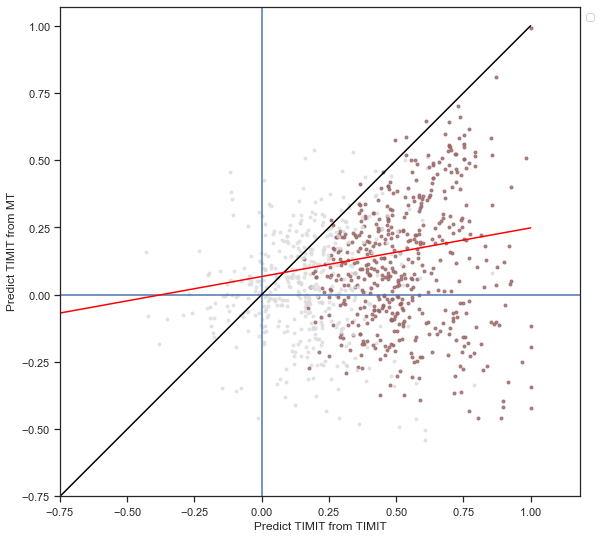

In [5]:
#audiovisual:
corrs_av, av_sig, av_corrs_train_less, av_corrs_test_less = cross_prediction_ConvexHull('TIMIT', subject_list, 'TIMIT', 'MT',  'pitchenvsphnfeat', 'pitchenvsphnfeatgabor10pc_sc',data_dir, save_dir,
                               save_fig=False)

*************************
Now processing MT0001
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fgrw0_si1990.wav', 'fhlm0_si1560.wav', 'fisb0_si2209.wav', 'fjas0_si2030.wav', 'fjhk0_si1652.wav', 'fjkl0_si1562.wav', 'fjk

(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
fdfb0_si1948.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
pitch_mat shape is:
(1, 289)
taking the mean across repeats
(64, 289)
fdjh0_si1565.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
fdml0_si2075.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
fdms0_si1218.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
pitch_mat shape is:
(1, 331)
taking the mean across repeats
(64, 331)
fdrd1_si1544.wav
phnfeatmat shape is:
(14, 332)
envs shape is:
(332, 1)
pitch_mat shape is:
(1, 332)
taking the mean across repeats
(64, 3

envs shape is:
(215, 1)
pitch_mat shape is:
(1, 215)
taking the mean across repeats
(64, 215)
fsbk0_si1699.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
pitch_mat shape is:
(1, 213)
taking the mean across repeats
(64, 213)
fsdc0_si2234.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
pitch_mat shape is:
(1, 187)
taking the mean across repeats
(64, 187)
fsdj0_si485.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
pitch_mat shape is:
(1, 264)
taking the mean across repeats
(64, 264)
fsjk1_si2285.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
pitch_mat shape is:
(1, 256)
taking the mean across repeats
(64, 256)
fsjs0_si1171.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
pitch_mat shape is:
(1, 286)
taking the mean across repeats
(64, 286)
fskp0_si1728.wav
phnfeatmat shape is:
(14, 322)
envs shape is:
(322, 1)
pitch_mat shape is:
(1, 322)
taking the mean across repeats
(64, 322)
fslb1_si644.wav
phnfeatmat shape is:
(14, 324)
envs sha

phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
mdks0_si1696.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
pitch_mat shape is:
(1, 279)
taking the mean across repeats
(64, 279)
mdlc0_si765.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
pitch_mat shape is:
(1, 290)
taking the mean across repeats
(64, 290)
mdlc1_si2144.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
pitch_mat shape is:
(1, 195)
taking the mean across repeats
(64, 195)
mdlc2_si2244.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
pitch_mat shape is:
(1, 194)
taking the mean across repeats
(64, 194)
mdld0_si1543.wav
phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
pitch_mat shape is:
(1, 287)
taking the mean across repeats
(64, 287)
mdlf0_si2213.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
pitch_mat shape is:
(1, 252)
taking the mean across repeats
(64, 252)
mdls0_si2258.wav
phnfeat

phnfeatmat shape is:
(14, 172)
envs shape is:
(172, 1)
pitch_mat shape is:
(1, 172)
taking the mean across repeats
(64, 172)
mjdm0_si1937.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
pitch_mat shape is:
(1, 171)
taking the mean across repeats
(64, 171)
mjdm0_si974.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
pitch_mat shape is:
(1, 187)
taking the mean across repeats
(64, 187)
mjeb0_si656.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
mjfc0_si1033.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mjfc0_si1663.wav
phnfeatmat shape is:
(14, 307)
envs shape is:
(307, 1)
pitch_mat shape is:
(1, 307)
taking the mean across repeats
(64, 307)
mjfr0_si2235.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
mjhi0_si555.wav
phnfeatma

envs shape is:
(277, 1)
pitch_mat shape is:
(1, 277)
taking the mean across repeats
(64, 277)
mmgk0_si1952.wav
phnfeatmat shape is:
(14, 161)
envs shape is:
(161, 1)
pitch_mat shape is:
(1, 161)
taking the mean across repeats
(64, 161)
mmjb1_si778.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
pitch_mat shape is:
(1, 331)
taking the mean across repeats
(64, 331)
mmlm0_si1527.wav
phnfeatmat shape is:
(14, 158)
envs shape is:
(158, 1)
pitch_mat shape is:
(1, 158)
taking the mean across repeats
(64, 158)
mmlm0_si897.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
pitch_mat shape is:
(1, 295)
taking the mean across repeats
(64, 295)
mmpm0_si2321.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
mmrp0_si2034.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
pitch_mat shape is:
(1, 202)
taking the mean across repeats
(64, 202)
mmrp0_si717.wav
phnfeatmat shape is:
(14, 319)
envs shap

(64, 326)
msmr0_si775.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
msms0_si2063.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
pitch_mat shape is:
(1, 316)
taking the mean across repeats
(64, 316)
msrg0_si1851.wav
phnfeatmat shape is:
(14, 199)
envs shape is:
(199, 1)
pitch_mat shape is:
(1, 199)
taking the mean across repeats
(64, 199)
mstf0_si766.wav
phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
pitch_mat shape is:
(1, 253)
taking the mean across repeats
(64, 253)
mtas0_si2015.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
mtat1_si1627.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
pitch_mat shape is:
(1, 264)
taking the mean across repeats
(64, 264)
mtdb0_si2031.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
pitch_mat shape is:
(1, 233)
taking the mean across repeats
(64, 233

(64, 227)
fcmh0_si2084.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
pitch_mat shape is:
(1, 196)
taking the mean across repeats
(64, 196)
fcmh1_si1493.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fcmr0_si1735.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
fcmr0_si475.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
pitch_mat shape is:
(1, 249)
taking the mean across repeats
(64, 249)
fcrh0_si1718.wav
phnfeatmat shape is:
(14, 218)
envs shape is:
(218, 1)
pitch_mat shape is:
(1, 218)
taking the mean across repeats
(64, 218)
fcrz0_si2053.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
pitch_mat shape is:
(1, 325)
taking the mean across repeats
(64, 325)
fdas1_si2091.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 31

(64, 329)
fnlp0_si678.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
pitch_mat shape is:
(1, 263)
taking the mean across repeats
(64, 263)
fntb0_si573.wav
phnfeatmat shape is:
(14, 333)
envs shape is:
(333, 1)
pitch_mat shape is:
(1, 333)
taking the mean across repeats
(64, 333)
fpac0_si2011.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
fpad0_si1976.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fpaz0_si1593.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
fpkt0_si2168.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
fpls0_si1590.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309

(64, 274)
mctt0_si1144.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
pitch_mat shape is:
(1, 228)
taking the mean across repeats
(64, 228)
mctw0_si2003.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mctw0_si743.wav
phnfeatmat shape is:
(14, 317)
envs shape is:
(317, 1)
pitch_mat shape is:
(1, 317)
taking the mean across repeats
(64, 317)
mcxm0_si721.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mdab0_si1669.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
pitch_mat shape is:
(1, 265)
taking the mean across repeats
(64, 265)
mdac0_si1837.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
pitch_mat shape is:
(1, 286)
taking the mean across repeats
(64, 286)
mdac2_si999.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)

pitch_mat shape is:
(1, 175)
taking the mean across repeats
(64, 175)
mjbg0_si1724.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mjda0_si1661.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
pitch_mat shape is:
(1, 302)
taking the mean across repeats
(64, 302)
mjdc0_si1161.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
pitch_mat shape is:
(1, 295)
taking the mean across repeats
(64, 295)
mjdc0_si2165.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mjdg0_si1705.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
pitch_mat shape is:
(1, 288)
taking the mean across repeats
(64, 288)
mjdh0_si1984.wav
phnfeatmat shape is:
(14, 172)
envs shape is:
(172, 1)
pitch_mat shape is:
(1, 172)
taking the mean across repeats
(64, 172)
mjdm0_si1937.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
pitch_

envs shape is:
(258, 1)
pitch_mat shape is:
(1, 258)
taking the mean across repeats
(64, 258)
mmws1_si1701.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mmws1_si2331.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
pitch_mat shape is:
(1, 286)
taking the mean across repeats
(64, 286)
mmxs0_si876.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mntw0_si2328.wav
phnfeatmat shape is:
(14, 225)
envs shape is:
(225, 1)
pitch_mat shape is:
(1, 225)
taking the mean across repeats
(64, 225)
mpam1_si1029.wav
phnfeatmat shape is:
(14, 241)
envs shape is:
(241, 1)
pitch_mat shape is:
(1, 241)
taking the mean across repeats
(64, 241)
mpar0_si946.wav
phnfeatmat shape is:
(14, 301)
envs shape is:
(301, 1)
pitch_mat shape is:
(1, 301)
taking the mean across repeats
(64, 301)
mpeb0_si1034.wav
phnfeatmat shape is:
(14, 188)
envs sha

envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
msmr0_si775.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
msms0_si2063.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
pitch_mat shape is:
(1, 316)
taking the mean across repeats
(64, 316)
msrg0_si1851.wav
phnfeatmat shape is:
(14, 199)
envs shape is:
(199, 1)
pitch_mat shape is:
(1, 199)
taking the mean across repeats
(64, 199)
mstf0_si766.wav
phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
pitch_mat shape is:
(1, 253)
taking the mean across repeats
(64, 253)
mtas0_si2015.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
mtat1_si1627.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
pitch_mat shape is:
(1, 264)
taking the mean across repeats
(64, 264)
mtdb0_si2031.wav
phnfeatmat shape is:
(14, 233)
envs sha

/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py:69: RuntimeWarning: This filename (/Users/md42732/Box/generalizable_EEG_manuscript/data/participants/MT0001/downsampled_128/MT0001_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz or raw_tsss.fif.gz
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 450328 =      0.000 ...  3518.188 secs
Ready.
Reading 0 ... 450328  =      0.000 ...  3518.188 secs...
*************************
Now processing MT0002
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fcmr0_si1735.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
fcmr0_si475.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
pitch_mat shape is:
(1, 249)
taking the mean across repeats
(64, 249)
fcrh0_si1718.wav
phnfeatmat shape is:
(14, 218)
envs shape is:
(218, 1)
pitch_mat shape is:
(1, 218)
taking the mean across repeats
(64, 218)
fcrz0_si2053.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
pitch_mat shape is:
(1, 325)
taking the mean across repeats
(64, 325)
fdas1_si2091.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
fdfb0_si1948.wav
phnfeat

phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
fnlp0_si678.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
pitch_mat shape is:
(1, 263)
taking the mean across repeats
(64, 263)
fntb0_si573.wav
phnfeatmat shape is:
(14, 333)
envs shape is:
(333, 1)
pitch_mat shape is:
(1, 333)
taking the mean across repeats
(64, 333)
fpac0_si2011.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
fpad0_si1976.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fpaz0_si1593.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
fpkt0_si2168.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
fpls0_si1590.wav
phnfeatm

phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mdab0_si1669.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
pitch_mat shape is:
(1, 265)
taking the mean across repeats
(64, 265)
mdac0_si1837.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
pitch_mat shape is:
(1, 286)
taking the mean across repeats
(64, 286)
mdac2_si999.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mdas0_si1266.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
mdbb1_si1636.wav
phnfeatmat shape is:
(14, 234)
envs shape is:
(234, 1)
pitch_mat shape is:
(1, 234)
taking the mean across repeats
(64, 234)
mdcd0_si2045.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
mddc0_si2049.wav
phnfeat

envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mjar0_si2247.wav
phnfeatmat shape is:
(14, 175)
envs shape is:
(175, 1)
pitch_mat shape is:
(1, 175)
taking the mean across repeats
(64, 175)
mjbg0_si1724.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mjda0_si1661.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
pitch_mat shape is:
(1, 302)
taking the mean across repeats
(64, 302)
mjdc0_si1161.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
pitch_mat shape is:
(1, 295)
taking the mean across repeats
(64, 295)
mjdc0_si2165.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mjdg0_si1705.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
pitch_mat shape is:
(1, 288)
taking the mean across repeats
(64, 288)
mjdh0_si1984.wav
phnfeatmat shape is:
(14, 172)
envs s

phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
pitch_mat shape is:
(1, 321)
taking the mean across repeats
(64, 321)
mmdm1_si1650.wav
phnfeatmat shape is:
(14, 235)
envs shape is:
(235, 1)
pitch_mat shape is:
(1, 235)
taking the mean across repeats
(64, 235)
mmdm2_si1555.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mmds0_si1973.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
pitch_mat shape is:
(1, 176)
taking the mean across repeats
(64, 176)
mmea0_si2018.wav
phnfeatmat shape is:
(14, 130)
envs shape is:
(130, 1)
pitch_mat shape is:
(1, 130)
taking the mean across repeats
(64, 130)
mmeb0_si1987.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
mmeb0_si727.wav
phnfeatmat shape is:
(14, 277)
envs shape is:
(277, 1)
pitch_mat shape is:
(1, 277)
taking the mean across repeats
(64, 277)
mmgk0_si1952.wav
phnfeat

pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mrwa0_si1603.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
pitch_mat shape is:
(1, 308)
taking the mean across repeats
(64, 308)
mrws0_si1732.wav
phnfeatmat shape is:
(14, 221)
envs shape is:
(221, 1)
pitch_mat shape is:
(1, 221)
taking the mean across repeats
(64, 221)
mrxb0_si1585.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
pitch_mat shape is:
(1, 289)
taking the mean across repeats
(64, 289)
msah1_si1049.wav
phnfeatmat shape is:
(14, 306)
envs shape is:
(306, 1)
pitch_mat shape is:
(1, 306)
taking the mean across repeats
(64, 306)
msah1_si1679.wav
phnfeatmat shape is:
(14, 189)
envs shape is:
(189, 1)
pitch_mat shape is:
(1, 189)
taking the mean across repeats
(64, 189)
msdb0_si2267.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 254)
msdh0_si2113.wav
phnfeatmat shape is:
(14, 164)
envs shape is:
(164, 1)
pitch_

phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
pitch_mat shape is:
(1, 273)
taking the mean across repeats
(64, 273)
fcag0_si1503.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
pitch_mat shape is:
(1, 294)
taking the mean across repeats
(64, 294)
fcag0_si1641.wav
phnfeatmat shape is:
(14, 192)
envs shape is:
(192, 1)
pitch_mat shape is:
(1, 192)
taking the mean across repeats
(64, 192)
fcaj0_si1479.wav
phnfeatmat shape is:
(14, 177)
envs shape is:
(177, 1)
pitch_mat shape is:
(1, 177)
taking the mean across repeats
(64, 177)
fcaj0_si1804.wav
phnfeatmat shape is:
(14, 232)
envs shape is:
(232, 1)
pitch_mat shape is:
(1, 232)
taking the mean across repeats
(64, 232)
fceg0_si1878.wav
phnfeatmat shape is:
(14, 165)
envs shape is:
(165, 1)
pitch_mat shape is:
(1, 165)
taking the mean across repeats
(64, 165)
fceg0_si618.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
pitch_mat shape is:
(1, 315)
taking the mean across repeats
(64, 315)
fcft0_si1808.wav
phnfeat

phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
fmld0_si925.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
fnkl0_si2152.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
fnlp0_si678.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
pitch_mat shape is:
(1, 263)
taking the mean across repeats
(64, 263)
fntb0_si573.wav
phnfeatmat shape is:
(14, 333)
envs shape is:
(333, 1)
pitch_mat shape is:
(1, 333)
taking the mean across repeats
(64, 333)
fpac0_si2011.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
fpad0_si1976.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fpaz0_si1593.wav
phnfeatma

envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mcrc0_si1092.wav
phnfeatmat shape is:
(14, 223)
envs shape is:
(223, 1)
pitch_mat shape is:
(1, 223)
taking the mean across repeats
(64, 223)
mcth0_si1839.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
pitch_mat shape is:
(1, 270)
taking the mean across repeats
(64, 270)
mctm0_si720.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mctt0_si1144.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
pitch_mat shape is:
(1, 228)
taking the mean across repeats
(64, 228)
mctw0_si2003.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mctw0_si743.wav
phnfeatmat shape is:
(14, 317)
envs shape is:
(317, 1)
pitch_mat shape is:
(1, 317)
taking the mean across repeats
(64, 317)
mcxm0_si721.wav
phnfeatmat shape is:
(14, 282)
envs shap

phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
mges0_si1481.wav
phnfeatmat shape is:
(14, 170)
envs shape is:
(170, 1)
pitch_mat shape is:
(1, 170)
taking the mean across repeats
(64, 170)
mgjf0_si776.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
pitch_mat shape is:
(1, 228)
taking the mean across repeats
(64, 228)
mglb0_si2164.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
pitch_mat shape is:
(1, 171)
taking the mean across repeats
(64, 171)
mgrp0_si1947.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
pitch_mat shape is:
(1, 321)
taking the mean across repeats
(64, 321)
mgrt0_si2080.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
pitch_mat shape is:
(1, 297)
taking the mean across repeats
(64, 297)
mgsl0_si534.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
mhit0_si2243.wav
phnfeatm

(64, 198)
mmab1_si2124.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
mmam0_si1668.wav
phnfeatmat shape is:
(14, 285)
envs shape is:
(285, 1)
pitch_mat shape is:
(1, 285)
taking the mean across repeats
(64, 285)
mmam0_si2227.wav
phnfeatmat shape is:
(14, 247)
envs shape is:
(247, 1)
pitch_mat shape is:
(1, 247)
taking the mean across repeats
(64, 247)
mmbs0_si1781.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
pitch_mat shape is:
(1, 261)
taking the mean across repeats
(64, 261)
mmdb0_si1617.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
mmdg0_si2035.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
pitch_mat shape is:
(1, 269)
taking the mean across repeats
(64, 269)
mmdm0_si681.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
pitch_mat shape is:
(1, 321)
taking the mean across repeats
(64, 32

(64, 297)
mrvg0_si510.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mrwa0_si1603.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
pitch_mat shape is:
(1, 308)
taking the mean across repeats
(64, 308)
mrws0_si1732.wav
phnfeatmat shape is:
(14, 221)
envs shape is:
(221, 1)
pitch_mat shape is:
(1, 221)
taking the mean across repeats
(64, 221)
mrxb0_si1585.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
pitch_mat shape is:
(1, 289)
taking the mean across repeats
(64, 289)
msah1_si1049.wav
phnfeatmat shape is:
(14, 306)
envs shape is:
(306, 1)
pitch_mat shape is:
(1, 306)
taking the mean across repeats
(64, 306)
msah1_si1679.wav
phnfeatmat shape is:
(14, 189)
envs shape is:
(189, 1)
pitch_mat shape is:
(1, 189)
taking the mean across repeats
(64, 189)
msdb0_si2267.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 25

/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py:69: RuntimeWarning: This filename (/Users/md42732/Box/generalizable_EEG_manuscript/data/participants/MT0002/downsampled_128/MT0002_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz or raw_tsss.fif.gz
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 604351 =      0.000 ...  4721.492 secs
Ready.
Reading 0 ... 604351  =      0.000 ...  4721.492 secs...
*************************
Now processing MT0003
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

pitch_mat shape is:
(1, 177)
taking the mean across repeats
(64, 177)
fcaj0_si1804.wav
phnfeatmat shape is:
(14, 232)
envs shape is:
(232, 1)
pitch_mat shape is:
(1, 232)
taking the mean across repeats
(64, 232)
fceg0_si1878.wav
phnfeatmat shape is:
(14, 165)
envs shape is:
(165, 1)
pitch_mat shape is:
(1, 165)
taking the mean across repeats
(64, 165)
fceg0_si618.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
pitch_mat shape is:
(1, 315)
taking the mean across repeats
(64, 315)
fcft0_si1808.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fcft0_si548.wav
phnfeatmat shape is:
(14, 243)
envs shape is:
(243, 1)
pitch_mat shape is:
(1, 243)
taking the mean across repeats
(64, 243)
fcjs0_si1607.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
fcmh0_si2084.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
pitch_ma

envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
flmk0_si2295.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
pitch_mat shape is:
(1, 325)
taking the mean across repeats
(64, 325)
flod0_si1917.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
pitch_mat shape is:
(1, 320)
taking the mean across repeats
(64, 320)
fltm0_si1070.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
pitch_mat shape is:
(1, 270)
taking the mean across repeats
(64, 270)
fltm0_si2330.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 254)
fmah0_si1289.wav
phnfeatmat shape is:
(14, 239)
envs shape is:
(239, 1)
pitch_mat shape is:
(1, 239)
taking the mean across repeats
(64, 239)
fmbg0_si1790.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
pitch_mat shape is:
(1, 300)
taking the mean across repeats
(64, 300)
fmbg0_si2264.wav
phnfeatmat shape is:
(14, 265)
envs s

envs shape is:
(141, 1)
pitch_mat shape is:
(1, 141)
taking the mean across repeats
(64, 141)
mbwp0_si1531.wav
phnfeatmat shape is:
(14, 203)
envs shape is:
(203, 1)
pitch_mat shape is:
(1, 203)
taking the mean across repeats
(64, 203)
mcal0_si508.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
mccs0_si2099.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
mcdc0_si1922.wav
phnfeatmat shape is:
(14, 307)
envs shape is:
(307, 1)
pitch_mat shape is:
(1, 307)
taking the mean across repeats
(64, 307)
mchh0_si1634.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mclk0_si1660.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mcmb0_si1898.wav
phnfeatmat shape is:
(14, 216)
envs sh

(64, 323)
mgaw0_si535.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
mges0_si1481.wav
phnfeatmat shape is:
(14, 170)
envs shape is:
(170, 1)
pitch_mat shape is:
(1, 170)
taking the mean across repeats
(64, 170)
mgjf0_si776.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
pitch_mat shape is:
(1, 228)
taking the mean across repeats
(64, 228)
mglb0_si2164.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
pitch_mat shape is:
(1, 171)
taking the mean across repeats
(64, 171)
mgrp0_si1947.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
pitch_mat shape is:
(1, 321)
taking the mean across repeats
(64, 321)
mgrt0_si2080.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
pitch_mat shape is:
(1, 297)
taking the mean across repeats
(64, 297)
mgsl0_si534.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 143, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 213, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_na

phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
pitch_mat shape is:
(1, 269)
taking the mean across repeats
(64, 269)
mjmm0_si625.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
pitch_mat shape is:
(1, 303)
taking the mean across repeats
(64, 303)
mjmp0_si1535.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
pitch_mat shape is:
(1, 302)
taking the mean across repeats
(64, 302)
mjpg0_si1191.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
mjpm1_si1897.wav
phnfeatmat shape is:
(14, 183)
envs shape is:
(183, 1)
pitch_mat shape is:
(1, 183)
taking the mean across repeats
(64, 183)
mjpm1_si2280.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
pitch_mat shape is:
(1, 246)
taking the mean across repeats
(64, 246)
mjrf0_si1114.wav
phnfeatmat shape is:
(14, 164)
envs shape is:
(164, 1)
pitch_mat shape is:
(1, 164)
taking the mean across repeats
(64, 164)
mjrg0_si1996.wav
phnfeat

phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mrds0_si1167.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mrem0_si961.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
pitch_mat shape is:
(1, 312)
taking the mean across repeats
(64, 312)
mres0_si1847.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mrew1_si1500.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
mrew1_si2130.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
pitch_mat shape is:
(1, 171)
taking the mean across repeats
(64, 171)
mrfk0_si1706.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
pitch_mat shape is:
(1, 194)
taking the mean across repeats
(64, 194)
mrfk0_si2336.wav
phnfeat

TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fgrw0_si1990.wav', 'fhlm0_si1560.wav', 'fisb0_si2209.wav', 'fjas0_si2030.wav', 'fjhk0_si1652.wav', 'fjkl0_si1562.wav', 'fjkl0_si2192.wav', 'fjlg0_si1506.wav', 'fjlg0_si2306.wav', 'fjlr0_si1861.wav'

pitch_mat shape is:
(1, 249)
taking the mean across repeats
(64, 249)
fcrh0_si1718.wav
phnfeatmat shape is:
(14, 218)
envs shape is:
(218, 1)
pitch_mat shape is:
(1, 218)
taking the mean across repeats
(64, 218)
fcrz0_si2053.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
pitch_mat shape is:
(1, 325)
taking the mean across repeats
(64, 325)
fdas1_si2091.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
fdfb0_si1948.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
pitch_mat shape is:
(1, 289)
taking the mean across repeats
(64, 289)
fdjh0_si1565.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_

(64, 263)
fntb0_si573.wav
phnfeatmat shape is:
(14, 333)
envs shape is:
(333, 1)
pitch_mat shape is:
(1, 333)
taking the mean across repeats
(64, 333)
fpac0_si2011.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
fpad0_si1976.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fpaz0_si1593.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
fpkt0_si2168.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
fpls0_si1590.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
fpmy0_si1783.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 32

phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mdab0_si1669.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
pitch_mat shape is:
(1, 265)
taking the mean across repeats
(64, 265)
mdac0_si1837.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
pitch_mat shape is:
(1, 286)
taking the mean across repeats
(64, 286)
mdac2_si999.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mdas0_si1266.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
mdbb1_si1636.wav
phnfeatmat shape is:
(14, 234)
envs shape is:
(234, 1)
pitch_mat shape is:
(1, 234)
taking the mean across repeats
(64, 234)
mdcd0_si2045.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
mddc0_si2049.wav
phnfeat

envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mjda0_si1661.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
pitch_mat shape is:
(1, 302)
taking the mean across repeats
(64, 302)
mjdc0_si1161.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
pitch_mat shape is:
(1, 295)
taking the mean across repeats
(64, 295)
mjdc0_si2165.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mjdg0_si1705.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
pitch_mat shape is:
(1, 288)
taking the mean across repeats
(64, 288)
mjdh0_si1984.wav
phnfeatmat shape is:
(14, 172)
envs shape is:
(172, 1)
pitch_mat shape is:
(1, 172)
taking the mean across repeats
(64, 172)
mjdm0_si1937.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
pitch_mat shape is:
(1, 171)
taking the mean across repeats
(64, 171)
mjdm0_si974.wav
phnfeatmat shape is:
(14, 187)
envs sh

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 143, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 213, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_na

phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
pitch_mat shape is:
(1, 303)
taking the mean across repeats
(64, 303)
mjmp0_si1535.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
pitch_mat shape is:
(1, 302)
taking the mean across repeats
(64, 302)
mjpg0_si1191.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
mjpm1_si1897.wav
phnfeatmat shape is:
(14, 183)
envs shape is:
(183, 1)
pitch_mat shape is:
(1, 183)
taking the mean across repeats
(64, 183)
mjpm1_si2280.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
pitch_mat shape is:
(1, 246)
taking the mean across repeats
(64, 246)
mjrf0_si1114.wav
phnfeatmat shape is:
(14, 164)
envs shape is:
(164, 1)
pitch_mat shape is:
(1, 164)
taking the mean across repeats
(64, 164)
mjrg0_si1996.wav
phnfeatmat shape is:
(14, 183)
envs shape is:
(183, 1)
pitch_mat shape is:
(1, 183)
taking the mean across repeats
(64, 183)
mjrh0_si1125.wav
phnfea

phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
pitch_mat shape is:
(1, 315)
taking the mean across repeats
(64, 315)
mrbc0_si1665.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mrcs0_si1223.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
pitch_mat shape is:
(1, 258)
taking the mean across repeats
(64, 258)
mrdm0_si1595.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mrds0_si1167.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mrem0_si961.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
pitch_mat shape is:
(1, 312)
taking the mean across repeats
(64, 312)
mres0_si1847.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mrew1_si1500.wav
phnfeat

phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
mzmb0_si1796.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
pitch_mat shape is:
(1, 246)
taking the mean across repeats
(64, 246)
******************************
(1232, 64)
(2134, 1232)
(2134, 64)
******************************
Calculating prediction...
Calculating correlation
Opening raw data file /Users/md42732/Box/generalizable_EEG_manuscript/data/participants/MT0003/downsampled_128/MT0003_postICA_rejected.fif...
This filename (/Users/md42732/Box/generalizable_EEG_manuscript/data/participants/MT0003/downsampled_128/MT0003_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz or raw_tsss.fif.gz


/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py:69: RuntimeWarning: This filename (/Users/md42732/Box/generalizable_EEG_manuscript/data/participants/MT0003/downsampled_128/MT0003_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz or raw_tsss.fif.gz
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 526405 =      0.000 ...  4112.539 secs
Ready.
Reading 0 ... 526405  =      0.000 ...  4112.539 secs...
*************************
Now processing MT0004
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

taking the mean across repeats
(64, 196)
fcmh1_si1493.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fcmr0_si1735.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
fcmr0_si475.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
pitch_mat shape is:
(1, 249)
taking the mean across repeats
(64, 249)
fcrh0_si1718.wav
phnfeatmat shape is:
(14, 218)
envs shape is:
(218, 1)
pitch_mat shape is:
(1, 218)
taking the mean across repeats
(64, 218)
fcrz0_si2053.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
pitch_mat shape is:
(1, 325)
taking the mean across repeats
(64, 325)
fdas1_si2091.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking 

(64, 263)
fntb0_si573.wav
phnfeatmat shape is:
(14, 333)
envs shape is:
(333, 1)
pitch_mat shape is:
(1, 333)
taking the mean across repeats
(64, 333)
fpac0_si2011.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
fpad0_si1976.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fpaz0_si1593.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
fpkt0_si2168.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
fpls0_si1590.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
fpmy0_si1783.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 32

(64, 323)
mclk0_si1660.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mcmb0_si1898.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mcrc0_si1092.wav
phnfeatmat shape is:
(14, 223)
envs shape is:
(223, 1)
pitch_mat shape is:
(1, 223)
taking the mean across repeats
(64, 223)
mcth0_si1839.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
pitch_mat shape is:
(1, 270)
taking the mean across repeats
(64, 270)
mctm0_si720.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mctt0_si1144.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
pitch_mat shape is:
(1, 228)
taking the mean across repeats
(64, 228)
mctw0_si2003.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 29

(64, 323)
mgaw0_si535.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
mges0_si1481.wav
phnfeatmat shape is:
(14, 170)
envs shape is:
(170, 1)
pitch_mat shape is:
(1, 170)
taking the mean across repeats
(64, 170)
mgjf0_si776.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
pitch_mat shape is:
(1, 228)
taking the mean across repeats
(64, 228)
mglb0_si2164.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
pitch_mat shape is:
(1, 171)
taking the mean across repeats
(64, 171)
mgrp0_si1947.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
pitch_mat shape is:
(1, 321)
taking the mean across repeats
(64, 321)
mgrt0_si2080.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
pitch_mat shape is:
(1, 297)
taking the mean across repeats
(64, 297)
mgsl0_si534.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)

(64, 318)
mklt0_si583.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
pitch_mat shape is:
(1, 294)
taking the mean across repeats
(64, 294)
mklw0_si1844.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
pitch_mat shape is:
(1, 198)
taking the mean across repeats
(64, 198)
mkxl0_si1185.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
mljc0_si1855.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
mlll0_si1993.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
mlns0_si1407.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
pitch_mat shape is:
(1, 288)
taking the mean across repeats
(64, 288)
mmab1_si1494.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
pitch_mat shape is:
(1, 198)
taking the mean across repeats
(64, 19

(64, 146)
mrjt0_si1805.wav
phnfeatmat shape is:
(14, 211)
envs shape is:
(211, 1)
pitch_mat shape is:
(1, 211)
taking the mean across repeats
(64, 211)
mrld0_si2224.wav
phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
pitch_mat shape is:
(1, 287)
taking the mean across repeats
(64, 287)
mrlj0_si2050.wav
phnfeatmat shape is:
(14, 245)
envs shape is:
(245, 1)
pitch_mat shape is:
(1, 245)
taking the mean across repeats
(64, 245)
mrms0_si2100.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
pitch_mat shape is:
(1, 300)
taking the mean across repeats
(64, 300)
mrpc1_si2026.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
pitch_mat shape is:
(1, 220)
taking the mean across repeats
(64, 220)
mrpp0_si1814.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
pitch_mat shape is:
(1, 252)
taking the mean across repeats
(64, 252)
mrrk0_si1716.wav
phnfeatmat shape is:
(14, 208)
envs shape is:
(208, 1)
pitch_mat shape is:
(1, 208)
taking the mean across repeats
(64, 2

(64, 324)
fcmr0_si1735.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
fcmr0_si475.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
pitch_mat shape is:
(1, 249)
taking the mean across repeats
(64, 249)
fcrh0_si1718.wav
phnfeatmat shape is:
(14, 218)
envs shape is:
(218, 1)
pitch_mat shape is:
(1, 218)
taking the mean across repeats
(64, 218)
fcrz0_si2053.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
pitch_mat shape is:
(1, 325)
taking the mean across repeats
(64, 325)
fdas1_si2091.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
fdfb0_si1948.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 20

(64, 323)
freh0_si685.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
frew0_si1030.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
pitch_mat shape is:
(1, 194)
taking the mean across repeats
(64, 194)
frll0_si1514.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
pitch_mat shape is:
(1, 312)
taking the mean across repeats
(64, 312)
fsak0_si1930.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
pitch_mat shape is:
(1, 215)
taking the mean across repeats
(64, 215)
fsbk0_si1699.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
pitch_mat shape is:
(1, 213)
taking the mean across repeats
(64, 213)
fsdc0_si2234.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
pitch_mat shape is:
(1, 187)
taking the mean across repeats
(64, 187)
fsdj0_si485.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
pitch_mat shape is:
(1, 264)
taking the mean across repeats
(64, 264

phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
mdhs0_si2160.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
mdks0_si1696.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
pitch_mat shape is:
(1, 279)
taking the mean across repeats
(64, 279)
mdlc0_si765.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
pitch_mat shape is:
(1, 290)
taking the mean across repeats
(64, 290)
mdlc1_si2144.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
pitch_mat shape is:
(1, 195)
taking the mean across repeats
(64, 195)
mdlc2_si2244.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
pitch_mat shape is:
(1, 194)
taking the mean across repeats
(64, 194)
mdld0_si1543.wav
phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
pitch_mat shape is:
(1, 287)
taking the mean across repeats
(64, 287)
mdlf0_si2213.wav
phnfeat

(64, 296)
mjar0_si2247.wav
phnfeatmat shape is:
(14, 175)
envs shape is:
(175, 1)
pitch_mat shape is:
(1, 175)
taking the mean across repeats
(64, 175)
mjbg0_si1724.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mjda0_si1661.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
pitch_mat shape is:
(1, 302)
taking the mean across repeats
(64, 302)
mjdc0_si1161.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
pitch_mat shape is:
(1, 295)
taking the mean across repeats
(64, 295)
mjdc0_si2165.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mjdg0_si1705.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
pitch_mat shape is:
(1, 288)
taking the mean across repeats
(64, 288)
mjdh0_si1984.wav
phnfeatmat shape is:
(14, 172)
envs shape is:
(172, 1)
pitch_mat shape is:
(1, 172)
taking the mean across repeats
(64, 1

taking the mean across repeats
(64, 130)
mmeb0_si1987.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
mmeb0_si727.wav
phnfeatmat shape is:
(14, 277)
envs shape is:
(277, 1)
pitch_mat shape is:
(1, 277)
taking the mean across repeats
(64, 277)
mmgk0_si1952.wav
phnfeatmat shape is:
(14, 161)
envs shape is:
(161, 1)
pitch_mat shape is:
(1, 161)
taking the mean across repeats
(64, 161)
mmjb1_si778.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
pitch_mat shape is:
(1, 331)
taking the mean across repeats
(64, 331)
mmlm0_si1527.wav
phnfeatmat shape is:
(14, 158)
envs shape is:
(158, 1)
pitch_mat shape is:
(1, 158)
taking the mean across repeats
(64, 158)
mmlm0_si897.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
pitch_mat shape is:
(1, 295)
taking the mean across repeats
(64, 295)
mmpm0_si2321.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking th

(64, 306)
msah1_si1679.wav
phnfeatmat shape is:
(14, 189)
envs shape is:
(189, 1)
pitch_mat shape is:
(1, 189)
taking the mean across repeats
(64, 189)
msdb0_si2267.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 254)
msdh0_si2113.wav
phnfeatmat shape is:
(14, 164)
envs shape is:
(164, 1)
pitch_mat shape is:
(1, 164)
taking the mean across repeats
(64, 164)
msdh0_si2240.wav
phnfeatmat shape is:
(14, 184)
envs shape is:
(184, 1)
pitch_mat shape is:
(1, 184)
taking the mean across repeats
(64, 184)
msjs1_si1899.wav
phnfeatmat shape is:
(14, 185)
envs shape is:
(185, 1)
pitch_mat shape is:
(1, 185)
taking the mean across repeats
(64, 185)
mslb0_si1193.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
pitch_mat shape is:
(1, 289)
taking the mean across repeats
(64, 289)
msmc0_si1907.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 3

/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py:69: RuntimeWarning: This filename (/Users/md42732/Box/generalizable_EEG_manuscript/data/participants/MT0004/downsampled_128/MT0004_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz or raw_tsss.fif.gz
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 594629 =      0.000 ...  4645.539 secs
Ready.
Reading 0 ... 594629  =      0.000 ...  4645.539 secs...
*************************
Now processing MT0005
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

(64, 298)
fcmr0_si475.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
pitch_mat shape is:
(1, 249)
taking the mean across repeats
(64, 249)
fcrh0_si1718.wav
phnfeatmat shape is:
(14, 218)
envs shape is:
(218, 1)
pitch_mat shape is:
(1, 218)
taking the mean across repeats
(64, 218)
fcrz0_si2053.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
pitch_mat shape is:
(1, 325)
taking the mean across repeats
(64, 325)
fdas1_si2091.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
fdfb0_si1948.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
pitch_mat shape is:
(1, 289)
taking the mean across repeats
(64, 28

(64, 309)
fpmy0_si1783.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
freh0_si685.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
frew0_si1030.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
pitch_mat shape is:
(1, 194)
taking the mean across repeats
(64, 194)
frll0_si1514.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
pitch_mat shape is:
(1, 312)
taking the mean across repeats
(64, 312)
fsak0_si1930.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
pitch_mat shape is:
(1, 215)
taking the mean across repeats
(64, 215)
fsbk0_si1699.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
pitch_mat shape is:
(1, 213)
taking the mean across repeats
(64, 213)
fsdc0_si2234.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
pitch_mat shape is:
(1, 187)
taking the mean across repeats
(64, 18

(64, 317)
mcxm0_si721.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mdab0_si1669.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
pitch_mat shape is:
(1, 265)
taking the mean across repeats
(64, 265)
mdac0_si1837.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
pitch_mat shape is:
(1, 286)
taking the mean across repeats
(64, 286)
mdac2_si999.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mdas0_si1266.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
mdbb1_si1636.wav
phnfeatmat shape is:
(14, 234)
envs shape is:
(234, 1)
pitch_mat shape is:
(1, 234)
taking the mean across repeats
(64, 234)
mdcd0_si2045.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298

(64, 321)
mgrt0_si2080.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
pitch_mat shape is:
(1, 297)
taking the mean across repeats
(64, 297)
mgsl0_si534.wav
mhit0_si2243.wav
phnfeatmat shape is:
(14, 266)
envs shape is:
(266, 1)
pitch_mat shape is:
(1, 266)
taking the mean across repeats
(64, 266)
mhmr0_si1119.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mhpg0_si1720.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
pitch_mat shape is:
(1, 299)
taking the mean across repeats
(64, 299)
mhrm0_si1475.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
pitch_mat shape is:
(1, 222)
taking the mean across repeats
(64, 222)
milb0_si2163.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
pitch_mat shape is:
(1, 318)
taking the mean across repeats
(64, 318)
mjae0_si2154.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean acros

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 143, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 213, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_na

phnfeatmat shape is:
(14, 307)
envs shape is:
(307, 1)
pitch_mat shape is:
(1, 307)
taking the mean across repeats
(64, 307)
mjfr0_si2235.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
mjhi0_si555.wav
phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
pitch_mat shape is:
(1, 268)
taking the mean across repeats
(64, 268)
mjjb0_si1277.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mjjb0_si1769.wav
phnfeatmat shape is:
(14, 328)
envs shape is:
(328, 1)
pitch_mat shape is:
(1, 328)
taking the mean across repeats
(64, 328)
mjjg0_si2263.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
pitch_mat shape is:
(1, 281)
taking the mean across repeats
(64, 281)
mjlb0_si2246.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
pitch_mat shape is:
(1, 279)
taking the mean across repeats
(64, 279)
mjlb0_si986.wav
phnfeatm

(64, 224)
mpsw0_si2327.wav
phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
pitch_mat shape is:
(1, 268)
taking the mean across repeats
(64, 268)
mrab0_si1224.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mram0_si1905.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
pitch_mat shape is:
(1, 315)
taking the mean across repeats
(64, 315)
mrbc0_si1665.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mrcs0_si1223.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
pitch_mat shape is:
(1, 258)
taking the mean across repeats
(64, 258)
mrdm0_si1595.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mrds0_si1167.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 2

TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fgrw0_si1990.wav', 'fhlm0_si1560.wav', 'fisb0_si2209.wav', 'fjas0_si2030.wav', 'fjhk0_si1652.wav', 'fjkl0_si1562.wav', 'fjkl0_si2192.wav', 'fjlg0_si1506.wav', 'fjlg0_si2306.wav', 'fjlr0_si1861.wav'

envs shape is:
(218, 1)
pitch_mat shape is:
(1, 218)
taking the mean across repeats
(64, 218)
fcrz0_si2053.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
pitch_mat shape is:
(1, 325)
taking the mean across repeats
(64, 325)
fdas1_si2091.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
fdfb0_si1948.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
pitch_mat shape is:
(1, 289)
taking the mean across repeats
(64, 289)
fdjh0_si1565.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
fdml0_si2075.wav
phnfeatmat shape is:
(14, 206)
envs s

(64, 194)
frll0_si1514.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
pitch_mat shape is:
(1, 312)
taking the mean across repeats
(64, 312)
fsak0_si1930.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
pitch_mat shape is:
(1, 215)
taking the mean across repeats
(64, 215)
fsbk0_si1699.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
pitch_mat shape is:
(1, 213)
taking the mean across repeats
(64, 213)
fsdc0_si2234.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
pitch_mat shape is:
(1, 187)
taking the mean across repeats
(64, 187)
fsdj0_si485.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
pitch_mat shape is:
(1, 264)
taking the mean across repeats
(64, 264)
fsjk1_si2285.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
pitch_mat shape is:
(1, 256)
taking the mean across repeats
(64, 256)
fsjs0_si1171.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
pitch_mat shape is:
(1, 286)
taking the mean across repeats
(64, 28

phnfeatmat shape is:
(14, 197)
envs shape is:
(197, 1)
pitch_mat shape is:
(1, 197)
taking the mean across repeats
(64, 197)
mdma0_si1238.wav
phnfeatmat shape is:
(14, 276)
envs shape is:
(276, 1)
pitch_mat shape is:
(1, 276)
taking the mean across repeats
(64, 276)
mdmt0_si2341.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
pitch_mat shape is:
(1, 196)
taking the mean across repeats
(64, 196)
mdpk0_si1683.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
pitch_mat shape is:
(1, 249)
taking the mean across repeats
(64, 249)
mdpk0_si552.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
pitch_mat shape is:
(1, 213)
taking the mean across repeats
(64, 213)
mdrb0_si1174.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
pitch_mat shape is:
(1, 315)
taking the mean across repeats
(64, 315)
mdrd0_si1382.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
pitch_mat shape is:
(1, 331)
taking the mean across repeats
(64, 331)
mdrm0_si1643.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 143, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 213, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_na

phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mjda0_si1661.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
pitch_mat shape is:
(1, 302)
taking the mean across repeats
(64, 302)
mjdc0_si1161.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
pitch_mat shape is:
(1, 295)
taking the mean across repeats
(64, 295)
mjdc0_si2165.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mjdg0_si1705.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
pitch_mat shape is:
(1, 288)
taking the mean across repeats
(64, 288)
mjdh0_si1984.wav
phnfeatmat shape is:
(14, 172)
envs shape is:
(172, 1)
pitch_mat shape is:
(1, 172)
taking the mean across repeats
(64, 172)
mjdm0_si1937.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
pitch_mat shape is:
(1, 171)
taking the mean across repeats
(64, 171)
mjdm0_si974.wav
phnfeat

(64, 277)
mmgk0_si1952.wav
phnfeatmat shape is:
(14, 161)
envs shape is:
(161, 1)
pitch_mat shape is:
(1, 161)
taking the mean across repeats
(64, 161)
mmjb1_si778.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
pitch_mat shape is:
(1, 331)
taking the mean across repeats
(64, 331)
mmlm0_si1527.wav
phnfeatmat shape is:
(14, 158)
envs shape is:
(158, 1)
pitch_mat shape is:
(1, 158)
taking the mean across repeats
(64, 158)
mmlm0_si897.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
pitch_mat shape is:
(1, 295)
taking the mean across repeats
(64, 295)
mmpm0_si2321.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
mmrp0_si2034.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
pitch_mat shape is:
(1, 202)
taking the mean across repeats
(64, 202)
mmrp0_si717.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)

(64, 326)
msmr0_si775.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
msms0_si2063.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
pitch_mat shape is:
(1, 316)
taking the mean across repeats
(64, 316)
msrg0_si1851.wav
phnfeatmat shape is:
(14, 199)
envs shape is:
(199, 1)
pitch_mat shape is:
(1, 199)
taking the mean across repeats
(64, 199)
mstf0_si766.wav
phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
pitch_mat shape is:
(1, 253)
taking the mean across repeats
(64, 253)
mtas0_si2015.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
mtat1_si1627.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
pitch_mat shape is:
(1, 264)
taking the mean across repeats
(64, 264)
mtdb0_si2031.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
pitch_mat shape is:
(1, 233)
taking the mean across repeats
(64, 233

/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py:69: RuntimeWarning: This filename (/Users/md42732/Box/generalizable_EEG_manuscript/data/participants/MT0005/downsampled_128/MT0005_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz or raw_tsss.fif.gz
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 604869 =      0.000 ...  4725.539 secs
Ready.
Reading 0 ... 604869  =      0.000 ...  4725.539 secs...
*************************
Now processing MT0006
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
fdfb0_si1948.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
pitch_mat shape is:
(1, 289)
taking the mean across repeats
(64, 289)
fdjh0_si1565.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
fdml0_si2075.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
fdms0_si1218.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
pitch_mat shape is:
(1, 331)
taking the mean across repeats
(64, 331)
fdrd1_si1544.wav
phnfeatmat shape is:
(14, 332)
envs shape is:
(332, 1)
pitch_mat shape is:
(1, 332)
taking the mean across repeats
(64, 3

(64, 274)
fpad0_si1976.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fpaz0_si1593.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
fpkt0_si2168.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
fpls0_si1590.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
fpmy0_si1783.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
freh0_si685.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
frew0_si1030.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
pitch_mat shape is:
(1, 194)
taking the mean across repeats
(64, 19

(64, 196)
mdls0_si998.wav
phnfeatmat shape is:
(14, 197)
envs shape is:
(197, 1)
pitch_mat shape is:
(1, 197)
taking the mean across repeats
(64, 197)
mdma0_si1238.wav
phnfeatmat shape is:
(14, 276)
envs shape is:
(276, 1)
pitch_mat shape is:
(1, 276)
taking the mean across repeats
(64, 276)
mdmt0_si2341.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
pitch_mat shape is:
(1, 196)
taking the mean across repeats
(64, 196)
mdpk0_si1683.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
pitch_mat shape is:
(1, 249)
taking the mean across repeats
(64, 249)
mdpk0_si552.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
pitch_mat shape is:
(1, 213)
taking the mean across repeats
(64, 213)
mdrb0_si1174.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
pitch_mat shape is:
(1, 315)
taking the mean across repeats
(64, 315)
mdrd0_si1382.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
pitch_mat shape is:
(1, 331)
taking the mean across repeats
(64, 331

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 143, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 213, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_na

phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
pitch_mat shape is:
(1, 288)
taking the mean across repeats
(64, 288)
mjdh0_si1984.wav
phnfeatmat shape is:
(14, 172)
envs shape is:
(172, 1)
pitch_mat shape is:
(1, 172)
taking the mean across repeats
(64, 172)
mjdm0_si1937.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
pitch_mat shape is:
(1, 171)
taking the mean across repeats
(64, 171)
mjdm0_si974.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
pitch_mat shape is:
(1, 187)
taking the mean across repeats
(64, 187)
mjeb0_si656.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
mjfc0_si1033.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mjfc0_si1663.wav
phnfeatmat shape is:
(14, 307)
envs shape is:
(307, 1)
pitch_mat shape is:
(1, 307)
taking the mean across repeats
(64, 307)
mjfr0_si2235.wav
phnfeatm

(64, 314)
mmws1_si2331.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
pitch_mat shape is:
(1, 286)
taking the mean across repeats
(64, 286)
mmxs0_si876.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mntw0_si2328.wav
phnfeatmat shape is:
(14, 225)
envs shape is:
(225, 1)
pitch_mat shape is:
(1, 225)
taking the mean across repeats
(64, 225)
mpam1_si1029.wav
phnfeatmat shape is:
(14, 241)
envs shape is:
(241, 1)
pitch_mat shape is:
(1, 241)
taking the mean across repeats
(64, 241)
mpar0_si946.wav
phnfeatmat shape is:
(14, 301)
envs shape is:
(301, 1)
pitch_mat shape is:
(1, 301)
taking the mean across repeats
(64, 301)
mpeb0_si1034.wav
phnfeatmat shape is:
(14, 188)
envs shape is:
(188, 1)
pitch_mat shape is:
(1, 188)
taking the mean across repeats
(64, 188)
mpfu0_si1888.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
pitch_mat shape is:
(1, 198)
taking the mean across repeats
(64, 198

(64, 253)
mtas0_si2015.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
mtat1_si1627.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
pitch_mat shape is:
(1, 264)
taking the mean across repeats
(64, 264)
mtdb0_si2031.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
pitch_mat shape is:
(1, 233)
taking the mean across repeats
(64, 233)
mtdp0_si1274.wav
phnfeatmat shape is:
(14, 226)
envs shape is:
(226, 1)
pitch_mat shape is:
(1, 226)
taking the mean across repeats
(64, 226)
mtdt0_si2254.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
pitch_mat shape is:
(1, 279)
taking the mean across repeats
(64, 279)
mtjg0_si2157.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
pitch_mat shape is:
(1, 176)
taking the mean across repeats
(64, 176)
mtjs0_si1192.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
pitch_mat shape is:
(1, 304)
taking the mean across repeats
(64, 3

phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
pitch_mat shape is:
(1, 325)
taking the mean across repeats
(64, 325)
fdas1_si2091.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
fdfb0_si1948.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
pitch_mat shape is:
(1, 289)
taking the mean across repeats
(64, 289)
fdjh0_si1565.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
fdml0_si2075.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
fdms0_si1218.wav
phnfea

phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
pitch_mat shape is:
(1, 215)
taking the mean across repeats
(64, 215)
fsbk0_si1699.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
pitch_mat shape is:
(1, 213)
taking the mean across repeats
(64, 213)
fsdc0_si2234.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
pitch_mat shape is:
(1, 187)
taking the mean across repeats
(64, 187)
fsdj0_si485.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
pitch_mat shape is:
(1, 264)
taking the mean across repeats
(64, 264)
fsjk1_si2285.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
pitch_mat shape is:
(1, 256)
taking the mean across repeats
(64, 256)
fsjs0_si1171.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
pitch_mat shape is:
(1, 286)
taking the mean across repeats
(64, 286)
fskp0_si1728.wav
phnfeatmat shape is:
(14, 322)
envs shape is:
(322, 1)
pitch_mat shape is:
(1, 322)
taking the mean across repeats
(64, 322)
fslb1_si644.wav
phnfeatm

(64, 308)
mdhs0_si1530.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
mdhs0_si2160.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
mdks0_si1696.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
pitch_mat shape is:
(1, 279)
taking the mean across repeats
(64, 279)
mdlc0_si765.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
pitch_mat shape is:
(1, 290)
taking the mean across repeats
(64, 290)
mdlc1_si2144.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
pitch_mat shape is:
(1, 195)
taking the mean across repeats
(64, 195)
mdlc2_si2244.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
pitch_mat shape is:
(1, 194)
taking the mean across repeats
(64, 194)
mdld0_si1543.wav
phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
pitch_mat shape is:
(1, 287)
taking the mean across repeats
(64, 28

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 143, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 213, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_na


(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mhpg0_si1720.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
pitch_mat shape is:
(1, 299)
taking the mean across repeats
(64, 299)
mhrm0_si1475.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
pitch_mat shape is:
(1, 222)
taking the mean across repeats
(64, 222)
milb0_si2163.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
pitch_mat shape is:
(1, 318)
taking the mean across repeats
(64, 318)
mjae0_si2154.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mjar0_si2247.wav
phnfeatmat shape is:
(14, 175)
envs shape is:
(175, 1)
pitch_mat shape is:
(1, 175)
taking the mean across repeats
(64, 175)
mjbg0_si1724.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mjda0_si1661.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302,

phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
mmeb0_si727.wav
phnfeatmat shape is:
(14, 277)
envs shape is:
(277, 1)
pitch_mat shape is:
(1, 277)
taking the mean across repeats
(64, 277)
mmgk0_si1952.wav
phnfeatmat shape is:
(14, 161)
envs shape is:
(161, 1)
pitch_mat shape is:
(1, 161)
taking the mean across repeats
(64, 161)
mmjb1_si778.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
pitch_mat shape is:
(1, 331)
taking the mean across repeats
(64, 331)
mmlm0_si1527.wav
phnfeatmat shape is:
(14, 158)
envs shape is:
(158, 1)
pitch_mat shape is:
(1, 158)
taking the mean across repeats
(64, 158)
mmlm0_si897.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
pitch_mat shape is:
(1, 295)
taking the mean across repeats
(64, 295)
mmpm0_si2321.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
mmrp0_si2034.wav
phnfeatma

envs shape is:
(253, 1)
pitch_mat shape is:
(1, 253)
taking the mean across repeats
(64, 253)
mtas0_si2015.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
mtat1_si1627.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
pitch_mat shape is:
(1, 264)
taking the mean across repeats
(64, 264)
mtdb0_si2031.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
pitch_mat shape is:
(1, 233)
taking the mean across repeats
(64, 233)
mtdp0_si1274.wav
phnfeatmat shape is:
(14, 226)
envs shape is:
(226, 1)
pitch_mat shape is:
(1, 226)
taking the mean across repeats
(64, 226)
mtdt0_si2254.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
pitch_mat shape is:
(1, 279)
taking the mean across repeats
(64, 279)
mtjg0_si2157.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
pitch_mat shape is:
(1, 176)
taking the mean across repeats
(64, 176)
mtjs0_si1192.wav
phnfeatmat shape is:
(14, 304)
envs s

/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py:69: RuntimeWarning: This filename (/Users/md42732/Box/generalizable_EEG_manuscript/data/participants/MT0006/downsampled_128/MT0006_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz or raw_tsss.fif.gz
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 605067 =      0.000 ...  4727.086 secs
Ready.
Reading 0 ... 605067  =      0.000 ...  4727.086 secs...
*************************
Now processing MT0008
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fcmr0_si1735.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
fcmr0_si475.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
pitch_mat shape is:
(1, 249)
taking the mean across repeats
(64, 249)
fcrh0_si1718.wav
phnfeatmat shape is:
(14, 218)
envs shape is:
(218, 1)
pitch_mat shape is:
(1, 218)
taking the mean across repeats
(64, 218)
fcrz0_si2053.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
pitch_mat shape is:
(1, 325)
taking the mean across repeats
(64, 325)
fdas1_si2091.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
fdfb0_si1948.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_m

phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
fpls0_si1590.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
fpmy0_si1783.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
freh0_si685.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
frew0_si1030.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
pitch_mat shape is:
(1, 194)
taking the mean across repeats
(64, 194)
frll0_si1514.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
pitch_mat shape is:
(1, 312)
taking the mean across repeats
(64, 312)
fsak0_si1930.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
pitch_mat shape is:
(1, 215)
taking the mean across repeats
(64, 215)
fsbk0_si1699.wav
phnfeat

phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
mdbb1_si1636.wav
phnfeatmat shape is:
(14, 234)
envs shape is:
(234, 1)
pitch_mat shape is:
(1, 234)
taking the mean across repeats
(64, 234)
mdcd0_si2045.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
mddc0_si2049.wav
phnfeatmat shape is:
(14, 182)
envs shape is:
(182, 1)
pitch_mat shape is:
(1, 182)
taking the mean across repeats
(64, 182)
mdef0_si2193.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
pitch_mat shape is:
(1, 308)
taking the mean across repeats
(64, 308)
mdhs0_si1530.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
mdhs0_si2160.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
mdks0_si1696.wav
phnfea

phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
pitch_mat shape is:
(1, 302)
taking the mean across repeats
(64, 302)
mjdc0_si1161.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
pitch_mat shape is:
(1, 295)
taking the mean across repeats
(64, 295)
mjdc0_si2165.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mjdg0_si1705.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
pitch_mat shape is:
(1, 288)
taking the mean across repeats
(64, 288)
mjdh0_si1984.wav
phnfeatmat shape is:
(14, 172)
envs shape is:
(172, 1)
pitch_mat shape is:
(1, 172)
taking the mean across repeats
(64, 172)
mjdm0_si1937.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
pitch_mat shape is:
(1, 171)
taking the mean across repeats
(64, 171)
mjdm0_si974.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
pitch_mat shape is:
(1, 187)
taking the mean across repeats
(64, 187)
mjeb0_si656.wav
phnfeatm

envs shape is:
(331, 1)
pitch_mat shape is:
(1, 331)
taking the mean across repeats
(64, 331)
mmlm0_si1527.wav
phnfeatmat shape is:
(14, 158)
envs shape is:
(158, 1)
pitch_mat shape is:
(1, 158)
taking the mean across repeats
(64, 158)
mmlm0_si897.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
pitch_mat shape is:
(1, 295)
taking the mean across repeats
(64, 295)
mmpm0_si2321.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
mmrp0_si2034.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
pitch_mat shape is:
(1, 202)
taking the mean across repeats
(64, 202)
mmrp0_si717.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
mmws0_si559.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
pitch_mat shape is:
(1, 258)
taking the mean across repeats
(64, 258)
mmws1_si1701.wav
phnfeatmat shape is:
(14, 314)
envs shap

phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
pitch_mat shape is:
(1, 253)
taking the mean across repeats
(64, 253)
mtas0_si2015.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
mtat1_si1627.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
pitch_mat shape is:
(1, 264)
taking the mean across repeats
(64, 264)
mtdb0_si2031.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
pitch_mat shape is:
(1, 233)
taking the mean across repeats
(64, 233)
mtdp0_si1274.wav
phnfeatmat shape is:
(14, 226)
envs shape is:
(226, 1)
pitch_mat shape is:
(1, 226)
taking the mean across repeats
(64, 226)
mtdt0_si2254.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
pitch_mat shape is:
(1, 279)
taking the mean across repeats
(64, 279)
mtjg0_si2157.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
pitch_mat shape is:
(1, 176)
taking the mean across repeats
(64, 176)
mtjs0_si1192.wav
phnfea

phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
pitch_mat shape is:
(1, 294)
taking the mean across repeats
(64, 294)
fcag0_si1641.wav
phnfeatmat shape is:
(14, 192)
envs shape is:
(192, 1)
pitch_mat shape is:
(1, 192)
taking the mean across repeats
(64, 192)
fcaj0_si1479.wav
phnfeatmat shape is:
(14, 177)
envs shape is:
(177, 1)
pitch_mat shape is:
(1, 177)
taking the mean across repeats
(64, 177)
fcaj0_si1804.wav
phnfeatmat shape is:
(14, 232)
envs shape is:
(232, 1)
pitch_mat shape is:
(1, 232)
taking the mean across repeats
(64, 232)
fceg0_si1878.wav
phnfeatmat shape is:
(14, 165)
envs shape is:
(165, 1)
pitch_mat shape is:
(1, 165)
taking the mean across repeats
(64, 165)
fceg0_si618.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
pitch_mat shape is:
(1, 315)
taking the mean across repeats
(64, 315)
fcft0_si1808.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fcft0_si548.wav
phnfeatm

phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
pitch_mat shape is:
(1, 265)
taking the mean across repeats
(64, 265)
fmjf0_si1254.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
pitch_mat shape is:
(1, 304)
taking the mean across repeats
(64, 304)
fmjf0_si1884.wav
phnfeatmat shape is:
(14, 260)
envs shape is:
(260, 1)
pitch_mat shape is:
(1, 260)
taking the mean across repeats
(64, 260)
fmju0_si2019.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 254)
fmkc0_si1702.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
fmld0_si925.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
fnkl0_si2152.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
fnlp0_si678.wav
phnfeatm

phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mcmb0_si1898.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mcrc0_si1092.wav
phnfeatmat shape is:
(14, 223)
envs shape is:
(223, 1)
pitch_mat shape is:
(1, 223)
taking the mean across repeats
(64, 223)
mcth0_si1839.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
pitch_mat shape is:
(1, 270)
taking the mean across repeats
(64, 270)
mctm0_si720.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mctt0_si1144.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
pitch_mat shape is:
(1, 228)
taking the mean across repeats
(64, 228)
mctw0_si2003.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mctw0_si743.wav
phnfeatm

phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
pitch_mat shape is:
(1, 297)
taking the mean across repeats
(64, 297)
mgsl0_si534.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
mhit0_si2243.wav
phnfeatmat shape is:
(14, 266)
envs shape is:
(266, 1)
pitch_mat shape is:
(1, 266)
taking the mean across repeats
(64, 266)
mhmr0_si1119.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mhpg0_si1720.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
pitch_mat shape is:
(1, 299)
taking the mean across repeats
(64, 299)
mhrm0_si1475.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
pitch_mat shape is:
(1, 222)
taking the mean across repeats
(64, 222)
milb0_si2163.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
pitch_mat shape is:
(1, 318)
taking the mean across repeats
(64, 318)
mjae0_si2154.wav
phnfeat

phnfeatmat shape is:
(14, 247)
envs shape is:
(247, 1)
pitch_mat shape is:
(1, 247)
taking the mean across repeats
(64, 247)
mmbs0_si1781.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
pitch_mat shape is:
(1, 261)
taking the mean across repeats
(64, 261)
mmdb0_si1617.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
mmdg0_si2035.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
pitch_mat shape is:
(1, 269)
taking the mean across repeats
(64, 269)
mmdm0_si681.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
pitch_mat shape is:
(1, 321)
taking the mean across repeats
(64, 321)
mmdm1_si1650.wav
phnfeatmat shape is:
(14, 235)
envs shape is:
(235, 1)
pitch_mat shape is:
(1, 235)
taking the mean across repeats
(64, 235)
mmdm2_si1555.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mmds0_si1973.wav
phnfeat

phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
pitch_mat shape is:
(1, 308)
taking the mean across repeats
(64, 308)
mrws0_si1732.wav
phnfeatmat shape is:
(14, 221)
envs shape is:
(221, 1)
pitch_mat shape is:
(1, 221)
taking the mean across repeats
(64, 221)
mrxb0_si1585.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
pitch_mat shape is:
(1, 289)
taking the mean across repeats
(64, 289)
msah1_si1049.wav
phnfeatmat shape is:
(14, 306)
envs shape is:
(306, 1)
pitch_mat shape is:
(1, 306)
taking the mean across repeats
(64, 306)
msah1_si1679.wav
phnfeatmat shape is:
(14, 189)
envs shape is:
(189, 1)
pitch_mat shape is:
(1, 189)
taking the mean across repeats
(64, 189)
msdb0_si2267.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 254)
msdh0_si2113.wav
phnfeatmat shape is:
(14, 164)
envs shape is:
(164, 1)
pitch_mat shape is:
(1, 164)
taking the mean across repeats
(64, 164)
msdh0_si2240.wav
phnfea

/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py:69: RuntimeWarning: This filename (/Users/md42732/Box/generalizable_EEG_manuscript/data/participants/MT0008/downsampled_128/MT0008_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz or raw_tsss.fif.gz
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 601304 =      0.000 ...  4697.688 secs
Ready.
Reading 0 ... 601304  =      0.000 ...  4697.688 secs...
*************************
Now processing MT0009
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

phnfeatmat shape is:
(14, 243)
envs shape is:
(243, 1)
pitch_mat shape is:
(1, 243)
taking the mean across repeats
(64, 243)
fcjs0_si1607.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
fcmh0_si2084.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
pitch_mat shape is:
(1, 196)
taking the mean across repeats
(64, 196)
fcmh1_si1493.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fcmr0_si1735.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
fcmr0_si475.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
pitch_mat shape is:
(1, 249)
taking the mean across repeats
(64, 249)
fcrh0_si1718.wav
phnfeatmat shape is:
(14, 218)
envs shape is:
(218, 1)
pitch_mat shape is:
(1, 218)
taking the mean across repeats
(64, 218)
fcrz0_si2053.wav
phnfeat

phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
pitch_mat shape is:
(1, 304)
taking the mean across repeats
(64, 304)
fmjf0_si1884.wav
phnfeatmat shape is:
(14, 260)
envs shape is:
(260, 1)
pitch_mat shape is:
(1, 260)
taking the mean across repeats
(64, 260)
fmju0_si2019.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 254)
fmkc0_si1702.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
fmld0_si925.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
fnkl0_si2152.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
fnlp0_si678.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
pitch_mat shape is:
(1, 263)
taking the mean across repeats
(64, 263)
fntb0_si573.wav
phnfeatma

(64, 227)
mccs0_si2099.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
mcdc0_si1922.wav
phnfeatmat shape is:
(14, 307)
envs shape is:
(307, 1)
pitch_mat shape is:
(1, 307)
taking the mean across repeats
(64, 307)
mchh0_si1634.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mclk0_si1660.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mcmb0_si1898.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mcrc0_si1092.wav
phnfeatmat shape is:
(14, 223)
envs shape is:
(223, 1)
pitch_mat shape is:
(1, 223)
taking the mean across repeats
(64, 223)
mcth0_si1839.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
pitch_mat shape is:
(1, 270)
taking the mean across repeats
(64, 2

envs shape is:
(331, 1)
pitch_mat shape is:
(1, 331)
taking the mean across repeats
(64, 331)
mfwk0_si1249.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mfwk0_si1879.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
pitch_mat shape is:
(1, 316)
taking the mean across repeats
(64, 316)
mfxs0_si2225.wav
phnfeatmat shape is:
(14, 209)
envs shape is:
(209, 1)
pitch_mat shape is:
(1, 209)
taking the mean across repeats
(64, 209)
mfxs0_si2304.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mgag0_si645.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
pitch_mat shape is:
(1, 246)
taking the mean across repeats
(64, 246)
mgar0_si1842.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mgaw0_si535.wav
phnfeatmat shape is:
(14, 272)
envs sha

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 143, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 213, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_na

phnfeatmat shape is:
(14, 183)
envs shape is:
(183, 1)
pitch_mat shape is:
(1, 183)
taking the mean across repeats
(64, 183)
mjpm1_si2280.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
pitch_mat shape is:
(1, 246)
taking the mean across repeats
(64, 246)
mjrf0_si1114.wav
phnfeatmat shape is:
(14, 164)
envs shape is:
(164, 1)
pitch_mat shape is:
(1, 164)
taking the mean across repeats
(64, 164)
mjrg0_si1996.wav
phnfeatmat shape is:
(14, 183)
envs shape is:
(183, 1)
pitch_mat shape is:
(1, 183)
taking the mean across repeats
(64, 183)
mjrh0_si1125.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mjrk0_si1662.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
pitch_mat shape is:
(1, 215)
taking the mean across repeats
(64, 215)
mjrk0_si2103.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mjrp0_si1835.wav
phnfea

(64, 198)
mpfu0_si628.wav
phnfeatmat shape is:
(14, 311)
envs shape is:
(311, 1)
pitch_mat shape is:
(1, 311)
taking the mean across repeats
(64, 311)
mpgh0_si924.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
mpgr0_si780.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mprb0_si1205.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
pitch_mat shape is:
(1, 299)
taking the mean across repeats
(64, 299)
mprt0_si495.wav
phnfeatmat shape is:
(14, 224)
envs shape is:
(224, 1)
pitch_mat shape is:
(1, 224)
taking the mean across repeats
(64, 224)
mpsw0_si2327.wav
phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
pitch_mat shape is:
(1, 268)
taking the mean across repeats
(64, 268)
mrab0_si1224.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)


envs shape is:
(222, 1)
pitch_mat shape is:
(1, 222)
taking the mean across repeats
(64, 222)
mvrw0_si2115.wav
phnfeatmat shape is:
(14, 157)
envs shape is:
(157, 1)
pitch_mat shape is:
(1, 157)
taking the mean across repeats
(64, 157)
mwar0_si2305.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
pitch_mat shape is:
(1, 297)
taking the mean across repeats
(64, 297)
mwdk0_si2017.wav
phnfeatmat shape is:
(14, 292)
envs shape is:
(292, 1)
pitch_mat shape is:
(1, 292)
taking the mean across repeats
(64, 292)
mwem0_si1393.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
mwew0_si1361.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mwew0_si731.wav
phnfeatmat shape is:
(14, 257)
envs shape is:
(257, 1)
pitch_mat shape is:
(1, 257)
taking the mean across repeats
(64, 257)
mwjg0_si494.wav
phnfeatmat shape is:
(14, 290)
envs sha

(64, 327)
fdfb0_si1948.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
pitch_mat shape is:
(1, 289)
taking the mean across repeats
(64, 289)
fdjh0_si1565.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
fdml0_si2075.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
fdms0_si1218.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
pitch_mat shape is:
(1, 331)
taking the mean across repeats
(64, 331)
fdrd1_si1544.wav
phnfeatmat shape is:
(14, 332)
envs shape is:
(332, 1)
pitch_mat shape is:
(1, 332)
taking the mean across repeats
(64, 332)
fdrw0_si1423.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
pitch_mat shape is:
(1, 308)
taking the mean across repeats
(64, 3

envs shape is:
(322, 1)
pitch_mat shape is:
(1, 322)
taking the mean across repeats
(64, 322)
fslb1_si644.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fspm0_si611.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
pitch_mat shape is:
(1, 304)
taking the mean across repeats
(64, 304)
fsrh0_si1719.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
pitch_mat shape is:
(1, 187)
taking the mean across repeats
(64, 187)
fsrh0_si1931.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
fssb0_si2342.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
pitch_mat shape is:
(1, 195)
taking the mean across repeats
(64, 195)
ftaj0_si1329.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
pitch_mat shape is:
(1, 261)
taking the mean across repeats
(64, 261)
ftbw0_si1345.wav
phnfeatmat shape is:
(14, 291)
envs sha

envs shape is:
(279, 1)
pitch_mat shape is:
(1, 279)
taking the mean across repeats
(64, 279)
mdlc0_si765.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
pitch_mat shape is:
(1, 290)
taking the mean across repeats
(64, 290)
mdlc1_si2144.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
pitch_mat shape is:
(1, 195)
taking the mean across repeats
(64, 195)
mdlc2_si2244.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
pitch_mat shape is:
(1, 194)
taking the mean across repeats
(64, 194)
mdld0_si1543.wav
phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
pitch_mat shape is:
(1, 287)
taking the mean across repeats
(64, 287)
mdlf0_si2213.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
pitch_mat shape is:
(1, 252)
taking the mean across repeats
(64, 252)
mdls0_si2258.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
pitch_mat shape is:
(1, 196)
taking the mean across repeats
(64, 196)
mdls0_si998.wav
phnfeatmat shape is:
(14, 197)
envs sha

phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
mjfc0_si1033.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mjfc0_si1663.wav
phnfeatmat shape is:
(14, 307)
envs shape is:
(307, 1)
pitch_mat shape is:
(1, 307)
taking the mean across repeats
(64, 307)
mjfr0_si2235.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
mjhi0_si555.wav
phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
pitch_mat shape is:
(1, 268)
taking the mean across repeats
(64, 268)
mjjb0_si1277.wav
mjjb0_si1769.wav
phnfeatmat shape is:
(14, 328)
envs shape is:
(328, 1)
pitch_mat shape is:
(1, 328)
taking the mean across repeats
(64, 328)
mjjg0_si2263.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
pitch_mat shape is:
(1, 281)
taking the mean across repeats
(64, 281)
mjlb0_s

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 143, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 213, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_na

(64, 164)
mjrg0_si1996.wav
phnfeatmat shape is:
(14, 183)
envs shape is:
(183, 1)
pitch_mat shape is:
(1, 183)
taking the mean across repeats
(64, 183)
mjrh0_si1125.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mjrk0_si1662.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
pitch_mat shape is:
(1, 215)
taking the mean across repeats
(64, 215)
mjrk0_si2103.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mjrp0_si1835.wav
phnfeatmat shape is:
(14, 168)
envs shape is:
(168, 1)
pitch_mat shape is:
(1, 168)
taking the mean across repeats
(64, 168)
mjsw0_si1640.wav
phnfeatmat shape is:
(14, 210)
envs shape is:
(210, 1)
pitch_mat shape is:
(1, 210)
taking the mean across repeats
(64, 210)
mjth0_si1926.wav
phnfeatmat shape is:
(14, 284)
envs shape is:
(284, 1)
pitch_mat shape is:
(1, 284)
taking the mean across repeats
(64, 2

phnfeatmat shape is:
(14, 278)
envs shape is:
(278, 1)
pitch_mat shape is:
(1, 278)
taking the mean across repeats
(64, 278)
mrjm4_si1489.wav
phnfeatmat shape is:
(14, 244)
envs shape is:
(244, 1)
pitch_mat shape is:
(1, 244)
taking the mean across repeats
(64, 244)
mrjm4_si2119.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
pitch_mat shape is:
(1, 286)
taking the mean across repeats
(64, 286)
mrjo0_si1624.wav
phnfeatmat shape is:
(14, 209)
envs shape is:
(209, 1)
pitch_mat shape is:
(1, 209)
taking the mean across repeats
(64, 209)
mrjs0_si1523.wav
phnfeatmat shape is:
(14, 146)
envs shape is:
(146, 1)
pitch_mat shape is:
(1, 146)
taking the mean across repeats
(64, 146)
mrjt0_si1805.wav
phnfeatmat shape is:
(14, 211)
envs shape is:
(211, 1)
pitch_mat shape is:
(1, 211)
taking the mean across repeats
(64, 211)
mrld0_si2224.wav
phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
pitch_mat shape is:
(1, 287)
taking the mean across repeats
(64, 287)
mrlj0_si2050.wav
phnfea

This filename (/Users/md42732/Box/generalizable_EEG_manuscript/data/participants/MT0009/downsampled_128/MT0009_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz or raw_tsss.fif.gz


/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py:69: RuntimeWarning: This filename (/Users/md42732/Box/generalizable_EEG_manuscript/data/participants/MT0009/downsampled_128/MT0009_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz or raw_tsss.fif.gz
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 631384 =      0.000 ...  4932.688 secs
Ready.
Reading 0 ... 631384  =      0.000 ...  4932.688 secs...
*************************
Now processing MT0010
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

phnfeatmat shape is:
(14, 218)
envs shape is:
(218, 1)
pitch_mat shape is:
(1, 218)
taking the mean across repeats
(64, 218)
fcrz0_si2053.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
pitch_mat shape is:
(1, 325)
taking the mean across repeats
(64, 325)
fdas1_si2091.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
fdfb0_si1948.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
pitch_mat shape is:
(1, 289)
taking the mean across repeats
(64, 289)
fdjh0_si1565.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
fdml0_si2075.wav
phnfea

phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
fpls0_si1590.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
fpmy0_si1783.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
freh0_si685.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
frew0_si1030.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
pitch_mat shape is:
(1, 194)
taking the mean across repeats
(64, 194)
frll0_si1514.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
pitch_mat shape is:
(1, 312)
taking the mean across repeats
(64, 312)
fsak0_si1930.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
pitch_mat shape is:
(1, 215)
taking the mean across repeats
(64, 215)
fsbk0_si1699.wav
phnfeat

phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
mdks0_si1696.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
pitch_mat shape is:
(1, 279)
taking the mean across repeats
(64, 279)
mdlc0_si765.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
pitch_mat shape is:
(1, 290)
taking the mean across repeats
(64, 290)
mdlc1_si2144.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
pitch_mat shape is:
(1, 195)
taking the mean across repeats
(64, 195)
mdlc2_si2244.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
pitch_mat shape is:
(1, 194)
taking the mean across repeats
(64, 194)
mdld0_si1543.wav
phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
pitch_mat shape is:
(1, 287)
taking the mean across repeats
(64, 287)
mdlf0_si2213.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
pitch_mat shape is:
(1, 252)
taking the mean across repeats
(64, 252)
mdls0_si2258.wav
phnfeat

phnfeatmat shape is:
(14, 172)
envs shape is:
(172, 1)
pitch_mat shape is:
(1, 172)
taking the mean across repeats
(64, 172)
mjdm0_si1937.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
pitch_mat shape is:
(1, 171)
taking the mean across repeats
(64, 171)
mjdm0_si974.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
pitch_mat shape is:
(1, 187)
taking the mean across repeats
(64, 187)
mjeb0_si656.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
mjfc0_si1033.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mjfc0_si1663.wav
phnfeatmat shape is:
(14, 307)
envs shape is:
(307, 1)
pitch_mat shape is:
(1, 307)
taking the mean across repeats
(64, 307)
mjfr0_si2235.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
mjhi0_si555.wav
phnfeatma

phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
pitch_mat shape is:
(1, 202)
taking the mean across repeats
(64, 202)
mmrp0_si717.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
mmws0_si559.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
pitch_mat shape is:
(1, 258)
taking the mean across repeats
(64, 258)
mmws1_si1701.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mmws1_si2331.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
pitch_mat shape is:
(1, 286)
taking the mean across repeats
(64, 286)
mmxs0_si876.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mntw0_si2328.wav
phnfeatmat shape is:
(14, 225)
envs shape is:
(225, 1)
pitch_mat shape is:
(1, 225)
taking the mean across repeats
(64, 225)
mpam1_si1029.wav
phnfeatma

phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
pitch_mat shape is:
(1, 253)
taking the mean across repeats
(64, 253)
mtas0_si2015.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
mtat1_si1627.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
pitch_mat shape is:
(1, 264)
taking the mean across repeats
(64, 264)
mtdb0_si2031.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
pitch_mat shape is:
(1, 233)
taking the mean across repeats
(64, 233)
mtdp0_si1274.wav
phnfeatmat shape is:
(14, 226)
envs shape is:
(226, 1)
pitch_mat shape is:
(1, 226)
taking the mean across repeats
(64, 226)
mtdt0_si2254.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
pitch_mat shape is:
(1, 279)
taking the mean across repeats
(64, 279)
mtjg0_si2157.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
pitch_mat shape is:
(1, 176)
taking the mean across repeats
(64, 176)
mtjs0_si1192.wav
phnfea

phnfeatmat shape is:
(14, 177)
envs shape is:
(177, 1)
pitch_mat shape is:
(1, 177)
taking the mean across repeats
(64, 177)
fcaj0_si1804.wav
phnfeatmat shape is:
(14, 232)
envs shape is:
(232, 1)
pitch_mat shape is:
(1, 232)
taking the mean across repeats
(64, 232)
fceg0_si1878.wav
phnfeatmat shape is:
(14, 165)
envs shape is:
(165, 1)
pitch_mat shape is:
(1, 165)
taking the mean across repeats
(64, 165)
fceg0_si618.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
pitch_mat shape is:
(1, 315)
taking the mean across repeats
(64, 315)
fcft0_si1808.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fcft0_si548.wav
phnfeatmat shape is:
(14, 243)
envs shape is:
(243, 1)
pitch_mat shape is:
(1, 243)
taking the mean across repeats
(64, 243)
fcjs0_si1607.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
fcmh0_si2084.wav
phnfeatm

phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
pitch_mat shape is:
(1, 304)
taking the mean across repeats
(64, 304)
fmjf0_si1884.wav
phnfeatmat shape is:
(14, 260)
envs shape is:
(260, 1)
pitch_mat shape is:
(1, 260)
taking the mean across repeats
(64, 260)
fmju0_si2019.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 254)
fmkc0_si1702.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
fmld0_si925.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
fnkl0_si2152.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
fnlp0_si678.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
pitch_mat shape is:
(1, 263)
taking the mean across repeats
(64, 263)
fntb0_si573.wav
phnfeatma

(64, 330)
mcdc0_si1922.wav
phnfeatmat shape is:
(14, 307)
envs shape is:
(307, 1)
pitch_mat shape is:
(1, 307)
taking the mean across repeats
(64, 307)
mchh0_si1634.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mclk0_si1660.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mcmb0_si1898.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mcrc0_si1092.wav
phnfeatmat shape is:
(14, 223)
envs shape is:
(223, 1)
pitch_mat shape is:
(1, 223)
taking the mean across repeats
(64, 223)
mcth0_si1839.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
pitch_mat shape is:
(1, 270)
taking the mean across repeats
(64, 270)
mctm0_si720.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 27

phnfeatmat shape is:
(14, 209)
envs shape is:
(209, 1)
pitch_mat shape is:
(1, 209)
taking the mean across repeats
(64, 209)
mfxs0_si2304.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mgag0_si645.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
pitch_mat shape is:
(1, 246)
taking the mean across repeats
(64, 246)
mgar0_si1842.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mgaw0_si535.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
mges0_si1481.wav
phnfeatmat shape is:
(14, 170)
envs shape is:
(170, 1)
pitch_mat shape is:
(1, 170)
taking the mean across repeats
(64, 170)
mgjf0_si776.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
pitch_mat shape is:
(1, 228)
taking the mean across repeats
(64, 228)
mglb0_si2164.wav
phnfeatma

phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
pitch_mat shape is:
(1, 294)
taking the mean across repeats
(64, 294)
mklw0_si1844.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
pitch_mat shape is:
(1, 198)
taking the mean across repeats
(64, 198)
mkxl0_si1185.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
mljc0_si1855.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
mlll0_si1993.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
mlns0_si1407.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
pitch_mat shape is:
(1, 288)
taking the mean across repeats
(64, 288)
mmab1_si1494.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
pitch_mat shape is:
(1, 198)
taking the mean across repeats
(64, 198)
mmab1_si2124.wav
phnfea

(64, 286)
mrjo0_si1624.wav
phnfeatmat shape is:
(14, 209)
envs shape is:
(209, 1)
pitch_mat shape is:
(1, 209)
taking the mean across repeats
(64, 209)
mrjs0_si1523.wav
phnfeatmat shape is:
(14, 146)
envs shape is:
(146, 1)
pitch_mat shape is:
(1, 146)
taking the mean across repeats
(64, 146)
mrjt0_si1805.wav
phnfeatmat shape is:
(14, 211)
envs shape is:
(211, 1)
pitch_mat shape is:
(1, 211)
taking the mean across repeats
(64, 211)
mrld0_si2224.wav
phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
pitch_mat shape is:
(1, 287)
taking the mean across repeats
(64, 287)
mrlj0_si2050.wav
phnfeatmat shape is:
(14, 245)
envs shape is:
(245, 1)
pitch_mat shape is:
(1, 245)
taking the mean across repeats
(64, 245)
mrms0_si2100.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
pitch_mat shape is:
(1, 300)
taking the mean across repeats
(64, 300)
mrpc1_si2026.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
pitch_mat shape is:
(1, 220)
taking the mean across repeats
(64, 2

/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py:69: RuntimeWarning: This filename (/Users/md42732/Box/generalizable_EEG_manuscript/data/participants/MT0010/downsampled_128/MT0010_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz or raw_tsss.fif.gz
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 631800 =      0.000 ...  4935.938 secs
Ready.
Reading 0 ... 631800  =      0.000 ...  4935.938 secs...
*************************
Now processing MT0011
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

phnfeatmat shape is:
(14, 177)
envs shape is:
(177, 1)
pitch_mat shape is:
(1, 177)
taking the mean across repeats
(64, 177)
fcaj0_si1804.wav
phnfeatmat shape is:
(14, 232)
envs shape is:
(232, 1)
pitch_mat shape is:
(1, 232)
taking the mean across repeats
(64, 232)
fceg0_si1878.wav
phnfeatmat shape is:
(14, 165)
envs shape is:
(165, 1)
pitch_mat shape is:
(1, 165)
taking the mean across repeats
(64, 165)
fceg0_si618.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
pitch_mat shape is:
(1, 315)
taking the mean across repeats
(64, 315)
fcft0_si1808.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fcft0_si548.wav
phnfeatmat shape is:
(14, 243)
envs shape is:
(243, 1)
pitch_mat shape is:
(1, 243)
taking the mean across repeats
(64, 243)
fcjs0_si1607.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
fcmh0_si2084.wav
phnfeatm

phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
pitch_mat shape is:
(1, 265)
taking the mean across repeats
(64, 265)
fmjf0_si1254.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
pitch_mat shape is:
(1, 304)
taking the mean across repeats
(64, 304)
fmjf0_si1884.wav
phnfeatmat shape is:
(14, 260)
envs shape is:
(260, 1)
pitch_mat shape is:
(1, 260)
taking the mean across repeats
(64, 260)
fmju0_si2019.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 254)
fmkc0_si1702.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
fmld0_si925.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
fnkl0_si2152.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
fnlp0_si678.wav
phnfeatm

taking the mean across repeats
(64, 271)
mbwm0_si1934.wav
phnfeatmat shape is:
(14, 141)
envs shape is:
(141, 1)
pitch_mat shape is:
(1, 141)
taking the mean across repeats
(64, 141)
mbwp0_si1531.wav
phnfeatmat shape is:
(14, 203)
envs shape is:
(203, 1)
pitch_mat shape is:
(1, 203)
taking the mean across repeats
(64, 203)
mcal0_si508.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
mccs0_si2099.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
mcdc0_si1922.wav
phnfeatmat shape is:
(14, 307)
envs shape is:
(307, 1)
pitch_mat shape is:
(1, 307)
taking the mean across repeats
(64, 307)
mchh0_si1634.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mclk0_si1660.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking 

phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
pitch_mat shape is:
(1, 331)
taking the mean across repeats
(64, 331)
mfwk0_si1249.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mfwk0_si1879.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
pitch_mat shape is:
(1, 316)
taking the mean across repeats
(64, 316)
mfxs0_si2225.wav
phnfeatmat shape is:
(14, 209)
envs shape is:
(209, 1)
pitch_mat shape is:
(1, 209)
taking the mean across repeats
(64, 209)
mfxs0_si2304.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mgag0_si645.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
pitch_mat shape is:
(1, 246)
taking the mean across repeats
(64, 246)
mgar0_si1842.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mgaw0_si535.wav
phnfeatm

(64, 211)
mkch0_si2008.wav
phnfeatmat shape is:
(14, 203)
envs shape is:
(203, 1)
pitch_mat shape is:
(1, 203)
taking the mean across repeats
(64, 203)
mkcl0_si1721.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
pitch_mat shape is:
(1, 213)
taking the mean across repeats
(64, 213)
mkdb0_si588.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mkjl0_si470.wav
phnfeatmat shape is:
(14, 219)
envs shape is:
(219, 1)
pitch_mat shape is:
(1, 219)
taking the mean across repeats
(64, 219)
mklr0_si1689.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
mklr0_si2319.wav
phnfeatmat shape is:
(14, 221)
envs shape is:
(221, 1)
pitch_mat shape is:
(1, 221)
taking the mean across repeats
(64, 221)
mkls0_si1533.wav
phnfeatmat shape is:
(14, 248)
envs shape is:
(248, 1)
pitch_mat shape is:
(1, 248)
taking the mean across repeats
(64, 248

phnfeatmat shape is:
(14, 209)
envs shape is:
(209, 1)
pitch_mat shape is:
(1, 209)
taking the mean across repeats
(64, 209)
mrjs0_si1523.wav
phnfeatmat shape is:
(14, 146)
envs shape is:
(146, 1)
pitch_mat shape is:
(1, 146)
taking the mean across repeats
(64, 146)
mrjt0_si1805.wav
phnfeatmat shape is:
(14, 211)
envs shape is:
(211, 1)
pitch_mat shape is:
(1, 211)
taking the mean across repeats
(64, 211)
mrld0_si2224.wav
phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
pitch_mat shape is:
(1, 287)
taking the mean across repeats
(64, 287)
mrlj0_si2050.wav
phnfeatmat shape is:
(14, 245)
envs shape is:
(245, 1)
pitch_mat shape is:
(1, 245)
taking the mean across repeats
(64, 245)
mrms0_si2100.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
pitch_mat shape is:
(1, 300)
taking the mean across repeats
(64, 300)
mrpc1_si2026.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
pitch_mat shape is:
(1, 220)
taking the mean across repeats
(64, 220)
mrpp0_si1814.wav
phnfea

envs shape is:
(249, 1)
pitch_mat shape is:
(1, 249)
taking the mean across repeats
(64, 249)
fcrh0_si1718.wav
phnfeatmat shape is:
(14, 218)
envs shape is:
(218, 1)
pitch_mat shape is:
(1, 218)
taking the mean across repeats
(64, 218)
fcrz0_si2053.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
pitch_mat shape is:
(1, 325)
taking the mean across repeats
(64, 325)
fdas1_si2091.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
fdfb0_si1948.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
pitch_mat shape is:
(1, 289)
taking the mean across repeats
(64, 289)
fdjh0_si1565.wav
phnfeatmat shape is:
(14, 313)
envs s

envs shape is:
(333, 1)
pitch_mat shape is:
(1, 333)
taking the mean across repeats
(64, 333)
fpac0_si2011.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
fpad0_si1976.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fpaz0_si1593.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
fpkt0_si2168.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
fpls0_si1590.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
fpmy0_si1783.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
freh0_si685.wav
phnfeatmat shape is:
(14, 330)
envs sh

envs shape is:
(228, 1)
pitch_mat shape is:
(1, 228)
taking the mean across repeats
(64, 228)
mctw0_si2003.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mctw0_si743.wav
phnfeatmat shape is:
(14, 317)
envs shape is:
(317, 1)
pitch_mat shape is:
(1, 317)
taking the mean across repeats
(64, 317)
mcxm0_si721.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mdab0_si1669.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
pitch_mat shape is:
(1, 265)
taking the mean across repeats
(64, 265)
mdac0_si1837.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
pitch_mat shape is:
(1, 286)
taking the mean across repeats
(64, 286)
mdac2_si999.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mdas0_si1266.wav
phnfeatmat shape is:
(14, 309)
envs shap

(64, 288)
mjdh0_si1984.wav
phnfeatmat shape is:
(14, 172)
envs shape is:
(172, 1)
pitch_mat shape is:
(1, 172)
taking the mean across repeats
(64, 172)
mjdm0_si1937.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
pitch_mat shape is:
(1, 171)
taking the mean across repeats
(64, 171)
mjdm0_si974.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
pitch_mat shape is:
(1, 187)
taking the mean across repeats
(64, 187)
mjeb0_si656.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
mjfc0_si1033.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mjfc0_si1663.wav
phnfeatmat shape is:
(14, 307)
envs shape is:
(307, 1)
pitch_mat shape is:
(1, 307)
taking the mean across repeats
(64, 307)
mjfr0_si2235.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329

taking the mean across repeats
(64, 286)
mmxs0_si876.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mntw0_si2328.wav
phnfeatmat shape is:
(14, 225)
envs shape is:
(225, 1)
pitch_mat shape is:
(1, 225)
taking the mean across repeats
(64, 225)
mpam1_si1029.wav
phnfeatmat shape is:
(14, 241)
envs shape is:
(241, 1)
pitch_mat shape is:
(1, 241)
taking the mean across repeats
(64, 241)
mpar0_si946.wav
phnfeatmat shape is:
(14, 301)
envs shape is:
(301, 1)
pitch_mat shape is:
(1, 301)
taking the mean across repeats
(64, 301)
mpeb0_si1034.wav
phnfeatmat shape is:
(14, 188)
envs shape is:
(188, 1)
pitch_mat shape is:
(1, 188)
taking the mean across repeats
(64, 188)
mpfu0_si1888.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
pitch_mat shape is:
(1, 198)
taking the mean across repeats
(64, 198)
mpfu0_si628.wav
phnfeatmat shape is:
(14, 311)
envs shape is:
(311, 1)
pitch_mat shape is:
(1, 311)
taking th

phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mtxs0_si1690.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
pitch_mat shape is:
(1, 222)
taking the mean across repeats
(64, 222)
mvrw0_si2115.wav
phnfeatmat shape is:
(14, 157)
envs shape is:
(157, 1)
pitch_mat shape is:
(1, 157)
taking the mean across repeats
(64, 157)
mwar0_si2305.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
pitch_mat shape is:
(1, 297)
taking the mean across repeats
(64, 297)
mwdk0_si2017.wav
phnfeatmat shape is:
(14, 292)
envs shape is:
(292, 1)
pitch_mat shape is:
(1, 292)
taking the mean across repeats
(64, 292)
mwem0_si1393.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
mwew0_si1361.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mwew0_si731.wav
phnfeat

/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py:69: RuntimeWarning: This filename (/Users/md42732/Box/generalizable_EEG_manuscript/data/participants/MT0011/downsampled_128/MT0011_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz or raw_tsss.fif.gz
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 636479 =      0.000 ...  4972.492 secs
Ready.
Reading 0 ... 636479  =      0.000 ...  4972.492 secs...
*************************
Now processing MT0012
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
fcmr0_si475.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
pitch_mat shape is:
(1, 249)
taking the mean across repeats
(64, 249)
fcrh0_si1718.wav
phnfeatmat shape is:
(14, 218)
envs shape is:
(218, 1)
pitch_mat shape is:
(1, 218)
taking the mean across repeats
(64, 218)
fcrz0_si2053.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
pitch_mat shape is:
(1, 325)
taking the mean across repeats
(64, 325)
fdas1_si2091.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
fdfb0_si1948.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs sh

envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
fpkt0_si2168.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
fpls0_si1590.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
fpmy0_si1783.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
freh0_si685.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
frew0_si1030.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
pitch_mat shape is:
(1, 194)
taking the mean across repeats
(64, 194)
frll0_si1514.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
pitch_mat shape is:
(1, 312)
taking the mean across repeats
(64, 312)
fsak0_si1930.wav
phnfeatmat shape is:
(14, 215)
envs sh

phnfeatmat shape is:
(14, 234)
envs shape is:
(234, 1)
pitch_mat shape is:
(1, 234)
taking the mean across repeats
(64, 234)
mdcd0_si2045.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
mddc0_si2049.wav
phnfeatmat shape is:
(14, 182)
envs shape is:
(182, 1)
pitch_mat shape is:
(1, 182)
taking the mean across repeats
(64, 182)
mdef0_si2193.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
pitch_mat shape is:
(1, 308)
taking the mean across repeats
(64, 308)
mdhs0_si1530.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
mdhs0_si2160.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
mdks0_si1696.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
pitch_mat shape is:
(1, 279)
taking the mean across repeats
(64, 279)
mdlc0_si765.wav
phnfeat

phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
pitch_mat shape is:
(1, 171)
taking the mean across repeats
(64, 171)
mjdm0_si974.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
pitch_mat shape is:
(1, 187)
taking the mean across repeats
(64, 187)
mjeb0_si656.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
mjfc0_si1033.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mjfc0_si1663.wav
phnfeatmat shape is:
(14, 307)
envs shape is:
(307, 1)
pitch_mat shape is:
(1, 307)
taking the mean across repeats
(64, 307)
mjfr0_si2235.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
mjhi0_si555.wav
phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
pitch_mat shape is:
(1, 268)
taking the mean across repeats
(64, 268)
mjjb0_si1277.wav
mjjb0_si1

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 143, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 213, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_na

phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
pitch_mat shape is:
(1, 246)
taking the mean across repeats
(64, 246)
mjrf0_si1114.wav
phnfeatmat shape is:
(14, 164)
envs shape is:
(164, 1)
pitch_mat shape is:
(1, 164)
taking the mean across repeats
(64, 164)
mjrg0_si1996.wav
phnfeatmat shape is:
(14, 183)
envs shape is:
(183, 1)
pitch_mat shape is:
(1, 183)
taking the mean across repeats
(64, 183)
mjrh0_si1125.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mjrk0_si1662.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
pitch_mat shape is:
(1, 215)
taking the mean across repeats
(64, 215)
mjrk0_si2103.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mjrp0_si1835.wav
phnfeatmat shape is:
(14, 168)
envs shape is:
(168, 1)
pitch_mat shape is:
(1, 168)
taking the mean across repeats
(64, 168)
mjsw0_si1640.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 143, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 213, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_na

phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
pitch_mat shape is:
(1, 295)
taking the mean across repeats
(64, 295)
mmpm0_si2321.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
mmrp0_si2034.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
pitch_mat shape is:
(1, 202)
taking the mean across repeats
(64, 202)
mmrp0_si717.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
mmws0_si559.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
pitch_mat shape is:
(1, 258)
taking the mean across repeats
(64, 258)
mmws1_si1701.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mmws1_si2331.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
pitch_mat shape is:
(1, 286)
taking the mean across repeats
(64, 286)
mmxs0_si876.wav
phnfeatma

phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
msmr0_si775.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
msms0_si2063.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
pitch_mat shape is:
(1, 316)
taking the mean across repeats
(64, 316)
msrg0_si1851.wav
phnfeatmat shape is:
(14, 199)
envs shape is:
(199, 1)
pitch_mat shape is:
(1, 199)
taking the mean across repeats
(64, 199)
mstf0_si766.wav
phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
pitch_mat shape is:
(1, 253)
taking the mean across repeats
(64, 253)
mtas0_si2015.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
mtat1_si1627.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
pitch_mat shape is:
(1, 264)
taking the mean across repeats
(64, 264)
mtdb0_si2031.wav
phnfeatm

phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
pitch_mat shape is:
(1, 289)
taking the mean across repeats
(64, 289)
fdjh0_si1565.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
fdml0_si2075.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
fdms0_si1218.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
pitch_mat shape is:
(1, 331)
taking the mean across repeats
(64, 331)
fdrd1_si1544.wav
phnfeatmat shape is:
(14, 332)
envs shape is:
(332, 1)
pitch_mat shape is:
(1, 332)
taking the mean across repeats
(64, 332)
fdrw0_si1423.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
pitch_mat shape is:
(1, 308)
taking the mean across repeats
(64, 308)
fdxw0_si1511.wav
phnfea

envs shape is:
(194, 1)
pitch_mat shape is:
(1, 194)
taking the mean across repeats
(64, 194)
frll0_si1514.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
pitch_mat shape is:
(1, 312)
taking the mean across repeats
(64, 312)
fsak0_si1930.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
pitch_mat shape is:
(1, 215)
taking the mean across repeats
(64, 215)
fsbk0_si1699.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
pitch_mat shape is:
(1, 213)
taking the mean across repeats
(64, 213)
fsdc0_si2234.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
pitch_mat shape is:
(1, 187)
taking the mean across repeats
(64, 187)
fsdj0_si485.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
pitch_mat shape is:
(1, 264)
taking the mean across repeats
(64, 264)
fsjk1_si2285.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
pitch_mat shape is:
(1, 256)
taking the mean across repeats
(64, 256)
fsjs0_si1171.wav
phnfeatmat shape is:
(14, 286)
envs sh

phnfeatmat shape is:
(14, 234)
envs shape is:
(234, 1)
pitch_mat shape is:
(1, 234)
taking the mean across repeats
(64, 234)
mdcd0_si2045.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
mddc0_si2049.wav
phnfeatmat shape is:
(14, 182)
envs shape is:
(182, 1)
pitch_mat shape is:
(1, 182)
taking the mean across repeats
(64, 182)
mdef0_si2193.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
pitch_mat shape is:
(1, 308)
taking the mean across repeats
(64, 308)
mdhs0_si1530.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
mdhs0_si2160.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
mdks0_si1696.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
pitch_mat shape is:
(1, 279)
taking the mean across repeats
(64, 279)
mdlc0_si765.wav
phnfeat

envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mjar0_si2247.wav
phnfeatmat shape is:
(14, 175)
envs shape is:
(175, 1)
pitch_mat shape is:
(1, 175)
taking the mean across repeats
(64, 175)
mjbg0_si1724.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mjda0_si1661.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
pitch_mat shape is:
(1, 302)
taking the mean across repeats
(64, 302)
mjdc0_si1161.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
pitch_mat shape is:
(1, 295)
taking the mean across repeats
(64, 295)
mjdc0_si2165.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mjdg0_si1705.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
pitch_mat shape is:
(1, 288)
taking the mean across repeats
(64, 288)
mjdh0_si1984.wav
phnfeatmat shape is:
(14, 172)
envs s

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 143, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 213, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_na

phnfeatmat shape is:
(14, 183)
envs shape is:
(183, 1)
pitch_mat shape is:
(1, 183)
taking the mean across repeats
(64, 183)
mjrh0_si1125.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mjrk0_si1662.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
pitch_mat shape is:
(1, 215)
taking the mean across repeats
(64, 215)
mjrk0_si2103.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mjrp0_si1835.wav
phnfeatmat shape is:
(14, 168)
envs shape is:
(168, 1)
pitch_mat shape is:
(1, 168)
taking the mean across repeats
(64, 168)
mjsw0_si1640.wav
phnfeatmat shape is:
(14, 210)
envs shape is:
(210, 1)
pitch_mat shape is:
(1, 210)
taking the mean across repeats
(64, 210)
mjth0_si1926.wav
phnfeatmat shape is:
(14, 284)
envs shape is:
(284, 1)
pitch_mat shape is:
(1, 284)
taking the mean across repeats
(64, 284)
mjvw0_si1758.wav
phnfea

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 143, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 213, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_na

(64, 326)
mmrp0_si2034.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
pitch_mat shape is:
(1, 202)
taking the mean across repeats
(64, 202)
mmrp0_si717.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
mmws0_si559.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
pitch_mat shape is:
(1, 258)
taking the mean across repeats
(64, 258)
mmws1_si1701.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mmws1_si2331.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
pitch_mat shape is:
(1, 286)
taking the mean across repeats
(64, 286)
mmxs0_si876.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mntw0_si2328.wav
phnfeatmat shape is:
(14, 225)
envs shape is:
(225, 1)
pitch_mat shape is:
(1, 225)
taking the mean across repeats
(64, 225)

pitch_mat shape is:
(1, 256)
taking the mean across repeats
(64, 256)
mtpp0_si878.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
mtpr0_si506.wav
phnfeatmat shape is:
(14, 235)
envs shape is:
(235, 1)
pitch_mat shape is:
(1, 235)
taking the mean across repeats
(64, 235)
mtqc0_si480.wav
phnfeatmat shape is:
(14, 311)
envs shape is:
(311, 1)
pitch_mat shape is:
(1, 311)
taking the mean across repeats
(64, 311)
mtrc0_si1623.wav
phnfeatmat shape is:
(14, 276)
envs shape is:
(276, 1)
pitch_mat shape is:
(1, 276)
taking the mean across repeats
(64, 276)
mtrc0_si993.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
mtwh0_si1629.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mtxs0_si1690.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
pitch_mat 

/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py:69: RuntimeWarning: This filename (/Users/md42732/Box/generalizable_EEG_manuscript/data/participants/MT0012/downsampled_128/MT0012_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz or raw_tsss.fif.gz
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 631525 =      0.000 ...  4933.789 secs
Ready.
Reading 0 ... 631525  =      0.000 ...  4933.789 secs...
*************************
Now processing MT0013
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

taking the mean across repeats
(64, 300)
fbmj0_si815.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
pitch_mat shape is:
(1, 273)
taking the mean across repeats
(64, 273)
fcag0_si1503.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
pitch_mat shape is:
(1, 294)
taking the mean across repeats
(64, 294)
fcag0_si1641.wav
phnfeatmat shape is:
(14, 192)
envs shape is:
(192, 1)
pitch_mat shape is:
(1, 192)
taking the mean across repeats
(64, 192)
fcaj0_si1479.wav
phnfeatmat shape is:
(14, 177)
envs shape is:
(177, 1)
pitch_mat shape is:
(1, 177)
taking the mean across repeats
(64, 177)
fcaj0_si1804.wav
phnfeatmat shape is:
(14, 232)
envs shape is:
(232, 1)
pitch_mat shape is:
(1, 232)
taking the mean across repeats
(64, 232)
fceg0_si1878.wav
phnfeatmat shape is:
(14, 165)
envs shape is:
(165, 1)
pitch_mat shape is:
(1, 165)
taking the mean across repeats
(64, 165)
fceg0_si618.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
pitch_mat shape is:
(1, 315)
taking t

phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
pitch_mat shape is:
(1, 265)
taking the mean across repeats
(64, 265)
fmjf0_si1254.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
pitch_mat shape is:
(1, 304)
taking the mean across repeats
(64, 304)
fmjf0_si1884.wav
phnfeatmat shape is:
(14, 260)
envs shape is:
(260, 1)
pitch_mat shape is:
(1, 260)
taking the mean across repeats
(64, 260)
fmju0_si2019.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 254)
fmkc0_si1702.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
fmld0_si925.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
fnkl0_si2152.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
fnlp0_si678.wav
phnfeatm

taking the mean across repeats
(64, 227)
mccs0_si2099.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
mcdc0_si1922.wav
phnfeatmat shape is:
(14, 307)
envs shape is:
(307, 1)
pitch_mat shape is:
(1, 307)
taking the mean across repeats
(64, 307)
mchh0_si1634.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mclk0_si1660.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mcmb0_si1898.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mcrc0_si1092.wav
phnfeatmat shape is:
(14, 223)
envs shape is:
(223, 1)
pitch_mat shape is:
(1, 223)
taking the mean across repeats
(64, 223)
mcth0_si1839.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
pitch_mat shape is:
(1, 270)
taking

phnfeatmat shape is:
(14, 266)
envs shape is:
(266, 1)
pitch_mat shape is:
(1, 266)
taking the mean across repeats
(64, 266)
mhmr0_si1119.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mhpg0_si1720.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
pitch_mat shape is:
(1, 299)
taking the mean across repeats
(64, 299)
mhrm0_si1475.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
pitch_mat shape is:
(1, 222)
taking the mean across repeats
(64, 222)
milb0_si2163.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
pitch_mat shape is:
(1, 318)
taking the mean across repeats
(64, 318)
mjae0_si2154.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mjar0_si2247.wav
phnfeatmat shape is:
(14, 175)
envs shape is:
(175, 1)
pitch_mat shape is:
(1, 175)
taking the mean across repeats
(64, 175)
mjbg0_si1724.wav
phnfea

pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
mlns0_si1407.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
pitch_mat shape is:
(1, 288)
taking the mean across repeats
(64, 288)
mmab1_si1494.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
pitch_mat shape is:
(1, 198)
taking the mean across repeats
(64, 198)
mmab1_si2124.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
mmam0_si1668.wav
phnfeatmat shape is:
(14, 285)
envs shape is:
(285, 1)
pitch_mat shape is:
(1, 285)
taking the mean across repeats
(64, 285)
mmam0_si2227.wav
phnfeatmat shape is:
(14, 247)
envs shape is:
(247, 1)
pitch_mat shape is:
(1, 247)
taking the mean across repeats
(64, 247)
mmbs0_si1781.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
pitch_mat shape is:
(1, 261)
taking the mean across repeats
(64, 261)
mmdb0_si1617.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_

pitch_mat shape is:
(1, 297)
taking the mean across repeats
(64, 297)
mrvg0_si510.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mrwa0_si1603.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
pitch_mat shape is:
(1, 308)
taking the mean across repeats
(64, 308)
mrws0_si1732.wav
phnfeatmat shape is:
(14, 221)
envs shape is:
(221, 1)
pitch_mat shape is:
(1, 221)
taking the mean across repeats
(64, 221)
mrxb0_si1585.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
pitch_mat shape is:
(1, 289)
taking the mean across repeats
(64, 289)
msah1_si1049.wav
phnfeatmat shape is:
(14, 306)
envs shape is:
(306, 1)
pitch_mat shape is:
(1, 306)
taking the mean across repeats
(64, 306)
msah1_si1679.wav
phnfeatmat shape is:
(14, 189)
envs shape is:
(189, 1)
pitch_mat shape is:
(1, 189)
taking the mean across repeats
(64, 189)
msdb0_si2267.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_m

(64, 290)
falr0_si1955.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
fbcg1_si1612.wav
phnfeatmat shape is:
(14, 193)
envs shape is:
(193, 1)
pitch_mat shape is:
(1, 193)
taking the mean across repeats
(64, 193)
fbjl0_si2182.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
pitch_mat shape is:
(1, 318)
taking the mean across repeats
(64, 318)
fbmh0_si1766.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
pitch_mat shape is:
(1, 300)
taking the mean across repeats
(64, 300)
fbmj0_si815.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
pitch_mat shape is:
(1, 273)
taking the mean across repeats
(64, 273)
fcag0_si1503.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
pitch_mat shape is:
(1, 294)
taking the mean across repeats
(64, 294)
fcag0_si1641.wav
phnfeatmat shape is:
(14, 192)
envs shape is:
(192, 1)
pitch_mat shape is:
(1, 192)
taking the mean across repeats
(64, 19

envs shape is:
(220, 1)
pitch_mat shape is:
(1, 220)
taking the mean across repeats
(64, 220)
fljd0_si2146.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
fljd0_si886.wav
phnfeatmat shape is:
(14, 244)
envs shape is:
(244, 1)
pitch_mat shape is:
(1, 244)
taking the mean across repeats
(64, 244)
flmc0_si2002.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
flmk0_si2295.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
pitch_mat shape is:
(1, 325)
taking the mean across repeats
(64, 325)
flod0_si1917.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
pitch_mat shape is:
(1, 320)
taking the mean across repeats
(64, 320)
fltm0_si1070.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
pitch_mat shape is:
(1, 270)
taking the mean across repeats
(64, 270)
fltm0_si2330.wav
phnfeatmat shape is:
(14, 254)
envs sh

envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mclk0_si1660.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mcmb0_si1898.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mcrc0_si1092.wav
phnfeatmat shape is:
(14, 223)
envs shape is:
(223, 1)
pitch_mat shape is:
(1, 223)
taking the mean across repeats
(64, 223)
mcth0_si1839.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
pitch_mat shape is:
(1, 270)
taking the mean across repeats
(64, 270)
mctm0_si720.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mctt0_si1144.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
pitch_mat shape is:
(1, 228)
taking the mean across repeats
(64, 228)
mctw0_si2003.wav
phnfeatmat shape is:
(14, 296)
envs sh

phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
pitch_mat shape is:
(1, 316)
taking the mean across repeats
(64, 316)
mfxs0_si2225.wav
phnfeatmat shape is:
(14, 209)
envs shape is:
(209, 1)
pitch_mat shape is:
(1, 209)
taking the mean across repeats
(64, 209)
mfxs0_si2304.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mgag0_si645.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
pitch_mat shape is:
(1, 246)
taking the mean across repeats
(64, 246)
mgar0_si1842.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mgaw0_si535.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
mges0_si1481.wav
phnfeatmat shape is:
(14, 170)
envs shape is:
(170, 1)
pitch_mat shape is:
(1, 170)
taking the mean across repeats
(64, 170)
mgjf0_si776.wav
phnfeatma

envs shape is:
(294, 1)
pitch_mat shape is:
(1, 294)
taking the mean across repeats
(64, 294)
mklw0_si1844.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
pitch_mat shape is:
(1, 198)
taking the mean across repeats
(64, 198)
mkxl0_si1185.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
mljc0_si1855.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
mlll0_si1993.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
mlns0_si1407.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
pitch_mat shape is:
(1, 288)
taking the mean across repeats
(64, 288)
mmab1_si1494.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
pitch_mat shape is:
(1, 198)
taking the mean across repeats
(64, 198)
mmab1_si2124.wav
phnfeatmat shape is:
(14, 313)
envs s

phnfeatmat shape is:
(14, 209)
envs shape is:
(209, 1)
pitch_mat shape is:
(1, 209)
taking the mean across repeats
(64, 209)
mrjs0_si1523.wav
phnfeatmat shape is:
(14, 146)
envs shape is:
(146, 1)
pitch_mat shape is:
(1, 146)
taking the mean across repeats
(64, 146)
mrjt0_si1805.wav
phnfeatmat shape is:
(14, 211)
envs shape is:
(211, 1)
pitch_mat shape is:
(1, 211)
taking the mean across repeats
(64, 211)
mrld0_si2224.wav
phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
pitch_mat shape is:
(1, 287)
taking the mean across repeats
(64, 287)
mrlj0_si2050.wav
phnfeatmat shape is:
(14, 245)
envs shape is:
(245, 1)
pitch_mat shape is:
(1, 245)
taking the mean across repeats
(64, 245)
mrms0_si2100.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
pitch_mat shape is:
(1, 300)
taking the mean across repeats
(64, 300)
mrpc1_si2026.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
pitch_mat shape is:
(1, 220)
taking the mean across repeats
(64, 220)
mrpp0_si1814.wav
phnfea

    Range : 0 ... 536895 =      0.000 ...  4194.492 secs
Ready.


/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py:69: RuntimeWarning: This filename (/Users/md42732/Box/generalizable_EEG_manuscript/data/participants/MT0013/downsampled_128/MT0013_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz or raw_tsss.fif.gz
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


Reading 0 ... 536895  =      0.000 ...  4194.492 secs...
*************************
Now processing MT0014
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fgrw0_si1990.wav', 'fhlm0_si1560.wav', 'fisb0_si2209.wav', 'fjas0_

envs shape is:
(196, 1)
pitch_mat shape is:
(1, 196)
taking the mean across repeats
(64, 196)
fcmh1_si1493.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fcmr0_si1735.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
fcmr0_si475.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
pitch_mat shape is:
(1, 249)
taking the mean across repeats
(64, 249)
fcrh0_si1718.wav
phnfeatmat shape is:
(14, 218)
envs shape is:
(218, 1)
pitch_mat shape is:
(1, 218)
taking the mean across repeats
(64, 218)
fcrz0_si2053.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
pitch_mat shape is:
(1, 325)
taking the mean across repeats
(64, 325)
fdas1_si2091.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs sh

phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 254)
fmkc0_si1702.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
fmld0_si925.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
fnkl0_si2152.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
fnlp0_si678.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
pitch_mat shape is:
(1, 263)
taking the mean across repeats
(64, 263)
fntb0_si573.wav
phnfeatmat shape is:
(14, 333)
envs shape is:
(333, 1)
pitch_mat shape is:
(1, 333)
taking the mean across repeats
(64, 333)
fpac0_si2011.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
fpad0_si1976.wav
phnfeatma

phnfeatmat shape is:
(14, 317)
envs shape is:
(317, 1)
pitch_mat shape is:
(1, 317)
taking the mean across repeats
(64, 317)
mcxm0_si721.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mdab0_si1669.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
pitch_mat shape is:
(1, 265)
taking the mean across repeats
(64, 265)
mdac0_si1837.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
pitch_mat shape is:
(1, 286)
taking the mean across repeats
(64, 286)
mdac2_si999.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mdas0_si1266.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
mdbb1_si1636.wav
phnfeatmat shape is:
(14, 234)
envs shape is:
(234, 1)
pitch_mat shape is:
(1, 234)
taking the mean across repeats
(64, 234)
mdcd0_si2045.wav
phnfeatm

phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
pitch_mat shape is:
(1, 299)
taking the mean across repeats
(64, 299)
mhrm0_si1475.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
pitch_mat shape is:
(1, 222)
taking the mean across repeats
(64, 222)
milb0_si2163.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
pitch_mat shape is:
(1, 318)
taking the mean across repeats
(64, 318)
mjae0_si2154.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mjar0_si2247.wav
phnfeatmat shape is:
(14, 175)
envs shape is:
(175, 1)
pitch_mat shape is:
(1, 175)
taking the mean across repeats
(64, 175)
mjbg0_si1724.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mjda0_si1661.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
pitch_mat shape is:
(1, 302)
taking the mean across repeats
(64, 302)
mjdc0_si1161.wav
phnfea

(64, 269)
mmdm0_si681.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
pitch_mat shape is:
(1, 321)
taking the mean across repeats
(64, 321)
mmdm1_si1650.wav
phnfeatmat shape is:
(14, 235)
envs shape is:
(235, 1)
pitch_mat shape is:
(1, 235)
taking the mean across repeats
(64, 235)
mmdm2_si1555.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mmds0_si1973.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
pitch_mat shape is:
(1, 176)
taking the mean across repeats
(64, 176)
mmea0_si2018.wav
phnfeatmat shape is:
(14, 130)
envs shape is:
(130, 1)
pitch_mat shape is:
(1, 130)
taking the mean across repeats
(64, 130)
mmeb0_si1987.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
mmeb0_si727.wav
phnfeatmat shape is:
(14, 277)
envs shape is:
(277, 1)
pitch_mat shape is:
(1, 277)
taking the mean across repeats
(64, 277

phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
mrvg0_si1770.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
pitch_mat shape is:
(1, 297)
taking the mean across repeats
(64, 297)
mrvg0_si510.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mrwa0_si1603.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
pitch_mat shape is:
(1, 308)
taking the mean across repeats
(64, 308)
mrws0_si1732.wav
phnfeatmat shape is:
(14, 221)
envs shape is:
(221, 1)
pitch_mat shape is:
(1, 221)
taking the mean across repeats
(64, 221)
mrxb0_si1585.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
pitch_mat shape is:
(1, 289)
taking the mean across repeats
(64, 289)
msah1_si1049.wav
phnfeatmat shape is:
(14, 306)
envs shape is:
(306, 1)
pitch_mat shape is:
(1, 306)
taking the mean across repeats
(64, 306)
msah1_si1679.wav
phnfeat

phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
pitch_mat shape is:
(1, 325)
taking the mean across repeats
(64, 325)
fdas1_si2091.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
fdfb0_si1948.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
pitch_mat shape is:
(1, 289)
taking the mean across repeats
(64, 289)
fdjh0_si1565.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
fdml0_si2075.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
fdms0_si1218.wav
phnfea

phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
fpkt0_si2168.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
fpls0_si1590.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
fpmy0_si1783.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
freh0_si685.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
frew0_si1030.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
pitch_mat shape is:
(1, 194)
taking the mean across repeats
(64, 194)
frll0_si1514.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
pitch_mat shape is:
(1, 312)
taking the mean across repeats
(64, 312)
fsak0_si1930.wav
phnfeat

phnfeatmat shape is:
(14, 234)
envs shape is:
(234, 1)
pitch_mat shape is:
(1, 234)
taking the mean across repeats
(64, 234)
mdcd0_si2045.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
mddc0_si2049.wav
phnfeatmat shape is:
(14, 182)
envs shape is:
(182, 1)
pitch_mat shape is:
(1, 182)
taking the mean across repeats
(64, 182)
mdef0_si2193.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
pitch_mat shape is:
(1, 308)
taking the mean across repeats
(64, 308)
mdhs0_si1530.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
mdhs0_si2160.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
mdks0_si1696.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
pitch_mat shape is:
(1, 279)
taking the mean across repeats
(64, 279)
mdlc0_si765.wav
phnfeat

phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mjdg0_si1705.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
pitch_mat shape is:
(1, 288)
taking the mean across repeats
(64, 288)
mjdh0_si1984.wav
phnfeatmat shape is:
(14, 172)
envs shape is:
(172, 1)
pitch_mat shape is:
(1, 172)
taking the mean across repeats
(64, 172)
mjdm0_si1937.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
pitch_mat shape is:
(1, 171)
taking the mean across repeats
(64, 171)
mjdm0_si974.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
pitch_mat shape is:
(1, 187)
taking the mean across repeats
(64, 187)
mjeb0_si656.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
mjfc0_si1033.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mjfc0_si1663.wav
phnfeatm

phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
pitch_mat shape is:
(1, 286)
taking the mean across repeats
(64, 286)
mmxs0_si876.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mntw0_si2328.wav
phnfeatmat shape is:
(14, 225)
envs shape is:
(225, 1)
pitch_mat shape is:
(1, 225)
taking the mean across repeats
(64, 225)
mpam1_si1029.wav
phnfeatmat shape is:
(14, 241)
envs shape is:
(241, 1)
pitch_mat shape is:
(1, 241)
taking the mean across repeats
(64, 241)
mpar0_si946.wav
phnfeatmat shape is:
(14, 301)
envs shape is:
(301, 1)
pitch_mat shape is:
(1, 301)
taking the mean across repeats
(64, 301)
mpeb0_si1034.wav
phnfeatmat shape is:
(14, 188)
envs shape is:
(188, 1)
pitch_mat shape is:
(1, 188)
taking the mean across repeats
(64, 188)
mpfu0_si1888.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
pitch_mat shape is:
(1, 198)
taking the mean across repeats
(64, 198)
mpfu0_si628.wav
phnfeatma

******************************
(1232, 64)
(2134, 1232)
(2134, 64)
******************************
Calculating prediction...
Calculating correlation
Opening raw data file /Users/md42732/Box/generalizable_EEG_manuscript/data/participants/MT0014/downsampled_128/MT0014_postICA_rejected.fif...
This filename (/Users/md42732/Box/generalizable_EEG_manuscript/data/participants/MT0014/downsampled_128/MT0014_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz or raw_tsss.fif.gz


/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py:69: RuntimeWarning: This filename (/Users/md42732/Box/generalizable_EEG_manuscript/data/participants/MT0014/downsampled_128/MT0014_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz or raw_tsss.fif.gz
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 740894 =      0.000 ...  5788.234 secs
Ready.
Reading 0 ... 740894  =      0.000 ...  5788.234 secs...
*************************
Now processing MT0015
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

pitch_mat shape is:
(1, 177)
taking the mean across repeats
(64, 177)
fcaj0_si1804.wav
phnfeatmat shape is:
(14, 232)
envs shape is:
(232, 1)
pitch_mat shape is:
(1, 232)
taking the mean across repeats
(64, 232)
fceg0_si1878.wav
phnfeatmat shape is:
(14, 165)
envs shape is:
(165, 1)
pitch_mat shape is:
(1, 165)
taking the mean across repeats
(64, 165)
fceg0_si618.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
pitch_mat shape is:
(1, 315)
taking the mean across repeats
(64, 315)
fcft0_si1808.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fcft0_si548.wav
phnfeatmat shape is:
(14, 243)
envs shape is:
(243, 1)
pitch_mat shape is:
(1, 243)
taking the mean across repeats
(64, 243)
fcjs0_si1607.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
fcmh0_si2084.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
pitch_ma

phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
pitch_mat shape is:
(1, 270)
taking the mean across repeats
(64, 270)
fltm0_si2330.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 254)
fmah0_si1289.wav
phnfeatmat shape is:
(14, 239)
envs shape is:
(239, 1)
pitch_mat shape is:
(1, 239)
taking the mean across repeats
(64, 239)
fmbg0_si1790.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
pitch_mat shape is:
(1, 300)
taking the mean across repeats
(64, 300)
fmbg0_si2264.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
pitch_mat shape is:
(1, 265)
taking the mean across repeats
(64, 265)
fmjf0_si1254.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
pitch_mat shape is:
(1, 304)
taking the mean across repeats
(64, 304)
fmjf0_si1884.wav
phnfeatmat shape is:
(14, 260)
envs shape is:
(260, 1)
pitch_mat shape is:
(1, 260)
taking the mean across repeats
(64, 260)
fmju0_si2019.wav
phnfea

phnfeatmat shape is:
(14, 223)
envs shape is:
(223, 1)
pitch_mat shape is:
(1, 223)
taking the mean across repeats
(64, 223)
mcth0_si1839.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
pitch_mat shape is:
(1, 270)
taking the mean across repeats
(64, 270)
mctm0_si720.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mctt0_si1144.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
pitch_mat shape is:
(1, 228)
taking the mean across repeats
(64, 228)
mctw0_si2003.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mctw0_si743.wav
phnfeatmat shape is:
(14, 317)
envs shape is:
(317, 1)
pitch_mat shape is:
(1, 317)
taking the mean across repeats
(64, 317)
mcxm0_si721.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mdab0_si1669.wav
phnfeatma

(64, 327)
mgag0_si645.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
pitch_mat shape is:
(1, 246)
taking the mean across repeats
(64, 246)
mgar0_si1842.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
pitch_mat shape is:
(1, 323)
taking the mean across repeats
(64, 323)
mgaw0_si535.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
mges0_si1481.wav
phnfeatmat shape is:
(14, 170)
envs shape is:
(170, 1)
pitch_mat shape is:
(1, 170)
taking the mean across repeats
(64, 170)
mgjf0_si776.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
pitch_mat shape is:
(1, 228)
taking the mean across repeats
(64, 228)
mglb0_si2164.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
pitch_mat shape is:
(1, 171)
taking the mean across repeats
(64, 171)
mgrp0_si1947.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
pitch_mat shape is:
(1, 321)
taking the mean across repeats
(64, 321)

envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
mklr0_si2319.wav
phnfeatmat shape is:
(14, 221)
envs shape is:
(221, 1)
pitch_mat shape is:
(1, 221)
taking the mean across repeats
(64, 221)
mkls0_si1533.wav
phnfeatmat shape is:
(14, 248)
envs shape is:
(248, 1)
pitch_mat shape is:
(1, 248)
taking the mean across repeats
(64, 248)
mklt0_si1213.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
pitch_mat shape is:
(1, 318)
taking the mean across repeats
(64, 318)
mklt0_si583.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
pitch_mat shape is:
(1, 294)
taking the mean across repeats
(64, 294)
mklw0_si1844.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
pitch_mat shape is:
(1, 198)
taking the mean across repeats
(64, 198)
mkxl0_si1185.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
pitch_mat shape is:
(1, 319)
taking the mean across repeats
(64, 319)
mljc0_si1855.wav
phnfeatmat shape is:
(14, 255)
envs sh

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 143, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 213, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_na


(64, 321)
mmdm1_si1650.wav
phnfeatmat shape is:
(14, 235)
envs shape is:
(235, 1)
pitch_mat shape is:
(1, 235)
taking the mean across repeats
(64, 235)
mmdm2_si1555.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mmds0_si1973.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
pitch_mat shape is:
(1, 176)
taking the mean across repeats
(64, 176)
mmea0_si2018.wav
phnfeatmat shape is:
(14, 130)
envs shape is:
(130, 1)
pitch_mat shape is:
(1, 130)
taking the mean across repeats
(64, 130)
mmeb0_si1987.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
mmeb0_si727.wav
phnfeatmat shape is:
(14, 277)
envs shape is:
(277, 1)
pitch_mat shape is:
(1, 277)
taking the mean across repeats
(64, 277)
mmgk0_si1952.wav
phnfeatmat shape is:
(14, 161)
envs shape is:
(161, 1)
pitch_mat shape is:
(1, 161)
taking the mean across repeats
(64, 1

(64, 289)
msmc0_si1907.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
msmr0_si775.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
msms0_si2063.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
pitch_mat shape is:
(1, 316)
taking the mean across repeats
(64, 316)
msrg0_si1851.wav
phnfeatmat shape is:
(14, 199)
envs shape is:
(199, 1)
pitch_mat shape is:
(1, 199)
taking the mean across repeats
(64, 199)
mstf0_si766.wav
phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
pitch_mat shape is:
(1, 253)
taking the mean across repeats
(64, 253)
mtas0_si2015.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
mtat1_si1627.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
pitch_mat shape is:
(1, 264)
taking the mean across repeats
(64, 264

(64, 325)
fdas1_si2091.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
fdfb0_si1948.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
pitch_mat shape is:
(1, 289)
taking the mean across repeats
(64, 289)
fdjh0_si1565.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
fdml0_si2075.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
fdms0_si1218.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
pitch_mat shape is:
(1, 331)
taking the mean across repeats
(64, 3

(64, 330)
frew0_si1030.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
pitch_mat shape is:
(1, 194)
taking the mean across repeats
(64, 194)
frll0_si1514.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
pitch_mat shape is:
(1, 312)
taking the mean across repeats
(64, 312)
fsak0_si1930.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
pitch_mat shape is:
(1, 215)
taking the mean across repeats
(64, 215)
fsbk0_si1699.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
pitch_mat shape is:
(1, 213)
taking the mean across repeats
(64, 213)
fsdc0_si2234.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
pitch_mat shape is:
(1, 187)
taking the mean across repeats
(64, 187)
fsdj0_si485.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
pitch_mat shape is:
(1, 264)
taking the mean across repeats
(64, 264)
fsjk1_si2285.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
pitch_mat shape is:
(1, 256)
taking the mean across repeats
(64, 25

phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
mddc0_si2049.wav
phnfeatmat shape is:
(14, 182)
envs shape is:
(182, 1)
pitch_mat shape is:
(1, 182)
taking the mean across repeats
(64, 182)
mdef0_si2193.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
pitch_mat shape is:
(1, 308)
taking the mean across repeats
(64, 308)
mdhs0_si1530.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
pitch_mat shape is:
(1, 330)
taking the mean across repeats
(64, 330)
mdhs0_si2160.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
pitch_mat shape is:
(1, 310)
taking the mean across repeats
(64, 310)
mdks0_si1696.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
pitch_mat shape is:
(1, 279)
taking the mean across repeats
(64, 279)
mdlc0_si765.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
pitch_mat shape is:
(1, 290)
taking the mean across repeats
(64, 290)
mdlc1_si2144.wav
phnfeat

(64, 329)
mjhi0_si555.wav
phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
pitch_mat shape is:
(1, 268)
taking the mean across repeats
(64, 268)
mjjb0_si1277.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mjjb0_si1769.wav
phnfeatmat shape is:
(14, 328)
envs shape is:
(328, 1)
pitch_mat shape is:
(1, 328)
taking the mean across repeats
(64, 328)
mjjg0_si2263.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
pitch_mat shape is:
(1, 281)
taking the mean across repeats
(64, 281)
mjlb0_si2246.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
pitch_mat shape is:
(1, 279)
taking the mean across repeats
(64, 279)
mjlb0_si986.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mjln0_si2079.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
pitch_mat shape is:
(1, 273)
taking the mean across repeats
(64, 273

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 143, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 213, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_na

pitch_mat shape is:
(1, 285)
taking the mean across repeats
(64, 285)
mmam0_si2227.wav
phnfeatmat shape is:
(14, 247)
envs shape is:
(247, 1)
pitch_mat shape is:
(1, 247)
taking the mean across repeats
(64, 247)
mmbs0_si1781.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
pitch_mat shape is:
(1, 261)
taking the mean across repeats
(64, 261)
mmdb0_si1617.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
mmdg0_si2035.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
pitch_mat shape is:
(1, 269)
taking the mean across repeats
(64, 269)
mmdm0_si681.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
pitch_mat shape is:
(1, 321)
taking the mean across repeats
(64, 321)
mmdm1_si1650.wav
phnfeatmat shape is:
(14, 235)
envs shape is:
(235, 1)
pitch_mat shape is:
(1, 235)
taking the mean across repeats
(64, 235)
mmdm2_si1555.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_m

(64, 320)
mrtk0_si1723.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
mrvg0_si1770.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
pitch_mat shape is:
(1, 297)
taking the mean across repeats
(64, 297)
mrvg0_si510.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
pitch_mat shape is:
(1, 314)
taking the mean across repeats
(64, 314)
mrwa0_si1603.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
pitch_mat shape is:
(1, 308)
taking the mean across repeats
(64, 308)
mrws0_si1732.wav
phnfeatmat shape is:
(14, 221)
envs shape is:
(221, 1)
pitch_mat shape is:
(1, 221)
taking the mean across repeats
(64, 221)
mrxb0_si1585.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
pitch_mat shape is:
(1, 289)
taking the mean across repeats
(64, 289)
msah1_si1049.wav
phnfeatmat shape is:
(14, 306)
envs shape is:
(306, 1)
pitch_mat shape is:
(1, 306)
taking the mean across repeats
(64, 30

/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py:69: RuntimeWarning: This filename (/Users/md42732/Box/generalizable_EEG_manuscript/data/participants/MT0015/downsampled_128/MT0015_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz or raw_tsss.fif.gz
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 712146 =      0.000 ...  5563.641 secs
Ready.
Reading 0 ... 712146  =      0.000 ...  5563.641 secs...
*************************
Now processing MT0016
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fcft0_si548.wav
phnfeatmat shape is:
(14, 243)
envs shape is:
(243, 1)
pitch_mat shape is:
(1, 243)
taking the mean across repeats
(64, 243)
fcjs0_si1607.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
fcmh0_si2084.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
pitch_mat shape is:
(1, 196)
taking the mean across repeats
(64, 196)
fcmh1_si1493.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fcmr0_si1735.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
fcmr0_si475.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
pitch_mat shape is:
(1, 249)
taking the mean across repeats
(64, 249)
fcrh0_si1718.wav
phnfeatmat shape is:
(14, 218)
envs sha

phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
pitch_mat shape is:
(1, 304)
taking the mean across repeats
(64, 304)
fmjf0_si1884.wav
phnfeatmat shape is:
(14, 260)
envs shape is:
(260, 1)
pitch_mat shape is:
(1, 260)
taking the mean across repeats
(64, 260)
fmju0_si2019.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 254)
fmkc0_si1702.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
fmld0_si925.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
fnkl0_si2152.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
fnlp0_si678.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
pitch_mat shape is:
(1, 263)
taking the mean across repeats
(64, 263)
fntb0_si573.wav
phnfeatma

phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
pitch_mat shape is:
(1, 270)
taking the mean across repeats
(64, 270)
mctm0_si720.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mctt0_si1144.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
pitch_mat shape is:
(1, 228)
taking the mean across repeats
(64, 228)
mctw0_si2003.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mctw0_si743.wav
phnfeatmat shape is:
(14, 317)
envs shape is:
(317, 1)
pitch_mat shape is:
(1, 317)
taking the mean across repeats
(64, 317)
mcxm0_si721.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mdab0_si1669.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
pitch_mat shape is:
(1, 265)
taking the mean across repeats
(64, 265)
mdac0_si1837.wav
phnfeatma

(64, 327)
mhpg0_si1720.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
pitch_mat shape is:
(1, 299)
taking the mean across repeats
(64, 299)
mhrm0_si1475.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
pitch_mat shape is:
(1, 222)
taking the mean across repeats
(64, 222)
milb0_si2163.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
pitch_mat shape is:
(1, 318)
taking the mean across repeats
(64, 318)
mjae0_si2154.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
pitch_mat shape is:
(1, 296)
taking the mean across repeats
(64, 296)
mjar0_si2247.wav
phnfeatmat shape is:
(14, 175)
envs shape is:
(175, 1)
pitch_mat shape is:
(1, 175)
taking the mean across repeats
(64, 175)
mjbg0_si1724.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
pitch_mat shape is:
(1, 216)
taking the mean across repeats
(64, 216)
mjda0_si1661.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
pitch_mat shape is:
(1, 302)
taking the mean across repeats
(64, 3

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 143, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 213, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_na

phnfeatmat shape is:
(14, 235)
envs shape is:
(235, 1)
pitch_mat shape is:
(1, 235)
taking the mean across repeats
(64, 235)
mmdm2_si1555.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mmds0_si1973.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
pitch_mat shape is:
(1, 176)
taking the mean across repeats
(64, 176)
mmea0_si2018.wav
phnfeatmat shape is:
(14, 130)
envs shape is:
(130, 1)
pitch_mat shape is:
(1, 130)
taking the mean across repeats
(64, 130)
mmeb0_si1987.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
pitch_mat shape is:
(1, 272)
taking the mean across repeats
(64, 272)
mmeb0_si727.wav
phnfeatmat shape is:
(14, 277)
envs shape is:
(277, 1)
pitch_mat shape is:
(1, 277)
taking the mean across repeats
(64, 277)
mmgk0_si1952.wav
phnfeatmat shape is:
(14, 161)
envs shape is:
(161, 1)
pitch_mat shape is:
(1, 161)
taking the mean across repeats
(64, 161)
mmjb1_si778.wav
phnfeatm

phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
pitch_mat shape is:
(1, 254)
taking the mean across repeats
(64, 254)
msdh0_si2113.wav
phnfeatmat shape is:
(14, 164)
envs shape is:
(164, 1)
pitch_mat shape is:
(1, 164)
taking the mean across repeats
(64, 164)
msdh0_si2240.wav
phnfeatmat shape is:
(14, 184)
envs shape is:
(184, 1)
pitch_mat shape is:
(1, 184)
taking the mean across repeats
(64, 184)
msjs1_si1899.wav
phnfeatmat shape is:
(14, 185)
envs shape is:
(185, 1)
pitch_mat shape is:
(1, 185)
taking the mean across repeats
(64, 185)
mslb0_si1193.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
pitch_mat shape is:
(1, 289)
taking the mean across repeats
(64, 289)
msmc0_si1907.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
msmr0_si775.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
msms0_si2063.wav
phnfeat

phnfeatmat shape is:
(14, 218)
envs shape is:
(218, 1)
pitch_mat shape is:
(1, 218)
taking the mean across repeats
(64, 218)
fcrz0_si2053.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
pitch_mat shape is:
(1, 325)
taking the mean across repeats
(64, 325)
fdas1_si2091.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
fdfb0_si1948.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
pitch_mat shape is:
(1, 206)
taking the mean across repeats
(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
pitch_mat shape is:
(1, 289)
taking the mean across repeats
(64, 289)
fdjh0_si1565.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
pitch_mat shape is:
(1, 313)
taking the mean across repeats
(64, 313)
fdml0_si2075.wav
phnfea

phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
pitch_mat shape is:
(1, 329)
taking the mean across repeats
(64, 329)
fnlp0_si678.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
pitch_mat shape is:
(1, 263)
taking the mean across repeats
(64, 263)
fntb0_si573.wav
phnfeatmat shape is:
(14, 333)
envs shape is:
(333, 1)
pitch_mat shape is:
(1, 333)
taking the mean across repeats
(64, 333)
fpac0_si2011.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
fpad0_si1976.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
pitch_mat shape is:
(1, 324)
taking the mean across repeats
(64, 324)
fpaz0_si1593.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
pitch_mat shape is:
(1, 227)
taking the mean across repeats
(64, 227)
fpkt0_si2168.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
fpls0_si1590.wav
phnfeatm

(64, 317)
mcxm0_si721.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
pitch_mat shape is:
(1, 282)
taking the mean across repeats
(64, 282)
mdab0_si1669.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
pitch_mat shape is:
(1, 265)
taking the mean across repeats
(64, 265)
mdac0_si1837.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
pitch_mat shape is:
(1, 286)
taking the mean across repeats
(64, 286)
mdac2_si999.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
pitch_mat shape is:
(1, 274)
taking the mean across repeats
(64, 274)
mdas0_si1266.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
pitch_mat shape is:
(1, 309)
taking the mean across repeats
(64, 309)
mdbb1_si1636.wav
phnfeatmat shape is:
(14, 234)
envs shape is:
(234, 1)
pitch_mat shape is:
(1, 234)
taking the mean across repeats
(64, 234)
mdcd0_si2045.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298

phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
pitch_mat shape is:
(1, 297)
taking the mean across repeats
(64, 297)
mgsl0_si534.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
pitch_mat shape is:
(1, 298)
taking the mean across repeats
(64, 298)
mhit0_si2243.wav
phnfeatmat shape is:
(14, 266)
envs shape is:
(266, 1)
pitch_mat shape is:
(1, 266)
taking the mean across repeats
(64, 266)
mhmr0_si1119.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
pitch_mat shape is:
(1, 327)
taking the mean across repeats
(64, 327)
mhpg0_si1720.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
pitch_mat shape is:
(1, 299)
taking the mean across repeats
(64, 299)
mhrm0_si1475.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
pitch_mat shape is:
(1, 222)
taking the mean across repeats
(64, 222)
milb0_si2163.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
pitch_mat shape is:
(1, 318)
taking the mean across repeats
(64, 318)
mjae0_si2154.wav
phnfeat

Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 143, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py", line 213, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_na


(14, 277)
envs shape is:
(277, 1)
pitch_mat shape is:
(1, 277)
taking the mean across repeats
(64, 277)
mmgk0_si1952.wav
phnfeatmat shape is:
(14, 161)
envs shape is:
(161, 1)
pitch_mat shape is:
(1, 161)
taking the mean across repeats
(64, 161)
mmjb1_si778.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
pitch_mat shape is:
(1, 331)
taking the mean across repeats
(64, 331)
mmlm0_si1527.wav
phnfeatmat shape is:
(14, 158)
envs shape is:
(158, 1)
pitch_mat shape is:
(1, 158)
taking the mean across repeats
(64, 158)
mmlm0_si897.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
pitch_mat shape is:
(1, 295)
taking the mean across repeats
(64, 295)
mmpm0_si2321.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
pitch_mat shape is:
(1, 326)
taking the mean across repeats
(64, 326)
mmrp0_si2034.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
pitch_mat shape is:
(1, 202)
taking the mean across repeats
(64, 202)
mmrp0_si717.wav
phnfeatmat shape is:
(14, 319

phnfeatmat shape is:
(14, 311)
envs shape is:
(311, 1)
pitch_mat shape is:
(1, 311)
taking the mean across repeats
(64, 311)
mtrc0_si1623.wav
phnfeatmat shape is:
(14, 276)
envs shape is:
(276, 1)
pitch_mat shape is:
(1, 276)
taking the mean across repeats
(64, 276)
mtrc0_si993.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
pitch_mat shape is:
(1, 255)
taking the mean across repeats
(64, 255)
mtwh0_si1629.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
pitch_mat shape is:
(1, 237)
taking the mean across repeats
(64, 237)
mtxs0_si1690.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
pitch_mat shape is:
(1, 222)
taking the mean across repeats
(64, 222)
mvrw0_si2115.wav
phnfeatmat shape is:
(14, 157)
envs shape is:
(157, 1)
pitch_mat shape is:
(1, 157)
taking the mean across repeats
(64, 157)
mwar0_si2305.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
pitch_mat shape is:
(1, 297)
taking the mean across repeats
(64, 297)
mwdk0_si2017.wav
phnfeat

/Users/md42732/Desktop/git/generalizable_EEG_manuscript/run_STRF_analysis.py:69: RuntimeWarning: This filename (/Users/md42732/Box/generalizable_EEG_manuscript/data/participants/MT0016/downsampled_128/MT0016_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz or raw_tsss.fif.gz
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 721106 =      0.000 ...  5633.641 secs
Ready.
Reading 0 ... 721106  =      0.000 ...  5633.641 secs...


No handles with labels found to put in legend.


[824 828 575 544 818 588 939 129 189 416 824]
0.2617248308565796
0.03669890199066796


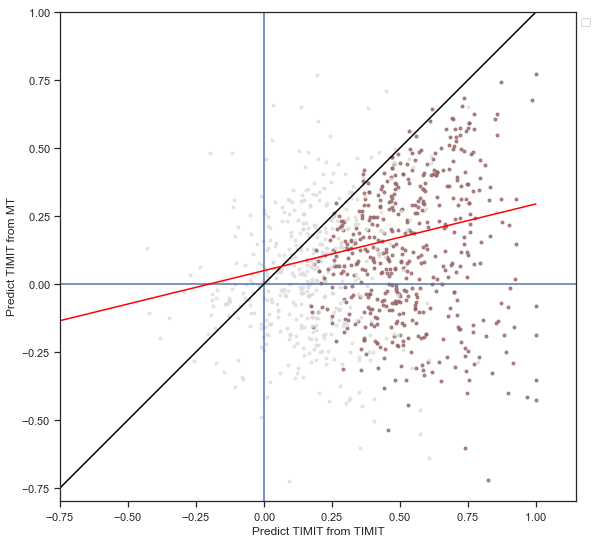

In [6]:


#audio only:
corrs_audio, aud_sig, aud_corrs_train_less, aud_corrs_test_less = cross_prediction_ConvexHull('TIMIT', subject_list, 'TIMIT', 'MT', 'pitchenvsphnfeat', 'pitchenvsphnfeat',  data_dir,save_dir,
                               save_fig=False)


(15, 2, 64)
(15, 2, 64)
[414 129 150 940 824 828 561 569 918 626 794 692 414]


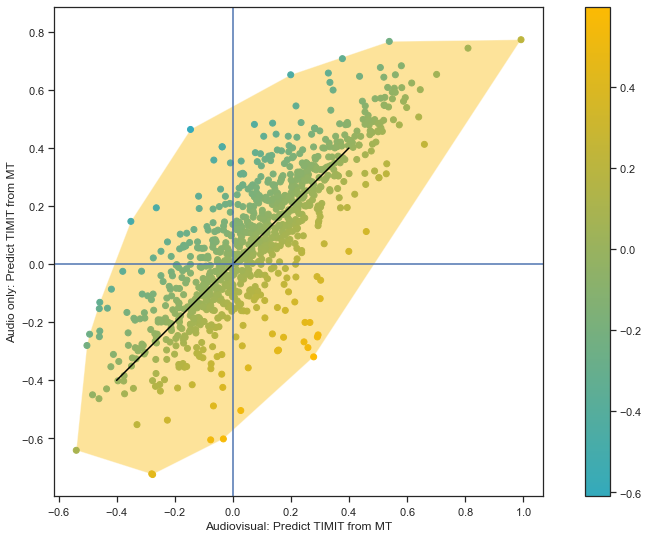

In [7]:
import matplotlib
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
plot_color = '#fcba03'
opacity = 0.4
test_feature = 'audiovisual'
cm=matplotlib.colors.LinearSegmentedColormap.from_list('custom_map', ['#33AABC','#fcba03'], N=256) #create colormap for gradient

fig = plt.figure(figsize=(15,9))
ax = fig.subplots()
points_av = np.hstack(corrs_av).T
points_aud = np.hstack(corrs_audio).T
print(np.shape(corrs_av))
print(np.shape(corrs_audio))
#plt.plot(points_av[:,1], points_aud[:,1], 'b.', alpha=0.5)

    
plt.plot([-0.4, 0.4], [-0.4, 0.4], 'black', label='unity') 

hull1=ConvexHull(np.vstack((points_av[:,1] , points_aud[:,1])).T)
hullv1 = hull1.vertices.copy()
hullv1 = np.append(hullv1, hullv1[0])
print(hullv1)




plt.fill(points_av[hullv1,1], points_aud[hullv1,1], facecolor=plot_color, alpha=opacity, zorder=0, label=test_feature) 
plt.scatter(points_av[:,1], points_aud[:,1], c=points_av[:,1]-points_aud[:,1], cmap=cm)


#plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.xlabel('Audiovisual: Predict TIMIT from MT' )
plt.ylabel('Audio only: Predict TIMIT from MT' )
plt.axis('square')
plt.axvline()
plt.axhline()
plt.colorbar() #difference between av-audio  
# plt.savefig('%s/audiovisual_corrs_v_audioOnly.pdf' %(save_dir))

#pairwise between x-y coordinates 